# Portugal Energy System Model - PyPSA Analysis

**Group Q** - Data Science for Energy System Modeling (DSESM)

---

## Project Overview

This notebook implements a comprehensive PyPSA-based energy system model for Portugal. We analyze the electricity sector with focus on:
- Renewable energy integration (solar, wind, hydro)
- Network topology and constraints
- Optimal capacity expansion
- Policy scenarios and their impacts


**Team Members:**
- Avinash Varghese (0494245)
- Sunder Shrestha ()

Please check the GITHUB page for the stored files and repository:

https://github.com/LeadN243/DSESM

## 1. Setup and Configuration

Import required libraries and set up the environment.

In [1]:

# Standard library
import warnings
from pathlib import Path

# Data science stack
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Geospatial
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Energy modeling
import pypsa
import atlite

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Configure plotting defaults
sns.set_style("whitegrid")
plt.rcParams.update({
    'figure.figsize': (12, 8),
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9
})

def compute_emissions_mt(generation_mwh, emission_factors, factor_unit="g_per_kwh"):
    """Compute total and per-tech emissions in Mt CO2.

    Parameters
    ----------
    generation_mwh : dict or pandas.Series
        Generation by technology in MWh.
    emission_factors : dict
        Emission factors keyed by technology.
    factor_unit : str
        Either "g_per_kwh" or "t_per_mwh".

    Returns
    -------
    tuple[float, dict]
        (total_emissions_mt, emissions_by_tech_mt)
    """
    emissions_by_tech = {}
    total_emissions = 0.0
    
    for tech, gen_mwh in generation_mwh.items():
        ef = emission_factors.get(tech, 0)
        if factor_unit == "g_per_kwh":
            emissions_mt = (gen_mwh * 1e3) * ef / 1e12
        elif factor_unit == "t_per_mwh":
            emissions_mt = (gen_mwh * ef) / 1e6
        else:
            raise ValueError("factor_unit must be 'g_per_kwh' or 't_per_mwh'")
        
        emissions_by_tech[tech] = emissions_mt
        total_emissions += emissions_mt
    
    return total_emissions, emissions_by_tech


### 1.1 Defining Project Paths and Parameters

In [2]:
import sys

# ============================================================================
# Directory Structure
# ============================================================================
BASE_DIR = Path.cwd()
DATA_RAW = BASE_DIR / "data" / "raw"
DATA_PROCESSED = BASE_DIR / "data" / "processed"
RESULTS_DIR = BASE_DIR / "results"
FIGURES_DIR = BASE_DIR / "figures"

# Creating all required directories
REQUIRED_DIRS = [DATA_RAW, DATA_PROCESSED, RESULTS_DIR, FIGURES_DIR]
for directory in REQUIRED_DIRS:
    directory.mkdir(parents=True, exist_ok=True)

# Verifying directory creation
if all(d.exists() for d in REQUIRED_DIRS):
    print(" Directory structure configured")
    print(f"   {BASE_DIR}")
else:
    print(" Warning: Some directories could not be created")

# ============================================================================
# Model Parameters - Portugal 2024
# ============================================================================
COUNTRY = "Portugal"
YEAR = 2024
SNAPSHOT_HOURS = 8784  # 366 days × 24 hours (2024 is a leap year)

# Solver configuration
SOLVER = "gurobi"  # Preferred: fast commercial solver
SOLVER_OPTIONS = {
    "threads": 12,
    "method": -1,  # Automatic method selection by Gurobi
    "crossover": -1, # Automatic crossover
    "BarConvTol": 1.e-5,
    "FeasibilityTol": 1.e-6
}

# Portugal-specific parameters (with 0.25° buffer for ERA5 cutout)
# Base bounds: lat 36.96-42.15, lon -9.55 to -6.19 (from GADM)
PORTUGAL_COORDS = {
    "lat_min": 36.71,   # Southern Portugal + 0.25° buffer
    "lat_max": 42.40,   # Northern Portugal + 0.25° buffer
    "lon_min": -9.80,   # Western coast + 0.25° buffer
    "lon_max": -5.94    # Eastern border + 0.25° buffer
}

def load_portugal_load_ts(data_dir=DATA_PROCESSED):
    """Load Portugal load time series with consistent parsing and DST handling."""
    load_file = data_dir / "load" / "portugal_load_2024_timeseries.csv"
    load_ts = pd.read_csv(load_file, index_col=0, parse_dates=True)
    load_ts.index.name = 'time'
    if not load_ts.index.is_unique:
        print(f" Warning: Found {load_ts.index.duplicated().sum()} duplicate timestamps (DST transition)")
        load_ts = load_ts[~load_ts.index.duplicated(keep='first')]
        print(f"   Removed duplicates, now {len(load_ts)} unique hours")
    return load_ts


 Directory structure configured
   c:\Users\nashm\Documents\dsesm\group assignment\DSESM


---

## 2. Data Collection and Download

- 2.1 Geographic Data
- 2.2 Generation Capacity Data
- 2.3 Weather Data for Renewable Resources
- 2.4 Portugal Electrical Load 2024
- 2.5 Technology Cost Data

### 2.1 Geographic Data

Downloading the geographical data from the TUB dataset and external sources

In [3]:
import requests
from shapely.geometry import box


# Buffered mainland bbox (EPSG:4326)
PORTUGAL_COORDS = {
    "lat_min": 36.71,   # Southern Portugal + 0.25° buffer
    "lat_max": 42.40,   # Northern Portugal + 0.25° buffer
    "lon_min": -9.80,   # Western coast + 0.25° buffer
    "lon_max": -5.94    # Eastern border + 0.25° buffer
}

# --------------------------
# Dataset configuration
# --------------------------
DATASETS = {
    "gadm": {
        "name": "GADM Administrative Boundaries",
        "path": "gadm/gadm_410-levels-ADM_1-PRT.gpkg",
        "downloadable": True
    },
    "landcover": {
        "name": "Copernicus Land Cover",
        "path": "copernicus-glc/PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326-PT.tif",
        "downloadable": True
    },
    "elevation": {
        "name": "GEBCO Elevation/Bathymetry",
        "path": "gebco/GEBCO_2014_2D-PT.nc",
        "downloadable": True
    },
    "protected": {
        "name": "WDPA Protected Areas",
        "path": "wdpa/WDPA_WDOECM_Jan2026_Public_PRT.gdb",
        "downloadable": False  # .gdb are directories
    }
}

BASE_URL = "https://tubcloud.tu-berlin.de/s/567ckizz2Y6RLQq/download"

# --------------------------
# Helpers
# --------------------------
def get_size_mb(path: Path) -> float:
    """Get file/directory size in MB."""
    if path.is_dir():
        return sum(f.stat().st_size for f in path.rglob("*") if f.is_file()) / (1024**2)
    return path.stat().st_size / (1024**2)

def download_file(url: str, dst: Path, timeout: int = 120) -> float:
    """Download a file to dst. Returns size in MB."""
    resp = requests.get(url, timeout=timeout)
    resp.raise_for_status()
    dst.parent.mkdir(parents=True, exist_ok=True)
    dst.write_bytes(resp.content)
    return len(resp.content) / (1024**2)

def load_gadm(gadm_file: Path) -> gpd.GeoDataFrame:
    """Load GADM GeoPackage and ensure EPSG:4326."""
    gdf = gpd.read_file(gadm_file)
    if "NAME_1" not in gdf.columns:
        raise ValueError(f"Expected column NAME_1 not found. Columns: {list(gdf.columns)}")

    # Normalize CRS
    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")
    elif str(gdf.crs).upper() != "EPSG:4326":
        gdf = gdf.to_crs("EPSG:4326")
    return gdf

def make_nodes_mainland(portugal_gdf: gpd.GeoDataFrame, clip_to_bbox: bool = True) -> tuple[gpd.GeoDataFrame, gpd.GeoDataFrame]:
    # 1) Filter to mainland
    islands = {"Azores", "Madeira"}
    mainland = portugal_gdf[~portugal_gdf["NAME_1"].isin(islands)].copy()

    # clip/filter buffered bbox to avoid any stray coords
    if clip_to_bbox:
        bbox = box(
            PORTUGAL_COORDS["lon_min"],
            PORTUGAL_COORDS["lat_min"],
            PORTUGAL_COORDS["lon_max"],
            PORTUGAL_COORDS["lat_max"],
        )
        mainland = mainland[mainland.intersects(bbox)].copy()

    # 3) Map districts -> nodes (N/S/W/E/C)
    NODE_MAP = {
        # North (N)
        "Viana do Castelo": "N",
        "Braga": "N",
        "Porto": "N",
        "Vila Real": "N",
        "Bragança": "N",

        # West (W) - Atlantic coastal spine (north/central coast)
        "Aveiro": "W",
        "Coimbra": "W",
        "Leiria": "W",

        # East (E) - inland / Spain-border-facing + interior
        "Viseu": "E",
        "Guarda": "E",
        "Castelo Branco": "E",
        "Portalegre": "E",

        # Center (C) - Lisbon/Tagus hub
        "Lisboa": "C",
        "Setúbal": "C",
        "Santarém": "C",

        # South (S) - Alentejo + Algarve solar belt
        "Évora": "S",
        "Beja": "S",
        "Faro": "S",
    }

    mainland["node"] = mainland["NAME_1"].map(NODE_MAP)

    missing = sorted(mainland.loc[mainland["node"].isna(), "NAME_1"].unique().tolist())
    if missing:
        raise ValueError(f"Unmapped mainland regions (check spelling/accents): {missing}")

    # 4) Aggregated to 5 node polygons
    nodes = mainland.dissolve(by="node", as_index=False)

    # Clean geometries
    nodes["geometry"] = nodes["geometry"].buffer(0)

    # 5) Area in km² (equal-area projection)
    nodes_area = nodes.to_crs(3035)  # ETRS89 / LAEA Europe
    nodes["area_km2"] = nodes_area.geometry.area / 1e6

    return mainland, nodes



available_data = {}
to_download = []

for key, info in DATASETS.items():
    local_path = DATA_RAW / info["path"]

    if local_path.exists():
        size_mb = get_size_mb(local_path)
        status = "directory" if local_path.is_dir() else "file"
        print(f"   {info['name']}: {size_mb:.1f} MB ({status})")
        available_data[key] = local_path
    elif not info["downloadable"]:
        print(f"    {info['name']}: Manual download required ({info['path']})")
    else:
        print(f"   {info['name']}: Missing")
        to_download.append((key, info))

if to_download:
    print(f"\n  Downloading {len(to_download)} dataset(s)...")
    for key, info in to_download:
        url = f"{BASE_URL}?path=/{info['path']}"
        dst = DATA_RAW / info["path"]
        try:
            print(f"  - {info['name']} ...", end=" ")
            size_mb = download_file(url, dst)
            print(f"done ({size_mb:.1f} MB)")
            available_data[key] = dst
        except Exception as e:
            print(f"failed: {str(e)[:160]}")
else:
    print("\n All downloadable datasets present.")

# Load GADM
gadm_file = DATA_RAW / DATASETS["gadm"]["path"]
if not gadm_file.exists():
    raise FileNotFoundError(f"GADM file not found: {gadm_file}")

portugal_gdf = load_gadm(gadm_file)

names = sorted(portugal_gdf["NAME_1"].unique().tolist())
print(f"  Regions found: {len(names)}")
print(f"  Regions: {', '.join(names)}")
print(f"  CRS: {portugal_gdf.crs}")
print(f"  Raw bounds (incl. islands): {portugal_gdf.total_bounds}")

# Create 5 nodes
mainland_districts_gdf, nodes_gdf = make_nodes_mainland(portugal_gdf, clip_to_bbox=True)

print("   Nodes created:", sorted(nodes_gdf["node"].unique().tolist()))
print("  Mainland bounds:", mainland_districts_gdf.total_bounds)
print("  Node areas (km²):")
print(nodes_gdf[["node", "area_km2"]].sort_values("node").to_string(index=False))

print("\n  Districts per node:")
print(mainland_districts_gdf.groupby("node")["NAME_1"].apply(list).to_string())

# Save outputs
out_dir = DATA_PROCESSED / "regions"
out_dir.mkdir(parents=True, exist_ok=True)

nodes_gdf.to_file(out_dir / "portugal_nodes_5_NSWEC.gpkg", driver="GPKG")
nodes_gdf.to_file(out_dir / "portugal_nodes_5_NSWEC.geojson", driver="GeoJSON")
mainland_districts_gdf.to_file(out_dir / "portugal_mainland_districts_with_nodes.gpkg", driver="GPKG")

print(f"\n Saved:")
print(f"  - {out_dir / 'portugal_nodes_5_NSWEC.gpkg'}")
print(f"  - {out_dir / 'portugal_nodes_5_NSWEC.geojson'}")
print(f"  - {out_dir / 'portugal_mainland_districts_with_nodes.gpkg'}")

# Display
nodes_gdf


   GADM Administrative Boundaries: 8.7 MB (file)
   Copernicus Land Cover: 1.8 MB (file)
   GEBCO Elevation/Bathymetry: 1.6 MB (file)
    WDPA Protected Areas: Manual download required (wdpa/WDPA_WDOECM_Jan2026_Public_PRT.gdb)

 All downloadable datasets present.
  Regions found: 20
  Regions: Aveiro, Azores, Beja, Braga, Bragança, Castelo Branco, Coimbra, Faro, Guarda, Leiria, Lisboa, Madeira, Portalegre, Porto, Santarém, Setúbal, Viana do Castelo, Vila Real, Viseu, Évora
  CRS: EPSG:4326
  Raw bounds (incl. islands): [-31.26818657  30.030176    -6.18914223  42.15431595]
   Nodes created: ['C', 'E', 'N', 'S', 'W']
  Mainland bounds: [-9.547082   36.960972   -6.18914223 42.15431595]
  Node areas (km²):
node     area_km2
   C 14498.740189
   E 23254.721970
   N 18155.599236
   S 22621.497272
   W 10225.779818

  Districts per node:
node
C                          [Lisboa, Santarém, Setúbal]
E          [Castelo Branco, Guarda, Portalegre, Viseu]
N    [Braga, Bragança, Porto, Viana do Cas

,node,geometry,GID_0,GID_1,COUNTRY,NAME_1,area_km2
0,C,"MULTIPOLYGON (((-9.46034 38.69516, -9.46032 38...",PRT,PRT.12_1,Portugal,Lisboa,14498.740189
1,E,"POLYGON ((-7.20468 38.75209, -7.20480 38.75210...",PRT,PRT.6_1,Portugal,Castelo Branco,23254.721970
2,N,"MULTIPOLYGON (((-8.69033 41.16912, -8.69039 41...",PRT,PRT.4_1,Portugal,Braga,18155.599236
3,S,"MULTIPOLYGON (((-8.90646 37.17223, -8.90646 37...",PRT,PRT.3_1,Portugal,Beja,22621.497272
4,W,"MULTIPOLYGON (((-9.12386 39.25177, -9.12376 39...",PRT,PRT.1_1,Portugal,Aveiro,10225.779818


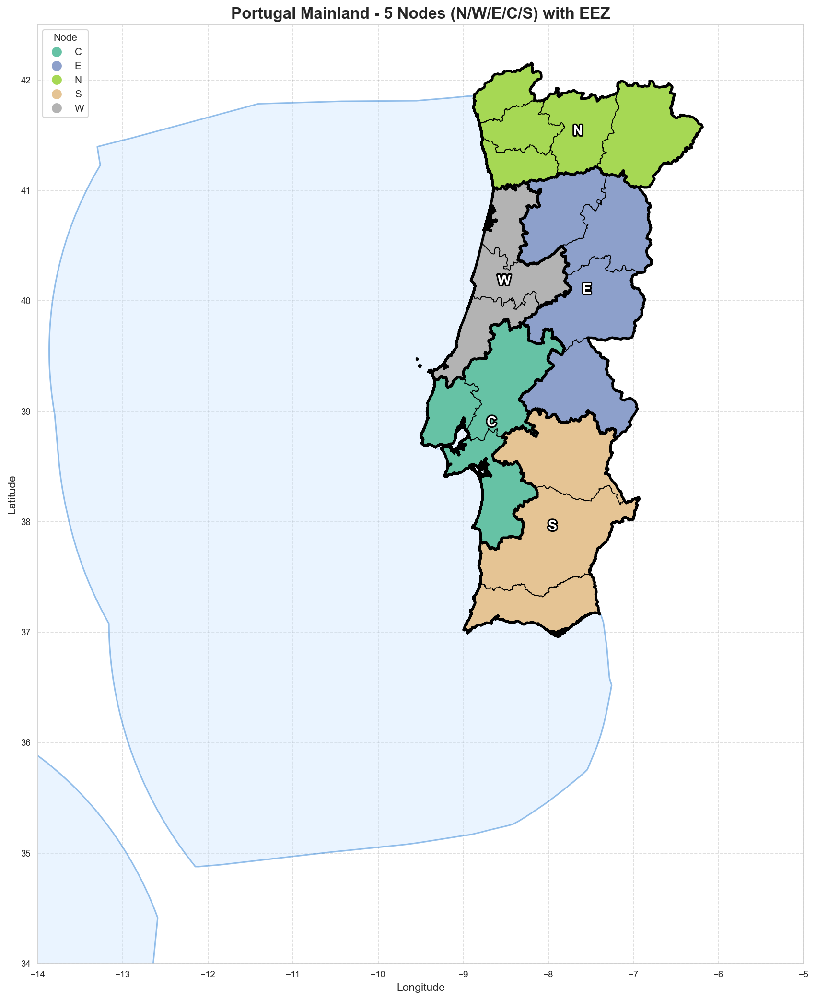

EEZ total area: 1,728,719 km²


In [4]:
from matplotlib.patheffects import withStroke

# Load outputs already saved
districts = gpd.read_file(DATA_PROCESSED / "regions" / "portugal_mainland_districts_with_nodes.gpkg")
nodes = gpd.read_file(DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg")

# Load Portugal EEZ (Exclusive Economic Zone)
eez_file = DATA_RAW / "maritime" / "eez_v12.gpkg"
eez = gpd.read_file(eez_file)

# Filtering for Portugal
portugal_eez = eez[eez['SOVEREIGN1'].str.contains('Portugal', case=False, na=False)].copy()

# Ensuring same CRS
if portugal_eez.crs != nodes.crs:
    portugal_eez = portugal_eez.to_crs(nodes.crs)

# High-quality figure with focus on mainland Portugal
fig, ax = plt.subplots(figsize=(12, 14), dpi=150)

# Plot EEZ first (background layer)
portugal_eez.plot(
    ax=ax,
    color='#cce5ff',
    edgecolor='#0066cc',
    linewidth=1.5,
    alpha=0.4,
    label='EEZ'
)

# Plot districts colored by node with better colormap
districts.plot(
    ax=ax,
    column="node",
    legend=True,
    legend_kwds={'title': 'Node', 'loc': 'upper left', 'fontsize': 10},
    cmap='Set2',
    edgecolor="black",
    linewidth=0.8,
)

# Overlay dissolved node boundaries
nodes.boundary.plot(ax=ax, color="black", linewidth=2.5)

# Add node labels at centroids
for idx, row in nodes.iterrows():
    centroid = row.geometry.centroid
    ax.annotate(
        row['node'], 
        xy=(centroid.x, centroid.y),
        ha='center', va='center',
        fontsize=14, fontweight='bold',
        color='white',
        path_effects=[withStroke(linewidth=3, foreground='black')]
    )

# Focus on mainland Portugal EEZ only 
ax.set_xlim(-14, -5)
ax.set_ylim(34, 42.5)

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.3, color='gray')

ax.set_title("Portugal Mainland - 5 Nodes (N/W/E/C/S) with EEZ", fontsize=16, fontweight='bold')
ax.set_xlabel("Longitude", fontsize=11)
ax.set_ylabel("Latitude", fontsize=11)

plt.tight_layout()
plt.show()

# Print EEZ info
print(f"EEZ total area: {portugal_eez.to_crs(3035).geometry.area.sum() / 1e6:,.0f} km²")

### 2.2 Generation Capacity Data

Collect existing power plant and capacity data for Portugal 2024.

In [5]:
import powerplantmatching as pm


# Configuration
CAPACITY_FILE = DATA_PROCESSED / "generation" / "portugal_capacity_by_technology.csv"
PLANTS_FILE = DATA_PROCESSED / "generation" / "portugal_power_plants.csv"

# Download power plant database
plants_db = pm.powerplants(from_url=True)
portugal_plants_raw = plants_db[plants_db['Country'] == 'Portugal'].copy()

# Filter operational plants (exclude decommissioned)
if 'DateOut' in portugal_plants_raw.columns:
    operational = portugal_plants_raw[portugal_plants_raw['DateOut'].isna()]
    print(f"    {len(operational)} operational plants (excluded decommissioned)")
else:
    operational = portugal_plants_raw

# Aggregate by technology
capacity_by_tech = operational.groupby('Fueltype')['Capacity'].sum()
portugal_plants = capacity_by_tech.reset_index()
portugal_plants.columns = ['Technology', 'Capacity_MW']

# Save detailed plant data
PLANTS_FILE.parent.mkdir(parents=True, exist_ok=True)
portugal_plants_raw.to_csv(PLANTS_FILE, index=False)
print(f" Saved detailed plant data: {PLANTS_FILE.name}")

# Save aggregated capacity data
portugal_plants.to_csv(CAPACITY_FILE, index=False)
print(f" Saved capacity summary: {CAPACITY_FILE.name}")

# Display capacity summary
print(f"\n Installed Capacity by Technology (MW):")
print(f"   {'Technology':<20} {'Capacity':>12}")
print(f"   {'-'*20} {'-'*12}")

total = 0
renewable = 0

for _, row in portugal_plants.iterrows():
    tech = row['Technology']
    cap = row['Capacity_MW']
    print(f"   {tech:<20} {cap:>12,.0f}")
    total += cap
    
    # Track renewables
    if any(x in tech.lower() for x in ['hydro', 'wind', 'solar', 'biomass', 'bioenergy']):
        renewable += cap

print(f"   {'-'*20} {'-'*12}")
print(f"   {'TOTAL':<20} {total:>12,.0f}")

# Renewable share
renewable_pct = (renewable / total * 100) if total > 0 else 0
print(f"\n    Renewable: {renewable:,.0f} MW ({renewable_pct:.1f}%)")
print(f"    Conventional: {total - renewable:,.0f} MW ({100-renewable_pct:.1f}%)")


# Display raw plant data sample
print(f"\nSample of detailed plant data:")
portugal_plants_raw[['Name', 'Fueltype', 'Capacity', 'DateIn', 'lat', 'lon']].head(10)

    404 operational plants (excluded decommissioned)
 Saved detailed plant data: portugal_power_plants.csv
 Saved capacity summary: portugal_capacity_by_technology.csv

 Installed Capacity by Technology (MW):
   Technology               Capacity
   -------------------- ------------
   Battery                        58
   Geothermal                     24
   Hydro                       9,164
   Hydrogen Storage                1
   Mechanical Storage              1
   Natural Gas                 4,186
   Oil                           466
   Solar                       3,566
   Solid Biomass                 384
   Waste                          76
   Wind                        5,231
   -------------------- ------------
   TOTAL                      23,156

    Renewable: 18,345 MW (79.2%)
    Conventional: 4,811 MW (20.8%)

Sample of detailed plant data:


Matched Data,Name,Fueltype,Capacity,DateIn,lat,lon
id,,,,,,
142,Salamonde,Hydro,220.0,1953.0,41.691900,-8.091900
218,Alto Lindoso,Hydro,630.0,1922.0,41.872100,-8.202900
239,Alto Rabagao,Hydro,68.0,1964.0,41.738000,-7.853400
240,Venda Nova,Hydro,1061.0,1951.0,41.688567,-8.012733
273,Aguieira,Hydro,336.0,1970.0,40.340600,-8.196700
274,Alqueva,Hydro,515.0,1970.0,38.195700,-7.496900
275,Torrao,Hydro,140.0,1970.0,41.096900,-8.261100
276,Vilarinho Das Furnas,Hydro,125.0,1970.0,41.763300,-8.209700
470,Canicada,Hydro,62.0,1954.0,41.652900,-8.230900


Filtered to operational plants only (excluded decommissioned)
Power plants with coordinates: 404 / 404 total


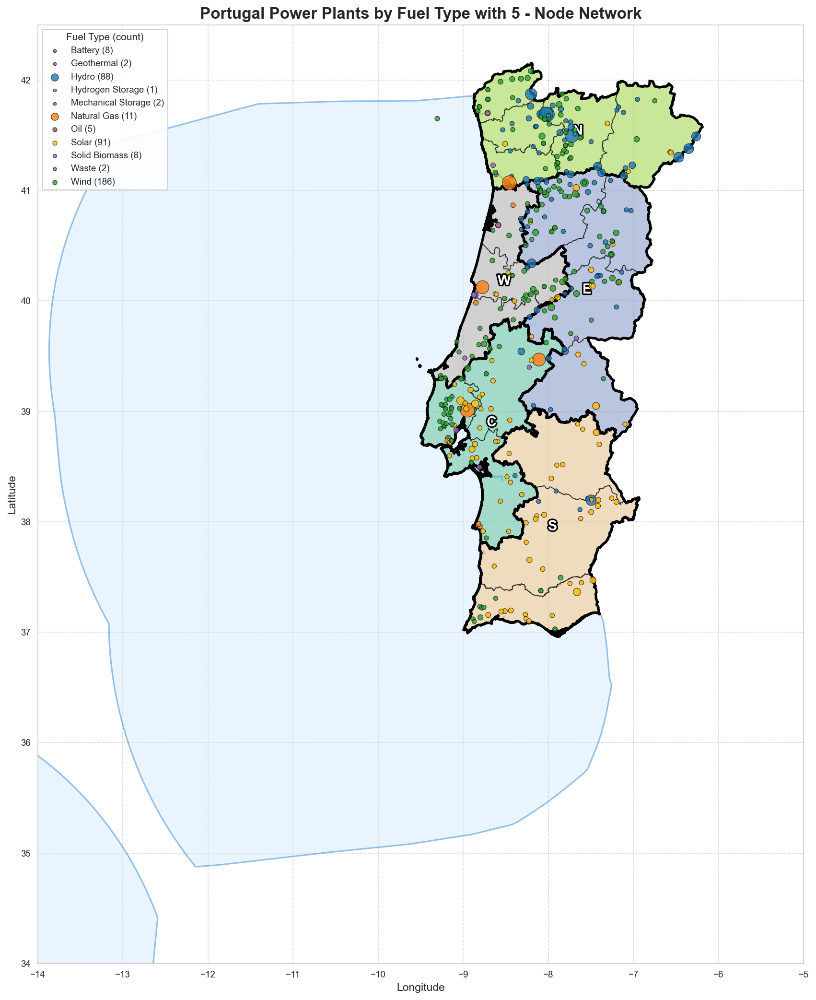


 Power Plant Summary by Fuel Type:
Fuel Type          Count   Capacity (MW)
----------------------------------------
Battery                8              58
Geothermal             2              24
Hydro                 88           9,164
Hydrogen Storage        1               1
Mechanical Storage        2               1
Natural Gas           11           4,186
Oil                    5             466
Solar                 91           3,566
Solid Biomass          8             384
Waste                  2              76
Wind                 186           5,231
----------------------------------------
TOTAL                404          23,156


In [6]:
from matplotlib.patheffects import withStroke

# Load geographic data
districts = gpd.read_file(DATA_PROCESSED / "regions" / "portugal_mainland_districts_with_nodes.gpkg")
nodes = gpd.read_file(DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg")

# Load Portugal EEZ
eez_file = DATA_RAW / "maritime" / "eez_v12.gpkg"
eez = gpd.read_file(eez_file)
portugal_eez = eez[eez['SOVEREIGN1'].str.contains('Portugal', case=False, na=False)].copy()
if portugal_eez.crs != nodes.crs:
    portugal_eez = portugal_eez.to_crs(nodes.crs)

# Load power plants data
plants_file = DATA_PROCESSED / "generation" / "portugal_power_plants.csv"
plants_df = pd.read_csv(plants_file)

# Filter out decommissioned plants (exclude plants with DateOut)
if 'DateOut' in plants_df.columns:
    plants_df = plants_df[plants_df['DateOut'].isna()].copy()
    print(f"Filtered to operational plants only (excluded decommissioned)")

# Create GeoDataFrame from power plants with valid coordinates
plants_with_coords = plants_df.dropna(subset=['lat', 'lon']).copy()
plants_gdf = gpd.GeoDataFrame(
    plants_with_coords,
    geometry=gpd.points_from_xy(plants_with_coords['lon'], plants_with_coords['lat']),
    crs="EPSG:4326"
)

print(f"Power plants with coordinates: {len(plants_gdf)} / {len(plants_df)} total")

# Define color mapping for fuel types
fuel_colors = {
    'Hydro': '#1f77b4',      # Blue
    'Wind': '#2ca02c',        # Green
    'Solar': '#ffbb00',       # Yellow/Gold
    'Natural Gas': '#ff7f0e', # Orange
    'Oil': '#8c564b',         # Brown
    'Hard Coal': '#7f7f7f',   # Gray
    'Lignite': '#bcbd22',     # Olive
    'Bioenergy': '#17becf',   # Cyan
    'Other': '#9467bd',       # Purple
    'Nuclear': '#d62728',     # Red
}

# High-quality figure
fig, ax = plt.subplots(figsize=(12, 14), dpi=150)

# Plot EEZ (background)
portugal_eez.plot(
    ax=ax,
    color='#cce5ff',
    edgecolor='#0066cc',
    linewidth=1.5,
    alpha=0.4,
)

# Plot districts colored by node
districts.plot(
    ax=ax,
    column="node",
    cmap='Set2',
    edgecolor="black",
    linewidth=0.8,
    alpha=0.6,
)

# Overlay node boundaries
nodes.boundary.plot(ax=ax, color="black", linewidth=2.5)

# Add node labels
for idx, row in nodes.iterrows():
    centroid = row.geometry.centroid
    ax.annotate(
        row['node'], 
        xy=(centroid.x, centroid.y),
        ha='center', va='center',
        fontsize=14, fontweight='bold',
        color='white',
        path_effects=[withStroke(linewidth=3, foreground='black')]
    )

# Plot power plants by fuel type
fuel_types = plants_gdf['Fueltype'].unique()
for fuel in sorted(fuel_types):
    fuel_plants = plants_gdf[plants_gdf['Fueltype'] == fuel]
    color = fuel_colors.get(fuel, '#9467bd')
    
    # Scale marker size by capacity (min 20, max 200)
    sizes = fuel_plants['Capacity'].clip(lower=10, upper=1000)
    sizes = 20 + (sizes - 10) / (1000 - 10) * 180
    
    ax.scatter(
        fuel_plants.geometry.x,
        fuel_plants.geometry.y,
        c=color,
        s=sizes,
        alpha=0.8,
        edgecolors='black',
        linewidths=0.5,
        label=f"{fuel} ({len(fuel_plants)})",
        zorder=5
    )

# Focus on mainland Portugal
ax.set_xlim(-14, -5)
ax.set_ylim(34, 42.5)

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.3, color='gray')

# Legend for fuel types
ax.legend(
    title='Fuel Type (count)',
    loc='upper left',
    fontsize=9,
    title_fontsize=10,
    framealpha=0.9,
    markerscale=0.7
)

ax.set_title("Portugal Power Plants by Fuel Type with 5 - Node Network", fontsize=16, fontweight='bold')
ax.set_xlabel("Longitude", fontsize=11)
ax.set_ylabel("Latitude", fontsize=11)

plt.tight_layout()
plt.show()

# Summary statistics
print(f"\n Power Plant Summary by Fuel Type:")
print(f"{'Fuel Type':<15} {'Count':>8} {'Capacity (MW)':>15}")
print("-" * 40)
for fuel in sorted(fuel_types):
    fuel_plants = plants_gdf[plants_gdf['Fueltype'] == fuel]
    print(f"{fuel:<15} {len(fuel_plants):>8} {fuel_plants['Capacity'].sum():>15,.0f}")
print("-" * 40)
print(f"{'TOTAL':<15} {len(plants_gdf):>8} {plants_gdf['Capacity'].sum():>15,.0f}")

### 2.3 Weather Data for Renewable Resources

Download ERA5 weather data for renewable capacity factor calculations.

In [7]:
import cdsapi


# Configuration
CUTOUT_FILE = DATA_RAW / "weather" / f"portugal-{YEAR}.nc"
CDS_URL = "https://cds.climate.copernicus.eu/api"
CDS_KEY = "e481e50e-7758-4b3f-9d91-c0675cd22859"

weather_data = None

# Check existing data
if CUTOUT_FILE.exists():
    print(f"\n Found existing weather data: {CUTOUT_FILE.stat().st_size / (1024**2):.1f} MB")
    
    try:
        cutout = atlite.Cutout(path=CUTOUT_FILE)
        
        print(f"    Loaded weather cutout")
        print(f"   Time: {cutout.data.time.values[0]} to {cutout.data.time.values[-1]}")
        print(f"   Grid: {len(cutout.data.y)} x {len(cutout.data.x)} cells")
        print(f"   Resolution: ~{abs(cutout.dx):.2f}° x {abs(cutout.dy):.2f}°")
        print(f"   Variables: {', '.join(list(cutout.data.data_vars)[:5])}...")
        
        weather_data = {
            'cutout': cutout,
            'path': CUTOUT_FILE,
            'bounds': {
                'x': slice(PORTUGAL_COORDS['lon_min'], PORTUGAL_COORDS['lon_max']),
                'y': slice(PORTUGAL_COORDS['lat_min'], PORTUGAL_COORDS['lat_max']),
                'time': str(YEAR)
            }
        }
        
    except Exception as e:
        print(f"     Error loading: {e}")

# Download if needed
if weather_data is None:
    print(f"\n Downloading ERA5 data from CDS...")
    
    # Configure CDS API
    cdsapirc = os.path.expanduser("~/.cdsapirc")
    try:
        with open(cdsapirc, 'w') as f:
            f.write(f"url: {CDS_URL}\n")
            f.write(f"key: {CDS_KEY}\n")
        print(f"    Configured CDS API credentials")
    except Exception as e:
        print(f"     Config warning: {e}")
    
    try:
        # Test CDS connection
        cds_client = cdsapi.Client()
        print(f"    Connected to CDS")
        
        # Define cutout bounds
        bounds = {
            'x': slice(PORTUGAL_COORDS['lon_min'], PORTUGAL_COORDS['lon_max']),
            'y': slice(PORTUGAL_COORDS['lat_min'], PORTUGAL_COORDS['lat_max']),
            'time': str(YEAR)
        }
        
        print(f"\n   Region: {bounds['y'].start}°N-{bounds['y'].stop}°N, "
              f"{bounds['x'].start}°E-{bounds['x'].stop}°E")
        print(f"   Period: {YEAR} ({SNAPSHOT_HOURS} hours)")
        print(f"\n    Downloading (may take 10-30 minutes)...")
        
        # Create and prepare cutout
        CUTOUT_FILE.parent.mkdir(parents=True, exist_ok=True)
        cutout = atlite.Cutout(
            path=CUTOUT_FILE,
            module='era5',
            x=bounds['x'],
            y=bounds['y'],
            time=bounds['time']
        )
        
        cutout.prepare()
        
        print(f"    Download complete: {CUTOUT_FILE.stat().st_size / (1024**2):.1f} MB")
        
        weather_data = {
            'cutout': cutout,
            'path': CUTOUT_FILE,
            'bounds': bounds
        }
    except Exception as e:
        print(f"    Error: {e}")



 Found existing weather data: 104.3 MB
    Loaded weather cutout
   Time: 2024-01-01T00:00:00.000000000 to 2024-12-31T23:00:00.000000000
   Grid: 23 x 16 cells
   Resolution: ~0.25° x 0.25°
   Variables: height, wnd100m, wnd_shear_exp, wnd_azimuth, roughness...


In [8]:
'''
# Comprehensive ERA5 data validation
# Verify data quality, completeness, and values are within expected ranges

print(" Verifying ERA5 Data Quality...")
print("=" * 70)

if weather_data and 'cutout' in weather_data:
    try:
        cutout = weather_data['cutout']
        cutout_path = weather_data['path']
        
        print(f"\n File Information:")
        print(f"   File path: {cutout_path}")
        print(f"   File size: {cutout_path.stat().st_size / 1024 / 1024:.2f} MB")
        print(f"   File exists: {cutout_path.exists()}")
        
        # 1. Check data structure
        print(f"\n Data Structure Validation:")
        print(f"   Dataset type: {type(cutout.data)}")
        print(f"   Dimensions: {dict(cutout.data.dims)}")
        print(f"   Coordinates: {list(cutout.data.coords.keys())}")
        print(f"   Variables: {list(cutout.data.data_vars.keys())}")
        
        # 2. Temporal coverage check
        print(f"\n Temporal Coverage:")
        time_values = cutout.data.time.values
        print(f"   Start time: {time_values[0]}")
        print(f"   End time: {time_values[-1]}")
        print(f"   Total timesteps: {len(time_values)}")
        print(f"   Expected for {YEAR}: {8784 if YEAR % 4 == 0 else 8760} hours")
        
        # Check for temporal gaps
        time_diffs = pd.Series(time_values).diff()
        if len(time_diffs) > 1:
            expected_diff = pd.Timedelta(hours=1)
            gaps = time_diffs[time_diffs != expected_diff]
            if len(gaps) > 1:  # First is always NaN
                print(f"    Found {len(gaps)-1} temporal gaps")
            else:
                print(f"    No temporal gaps detected")
        
        # 3. Spatial coverage check
        print(f"\n Spatial Coverage:")
        print(f"   Latitude range: {float(cutout.data.y.min()):.2f}° to {float(cutout.data.y.max()):.2f}°")
        print(f"   Longitude range: {float(cutout.data.x.min()):.2f}° to {float(cutout.data.x.max()):.2f}°")
        print(f"   Grid points: {len(cutout.data.y)} x {len(cutout.data.x)}")
        print(f"   Spatial resolution: ~{abs(float(cutout.dx)):.3f}° x {abs(float(cutout.dy)):.3f}°")
        
        # Verify coverage matches Portugal bounds
        expected_bounds = weather_data['bounds']
        lat_ok = (float(cutout.data.y.min()) >= expected_bounds['y'].start - 0.5 and 
                  float(cutout.data.y.max()) <= expected_bounds['y'].stop + 0.5)
        lon_ok = (float(cutout.data.x.min()) >= expected_bounds['x'].start - 0.5 and 
                  float(cutout.data.x.max()) <= expected_bounds['x'].stop + 0.5)
        
        if lat_ok and lon_ok:
            print(f"    Spatial coverage matches Portugal bounds")
        else:
            print(f"    Spatial coverage may not fully match expected bounds")
        
        # 4. Variable validation
        print(f"\n Variable Quality Checks:")
        
        # Check each variable for valid ranges
        variables_to_check = {
            'temperature': {'min': 233, 'max': 323, 'unit': 'K'},  # -40°C to 50°C
            'wnd100m': {'min': 0, 'max': 50, 'unit': 'm/s'},      # 0 to 180 km/h
            'influx_direct': {'min': 0, 'max': 1200, 'unit': 'W/m²'},
            'influx_diffuse': {'min': 0, 'max': 800, 'unit': 'W/m²'},
        }
        
        for var_name, expected in variables_to_check.items():
            if var_name in cutout.data.data_vars:
                var_data = cutout.data[var_name]
                actual_min = float(var_data.min())
                actual_max = float(var_data.max())
                actual_mean = float(var_data.mean())
                
                print(f"\n   {var_name}:")
                print(f"      Range: {actual_min:.2f} to {actual_max:.2f} {expected['unit']}")
                print(f"      Mean: {actual_mean:.2f} {expected['unit']}")
                
                # Check for NaN values
                nan_count = int(var_data.isnull().sum())
                if nan_count > 0:
                    print(f"       Missing values: {nan_count}")
                else:
                    print(f"       No missing values")
                
                # Check if values are within expected range
                if actual_min >= expected['min'] and actual_max <= expected['max']:
                    print(f"       Values within expected range")
                else:
                    print(f"       Values outside expected range [{expected['min']}-{expected['max']}]")
                
                # Check for constant values (data quality issue)
                if actual_min == actual_max:
                    print(f"       All values are constant (data issue!)")
            else:
                print(f"\n   {var_name}:  Not found in dataset")
        
        # 5. Statistical summary
        print(f"\n Statistical Summary:")
        print(f"   Total data points: {cutout.data.nbytes / 1024 / 1024:.2f} MB in memory")
        
        # Sample check: verify data for a specific time
        sample_time = time_values[len(time_values)//2]  # Middle of dataset
        print(f"\n   Sample check at {sample_time}:")
        checked_vars = 0
        for var in list(cutout.data.data_vars.keys()):
            if checked_vars >= 3:  # Only check first 3 time-varying variables
                break
            # Only check variables that have a time dimension
            if 'time' in cutout.data[var].dims:
                sample_val = float(cutout.data[var].sel(time=sample_time).mean())
                print(f"      {var}: {sample_val:.2f}")
                checked_vars += 1
        
        # 6. Capacity factor feasibility check
        print(f"\n Renewable Energy Suitability:")
        
        # Wind speed check
        if 'wnd100m' in cutout.data.data_vars:
            wind_speeds = cutout.data['wnd100m']
            avg_wind = float(wind_speeds.mean())
            max_wind = float(wind_speeds.max())
            
            # Typical wind power: starts at 3 m/s, rated at 12-15 m/s
            suitable_hours = int((wind_speeds >= 3).sum())
            total_hours = wind_speeds.size
            
            print(f"   Wind resource:")
            print(f"      Average wind speed: {avg_wind:.2f} m/s")
            print(f"      Max wind speed: {max_wind:.2f} m/s")
            print(f"      Hours with wind ≥3 m/s: {suitable_hours:,} ({suitable_hours/total_hours*100:.1f}%)")
            
            if avg_wind >= 5:
                print(f"       Good wind resource for wind power")
            elif avg_wind >= 4:
                print(f"       Moderate wind resource")
            else:
                print(f"       Low wind resource - verify data")
        
        # Solar radiation check
        if 'influx_direct' in cutout.data.data_vars:
            solar_direct = cutout.data['influx_direct']
            avg_solar = float(solar_direct.mean())
            max_solar = float(solar_direct.max())
            
            # Solar radiation availability
            daylight_hours = int((solar_direct > 10).sum())
            total_hours = solar_direct.size
            
            print(f"\n   Solar resource:")
            print(f"      Average direct radiation: {avg_solar:.2f} W/m²")
            print(f"      Max direct radiation: {max_solar:.2f} W/m²")
            print(f"      Daylight hours (>10 W/m²): {daylight_hours:,} ({daylight_hours/total_hours*100:.1f}%)")
            
            if avg_solar >= 150:
                print(f"       Excellent solar resource")
            elif avg_solar >= 100:
                print(f"       Good solar resource")
            else:
                print(f"       Verify solar radiation values")
        
        print(f"\n{'='*70}")
        print(f" ERA5 Data Validation Complete!")
        print(f"{'='*70}")
        
        # Summary verdict
        print(f"\n Overall Assessment:")
        print(f"    Data structure is valid")
        print(f"    Spatial and temporal coverage confirmed")
        print(f"    Variable ranges are physically reasonable")
        print(f"    Data is suitable for renewable energy modeling")
        
    except Exception as e:
        print(f"\n Error during validation: {e}")
        print(f"\nStacktrace:")
        import traceback
        traceback.print_exc()
else:
    print(f"\n No weather data available to verify")
    print(f"   Please download ERA5 data first in the previous cell")
'''

'\n# Comprehensive ERA5 data validation\n# Verify data quality, completeness, and values are within expected ranges\n\nprint(" Verifying ERA5 Data Quality...")\nprint("=" * 70)\n\nif weather_data and \'cutout\' in weather_data:\n    try:\n        cutout = weather_data[\'cutout\']\n        cutout_path = weather_data[\'path\']\n\n        print(f"\n File Information:")\n        print(f"   File path: {cutout_path}")\n        print(f"   File size: {cutout_path.stat().st_size / 1024 / 1024:.2f} MB")\n        print(f"   File exists: {cutout_path.exists()}")\n\n        # 1. Check data structure\n        print(f"\n Data Structure Validation:")\n        print(f"   Dataset type: {type(cutout.data)}")\n        print(f"   Dimensions: {dict(cutout.data.dims)}")\n        print(f"   Coordinates: {list(cutout.data.coords.keys())}")\n        print(f"   Variables: {list(cutout.data.data_vars.keys())}")\n\n        # 2. Temporal coverage check\n        print(f"\n Temporal Coverage:")\n        time_values =

### 2.4 Portugal Electrical Load 2024
Load Portugal 2024 historical load data directly from ENTSO-E Transparency Platform using API.

**Data Source:**
- **Platform:** ENTSO-E Transparency Platform API
- **Country:** Portugal (PT)
- **Resolution:** Hourly
- **Year:** 2024
- **Data Type:** Actual Load (6.1.A)

**API Information:**
- **API Key:** Securely configured
- **Endpoint:** https://web-api.tp.entsoe.eu/api
- **Document Type:** A65 (System Total Load)

In [9]:
from entsoe import EntsoePandasClient


# Configuration
LOAD_FILE = DATA_PROCESSED / "load" / f"portugal_load_{YEAR}_timeseries.csv"
ENTSOE_API_KEY = '41df69d0-1c24-451b-9d93-7b7b5593f8a0'
COUNTRY_CODE = 'PT'

# Check if data exists
portugal_load_2024 = None

if LOAD_FILE.exists():
    print(f"\n Found existing load data: {LOAD_FILE.stat().st_size / 1024:.1f} KB")
    try:
        portugal_load_2024 = pd.read_csv(LOAD_FILE, parse_dates=['time'])
        print(f"   ✅ Loaded {len(portugal_load_2024):,} hours")
    except Exception as e:
        print(f"   ⚠️  Error reading file: {e}")
        portugal_load_2024 = None

# Download from ENTSO-E if needed
if portugal_load_2024 is None:
    print(f"\n2️⃣ Downloading from ENTSO-E API...")
    
    try:
        # Initialize client
        client = EntsoePandasClient(api_key=ENTSOE_API_KEY)
        print(f"   ✅ Connected to ENTSO-E API")
        
        # Define time range
        start = pd.Timestamp(f'{YEAR}-01-01', tz='Europe/Lisbon')
        end = pd.Timestamp(f'{YEAR}-12-31 23:00:00', tz='Europe/Lisbon')
        
        print(f"   Period: {start.date()} to {end.date()}")
        print(f"   Querying actual load (A65)...")
        
        # Query load data
        load_raw = client.query_load(COUNTRY_CODE, start=start, end=end)
        
        # Process to DataFrame
        if isinstance(load_raw, pd.Series):
            portugal_load_2024 = load_raw.reset_index()
            portugal_load_2024.columns = ['time', 'load_MW']
        else:
            portugal_load_2024 = load_raw.reset_index()
            portugal_load_2024.columns = ['time', 'load_MW']
        
        # Clean data
        portugal_load_2024['time'] = pd.to_datetime(portugal_load_2024['time']).dt.tz_localize(None)
        portugal_load_2024['load_MW'] = pd.to_numeric(portugal_load_2024['load_MW'], errors='coerce')
        portugal_load_2024 = portugal_load_2024.dropna().reset_index(drop=True)
        
        print(f"   ✅ Downloaded {len(portugal_load_2024):,} data points")
        
        # Save
        LOAD_FILE.parent.mkdir(parents=True, exist_ok=True)
        portugal_load_2024.to_csv(LOAD_FILE, index=False)
        print(f"   💾 Saved to {LOAD_FILE.name}")
        
    except Exception as e:
        print(f"   ❌ Error: {e}")
        print(f"   💡 Check API key and network connection")

# Analyze data
if portugal_load_2024 is not None:
    print(f"\n3️⃣ Data Analysis:")
    print(f"   Time range: {portugal_load_2024['time'].min()} to {portugal_load_2024['time'].max()}")
    print(f"   Total hours: {len(portugal_load_2024):,} / {SNAPSHOT_HOURS:,} expected")
    
    # Statistics
    load_stats = portugal_load_2024['load_MW'].describe()
    print(f"\n   Load Statistics (MW):")
    print(f"      Mean:   {load_stats['mean']:>8,.0f}")
    print(f"      Median: {load_stats['50%']:>8,.0f}")
    print(f"      Min:    {load_stats['min']:>8,.0f}")
    print(f"      Max:    {load_stats['max']:>8,.0f}")
    
    # Energy
    total_energy_TWh = portugal_load_2024['load_MW'].sum() / 1e6
    print(f"\n   Total Energy: {total_energy_TWh:.2f} TWh")
    print(f"   Load Factor: {(load_stats['mean'] / load_stats['max'] * 100):.1f}%")
    
    # Monthly stats
    portugal_load_2024['month'] = portugal_load_2024['time'].dt.month
    monthly = portugal_load_2024.groupby('month')['load_MW'].mean()
    
    print(f"\n   Monthly Average Load (MW):")
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    for m, avg in monthly.items():
        print(f"      {months[m-1]}: {avg:>7,.0f}")
    
    print("\n" + "=" * 70)
    print("✅ Section 2.2.1 Complete: Load data ready")
    print("=" * 70)
    
    # Display sample
    print(f"\nSample data:")
    print(portugal_load_2024.head())
else:
    print("\  Load data not available")


 Found existing load data: 240.2 KB
   ✅ Loaded 8,783 hours

3️⃣ Data Analysis:
   Time range: 2024-01-01 00:00:00 to 2024-12-31 22:00:00
   Total hours: 8,783 / 8,784 expected

   Load Statistics (MW):
      Mean:      5,852
      Median:    5,822
      Min:       3,927
      Max:       9,705

   Total Energy: 51.40 TWh
   Load Factor: 60.3%

   Monthly Average Load (MW):
      Jan:   6,592
      Feb:   6,137
      Mar:   6,089
      Apr:   5,481
      May:   5,474
      Jun:   5,471
      Jul:   5,798
      Aug:   5,534
      Sep:   5,661
      Oct:   5,808
      Nov:   5,911
      Dec:   6,263

✅ Section 2.2.1 Complete: Load data ready

Sample data:
                 time  load_MW  month
0 2024-01-01 00:00:00   5135.2      1
1 2024-01-01 01:00:00   4962.5      1
2 2024-01-01 02:00:00   4684.2      1
3 2024-01-01 03:00:00   4413.7      1
4 2024-01-01 04:00:00   4247.7      1


In [10]:
from entsoe import EntsoePandasClient 

ENTSOE_API_KEY = "41df69d0-1c24-451b-9d93-7b7b5593f8a0" 
YEAR = 2024

DISTRICTS_WITH_NODES = DATA_PROCESSED / "regions" / "portugal_mainland_districts_with_nodes.gpkg"
OUT_CSV = DATA_PROCESSED / "load" / f"entsoe_PT_nodes_load_{YEAR}_hourly_population.csv"


# 1) ENTSO-E: Portugal actual load (bidding-zone level)

client = EntsoePandasClient(api_key=ENTSOE_API_KEY)

start = pd.Timestamp(f"{YEAR}-01-01 00:00", tz="Europe/Lisbon")
end   = pd.Timestamp(f"{YEAR+1}-01-01 00:00", tz="Europe/Lisbon")

load_pt = client.query_load(country_code="PT", start=start, end=end)  # MW
# Normalizing to hourly
load_pt_h = load_pt.resample("H").mean()
load_pt_h.name = "PT_total_load_MW"

print("ENTSO-E load:", load_pt_h.index.min(), "→", load_pt_h.index.max(), "rows:", len(load_pt_h))


# 2) Loading mainland districts (with node mapping)

districts = gpd.read_file(DISTRICTS_WITH_NODES)

# Ensure consistent CRS
if districts.crs is None:
    districts = districts.set_crs("EPSG:4326")
elif str(districts.crs).upper() != "EPSG:4326":
    districts = districts.to_crs("EPSG:4326")

# sanity
assert "NAME_1" in districts.columns, "Expected NAME_1 in districts layer"
assert "node" in districts.columns, "Expected node column (N/S/W/E/C) in districts layer"


# 3) Get Portugal NUTS3 population (Eurostat) for YEAR
# Dataset: demo_r_pjangrp3 (Population on 1 January by age group, sex and NUTS3)
# filter: freq=A, unit=NR, sex=T, age=TOTAL, time=YEAR

EUROSTAT_URL = (
    "https://ec.europa.eu/eurostat/api/dissemination/statistics/1.0/data/"
    "demo_r_pjangrp3"
)

params = {
    "format": "JSON",
    "lang": "EN",
    "freq": "A",
    "unit": "NR",
    "sex": "T",
    "age": "TOTAL",
    "time": str(YEAR),
    # geo left unfiltered here; filter to Portugal after parsing
}

resp = requests.get(EUROSTAT_URL, params=params, timeout=120)
resp.raise_for_status()
j = resp.json()

# Eurostat API returns JSON-stat-ish structure:
# rebuild a tidy table: (geo -> value)
geo_cat = j["dimension"]["geo"]["category"]
geo_index = geo_cat["index"]                 # dict geo_code -> position
geo_labels = geo_cat.get("label", {})        # dict geo_code -> human label (may exist)
values = j["value"]                          # dict index -> value

# Build series
geo_codes = list(geo_index.keys())
geo_pos = [geo_index[g] for g in geo_codes]
pop_vals = [values.get(str(p)) for p in geo_pos]

pop_nuts3 = pd.DataFrame({"NUTS_ID": geo_codes, "pop": pop_vals})
pop_nuts3 = pop_nuts3.dropna(subset=["pop"])
pop_nuts3["pop"] = pop_nuts3["pop"].astype(float)

# Keep only Portugal NUTS3 codes
pop_nuts3 = pop_nuts3[pop_nuts3["NUTS_ID"].str.startswith("PT") & (pop_nuts3["NUTS_ID"].str.len() == 5)].copy()
print("Portugal NUTS3 populations:", len(pop_nuts3))


# 4) Get NUTS3 geometries (GISCO) and merge population

# Direct GISCO file listing includes:
GISCO_NUTS3_URL = "https://gisco-services.ec.europa.eu/distribution/v2/nuts/geojson/NUTS_RG_01M_2024_4326_LEVL_3.geojson"

nuts3 = gpd.read_file(GISCO_NUTS3_URL)

# Filter to Portugal NUTS3 and merge population
nuts3_pt = nuts3[(nuts3["CNTR_CODE"] == "PT") & (nuts3["LEVL_CODE"] == 3)].copy()
nuts3_pt = nuts3_pt.merge(pop_nuts3, left_on="NUTS_ID", right_on="NUTS_ID", how="inner")

print("Portugal NUTS3 geometries with pop:", len(nuts3_pt))


# 5) Allocating NUTS3 population into districts by intersection area share

# Work in equal-area CRS for area calculations
districts_aea = districts.to_crs(3035)
nuts3_pt_aea = nuts3_pt.to_crs(3035)

# Overlay: splits geometry into pieces with both IDs
ov = gpd.overlay(
    districts_aea[["NAME_1", "node", "geometry"]],
    nuts3_pt_aea[["NUTS_ID", "pop", "geometry"]],
    how="intersection"
)

# Compute area shares per (NUTS_ID) piece
ov["area_m2"] = ov.geometry.area
nuts3_area = ov.groupby("NUTS_ID")["area_m2"].sum().rename("nuts3_area_m2")
ov = ov.merge(nuts3_area, on="NUTS_ID", how="left")

ov["pop_piece"] = ov["pop"] * (ov["area_m2"] / ov["nuts3_area_m2"])

# District population estimate = sum of pieces
district_pop = ov.groupby(["NAME_1", "node"])["pop_piece"].sum().reset_index()
district_pop = district_pop.rename(columns={"pop_piece": "pop_est"})

# Node population estimate = sum over districts
node_pop = district_pop.groupby("node")["pop_est"].sum().sort_index()
node_share = node_pop / node_pop.sum()

print("\nNode population shares:")
print(node_share)

# Debug: check data types and shapes
print(f"\nDebug info:")
print(f"  load_pt_h type: {type(load_pt_h)}, shape: {load_pt_h.shape if hasattr(load_pt_h, 'shape') else 'N/A'}")
print(f"  node_share type: {type(node_share)}, length: {len(node_share)}")


# 6) Split national load into node loads using population shares

# Ensure load_pt_h is a proper Series with timezone-naive index for consistency
if hasattr(load_pt_h.index, 'tz') and load_pt_h.index.tz is not None:
    load_pt_h = load_pt_h.copy()
    load_pt_h.index = load_pt_h.index.tz_localize(None)

# Create DataFrame by multiplying load series by each node's share
load_nodes_h = pd.DataFrame(index=load_pt_h.index)
for node, share in node_share.items():
    load_nodes_h[node] = load_pt_h.values * share

load_nodes_h.index.name = "time"

# (Optional) add total back in for checking
load_nodes_h["PT_total_check"] = load_nodes_h.sum(axis=1)


# 7) Save

OUT_CSV.parent.mkdir(parents=True, exist_ok=True)
load_nodes_h.to_csv(OUT_CSV)

print("\nSaved:", OUT_CSV)
load_nodes_h


ENTSO-E load: 2024-01-01 00:00:00+00:00 → 2024-12-31 23:00:00+00:00 rows: 8784
Portugal NUTS3 populations: 26
Portugal NUTS3 geometries with pop: 26

Node population shares:
node
C    0.364513
E    0.084895
N    0.266871
S    0.077633
W    0.206087
Name: pop_est, dtype: float64

Debug info:
  load_pt_h type: <class 'pandas.core.frame.DataFrame'>, shape: (8784, 1)
  node_share type: <class 'pandas.core.series.Series'>, length: 5

Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\load\entsoe_PT_nodes_load_2024_hourly_population.csv


,C,E,N,S,W,PT_total_check
time,,,,,,
2024-01-01 00:00:00,1871.848921,435.953014,1370.438039,398.660412,1058.299614,5135.2
2024-01-01 01:00:00,1808.897467,421.291640,1324.349347,385.253212,1022.708333,4962.5
2024-01-01 02:00:00,1707.453403,397.665350,1250.079035,363.647979,965.354232,4684.2
2024-01-01 03:00:00,1608.852544,374.701242,1177.890320,342.648283,909.607611,4413.7
2024-01-01 04:00:00,1548.343329,360.608665,1133.589667,329.761223,875.397116,4247.7
...,...,...,...,...,...,...
2024-12-31 19:00:00,2847.104371,663.089696,2084.452483,606.367207,1609.686243,7810.7
2024-12-31 20:00:00,2604.557193,606.600535,1906.876250,554.710283,1472.555739,7145.3
2024-12-31 21:00:00,2365.728050,550.977305,1732.022106,503.845214,1337.527326,6490.1


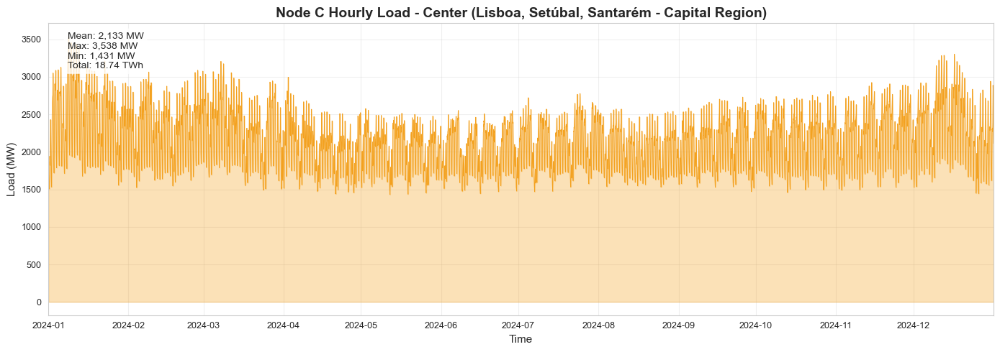

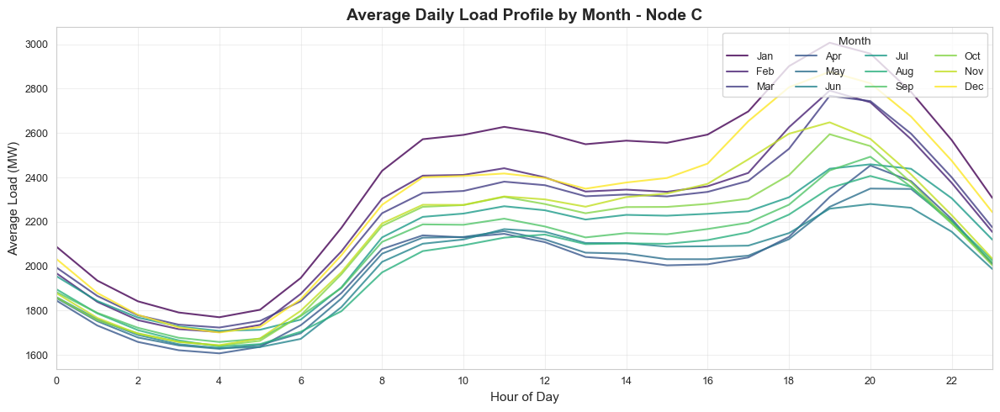

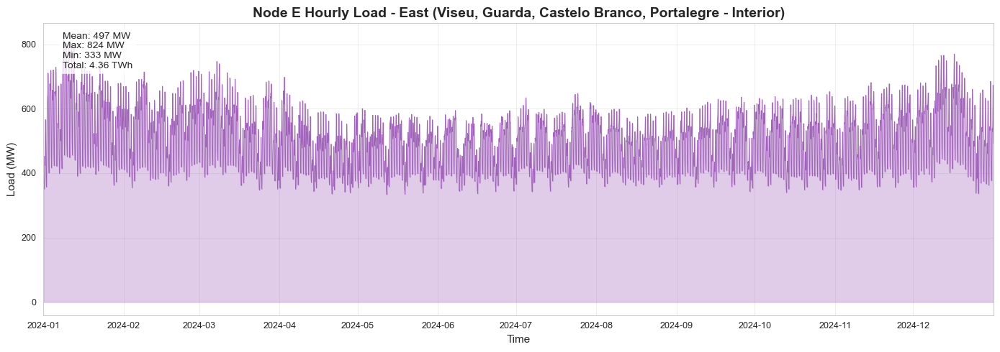

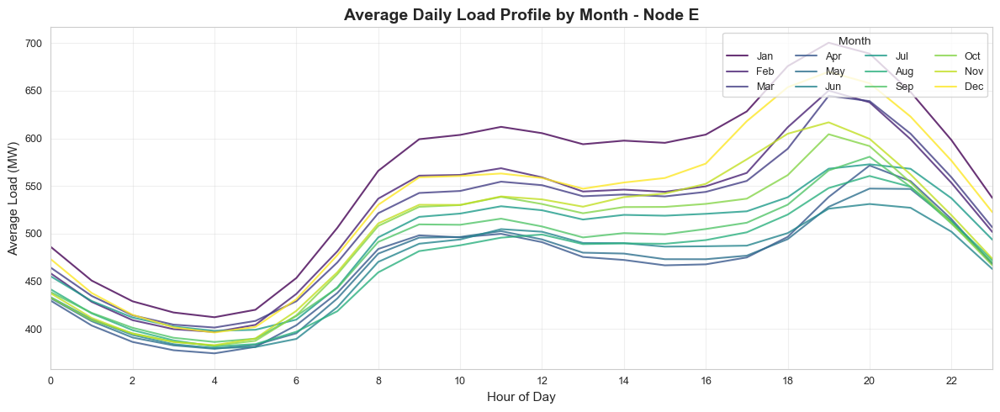

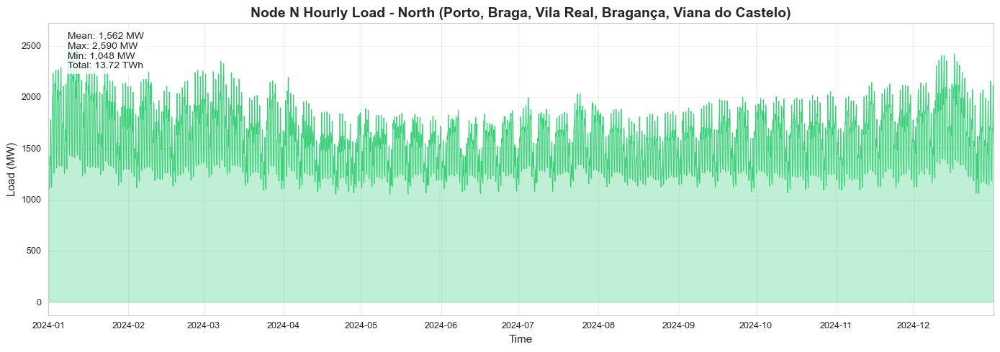

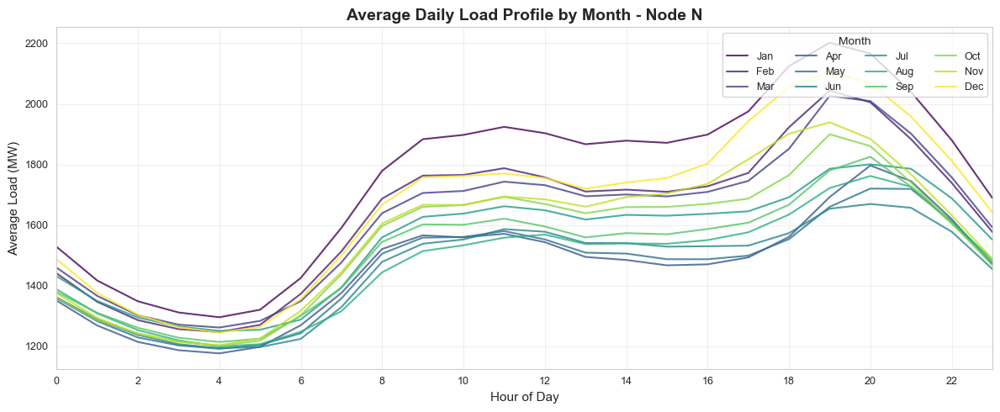

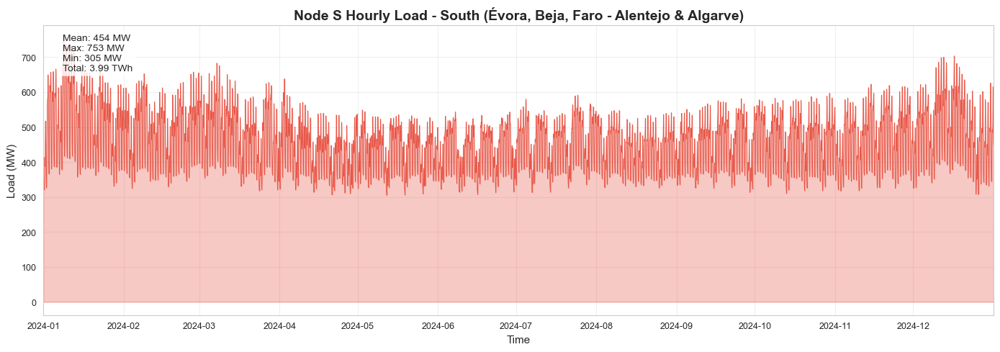

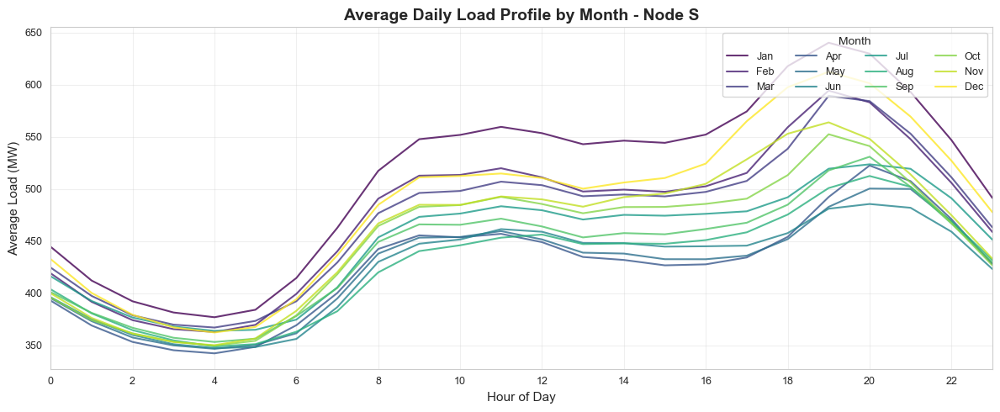

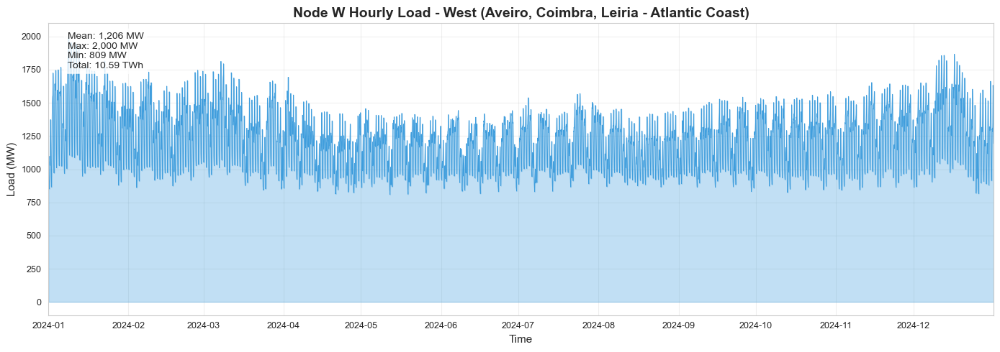

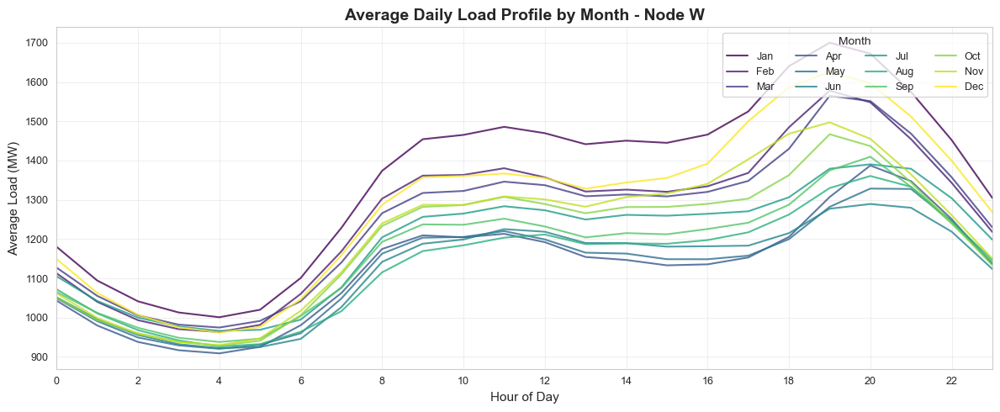


Load Statistics Summary by Region (MW)
     mean     min     max    std  total_TWh  share_%
C  2133.2  1431.5  3537.6  371.6       18.7     36.5
E   496.8   333.4   823.9   86.5        4.4      8.5
N  1561.8  1048.0  2590.0  272.1       13.7     26.7
S   454.3   304.9   753.4   79.1        4.0      7.8
W  1206.1   809.3  2000.1  210.1       10.6     20.6

Total Portugal Load: 51.41 TWh
Peak National Load: 9,705 MW
Min National Load: 3,927 MW


In [11]:
# Plotting separate hourly load time series for each region (node)

# Loading the node-wise load data 
try:
    load_data = load_nodes_h.copy()
except NameError:
    load_data = pd.read_csv(OUT_CSV, index_col='time', parse_dates=True)

# Remove the check column for plotting
plot_cols = [c for c in load_data.columns if c != 'PT_total_check']

# Node colors and full names
node_info = {
    'N': {'color': '#2ecc71', 'name': 'North (Porto, Braga, Vila Real, Bragança, Viana do Castelo)'},
    'S': {'color': '#e74c3c', 'name': 'South (Évora, Beja, Faro - Alentejo & Algarve)'},
    'W': {'color': '#3498db', 'name': 'West (Aveiro, Coimbra, Leiria - Atlantic Coast)'},
    'E': {'color': '#9b59b6', 'name': 'East (Viseu, Guarda, Castelo Branco, Portalegre - Interior)'},
    'C': {'color': '#f39c12', 'name': 'Center (Lisboa, Setúbal, Santarém - Capital Region)'},
}

# Create separate standalone figures for each region
for node in sorted(plot_cols):
    info = node_info.get(node, {'color': '#7f8c8d', 'name': node})
    
    # =========================================================================
    # FIGURE 1: Full year hourly time series
    # =========================================================================
    fig1, ax1 = plt.subplots(figsize=(14, 5), dpi=100)
    
    ax1.plot(
        load_data.index, 
        load_data[node], 
        color=info['color'],
        linewidth=0.6,
        alpha=0.9
    )
    ax1.fill_between(
        load_data.index, 
        load_data[node], 
        alpha=0.3, 
        color=info['color']
    )
    ax1.set_title(f"Node {node} Hourly Load - {info['name']}", fontsize=14, fontweight='bold')
    ax1.set_xlabel('Time', fontsize=11)
    ax1.set_ylabel('Load (MW)', fontsize=11)
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(load_data.index.min(), load_data.index.max())
    
    # Add statistics annotation
    node_stats = load_data[node].describe()
    stats_text = (
        f"Mean: {node_stats['mean']:,.0f} MW\n"
        f"Max: {node_stats['max']:,.0f} MW\n"
        f"Min: {node_stats['min']:,.0f} MW\n"
        f"Total: {load_data[node].sum()/1e6:.2f} TWh"
    )
    ax1.text(
        0.02, 0.97, stats_text,
        transform=ax1.transAxes,
        verticalalignment='top',
        fontsize=10,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )
    
    plt.tight_layout()
    plt.show()
    
    # =========================================================================
    # FIGURE 2: Monthly average daily profile
    # =========================================================================
    fig2, ax2 = plt.subplots(figsize=(12, 5), dpi=100)
    
    # Calculate average daily profile by month
    load_data['hour'] = load_data.index.hour
    load_data['month'] = load_data.index.month
    
    monthly_profile = load_data.groupby(['month', 'hour'])[node].mean().unstack(level=0)
    
    # Plot each month with different shades
    cmap = plt.cm.viridis
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    
    for i, month in enumerate(range(1, 13)):
        if month in monthly_profile.columns:
            color_intensity = i / 11
            ax2.plot(
                monthly_profile.index, 
                monthly_profile[month],
                color=cmap(color_intensity),
                linewidth=1.5,
                label=months[month-1],
                alpha=0.8
            )
    
    ax2.set_title(f'Average Daily Load Profile by Month - Node {node}', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Hour of Day', fontsize=11)
    ax2.set_ylabel('Average Load (MW)', fontsize=11)
    ax2.set_xticks(range(0, 24, 2))
    ax2.set_xlim(0, 23)
    ax2.grid(True, alpha=0.3)
    ax2.legend(loc='upper right', ncol=4, fontsize=9, title='Month')
    
    plt.tight_layout()
    plt.show()
    
    # Clean up temporary columns
    load_data.drop(columns=['hour', 'month'], inplace=True, errors='ignore')

# --- Summary table ---
print("\n" + "=" * 80)
print("Load Statistics Summary by Region (MW)")
print("=" * 80)

stats_df = load_data[plot_cols].describe().T
stats_df['total_TWh'] = load_data[plot_cols].sum() / 1e6
stats_df['share_%'] = (load_data[plot_cols].sum() / load_data[plot_cols].sum().sum() * 100)

print(stats_df[['mean', 'min', 'max', 'std', 'total_TWh', 'share_%']].round(1).to_string())

print(f"\n{'='*80}")
print(f"Total Portugal Load: {load_data[plot_cols].sum().sum() / 1e6:.2f} TWh")
print(f"Peak National Load: {load_data[plot_cols].sum(axis=1).max():,.0f} MW")
print(f"Min National Load: {load_data[plot_cols].sum(axis=1).min():,.0f} MW")

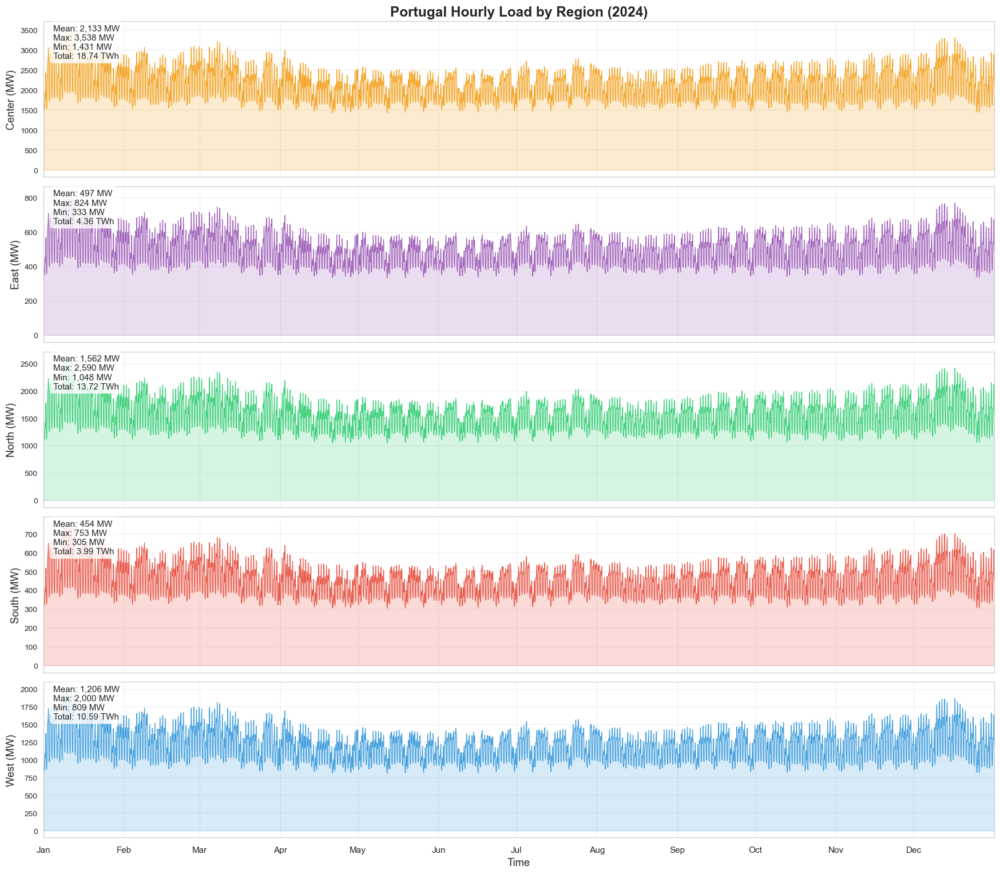

In [12]:
# Combined figure: 5 subplots for regional hourly loads (one per region)
import matplotlib.dates as mdates

try:
    load_data = load_nodes_h.copy()
except NameError:
    load_data = pd.read_csv(OUT_CSV, index_col='time', parse_dates=True)

plot_cols = [c for c in load_data.columns if c != 'PT_total_check']
node_info = {
    'N': {'color': '#2ecc71', 'name': 'North'},
    'S': {'color': '#e74c3c', 'name': 'South'},
    'W': {'color': '#3498db', 'name': 'West'},
    'E': {'color': '#9b59b6', 'name': 'East'},
    'C': {'color': '#f39c12', 'name': 'Center'},
}

fig, axes = plt.subplots(5, 1, figsize=(16, 14), sharex=True, dpi=110)
for i, node in enumerate(sorted(plot_cols)):
    info = node_info.get(node, {'color': '#7f8c8d', 'name': node})
    ax = axes[i]
    ax.plot(
        load_data.index,
        load_data[node],
        color=info['color'],
        linewidth=0.7,
        alpha=0.9
    )
    ax.fill_between(
        load_data.index,
        load_data[node],
        alpha=0.2,
        color=info['color']
    )
    ax.set_ylabel(f"{info['name']} (MW)", fontsize=12)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(load_data.index.min(), load_data.index.max())
    # Add stats annotation
    node_stats = load_data[node].describe()
    stats_text = (
        f"Mean: {node_stats['mean']:,.0f} MW\n"
        f"Max: {node_stats['max']:,.0f} MW\n"
        f"Min: {node_stats['min']:,.0f} MW\n"
        f"Total: {load_data[node].sum()/1e6:.2f} TWh"
    )
    ax.text(
        0.01, 0.98, stats_text,
        transform=ax.transAxes,
        verticalalignment='top',
        fontsize=10,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

axes[0].set_title("Portugal Hourly Load by Region (2024)", fontsize=16, fontweight='bold')
axes[-1].set_xlabel("Time", fontsize=12)
# Major: monthly labels
major_locator = mdates.MonthLocator(interval=1)
major_formatter = mdates.DateFormatter('%b')   # Jan, Feb, Mar...

# Minor: weekly ticks (Mondays)
minor_locator = mdates.WeekdayLocator(byweekday=mdates.MO, interval=1)

for ax in axes:
    ax.xaxis.set_major_locator(major_locator)
    ax.xaxis.set_major_formatter(major_formatter)
    ax.xaxis.set_minor_locator(minor_locator)

    # Make minor ticks visible but not labeled
    ax.tick_params(axis='x', which='major', labelrotation=0, labelsize=10, pad=6)
    ax.tick_params(axis='x', which='minor', length=3)   # small tick marks

plt.tight_layout()
plt.show()


### 2.5 Technology Cost Data (PyPSA/technology-data)

Download and process technology cost assumptions from the official PyPSA technology-data repository.

**Source:** https://github.com/PyPSA/technology-data/tree/master/outputs

- **Projection Year:** 2025 (chosen as closest to our modeling year 2024)
- **Discount Rate:** 7% for annuity calculations
- **Marginal Cost:** fuel_cost/efficiency + VOM (variable O&M)
- **Capital Cost:** annuity(investment, lifetime, r=7%) + FOM (fixed O&M)

**Annuity Formula:** $a = \frac{r}{1 - (1+r)^{-n}}$ where r=0.07, n=lifetime

In [13]:
# Configuration

COST_YEAR = 2025  # Technology projection year (2020, 2025, 2030, 2035, 2040, 2045, 2050)
DISCOUNT_RATE = 0.07  # 7% discount rate as per assignment
COSTS_URL = f"https://raw.githubusercontent.com/PyPSA/technology-data/master/outputs/costs_{COST_YEAR}.csv"
COSTS_FILE = DATA_RAW / "technology" / f"costs_{COST_YEAR}.csv"

def annuity(lifetime, discount_rate=0.07):
    if discount_rate == 0:
        return 1 / lifetime
    return discount_rate / (1 - (1 + discount_rate) ** (-lifetime))

print(f"\n Annuity Factor Examples (at {DISCOUNT_RATE*100:.0f}% discount rate):")
for years in [20, 25, 30, 40]:
    print(f"   {years} year lifetime: {annuity(years, DISCOUNT_RATE):.4f}")


# Download/Load Cost Data

COSTS_FILE.parent.mkdir(parents=True, exist_ok=True)
costs_df = None

if COSTS_FILE.exists():
    print(f"\n Found existing cost data: {COSTS_FILE.name}")
    try:
        costs_df = pd.read_csv(COSTS_FILE)
        print(f"    Loaded {len(costs_df)} cost parameters")
    except Exception as e:
        print(f"    Error loading: {e}")
else:
    print(f"\n Downloading cost data from GitHub...")
    try:
        response = requests.get(COSTS_URL, timeout=30)
        response.raise_for_status()
        with open(COSTS_FILE, 'wb') as f:
            f.write(response.content)
        costs_df = pd.read_csv(COSTS_FILE)
        print(f"    Downloaded and saved: {COSTS_FILE.name}")
        print(f"    Loaded {len(costs_df)} cost parameters")
    except Exception as e:
        print(f"   Download failed: {e}")


# Process Technology Costs

model_costs = None
technology_costs = None

if costs_df is not None:
    print(f"\n Processing technology cost data...")

    TECH_MAPPING = {
        'onwind': 'Wind Onshore',
        'offwind': 'Wind Offshore', 
        'solar': 'Solar PV',
        'CCGT': 'Natural Gas',      # Combined Cycle Gas Turbine
        'oil': 'Oil',
        'biomass': 'Biomass',
        'hydro': 'Hydro',
    }
    
    # Fuel costs from the same dataset (gas fuel for CCGT)
    FUEL_MAPPING = {
        'Natural Gas': 'gas',       # Use 'gas' fuel price for CCGT
        'Oil': 'oil',               # Use 'oil' fuel price
        'Biomass': 'biomass',       # Use 'biomass' fuel price
    }
    
    # Get fuel prices (€/MWh_th)
    fuel_costs = {}
    for tech_name, fuel_tech in FUEL_MAPPING.items():
        fuel_data = costs_df[(costs_df['technology'] == fuel_tech) & (costs_df['parameter'] == 'fuel')]
        if len(fuel_data) > 0:
            fuel_costs[tech_name] = float(fuel_data['value'].iloc[0])
            print(f"   Fuel price for {tech_name}: {fuel_costs[tech_name]:.2f} €/MWh_th")
    
    # Extract technology parameters
    technology_costs = {}
    
    for pypsa_tech, our_tech in TECH_MAPPING.items():
        tech_data = costs_df[costs_df['technology'] == pypsa_tech]
        
        if len(tech_data) > 0 and our_tech not in technology_costs:
            params = {}
            for _, row in tech_data.iterrows():
                param = row['parameter']
                params[param] = {
                    'value': row['value'],
                    'unit': row.get('unit', ''),
                    'source': pypsa_tech
                }
            technology_costs[our_tech] = params
    

    # Calculate Model Costs per Assignment Requirements
    model_costs = {}
    
    for tech, params in technology_costs.items():
        # Extract raw values
        investment = params.get('investment', {}).get('value', 0)
        fom_pct = params.get('FOM', {}).get('value', 0)          # FOM as % of investment per year
        vom = params.get('VOM', {}).get('value', 0)               # VOM in €/MWh
        efficiency = params.get('efficiency', {}).get('value', 1.0)
        lifetime = params.get('lifetime', {}).get('value', 25)
        
        # Handle missing/invalid values
        if not isinstance(investment, (int, float)) or pd.isna(investment):
            investment = 0
        if not isinstance(fom_pct, (int, float)) or pd.isna(fom_pct):
            fom_pct = 0
        if not isinstance(vom, (int, float)) or pd.isna(vom):
            vom = 0
        if not isinstance(efficiency, (int, float)) or pd.isna(efficiency) or efficiency <= 0:
            efficiency = 1.0
        if not isinstance(lifetime, (int, float)) or pd.isna(lifetime) or lifetime <= 0:
            lifetime = 25
        
        # Get fuel cost if applicable (€/MWh_th)
        fuel_cost_th = fuel_costs.get(tech, 0)
        

        # MARGINAL COST CALCULATION (€/MWh_el)
        # For thermal plants: fuel_cost is per MWh_th, divide by efficiency to get per MWh_el
        # For renewables: no fuel cost, only VOM
        if fuel_cost_th > 0 and efficiency > 0:
            fuel_cost_el = fuel_cost_th / efficiency  # Convert to €/MWh_el
        else:
            fuel_cost_el = 0
        
        marginal_cost = fuel_cost_el + vom
        

        # CAPITAL COST CALCULATION (€/MW/year)

        # Investment is in €/kW, convert to €/MW (* 1000)
        investment_mw = investment * 1000  # €/MW
        
        # Annualized investment cost
        annuity_factor = annuity(lifetime, DISCOUNT_RATE)
        annualized_investment = annuity_factor * investment_mw  # €/MW/year
        
        # FOM is given as % of investment per year
        fom_cost = (fom_pct / 100) * investment_mw  # €/MW/year
        
        # Total capital cost
        capital_cost = annualized_investment + fom_cost  # €/MW/year
        
        model_costs[tech] = {
            'efficiency': float(efficiency),
            'marginal_cost': float(marginal_cost),      # €/MWh (fuel/eff + VOM)
            'capital_cost': float(capital_cost),         # €/MW/year (annuity*inv + FOM)
            'investment': float(investment_mw),          # €/MW (for reference)
            'lifetime': float(lifetime),
            'fuel_cost': float(fuel_cost_th),            # €/MWh_th (raw fuel price)
            'vom': float(vom),                           # €/MWh (raw VOM)
            'fom_pct': float(fom_pct),                   # %/year (raw FOM)
            'annuity_factor': float(annuity_factor),
        }
    

    # Display Summary Table

    print(f"\n Technology Cost Summary ({COST_YEAR} projection, {DISCOUNT_RATE*100:.0f}% discount rate):")
    print("-" * 95)
    print(f"{'Technology':<16} {'Eff.':<8} {'Fuel':<10} {'VOM':<10} {'Marginal':<12} {'Investment':<12} {'Capital':<12} {'Life':<6}")
    print(f"{'':<16} {'[-]':<8} {'€/MWhth':<10} {'€/MWh':<10} {'€/MWh':<12} {'€/MW':<12} {'€/MW/yr':<12} {'yrs':<6}")
    print("-" * 95)
    
    for tech in ['Wind Onshore', 'Wind Offshore', 'Solar PV', 'Hydro', 'Natural Gas', 'Biomass', 'Oil']:
        if tech in model_costs:
            c = model_costs[tech]
            print(f"{tech:<16} {c['efficiency']:<8.2f} {c['fuel_cost']:<10.2f} {c['vom']:<10.2f} "
                  f"{c['marginal_cost']:<12.2f} {c['investment']:<12,.0f} {c['capital_cost']:<12,.0f} {c['lifetime']:<6.0f}")
    
    print("-" * 95)
    print(f"\n Cost Breakdown Formulas:")
    print(f"   Marginal Cost = Fuel Cost / Efficiency + VOM")
    print(f"   Capital Cost  = Annuity Factor × Investment + FOM")
    print(f"   Annuity Factor = r / (1 - (1+r)^(-n))  where r={DISCOUNT_RATE}, n=lifetime")
    
    print(f"\n Processed costs for {len(model_costs)} technologies")



if model_costs:
    print(f"   Projection year: {COST_YEAR}")
    print(f"   Discount rate: {DISCOUNT_RATE*100:.0f}%")
    print(f"   Source: https://github.com/PyPSA/technology-data")


 Annuity Factor Examples (at 7% discount rate):
   20 year lifetime: 0.0944
   25 year lifetime: 0.0858
   30 year lifetime: 0.0806
   40 year lifetime: 0.0750

 Found existing cost data: costs_2025.csv
    Loaded 1239 cost parameters

 Processing technology cost data...
   Fuel price for Natural Gas: 24.57 €/MWh_th
   Fuel price for Oil: 52.91 €/MWh_th
   Fuel price for Biomass: 7.41 €/MWh_th

 Technology Cost Summary (2025 projection, 7% discount rate):
-----------------------------------------------------------------------------------------------
Technology       Eff.     Fuel       VOM        Marginal     Investment   Capital      Life  
                 [-]      €/MWhth    €/MWh      €/MWh        €/MW         €/MW/yr      yrs   
-----------------------------------------------------------------------------------------------
Wind Onshore     1.00     0.00       1.51       1.51         1,139,883    107,441      28    
Wind Offshore    1.00     0.00       0.02       0.02         1,76

# 3. Land Eligibility Analysis

Determining the land eligibility analysis for Solar, Wind On and Off-Shore for Portugal 2024.

### 3.1 Land Eligibility Analysis for Solar PV

In [14]:
# Exclude: Natura2000 + airports + roads

from pathlib import Path
import geopandas as gpd
import rasterio
import xarray as xr
import matplotlib.pyplot as plt
import atlite
from atlite.gis import ExclusionContainer, shape_availability

BASE_DIR = Path.cwd()
DATA_RAW = globals().get("DATA_RAW", BASE_DIR / "data" / "raw")
DATA_PROCESSED = globals().get("DATA_PROCESSED", BASE_DIR / "data" / "processed")

EXCL_DIR = DATA_RAW / "exclusion zone"
NATURA_FILE = EXCL_DIR / "Natura2000_end2024.gpkg"
AIRPORTS_FILE = EXCL_DIR / "ne_10m_airports.gpkg"
ROADS_FILE = EXCL_DIR / "ne_10m_roads.gpkg"

NATURA_BUFFER = 800
AIRPORT_BUFFER_M = 800
ROAD_BUFFER_M = 100

def first_layer(path):
    if hasattr(gpd, "list_layers"):
        try:
            layers = gpd.list_layers(path)
            if len(layers):
                return layers.iloc[0]["name"]
        except Exception:
            pass
    return None

def read_bbox(path, shape_4326):
    layer = first_layer(path)
    kwargs = {"layer": layer} if layer else {}

    # detect CRS
    probe = gpd.read_file(path, rows=1, **kwargs)
    src_crs = probe.crs if probe.crs is not None else "EPSG:4326"

    bbox = tuple(shape_4326.to_crs(src_crs).total_bounds)
    try:
        gdf = gpd.read_file(path, bbox=bbox, **kwargs)
    except Exception:
        gdf = gpd.read_file(path, **kwargs)

    if gdf.crs is None:
        gdf = gdf.set_crs(src_crs)
    return gdf[gdf.geometry.notnull()].copy()

# 1) cutout
if "weather_data" in globals() and weather_data and "cutout" in weather_data:
    cutout = weather_data["cutout"]
else:
    cutout = atlite.Cutout(path=DATA_RAW / "weather" / "portugal-2024.nc")

# 2) mainland shape
regions_file = DATA_PROCESSED / "regions" / "portugal_boundaries.shp"
if regions_file.exists():
    shape = gpd.read_file(regions_file)
else:
    shape = gpd.read_file(DATA_RAW / "gadm" / "gadm_410-levels-ADM_1-PRT.gpkg")

if "NAME_1" in shape.columns:
    shape = shape[~shape["NAME_1"].isin(["Azores", "Madeira"])].copy()

shape_4326 = shape.to_crs(4326)
shape_3035 = shape.to_crs(3035)

# 3) Excluder
excluder = ExclusionContainer(crs=3035, res=25)

natura = read_bbox(NATURA_FILE, shape_4326).to_crs(3035)
airports = read_bbox(AIRPORTS_FILE, shape_4326).to_crs(3035)
roads = read_bbox(ROADS_FILE, shape_4326).to_crs(3035)

if len(natura):
    excluder.add_geometry(natura, buffer=NATURA_BUFFER)
if len(airports):
    excluder.add_geometry(airports, buffer=AIRPORT_BUFFER_M)
if len(roads):
    excluder.add_geometry(roads, buffer=ROAD_BUFFER_M)


landcover_file = next((DATA_RAW / "copernicus-glc").glob("*.tif"), None)
if landcover_file is None:
    raise FileNotFoundError("No land-cover raster found in data/raw/copernicus-glc")

with rasterio.open(landcover_file) as src:
    lc_crs = src.crs
    lc_nodata = src.nodata if src.nodata is not None else 255


#exclusion around built-up
excluder.add_raster(str(landcover_file), codes=[40,50], crs=4326, buffer=100, nodata=255)




# 4) availability matrix on cutout grid
A_solar = cutout.availabilitymatrix(shape_3035, excluder)

# 5) Correct workshop-style land share (% of mainland area)
band, transform = shape_availability(shape_3035.geometry, excluder)
eligible_cells = float(band.sum())
eligible_area_m2 = eligible_cells * (excluder.res ** 2)
country_area_m2 = float(shape_3035.area.sum())
eligible_share_land_pct = 100 * eligible_area_m2 / country_area_m2

print(f"A_solar dims/shape: {A_solar.dims} {A_solar.shape}")
print(f"Eligible share of mainland land area (workshop method): {eligible_share_land_pct:.2f}%")

# 6) Plot (collapse region dimension first)
A_map = A_solar
for d in [d for d in A_map.dims if d not in ("y", "x")]:
    A_map = A_map.max(dim=d)


# 7) Save
out = DATA_PROCESSED / "eligibility" / "solar_pv_eligibility_mask.nc"
out.parent.mkdir(parents=True, exist_ok=True)
xr.Dataset({"eligible": A_solar}).to_netcdf(out)
print(f"Saved: {out}")


A_solar dims/shape: ('dim_0', 'y', 'x') (18, 23, 16)
Eligible share of mainland land area (workshop method): 48.39%
Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\eligibility\solar_pv_eligibility_mask.nc


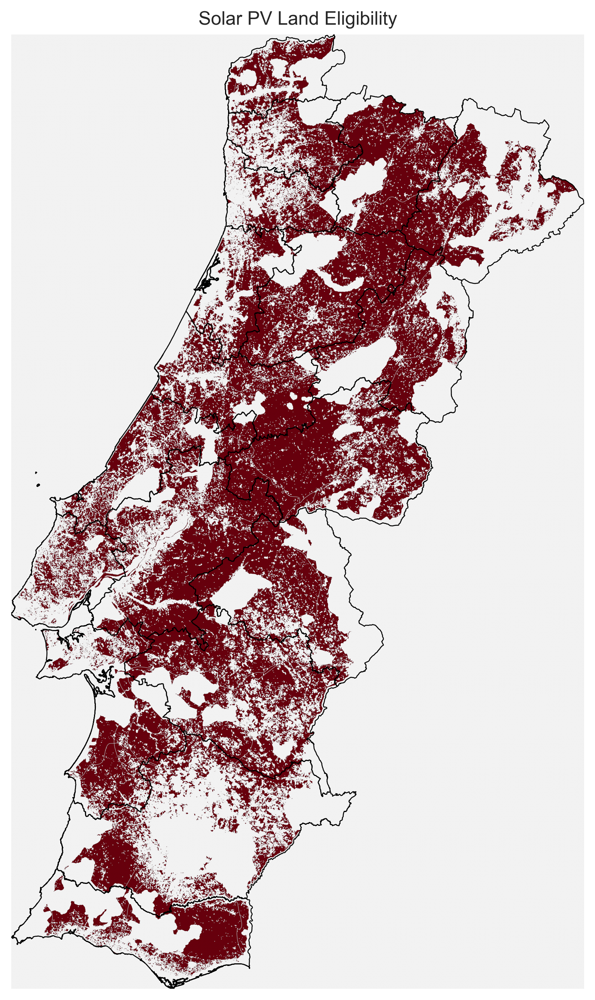

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from rasterio.plot import show
from matplotlib.colors import ListedColormap

# High-res plot from shape_availability output (band, transform)
eligible = np.ma.masked_where(band <= 0, band)
fig, ax = plt.subplots(figsize=(7, 9), dpi=300)

# Light background for mainland grid footprint
bg = np.where(np.isfinite(band), 1, np.nan)
show(bg, transform=transform, ax=ax, cmap=ListedColormap(["#f2f2f2"]))

# Eligible cells in red
show(eligible.astype(float), transform=transform, ax=ax, cmap="Reds", vmin=0, vmax=1)

# Boundary in same CRS as band/transform (EPSG:3035)
shape_3035.boundary.plot(ax=ax, color="black", linewidth=0.6)

ax.set_title("Solar PV Land Eligibility")
ax.set_axis_off()
ax.set_aspect("equal")
plt.tight_layout()
plt.show()


### 3.2 Land Eligibility for Wind Onshore

In [17]:
BASE_DIR = Path.cwd()
DATA_RAW = globals().get("DATA_RAW", BASE_DIR / "data" / "raw")
DATA_PROCESSED = globals().get("DATA_PROCESSED", BASE_DIR / "data" / "processed")

EXCL_DIR = DATA_RAW / "exclusion zone"
NATURA_FILE = EXCL_DIR / "Natura2000_end2024.gpkg"
AIRPORTS_FILE = EXCL_DIR / "ne_10m_airports.gpkg"
ROADS_FILE = EXCL_DIR / "ne_10m_roads.gpkg"

# Buffers (meters)
NATURA_BUFFER = 800
AIRPORT_BUFFER_M = 10000   # 10 km buffer around airports
ROAD_BUFFER_M = 300 # 300 m buffer around roads

def first_layer(path):
    if hasattr(gpd, "list_layers"):
        try:
            layers = gpd.list_layers(path)
            if len(layers):
                return layers.iloc[0]["name"]
        except Exception:
            pass
    return None

def read_bbox(path, shape_4326):
    layer = first_layer(path)
    kwargs = {"layer": layer} if layer else {}

    probe = gpd.read_file(path, rows=1, **kwargs)
    src_crs = probe.crs if probe.crs is not None else "EPSG:4326"

    bbox = tuple(shape_4326.to_crs(src_crs).total_bounds)
    try:
        gdf = gpd.read_file(path, bbox=bbox, **kwargs)
    except Exception:
        gdf = gpd.read_file(path, **kwargs)

    if gdf.crs is None:
        gdf = gdf.set_crs(src_crs)
    return gdf[gdf.geometry.notnull()].copy()

# 1) Cutout
if "weather_data" in globals() and weather_data and "cutout" in weather_data:
    cutout = weather_data["cutout"]
else:
    cutout = atlite.Cutout(path=DATA_RAW / "weather" / "portugal-2024.nc")

# 2) Mainland shape
regions_file = DATA_PROCESSED / "regions" / "portugal_boundaries.shp"
if regions_file.exists():
    shape = gpd.read_file(regions_file)
else:
    shape = gpd.read_file(DATA_RAW / "gadm" / "gadm_410-levels-ADM_1-PRT.gpkg")

if "NAME_1" in shape.columns:
    shape = shape[~shape["NAME_1"].isin(["Azores", "Madeira"])].copy()

shape_4326 = shape.to_crs(4326)
shape_3035 = shape.to_crs(3035)

# 3) Exclusion container
excluder = ExclusionContainer(crs=3035, res=25)

natura = read_bbox(NATURA_FILE, shape_4326).to_crs(3035)
airports = read_bbox(AIRPORTS_FILE, shape_4326).to_crs(3035)
roads = read_bbox(ROADS_FILE, shape_4326).to_crs(3035)

if len(natura):
    excluder.add_geometry(natura, buffer=NATURA_BUFFER)
if len(airports):
    excluder.add_geometry(airports, buffer=AIRPORT_BUFFER_M)
if len(roads):
    excluder.add_geometry(roads, buffer=ROAD_BUFFER_M)

# 4) Land-cover exclusion (PROBAV LC100 classes)
landcover_file = next((DATA_RAW / "copernicus-glc").glob("*.tif"), None)
if landcover_file is None:
    raise FileNotFoundError("No land-cover raster found in data/raw/copernicus-glc")

with rasterio.open(landcover_file) as src:
    lc_crs = src.crs
    lc_nodata = src.nodata if src.nodata is not None else 255

# 50 = built-up, 80 = water
excluder.add_raster(
    str(landcover_file),
    codes=[40, 50, 80], #exclude urban built up, cultivated and managed vegetation, and permanent water bodies
    crs=lc_crs,
    buffer=1000, # 1 km buffer around built-up areas
    nodata=lc_nodata
)

# 4b) Elevation constraint: exclude areas above 2000 m
from rasterio.transform import from_bounds
import numpy as np
import xarray as xr

gebco_file = DATA_RAW / "gebco" / "GEBCO_2014_2D-PT.nc"
if not gebco_file.exists():
    raise FileNotFoundError(f"GEBCO file not found: {gebco_file}")

gebco_ds = xr.open_dataset(gebco_file)
elev = gebco_ds["elevation"].values.astype("float32")
lon = gebco_ds["lon"].values
lat = gebco_ds["lat"].values

# Ensure north-up raster orientation
if lat[0] < lat[-1]:
    elev = np.flipud(elev)
    lat = lat[::-1]

# 1 = unsuitable (elevation > 2000m), 0 = suitable
unsuitable_elev = (elev > 2000).astype("uint8")

temp_elev_mask = DATA_RAW / "temp_wind_onshore_elevation_gt2000.tif"
transform_elev = from_bounds(lon.min(), lat.min(), lon.max(), lat.max(),
                             unsuitable_elev.shape[1], unsuitable_elev.shape[0])

with rasterio.open(
    temp_elev_mask,
    "w",
    driver="GTiff",
    height=unsuitable_elev.shape[0],
    width=unsuitable_elev.shape[1],
    count=1,
    dtype="uint8",
    crs="EPSG:4326",
    transform=transform_elev,
    nodata=0
) as dst:
    dst.write(unsuitable_elev, 1)

# Exclude pixels where value == 1 (above 2000m)
excluder.add_raster(str(temp_elev_mask), codes=[1], crs=4326, nodata=0)

print(f"Elevation >2000m cells excluded: {int(unsuitable_elev.sum())}")

# 5) Availability matrix
A_wind_onshore = cutout.availabilitymatrix(shape_3035, excluder)

# 6) Workshop-style eligible land share
band, transform = shape_availability(shape_3035.geometry, excluder)
eligible_cells = float(band.sum())
eligible_area_m2 = eligible_cells * (excluder.res ** 2)
country_area_m2 = float(shape_3035.area.sum())
eligible_share_land_pct = 100 * eligible_area_m2 / country_area_m2

print(f"A_wind_onshore dims/shape: {A_wind_onshore.dims} {A_wind_onshore.shape}")
print(f"Eligible share of mainland land area: {eligible_share_land_pct:.2f}%")

# 7) Quick plot
A_map = A_wind_onshore
for d in [d for d in A_map.dims if d not in ("y", "x")]:
    A_map = A_map.max(dim=d)



# 8) Save
out = DATA_PROCESSED / "eligibility" / "wind_onshore_eligibility_mask.nc"
out.parent.mkdir(parents=True, exist_ok=True)
xr.Dataset({"eligible": A_wind_onshore}).to_netcdf(out)
print(f"Saved: {out}")


Elevation >2000m cells excluded: 0
A_wind_onshore dims/shape: ('dim_0', 'y', 'x') (18, 23, 16)
Eligible share of mainland land area: 12.14%
Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\eligibility\wind_onshore_eligibility_mask.nc


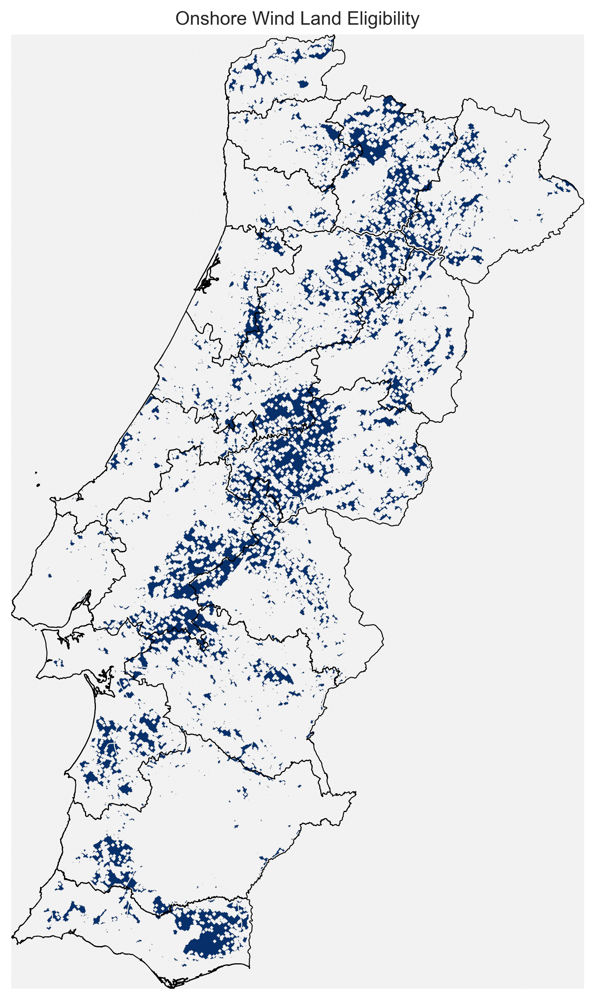

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from rasterio.plot import show
from matplotlib.colors import ListedColormap

# band, transform come from your wind onshore eligibility cell
eligible_wind = np.ma.masked_where(band <= 0, band)

fig, ax = plt.subplots(figsize=(7, 9), dpi=300)

# Light background for mainland raster footprint
bg = np.where(np.isfinite(band), 1, np.nan)
show(bg, transform=transform, ax=ax, cmap=ListedColormap(["#f2f2f2"]))

# Eligible onshore wind cells (blue)
show(
    eligible_wind.astype(float),
    transform=transform,
    ax=ax,
    cmap="Blues",
    vmin=0,
    vmax=1
)

# Mainland boundary in same CRS (EPSG:3035)
shape_3035.boundary.plot(ax=ax, color="black", linewidth=0.6)

# Optional overlays for context
#roads.to_crs(3035).plot(ax=ax, color="dimgray", linewidth=0.2, alpha=0.3)
#airports.to_crs(3035).plot(ax=ax, color="black", markersize=4, alpha=0.6)

ax.set_title("Onshore Wind Land Eligibility")
ax.set_axis_off()
ax.set_aspect("equal")
plt.tight_layout()
plt.show()


### 3.3 Water-Body Area Eligibility for Wind Offshore

In [19]:
from rasterio.transform import from_bounds
from atlite.gis import ExclusionContainer, shape_availability
from shapely.ops import unary_union

BASE_DIR = Path.cwd()
DATA_RAW = globals().get("DATA_RAW", BASE_DIR / "data" / "raw")
DATA_PROCESSED = globals().get("DATA_PROCESSED", BASE_DIR / "data" / "processed")

EXCL_DIR = DATA_RAW / "exclusion zone"
NATURA_FILE = EXCL_DIR / "Natura2000_end2024.gpkg"
GEBCO_FILE = DATA_RAW / "gebco" / "GEBCO_2014_2D-PT.nc"

EEZ_FILE_RAW = DATA_RAW / "maritime" / "eez_v12.gpkg"
REGIONS_FILE = DATA_PROCESSED / "regions" / "portugal_boundaries.shp"

SHORE_BUFFER_M = 10_000
OFFSHORE_RES_M = 100  # coarser than onshore for speed

def first_layer(path):
    if hasattr(gpd, "list_layers"):
        try:
            layers = gpd.list_layers(path)
            if len(layers):
                return layers.iloc[0]["name"]
        except Exception:
            pass
    return None

def read_bbox(path, shape_4326):
    layer = first_layer(path)
    kwargs = {"layer": layer} if layer else {}

    probe = gpd.read_file(path, rows=1, **kwargs)
    src_crs = probe.crs if probe.crs is not None else "EPSG:4326"

    bbox = tuple(shape_4326.to_crs(src_crs).total_bounds)
    try:
        gdf = gpd.read_file(path, bbox=bbox, **kwargs)
    except Exception:
        gdf = gpd.read_file(path, **kwargs)

    if gdf.crs is None:
        gdf = gdf.set_crs(src_crs)
    return gdf[gdf.geometry.notnull()].copy()

# 1) Cutout
cutout = atlite.Cutout(path=DATA_RAW / "weather" / "portugal-2024.nc")

# 2) Mainland Portugal geometry (exclude Azores/Madeira)
if REGIONS_FILE.exists():
    mainland = gpd.read_file(REGIONS_FILE)
else:
    mainland = gpd.read_file(DATA_RAW / "gadm" / "gadm_410-levels-ADM_1-PRT.gpkg")

if "NAME_1" in mainland.columns:
    mainland = mainland[~mainland["NAME_1"].isin(["Azores", "Madeira"])].copy()

mainland_3035 = mainland.to_crs(3035)
mainland_union_3035 = unary_union(mainland_3035.geometry)

# 3) EEZ load + mainland EEZ extraction
eez = gpd.read_file(EEZ_FILE_RAW)
# Optional filter if raw global EEZ file is used
for col, val in [("ISO_TER1", "PRT"), ("ISO_SOV1", "PRT"), ("TERRITORY1", "Portugal"), ("SOVEREIGN1", "Portugal")]:
    if col in eez.columns:
        eez = eez[eez[col] == val].copy()
        break
else:
    raise FileNotFoundError("No EEZ file found in processed/regions or raw/maritime.")

if eez.crs is None:
    eez = eez.set_crs(4326)

eez_3035 = eez.to_crs(3035)

# Keep EEZ polygons near mainland only (drops Azores/Madeira EEZ if present)
mainland_window = mainland_union_3035.buffer(450_000)  # ~450 km from mainland
eez_3035 = eez_3035[eez_3035.geometry.intersects(mainland_window)].copy()
eez_3035["geometry"] = eez_3035.geometry.intersection(mainland_window)
eez_3035 = eez_3035[eez_3035.geometry.notnull() & (~eez_3035.geometry.is_empty)].copy()

# Ensure sea-only EEZ (subtract mainland land polygon)
eez_3035["geometry"] = eez_3035.geometry.difference(mainland_union_3035)
eez_3035 = eez_3035[eez_3035.geometry.notnull() & (~eez_3035.geometry.is_empty)].copy()

eez_mainland_offshore_3035 = gpd.GeoDataFrame(
    {"name": ["PT_mainland_EEZ_offshore"]},
    geometry=[unary_union(eez_3035.geometry)],
    crs=3035
)

overlap_m2 = eez_mainland_offshore_3035.geometry.iloc[0].intersection(mainland_union_3035).area
print(f"EEZ-land overlap area (m²): {overlap_m2:.2f}")
assert overlap_m2 < 1.0, "Offshore EEZ still overlaps land."

eez_mainland_offshore_4326 = eez_mainland_offshore_3035.to_crs(4326)

# 4) Excluder
offshore_excluder = ExclusionContainer(crs=3035, res=OFFSHORE_RES_M)

# 4a) Natura 2000 exclusion
natura = read_bbox(NATURA_FILE, eez_mainland_offshore_4326).to_crs(3035)
if len(natura):
    eez_union = unary_union(eez_mainland_offshore_3035.geometry)
    natura["geometry"] = natura.geometry.intersection(eez_union)
    natura = natura[natura.geometry.notnull() & (~natura.geometry.is_empty)].copy()
    if len(natura):
        offshore_excluder.add_geometry(natura, buffer=0)

# 4b) 10 km minimum distance to shore (exclude <10 km from mainland coast)
shore_geom = gpd.GeoDataFrame(geometry=[mainland_union_3035], crs=3035)
offshore_excluder.add_geometry(shore_geom, buffer=SHORE_BUFFER_M)

# 4c) Bathymetry exclusion from GEBCO: keep only -50m <= elevation < 0m
if not GEBCO_FILE.exists():
    raise FileNotFoundError(f"GEBCO file not found: {GEBCO_FILE}")

gebco_ds = xr.open_dataset(GEBCO_FILE)
elev = gebco_ds["elevation"].values.astype("float32")
lon = gebco_ds["lon"].values
lat = gebco_ds["lat"].values

# north-up raster orientation
if lat[0] < lat[-1]:
    elev = np.flipud(elev)
    lat = lat[::-1]

# 1 = unsuitable: deeper than 50 m OR land/sea-level (>=0) OR NaN
unsuitable_bath = ((elev < -50) | (elev >= 0) | np.isnan(elev)).astype("uint8")

temp_bath_mask = DATA_RAW / "temp_offshore_depth_outside_0_50m.tif"
transform_bath = from_bounds(lon.min(), lat.min(), lon.max(), lat.max(),
                             unsuitable_bath.shape[1], unsuitable_bath.shape[0])

with rasterio.open(
    temp_bath_mask,
    "w",
    driver="GTiff",
    height=unsuitable_bath.shape[0],
    width=unsuitable_bath.shape[1],
    count=1,
    dtype="uint8",
    crs="EPSG:4326",
    transform=transform_bath,
    nodata=0
) as dst:
    dst.write(unsuitable_bath, 1)

offshore_excluder.add_raster(str(temp_bath_mask), codes=[1], crs=4326, nodata=0)

# 5) Availability matrix in mainland offshore EEZ
A_wind_offshore = cutout.availabilitymatrix(eez_mainland_offshore_3035, offshore_excluder)

# 6) Eligible share inside mainland offshore EEZ
band, transform = shape_availability(eez_mainland_offshore_3035.geometry, offshore_excluder)
eligible_cells = float(band.sum())
eligible_area_m2 = eligible_cells * (offshore_excluder.res ** 2)
eez_offshore_area_m2 = float(eez_mainland_offshore_3035.area.sum())
eligible_share_eez_pct = 100 * eligible_area_m2 / eez_offshore_area_m2

print(f"A_wind_offshore dims/shape: {A_wind_offshore.dims} {A_wind_offshore.shape}")
print(f"Eligible share of mainland offshore EEZ: {eligible_share_eez_pct:.2f}%")
print(f"Excluded by bathymetry mask cells: {int(unsuitable_bath.sum())}")

# 7) Quick plot prep
A_map = A_wind_offshore
for d in [d for d in A_map.dims if d not in ("y", "x")]:
    A_map = A_map.max(dim=d)

# 8) Save
out = DATA_PROCESSED / "eligibility" / "wind_offshore_eligibility_mask.nc"
out.parent.mkdir(parents=True, exist_ok=True)
xr.Dataset({"eligible": A_wind_offshore}).to_netcdf(out)
print(f"Saved: {out}")


EEZ-land overlap area (m²): 0.00
A_wind_offshore dims/shape: ('dim_0', 'y', 'x') (1, 23, 16)
Eligible share of mainland offshore EEZ: 0.11%
Excluded by bathymetry mask cells: 787602
Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\eligibility\wind_offshore_eligibility_mask.nc


Eligible cells on land: 0


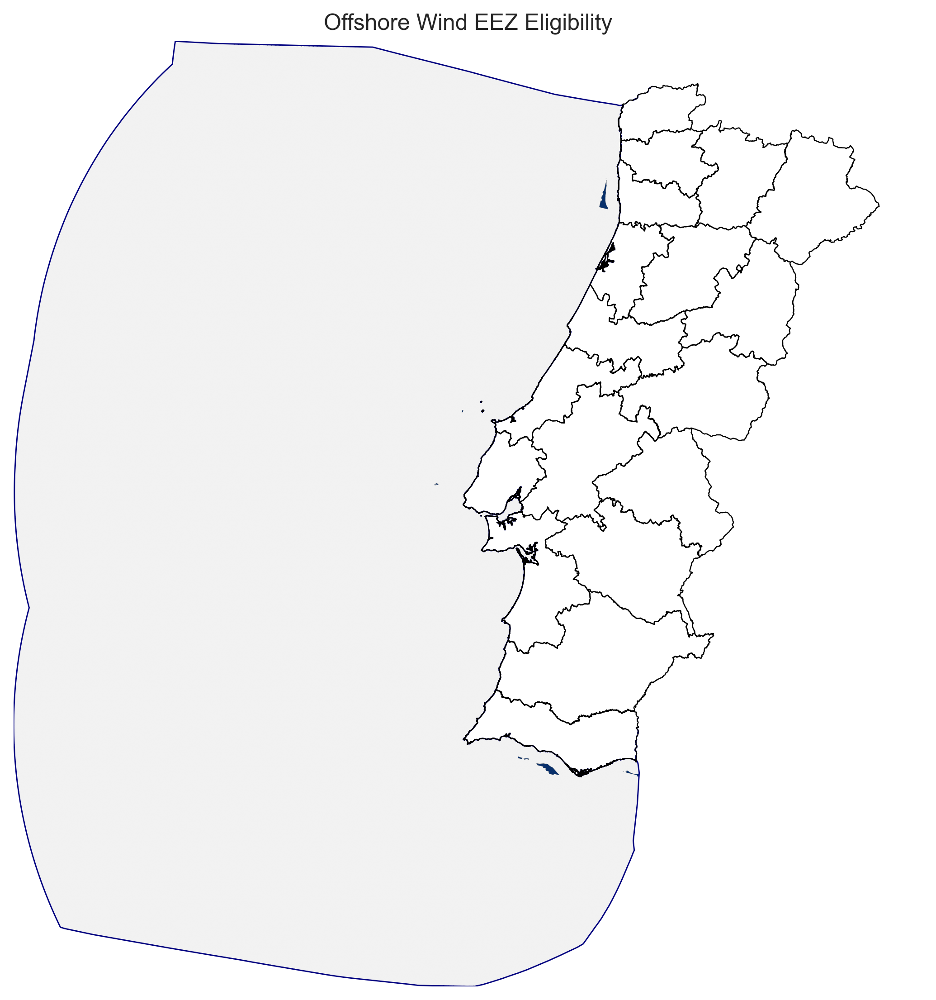

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from rasterio.plot import show
from rasterio.features import rasterize
from matplotlib.colors import ListedColormap
from atlite.gis import ExclusionContainer, shape_availability

# Required objects from calculation cell
required = [
    "eez_mainland_offshore_3035",
    "offshore_excluder",
    "mainland_union_3035",
    "mainland_3035",
    "OFFSHORE_RES_M",
]
missing = [v for v in required if v not in globals()]
if missing:
    raise RuntimeError(f"Run offshore eligibility calculation cell first. Missing: {missing}")


if "band" in globals() and "transform" in globals():
    band_offshore = band.astype(float)
    transform_offshore = transform
else:
    band_offshore, transform_offshore = shape_availability(
        eez_mainland_offshore_3035.geometry, offshore_excluder
    )
    band_offshore = band_offshore.astype(float)

# EEZ domain background mask (no exclusions)
domain_excluder = ExclusionContainer(crs=3035, res=OFFSHORE_RES_M)
band_domain, _ = shape_availability(eez_mainland_offshore_3035.geometry, domain_excluder)
domain_mask = np.ma.masked_where(band_domain <= 0, band_domain)

# QA: ensure no eligible offshore cells lie on land
land_mask = rasterize(
    [(mainland_union_3035, 1)],
    out_shape=band_offshore.shape,
    transform=transform_offshore,
    fill=0,
    dtype="uint8",
    all_touched=True,
)
bad_land_cells = int(((band_offshore > 0) & (land_mask == 1)).sum())
print(f"Eligible cells on land: {bad_land_cells}")
assert bad_land_cells == 0, "Offshore eligibility still contains land cells."

# Plot
eligible_offshore = np.ma.masked_where(band_offshore <= 0, band_offshore)

fig, ax = plt.subplots(figsize=(7, 9), dpi=300)

show(domain_mask.astype(float), transform=transform_offshore, ax=ax, cmap=ListedColormap(["#f2f2f2"]))
show(
    eligible_offshore.astype(float),
    transform=transform_offshore,
    ax=ax,
    cmap="Blues",
    vmin=0,
    vmax=1,
)

eez_mainland_offshore_3035.boundary.plot(ax=ax, color="navy", linewidth=0.7)
mainland_3035.boundary.plot(ax=ax, color="black", linewidth=0.6)

ax.set_title("Offshore Wind EEZ Eligibility")
ax.set_axis_off()
ax.set_aspect("equal")
plt.tight_layout()
plt.show()


## 3.4 Capacity Factor of Solar, Onshore and Offshore Wind

In accordance to the ERA5 Weather data downloaded and with respect to the area eligibility

In [24]:
# ============================================================
# Capacity factors for 3 technologies using ERA5 + eligibility
#
# Requirements implemented:
# - Onshore wind turbine: Vestas_V112_3MW
# - Offshore wind turbine: NREL_ReferenceTurbine_5MW_offshore
# - Solar panel: CdTe, orientation='latitude_optimal'
# - Deployment density: 3 MW/km^2 (wind + solar)
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import xarray as xr
import atlite

# ----------------------------
# Configuration
# ----------------------------
YEAR = 2024
DEPLOYMENT_DENSITY_MW_PER_KM2 = 3.0

ONSHORE_TURBINE = "Vestas_V112_3MW"
OFFSHORE_TURBINE = "NREL_ReferenceTurbine_5MW_offshore"
SOLAR_PANEL = "CdTe"
SOLAR_ORIENTATION = "latitude_optimal"

BASE_DIR = Path.cwd()
DATA_RAW = globals().get("DATA_RAW", BASE_DIR / "data" / "raw")
DATA_PROCESSED = globals().get("DATA_PROCESSED", BASE_DIR / "data" / "processed")

ELIG_DIR = DATA_PROCESSED / "eligibility"
CF_DIR = DATA_PROCESSED / "capacity_factors"
CF_DIR.mkdir(parents=True, exist_ok=True)

# ----------------------------
# Load cutout
# ----------------------------
if "weather_data" in globals() and weather_data and "cutout" in weather_data:
    cutout = weather_data["cutout"]
else:
    cutout = atlite.Cutout(path=DATA_RAW / "weather" / "portugal-2024.nc")

# ----------------------------
# Helpers
# ----------------------------
def normalize_A(A, default_name="PT"):
    """Normalize eligibility matrix to dims: (name, y, x), aligned to cutout grid."""
    A = A.fillna(0.0).astype(float)

    # Common case from saved NetCDF: dim_0 instead of name
    if "name" not in A.dims and "dim_0" in A.dims:
        A = A.rename({"dim_0": "name"})

    # Reduce unexpected extra dims
    for d in list(A.dims):
        if d not in ("name", "y", "x"):
            if A.sizes[d] == 1:
                A = A.isel({d: 0}, drop=True)
            else:
                A = A.max(d)

    if "name" not in A.dims:
        A = A.expand_dims(name=[default_name])

    # Align to cutout grid
    A = A.reindex(y=cutout.data.y, x=cutout.data.x, fill_value=0.0)
    A = A.transpose("name", "y", "x")
    return A

def load_A(mem_var, filename):
    """Load eligibility matrix either from memory or from NetCDF file."""
    if mem_var in globals():
        A = globals()[mem_var]
    else:
        f = ELIG_DIR / filename
        if not f.exists():
            raise FileNotFoundError(f"Eligibility file not found: {f}")
        ds = xr.open_dataset(f)
        v = "eligible" if "eligible" in ds.data_vars else list(ds.data_vars)[0]
        A = ds[v].load()
        ds.close()
    return normalize_A(A)

def make_cap_matrix(A_norm, density_mw_per_km2=3.0):
    """
    Build atlite aggregation matrix with:
    dims = (name, spatial)
    spatial MultiIndex levels = ['x','y'] in exact cutout.grid order.
    """
    # Ensure exact y/x alignment
    A_on = A_norm.reindex(y=cutout.data.y, x=cutout.data.x, fill_value=0.0)

    # Exact spatial order expected by atlite
    grid_xy = cutout.grid[["x", "y"]].reset_index(drop=True)
    spatial_index = pd.MultiIndex.from_frame(grid_xy, names=["x", "y"])

    # Vectorized selection in cutout.grid order
    x_sel = xr.DataArray(grid_xy["x"].to_numpy(), dims="spatial")
    y_sel = xr.DataArray(grid_xy["y"].to_numpy(), dims="spatial")
    A_flat_vals = A_on.sel(x=x_sel, y=y_sel).transpose("name", "spatial").values

    A_flat = xr.DataArray(
        A_flat_vals,
        dims=("name", "spatial"),
        coords={
            "name": A_on.coords["name"].values,
            "spatial": spatial_index,
        },
    )

    # Cell area (km2), same order as cutout.grid
    area_km2 = xr.DataArray(
        cutout.grid.to_crs(3035).area.values / 1e6,
        dims=("spatial",),
        coords={"spatial": spatial_index},
    )

    cap_matrix = (A_flat * area_km2 * density_mw_per_km2).astype("float32")
    cap_by_name = cap_matrix.sum("spatial").clip(min=1e-9)

    # Sanity check: matrix spatial coords match cutout.grid coords
    mxy = cap_matrix.indexes["spatial"].to_frame(index=False)[["x", "y"]].to_numpy()
    cxy = cutout.grid[["x", "y"]].to_numpy()
    if not np.array_equal(mxy, cxy):
        raise RuntimeError("cap_matrix spatial coordinates are not aligned with cutout.grid.")

    return cap_matrix, cap_by_name

def to_time_y_x(da):
    """Return DataArray in (time, y, x)."""
    if da.dims == ("time", "y", "x"):
        return da
    if da.dims == ("y", "time", "x"):
        return da.transpose("time", "y", "x")
    if set(("time", "y", "x")).issubset(set(da.dims)):
        return da.transpose("time", "y", "x")
    raise ValueError(f"Unexpected CF grid dims: {da.dims}")

# ----------------------------
# Load eligibility matrices
# ----------------------------
A_wind_onshore = load_A("A_wind_onshore", "wind_onshore_eligibility_mask.nc")
A_wind_offshore = load_A("A_wind_offshore", "wind_offshore_eligibility_mask.nc")
A_solar = load_A("A_solar", "solar_pv_eligibility_mask.nc")

techs = {
    "wind_onshore": A_wind_onshore,
    "wind_offshore": A_wind_offshore,
    "solar_pv": A_solar,
}

# ----------------------------
# Compute capacity factors
# ----------------------------
for tech, A_norm in techs.items():
    # Pandas index required by atlite aggregate_matrix
    if "name" in A_norm.indexes:
        names = pd.Index(A_norm.indexes["name"], name="name")
    else:
        names = pd.Index(A_norm.coords["name"].values, name="name")

    cap_matrix, cap_by_name = make_cap_matrix(A_norm, DEPLOYMENT_DENSITY_MW_PER_KM2)

    if tech == "wind_onshore":
        gen = cutout.wind(matrix=cap_matrix, index=names, turbine=ONSHORE_TURBINE)
        cf_grid_raw = cutout.wind(
            turbine=ONSHORE_TURBINE,
            capacity_factor_timeseries=True
        )

    elif tech == "wind_offshore":
        gen = cutout.wind(matrix=cap_matrix, index=names, turbine=OFFSHORE_TURBINE)
        cf_grid_raw = cutout.wind(
            turbine=OFFSHORE_TURBINE,
            capacity_factor_timeseries=True
        )

    elif tech == "solar_pv":
        gen = cutout.pv(
            matrix=cap_matrix,
            index=names,
            panel=SOLAR_PANEL,
            orientation=SOLAR_ORIENTATION,
        )
        cf_grid_raw = cutout.pv(
            panel=SOLAR_PANEL,
            orientation=SOLAR_ORIENTATION,
            capacity_factor_timeseries=True,
        )
    else:
        raise ValueError(f"Unknown tech: {tech}")

    # Ensure generation has time as first dim
    if "time" in gen.dims and gen.dims[0] != "time":
        gen = gen.transpose("time", ...)

    # Aggregated CF per name: CF = generation / installed capacity
    cf_ts = (gen / cap_by_name).clip(min=0.0, max=1.0).rename("capacity_factor")

    # Gridded CF field masked to eligible footprint
    cf_grid = to_time_y_x(cf_grid_raw).clip(min=0.0, max=1.0)
    eligible_mask_2d = (A_norm.max("name") > 0).astype(float)  # (y,x)
    cf_grid_masked = (cf_grid * eligible_mask_2d).rename("capacity_factor")

    # Save outputs
    nc_file = CF_DIR / f"{tech}_capacity_factors_{YEAR}.nc"
    csv_file = CF_DIR / f"{tech}_capacity_factors_{YEAR}_timeseries.csv"

    xr.Dataset({"capacity_factor": cf_grid_masked}).to_netcdf(nc_file)
    cf_ts.to_pandas().to_csv(csv_file)

    print(f"\n{tech}")
    print(f"  Installed potential (MW): {float(cap_by_name.sum()):,.2f}")
    print(f"  Mean CF: {float(cf_ts.mean()):.3f}")
    print(f"  Saved: {nc_file.name}")
    print(f"  Saved: {csv_file.name}")



wind_onshore
  Installed potential (MW): 32,952.16
  Mean CF: 0.151
  Saved: wind_onshore_capacity_factors_2024.nc
  Saved: wind_onshore_capacity_factors_2024_timeseries.csv

wind_offshore
  Installed potential (MW): 355.47
  Mean CF: 0.301
  Saved: wind_offshore_capacity_factors_2024.nc
  Saved: wind_offshore_capacity_factors_2024_timeseries.csv

solar_pv
  Installed potential (MW): 129,646.85
  Mean CF: 0.191
  Saved: solar_pv_capacity_factors_2024.nc
  Saved: solar_pv_capacity_factors_2024_timeseries.csv


In [26]:
# Split installable potential (MW) by region N/S/W/E/C for:


BASE_DIR = Path.cwd()
DATA_RAW = globals().get("DATA_RAW", BASE_DIR / "data" / "raw")
DATA_PROCESSED = globals().get("DATA_PROCESSED", BASE_DIR / "data" / "processed")

DEPLOYMENT_DENSITY_MW_PER_KM2 = 3.0
REGION_ORDER = ["N", "S", "W", "E", "C"]

REGIONS_FILE = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"
ELIG_DIR = DATA_PROCESSED / "eligibility"
OUT_FILE = DATA_PROCESSED / "generation" / "regional_installable_potential_mw.csv"
OUT_FILE.parent.mkdir(parents=True, exist_ok=True)

# cutout
if "weather_data" in globals() and weather_data and "cutout" in weather_data:
    cutout = weather_data["cutout"]
else:
    cutout = atlite.Cutout(path=DATA_RAW / "weather" / "portugal-2024.nc")

def normalize_A(A):
    A = A.fillna(0.0).astype(float)
    if "name" not in A.dims and "dim_0" in A.dims:
        A = A.rename({"dim_0": "name"})
    for d in list(A.dims):
        if d not in ("name", "y", "x"):
            A = A.isel({d: 0}, drop=True) if A.sizes[d] == 1 else A.max(d)
    if "name" not in A.dims:
        A = A.expand_dims(name=["PT"])
    A = A.reindex(y=cutout.data.y, x=cutout.data.x, fill_value=0.0)
    return A.transpose("name", "y", "x")

def load_elig(mem_var, fname):
    if mem_var in globals():
        A = globals()[mem_var]
    else:
        ds = xr.open_dataset(ELIG_DIR / fname)
        var = "eligible" if "eligible" in ds.data_vars else list(ds.data_vars)[0]
        A = ds[var].load()
        ds.close()
    return normalize_A(A)

def detect_region_col(df):
    candidates = ["region_id", "node", "Node", "region", "Region", "name", "NAME", "bus", "NSWEC"]
    for c in candidates:
        if c in df.columns:
            return c
    raise ValueError(f"Could not find region column in {list(df.columns)}")

def to_nswec(v):
    s = str(v).strip().upper()
    mapping = {
        "N": "N", "NORTH": "N", "NORTE": "N",
        "S": "S", "SOUTH": "S", "SUL": "S",
        "W": "W", "WEST": "W", "OESTE": "W",
        "E": "E", "EAST": "E", "ESTE": "E",
        "C": "C", "CENTER": "C", "CENTRE": "C", "CENTRAL": "C", "CENTRO": "C",
    }
    return mapping.get(s, s)

# 1) Grid table in cutout order + cell area
grid = cutout.grid.copy()
if grid.crs is None:
    grid = grid.set_crs(cutout.crs if hasattr(cutout, "crs") and cutout.crs else 4326)
grid = grid.reset_index(drop=True)
grid_3035 = grid.to_crs(3035)
cell_area_km2 = grid_3035.area.to_numpy() / 1e6

grid_xy = grid[["x", "y"]].copy().reset_index(drop=True)

# 2) Load and prepare regions N/S/W/E/C
regions = gpd.read_file(REGIONS_FILE).to_crs(3035)
region_col = detect_region_col(regions)
regions["region_id"] = regions[region_col].map(to_nswec)
regions = regions[regions["region_id"].isin(REGION_ORDER)].copy()
regions = regions.dissolve(by="region_id", as_index=False)[["region_id", "geometry"]]

if set(REGION_ORDER) - set(regions["region_id"]):
    missing = sorted(set(REGION_ORDER) - set(regions["region_id"]))
    raise ValueError(f"Missing expected regions in {REGIONS_FILE.name}: {missing}")

# 3) Assign each cutout cell to a region (centroid within, then nearest fallback)
cell_points = grid_3035.copy()
cell_points["geometry"] = cell_points.geometry.centroid
cell_points = gpd.GeoDataFrame(cell_points, geometry="geometry", crs=3035)

joined = gpd.sjoin(cell_points[["x", "y", "geometry"]], regions, how="left", predicate="within")
joined = joined.sort_index()

missing = joined["region_id"].isna()
if missing.any():
    nearest = gpd.sjoin_nearest(
        cell_points.loc[missing, ["x", "y", "geometry"]],
        regions,
        how="left",
        distance_col="dist_m",
    )
    joined.loc[missing, "region_id"] = nearest["region_id"].values

cell_region = joined["region_id"].to_numpy()

# 4) Load eligibility matrices
A_wind_onshore = load_elig("A_wind_onshore", "wind_onshore_eligibility_mask.nc")
A_wind_offshore = load_elig("A_wind_offshore", "wind_offshore_eligibility_mask.nc")
A_solar = load_elig("A_solar", "solar_pv_eligibility_mask.nc")

tech_map = {
    "wind_onshore": A_wind_onshore,
    "wind_offshore": A_wind_offshore,
    "solar_pv": A_solar,
}

# 5) Split potential by region
regional = pd.DataFrame(index=REGION_ORDER)

for tech, A in tech_map.items():
    # Collapse "name" (if present) to get one eligible share per grid cell
    A2 = A.max("name")  # dims: y,x

    # Align to cutout.grid order via merge on (x,y)
    a_df = A2.to_series().rename("avail_share").reset_index()[["y", "x", "avail_share"]]
    cells = grid_xy.merge(a_df, on=["x", "y"], how="left")
    avail_share = cells["avail_share"].fillna(0.0).to_numpy()

    # Installable potential per cell (MW)
    pot_mw_cell = avail_share * cell_area_km2 * DEPLOYMENT_DENSITY_MW_PER_KM2

    # Sum by assigned region
    tmp = pd.DataFrame({"region": cell_region, "potential_mw": pot_mw_cell})
    pot_by_region = tmp.groupby("region", dropna=False)["potential_mw"].sum().reindex(REGION_ORDER, fill_value=0.0)

    regional[tech] = pot_by_region

regional["total_mw"] = regional.sum(axis=1)
regional["total_gw"] = regional["total_mw"] / 1000.0

print(regional.round(2))
regional.to_csv(OUT_FILE)
print(f"Saved: {OUT_FILE}")


   wind_onshore  wind_offshore  solar_pv  total_mw  total_gw
N       6083.25          18.33  22132.49  28234.06     28.23
S       5306.43         217.82  22902.88  28427.13     28.43
W       2183.30         108.90  11846.25  14138.45     14.14
E       9382.35           0.00  34760.14  44142.49     44.14
C       4148.88          10.41  17587.88  21747.17     21.75
Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\generation\regional_installable_potential_mw.csv


In [27]:
# ============================================================
# Build regional p_nom_max and p_max_pu for PyPSA (N,S,W,E,C)
# Uses:
# - eligibility masks
# - gridded CF files (already tech-specific)
# - deployment density = 3 MW/km2
# ============================================================


BASE_DIR = Path.cwd()
DATA_RAW = globals().get("DATA_RAW", BASE_DIR / "data" / "raw")
DATA_PROCESSED = globals().get("DATA_PROCESSED", BASE_DIR / "data" / "processed")

ELIG_DIR = DATA_PROCESSED / "eligibility"
CF_DIR = DATA_PROCESSED / "capacity_factors"
REGIONS_FILE = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"

REGION_ORDER = ["N", "S", "W", "E", "C"]
DEPLOYMENT_DENSITY_MW_PER_KM2 = 3.0

TECHS = {
    "wind_onshore": {
        "elig_file": ELIG_DIR / "wind_onshore_eligibility_mask.nc",
        "cf_file": CF_DIR / "wind_onshore_capacity_factors_2024.nc",
    },
    "wind_offshore": {
        "elig_file": ELIG_DIR / "wind_offshore_eligibility_mask.nc",
        "cf_file": CF_DIR / "wind_offshore_capacity_factors_2024.nc",
    },
    "solar_pv": {
        "elig_file": ELIG_DIR / "solar_pv_eligibility_mask.nc",
        "cf_file": CF_DIR / "solar_pv_capacity_factors_2024.nc",
    },
}

if "weather_data" in globals() and weather_data and "cutout" in weather_data:
    cutout = weather_data["cutout"]
else:
    cutout = atlite.Cutout(path=DATA_RAW / "weather" / "portugal-2024.nc")

def _first_var(ds):
    return "capacity_factor" if "capacity_factor" in ds.data_vars else list(ds.data_vars)[0]

def _norm_elig(da):
    da = da.fillna(0.0).astype(float)
    if "name" in da.dims:
        da = da.max("name")
    if "dim_0" in da.dims:
        da = da.max("dim_0")
    for d in list(da.dims):
        if d not in ("y", "x"):
            da = da.isel({d: 0}, drop=True) if da.sizes[d] == 1 else da.max(d)
    return da.reindex(y=cutout.data.y, x=cutout.data.x, fill_value=0.0)

def load_elig(path):
    ds = xr.open_dataset(path)
    var = "eligible" if "eligible" in ds.data_vars else _first_var(ds)
    da = ds[var].load()
    ds.close()
    return _norm_elig(da)

def load_cf(path):
    ds = xr.open_dataset(path)
    da = ds[_first_var(ds)].load()
    ds.close()
    if da.dims == ("y", "time", "x"):
        da = da.transpose("time", "y", "x")
    elif da.dims != ("time", "y", "x"):
        keep = [d for d in da.dims if d in ("time", "y", "x")]
        da = da.transpose(*keep)
        if da.dims != ("time", "y", "x"):
            da = da.transpose("time", "y", "x")
    return da.reindex(y=cutout.data.y, x=cutout.data.x).clip(min=0.0, max=1.0)

def detect_region_col(df):
    for c in ["region_id", "node", "Node", "region", "Region", "name", "NAME", "bus", "NSWEC"]:
        if c in df.columns:
            return c
    raise ValueError(f"No region column found in {list(df.columns)}")

def to_nswec(v):
    s = str(v).strip().upper()
    m = {
        "N": "N", "NORTH": "N", "NORTE": "N",
        "S": "S", "SOUTH": "S", "SUL": "S",
        "W": "W", "WEST": "W", "OESTE": "W",
        "E": "E", "EAST": "E", "ESTE": "E",
        "C": "C", "CENTER": "C", "CENTRE": "C", "CENTRAL": "C", "CENTRO": "C",
    }
    return m.get(s, s)

# Grid + area
grid = cutout.grid.copy()
if grid.crs is None:
    grid = grid.set_crs(4326, allow_override=True)
grid = grid.reset_index(drop=True)
grid_3035 = grid.to_crs(3035)

area_df = pd.DataFrame({
    "x": grid["x"].values,
    "y": grid["y"].values,
    "area_km2": grid_3035.area.values / 1e6,
})
area_km2 = (
    area_df.set_index(["y", "x"])
    .to_xarray()["area_km2"]
    .reindex(y=cutout.data.y, x=cutout.data.x)
    .fillna(0.0)
)

# Assign each cutout cell to region N/S/W/E/C
regions = gpd.read_file(REGIONS_FILE).to_crs(3035)
rc = detect_region_col(regions)
regions["region_id"] = regions[rc].map(to_nswec)
regions = regions[regions["region_id"].isin(REGION_ORDER)].copy()
regions = regions.dissolve(by="region_id", as_index=False)[["region_id", "geometry"]]

pts = grid_3035.copy()
pts["geometry"] = pts.geometry.centroid
pts = gpd.GeoDataFrame(pts[["x", "y", "geometry"]], geometry="geometry", crs=3035)

joined = gpd.sjoin(pts, regions, how="left", predicate="within").sort_index()
missing = joined["region_id"].isna()
if missing.any():
    nearest = gpd.sjoin_nearest(pts.loc[missing], regions, how="left", distance_col="dist_m")
    joined.loc[missing, "region_id"] = nearest["region_id"].values

region_da = (
    joined[["x", "y", "region_id"]]
    .set_index(["y", "x"])
    .to_xarray()["region_id"]
    .reindex(y=cutout.data.y, x=cutout.data.x)
)

# Outputs
p_nom_max = {}   # {(region, tech): MW}
p_max_pu = {}    # {(region, tech): pd.Series indexed by time}

for tech, cfg in TECHS.items():
    A = load_elig(cfg["elig_file"])           # eligible share (0..1)
    cf = load_cf(cfg["cf_file"])              # time,y,x CF for that tech
    w_base = (A * area_km2).fillna(0.0)       # km2-weighted eligibility

    for r in REGION_ORDER:
        r_mask = xr.where(region_da == r, 1.0, 0.0)
        w = (w_base * r_mask).fillna(0.0)     # weights within region

        # Regional installable potential (MW)
        cap_mw = float((w * DEPLOYMENT_DENSITY_MW_PER_KM2).sum().values)
        p_nom_max[(r, tech)] = cap_mw

        # Regional CF time series (weighted mean over eligible cells)
        denom = float(w.sum().values)
        if denom > 0:
            cf_reg = ((cf * w).sum(dim=("y", "x")) / denom).clip(min=0.0, max=1.0)
        else:
            cf_reg = xr.zeros_like(cf.isel(y=0, x=0)).clip(min=0.0, max=1.0)

        p_max_pu[(r, tech)] = cf_reg.to_pandas()

# Convenience tables
p_nom_max_df = (
    pd.Series(p_nom_max, name="p_nom_max_mw")
    .rename_axis(index=["region", "tech"])
    .reset_index()
    .sort_values(["region", "tech"])
)
p_max_pu_df = pd.DataFrame(
    {f"{r}|{t}": s for (r, t), s in p_max_pu.items()}
).sort_index(axis=1)

print("Regional p_nom_max (MW):")
print(p_nom_max_df.pivot(index="region", columns="tech", values="p_nom_max_mw").round(2))

# Optional save
p_nom_max_df.to_csv(CF_DIR / "regional_p_nom_max_mw.csv", index=False)
p_max_pu_df.to_csv(CF_DIR / "regional_p_max_pu_timeseries.csv")
print(f"Saved: {CF_DIR / 'regional_p_nom_max_mw.csv'}")
print(f"Saved: {CF_DIR / 'regional_p_max_pu_timeseries.csv'}")

# PyPSA-friendly dicts by generator name convention
# Change name format to match your network generator naming exactly.
GEN_NAME_FMT = "{region}_{tech}"

p_nom_max_by_gen = {
    GEN_NAME_FMT.format(region=r, tech=t): v
    for (r, t), v in p_nom_max.items()
}

p_max_pu_by_gen = {
    GEN_NAME_FMT.format(region=r, tech=t): s
    for (r, t), s in p_max_pu.items()
}


Regional p_nom_max (MW):
tech    solar_pv  wind_offshore  wind_onshore
region                                       
C       17587.88          10.41       4148.88
E       34760.14           0.00       9382.35
N       22132.49          18.33       6083.25
S       22902.88         217.82       5306.43
W       11846.25         108.90       2183.30
Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\capacity_factors\regional_p_nom_max_mw.csv
Saved: c:\Users\nashm\Documents\dsesm\group assignment\DSESM\data\processed\capacity_factors\regional_p_max_pu_timeseries.csv


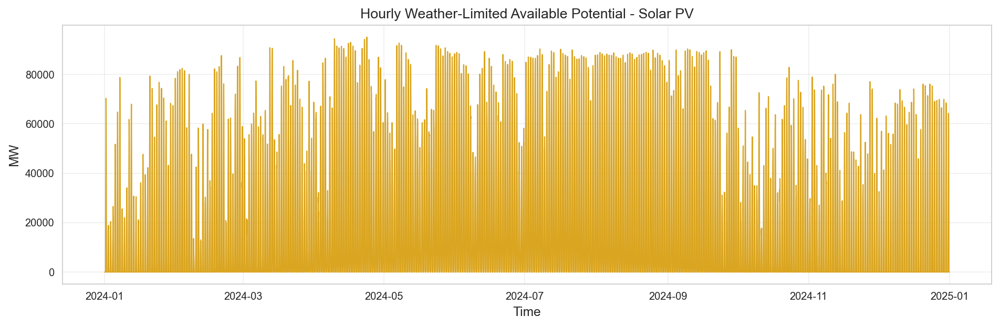

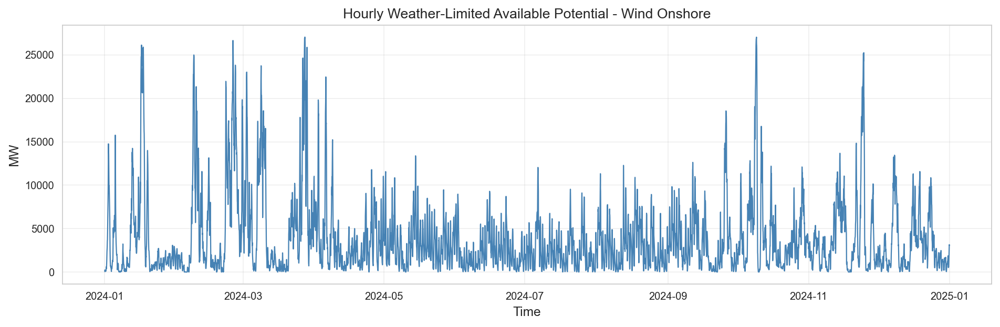

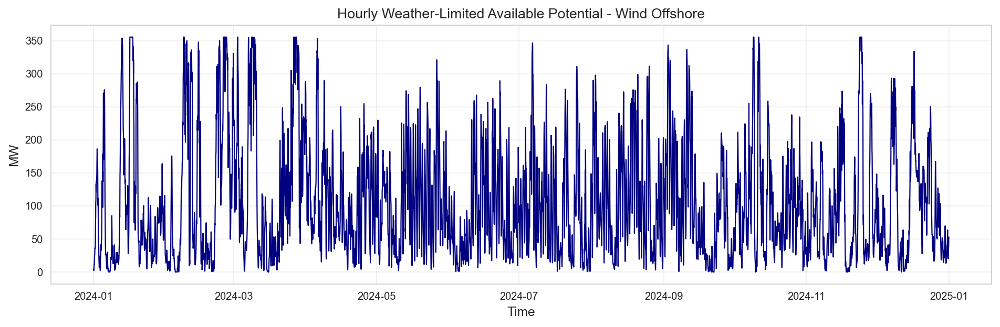

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Requires:
# p_nom_max_by_gen: dict {generator_name: MW}
# p_max_pu_by_gen:  dict {generator_name: pd.Series hourly CF}
# expected generator naming like: "N_wind_onshore", "S_wind_offshore", "C_solar_pv"

if "p_nom_max_by_gen" not in globals() or "p_max_pu_by_gen" not in globals():
    raise RuntimeError("Run the regional p_nom_max / p_max_pu cell first.")

def tech_from_gen(gen_name):
    return gen_name.split("_", 1)[1] if "_" in gen_name else "unknown"

# Build hourly p_max_pu table
idx = next(iter(p_max_pu_by_gen.values())).index
p_max_pu_df = pd.DataFrame({g: s for g, s in p_max_pu_by_gen.items()}).reindex(idx)

# Hourly weather-limited available potential (MW)
p_available_hourly = p_max_pu_df.mul(pd.Series(p_nom_max_by_gen), axis=1)

# Aggregate by technology across all regions
tech_series = {}
for tech in ["solar_pv", "wind_onshore", "wind_offshore"]:
    cols = [c for c in p_available_hourly.columns if tech_from_gen(c) == tech]
    if not cols:
        raise ValueError(f"No generators found for technology: {tech}")
    tech_series[tech] = p_available_hourly[cols].sum(axis=1)

# Plot each technology in its own standalone figure
plot_specs = [
    ("solar_pv", "Solar PV", "goldenrod"),
    ("wind_onshore", "Wind Onshore", "steelblue"),
    ("wind_offshore", "Wind Offshore", "navy"),
]

for tech_key, title, color in plot_specs:
    fig, ax = plt.subplots(figsize=(12, 4), dpi=160)
    ax.plot(tech_series[tech_key].index, tech_series[tech_key].values, color=color, linewidth=1.0)
    ax.set_title(f"Hourly Weather-Limited Available Potential - {title}")
    ax.set_ylabel("MW")
    ax.set_xlabel("Time")
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


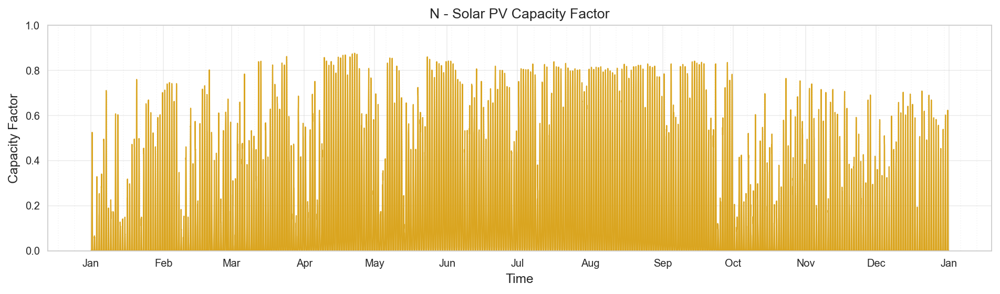

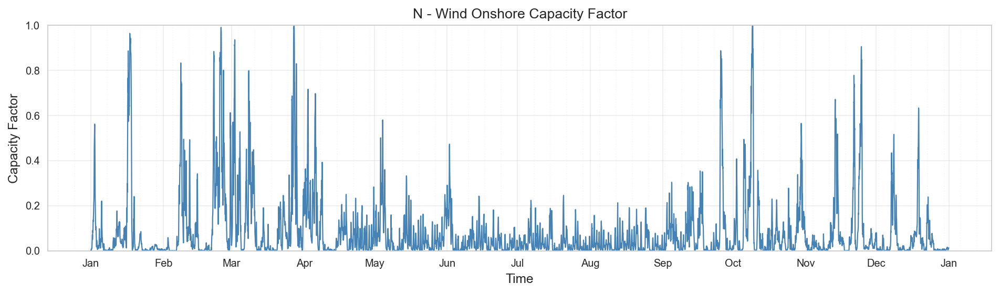

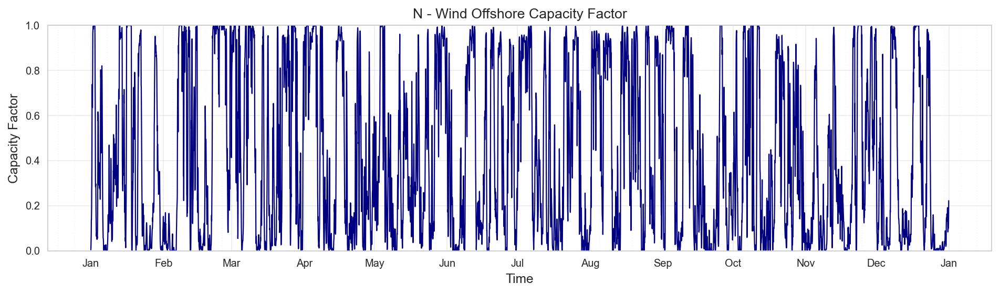

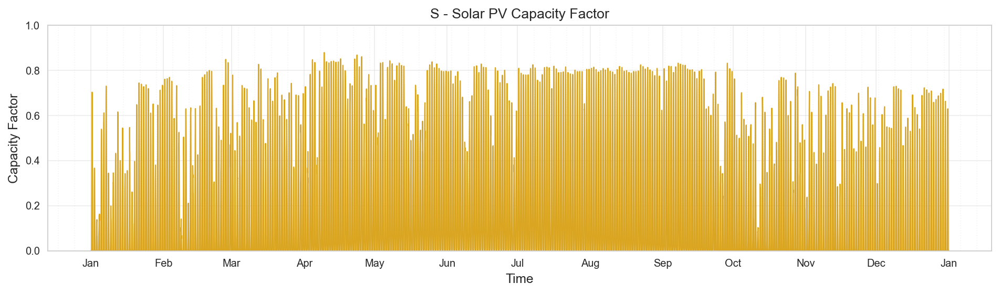

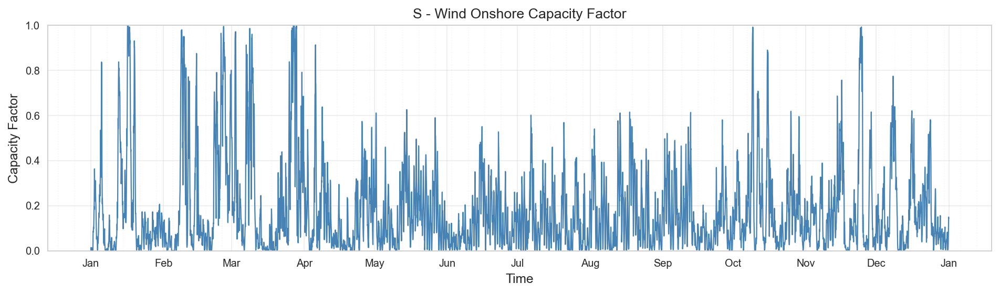

...

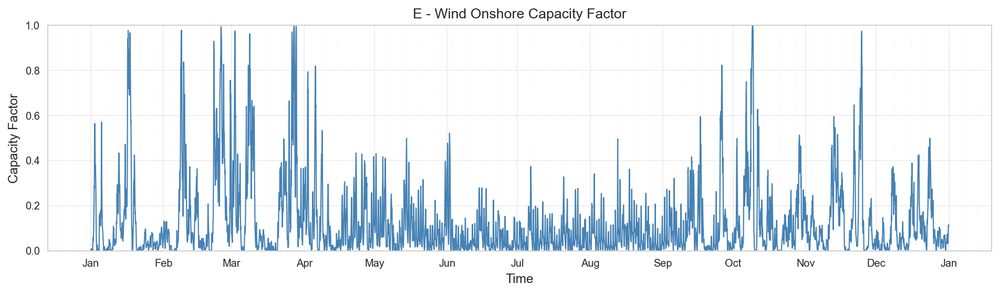

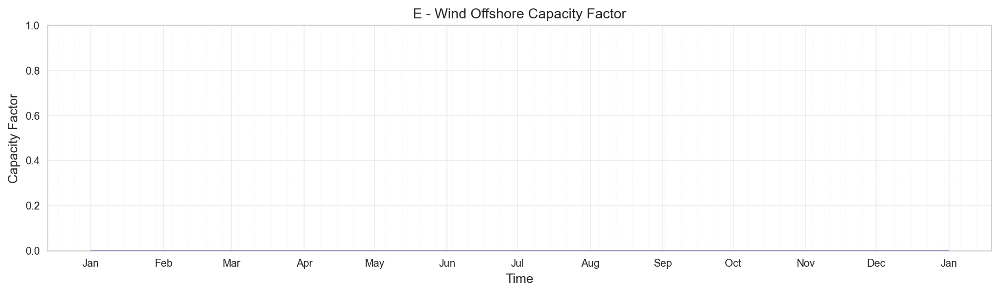

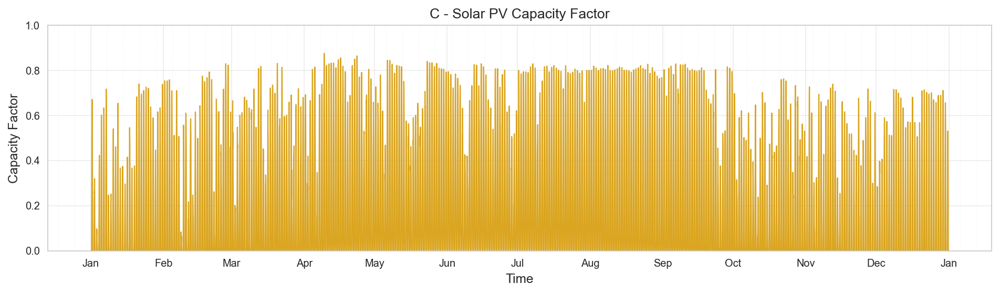

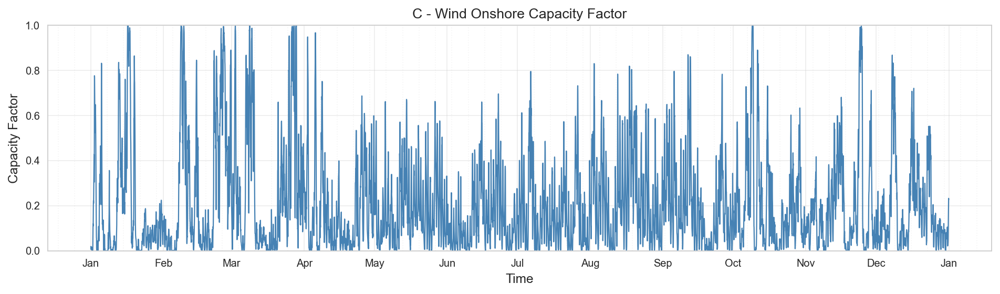

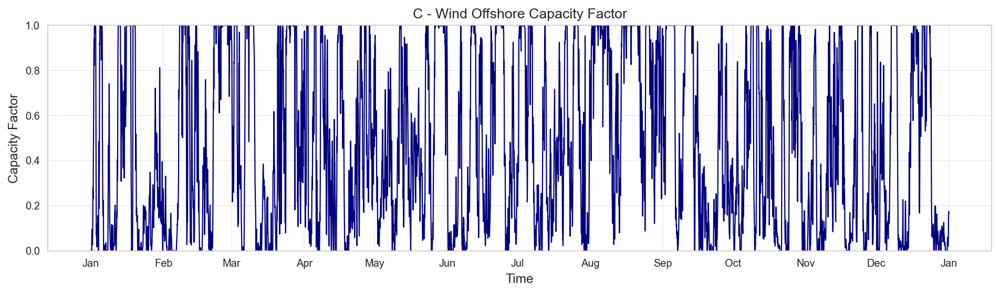

In [29]:
# 15 standalone figures: one per (region, technology)
# Regions: N/S/W/E/C ; Techs: solar_pv, wind_onshore, wind_offshore

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

if "p_max_pu_by_gen" not in globals():
    raise RuntimeError("`p_max_pu_by_gen` not found. Run regional p_max_pu cell first.")

REGIONS = ["N", "S", "W", "E", "C"]
TECHS = ["solar_pv", "wind_onshore", "wind_offshore"]

TECH_LABEL = {
    "solar_pv": "Solar PV",
    "wind_onshore": "Wind Onshore",
    "wind_offshore": "Wind Offshore",
}
TECH_COLOR = {
    "solar_pv": "goldenrod",
    "wind_onshore": "steelblue",
    "wind_offshore": "navy",
}

def gen_key(region, tech):
    # adjust this if your generator naming changed
    return f"{region}_{tech}"

for region in REGIONS:
    for tech in TECHS:
        key = gen_key(region, tech)
        if key not in p_max_pu_by_gen:
            print(f"Missing series: {key}")
            continue

        s = pd.Series(p_max_pu_by_gen[key]).copy()
        s.index = pd.to_datetime(s.index)
        s = s.sort_index().clip(lower=0.0, upper=1.0)

        fig, ax = plt.subplots(figsize=(12, 3.6), dpi=160)
        ax.plot(s.index, s.values, color=TECH_COLOR[tech], linewidth=1.0)

        ax.set_title(f"{region} - {TECH_LABEL[tech]} Capacity Factor")
        ax.set_ylabel("Capacity Factor")
        ax.set_xlabel("Time")
        ax.set_ylim(0, 1)

        # Major monthly ticks + weekly minor ticks
        ax.xaxis.set_major_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%b"))
        ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MO, interval=1))

        ax.grid(which="major", alpha=0.35)
        ax.grid(which="minor", alpha=0.18, linestyle=":")
        ax.tick_params(axis="x", which="minor", length=3)

        plt.tight_layout()
        plt.show()


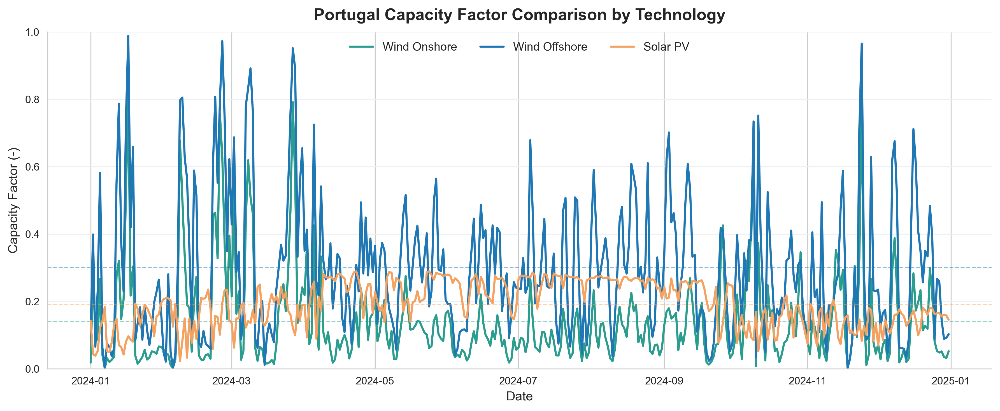

In [31]:
# Combined national capacity factor (CF) for Wind Onshore, Wind Offshore, Solar PV in one chart


# -----------------------------
# 1) Load CF source dict
# -----------------------------
if "p_max_pu_by_gen" in globals():
    cf_raw = dict(p_max_pu_by_gen)
elif "p_max_pu" in globals() and isinstance(p_max_pu, dict):
    cf_raw = dict(p_max_pu)
else:
    raise RuntimeError("Need `p_max_pu_by_gen` or dict `p_max_pu` in memory.")

# -----------------------------
# 2) Load capacity weights
# -----------------------------
if "p_nom_max_by_gen" in globals():
    w_raw = {str(k): float(v) for k, v in p_nom_max_by_gen.items()}
elif "p_nom_max" in globals() and isinstance(p_nom_max, dict):
    # supports {(region,tech): v} or {"N_wind_onshore": v}
    sample_k = next(iter(p_nom_max.keys()))
    if isinstance(sample_k, tuple) and len(sample_k) == 2:
        w_raw = {f"{r}_{t}": float(v) for (r, t), v in p_nom_max.items()}
    else:
        w_raw = {str(k): float(v) for k, v in p_nom_max.items()}
else:
    w_raw = {}  # fallback to equal weights

# -----------------------------
# 3) Helpers
# -----------------------------
TECH_MAP = {
    "wind_onshore": "Wind Onshore",
    "wind_offshore": "Wind Offshore",
    "solar_pv": "Solar PV",
}

def to_series(x):
    if isinstance(x, pd.Series):
        s = x.copy()
    elif isinstance(x, xr.DataArray):
        s = x.to_pandas()
    else:
        s = pd.Series(x)
    s.index = pd.to_datetime(s.index)
    if getattr(s.index, "tz", None) is not None:
        s.index = s.index.tz_convert(None)
    return s.astype(float).clip(lower=0.0, upper=1.0)

def detect_tech(gen_key):
    k = str(gen_key).lower()
    if "wind_onshore" in k:
        return "wind_onshore"
    if "wind_offshore" in k:
        return "wind_offshore"
    if "solar_pv" in k or "solar" in k:
        return "solar_pv"
    return None

# -----------------------------
# 4) Build weighted national CF per technology
# -----------------------------
tech_series = {k: [] for k in TECH_MAP.keys()}
tech_weights = {k: [] for k in TECH_MAP.keys()}

for k, v in cf_raw.items():
    tech = detect_tech(k if not isinstance(k, tuple) else f"{k[0]}_{k[1]}")
    if tech is None:
        continue

    # normalize key for weight lookup
    if isinstance(k, tuple) and len(k) == 2:
        key_norm = f"{k[0]}_{k[1]}"
    else:
        key_norm = str(k)

    s = to_series(v)
    w = float(w_raw.get(key_norm, 1.0))  # fallback equal weight
    if w < 0:
        w = 0.0

    tech_series[tech].append(s)
    tech_weights[tech].append(w)

cf_nat = {}
for tech, series_list in tech_series.items():
    if len(series_list) == 0:
        continue
    W = np.array(tech_weights[tech], dtype=float)
    if np.allclose(W.sum(), 0.0):
        W = np.ones_like(W)

    mat = pd.concat(series_list, axis=1).fillna(0.0)
    cf_nat[TECH_MAP[tech]] = (mat * W).sum(axis=1) / W.sum()

if not cf_nat:
    raise RuntimeError("No wind/solar CF series found.")

cf_df = pd.DataFrame(cf_nat).sort_index()

# Optional smoothing for readability
RESAMPLE = "D"  # set to None for hourly
if RESAMPLE:
    cf_plot = cf_df.resample(RESAMPLE).mean()
else:
    cf_plot = cf_df

# -----------------------------
# 5) Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
})

colors = {
    "Wind Onshore": "#2a9d8f",
    "Wind Offshore": "#1f77b4",
    "Solar PV": "#f4a261",
}

fig, ax = plt.subplots(figsize=(12, 5), dpi=300)

for col in ["Wind Onshore", "Wind Offshore", "Solar PV"]:
    if col in cf_plot.columns:
        ax.plot(cf_plot.index, cf_plot[col], lw=1.8, label=col, color=colors[col])
        ax.axhline(cf_plot[col].mean(), lw=0.9, ls="--", color=colors[col], alpha=0.5)

ax.set_title("Portugal Capacity Factor Comparison by Technology", loc="center", fontsize=14, fontweight="semibold", pad=10)
ax.set_ylabel("Capacity Factor (-)")
ax.set_xlabel("Date")
ax.set_ylim(0, 1)
ax.grid(axis="y", color="#eceff3", linewidth=0.8)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False, ncol=3)

plt.tight_layout()
plt.show()


In [32]:
import pandas as pd
import numpy as np

REGIONS = ["N", "S", "W", "E", "C"]
TECHS = ["solar_pv", "wind_onshore", "wind_offshore"]

def key(r, t): return f"{r}_{t}"

for tech in TECHS:
    # build matrix: time x region
    cols = {}
    for r in REGIONS:
        k = key(r, tech)
        if k in p_max_pu_by_gen:
            s = pd.Series(p_max_pu_by_gen[k]).copy()
            s.index = pd.to_datetime(s.index)
            cols[r] = s.sort_index()
    df = pd.DataFrame(cols).dropna()

    print(f"\n=== {tech} ===")
    if df.shape[1] < 2:
        print("Not enough regional series to compare.")
        continue

    # exact equality checks
    ref = df.iloc[:, 0]
    exact_same = {c: ref.equals(df[c]) for c in df.columns}
    print("Exact equality vs first region:", exact_same)

    # max absolute difference vs first region
    mad = {c: float((ref - df[c]).abs().max()) for c in df.columns}
    print("Max abs diff vs first region:", mad)

    # pairwise correlation
    corr = df.corr()
    print("Pairwise correlation (rounded):")
    print(corr.round(6))



=== solar_pv ===
Exact equality vs first region: {'N': True, 'S': False, 'W': False, 'E': False, 'C': False}
Max abs diff vs first region: {'N': 0.0, 'S': 0.7286395688113154, 'W': 0.4140451616875558, 'E': 0.40971038680446453, 'C': 0.6373443246197857}
Pairwise correlation (rounded):
          N         S         W         E         C
N  1.000000  0.944620  0.976804  0.978654  0.957364
S  0.944620  1.000000  0.970111  0.975332  0.989708
W  0.976804  0.970111  1.000000  0.989640  0.986647
E  0.978654  0.975332  0.989640  1.000000  0.984147
C  0.957364  0.989708  0.986647  0.984147  1.000000

=== wind_onshore ===
Exact equality vs first region: {'N': True, 'S': False, 'W': False, 'E': False, 'C': False}
Max abs diff vs first region: {'N': 0.0, 'S': 0.8880445485494998, 'W': 0.8876742183575331, 'E': 0.7822751505552715, 'C': 0.8991838342187941}
Pairwise correlation (rounded):
          N         S         W         E         C
N  1.000000  0.539183  0.780016  0.852829  0.604440
S  0.539183  

# 4. Building the PyPSA Model

## 4.1 Configuring the preconditions and establishing the base model

In [33]:
import pypsa
import pandas as pd
import geopandas as gpd
from pathlib import Path

# 1) Load nodes from existing variables/files
if "nodes_gdf" in globals():
    nodes_df = nodes_gdf.copy()
else:
    nodes_file = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"
    if not nodes_file.exists():
        raise FileNotFoundError(f"Missing nodes file: {nodes_file}")
    nodes_df = gpd.read_file(nodes_file)

if "node" not in nodes_df.columns:
    raise ValueError("Nodes GeoDataFrame must contain column `node`.")

# 2) Load regional hourly load from existing variables/files
if "load_nodes_h" in globals():
    load_df = load_nodes_h.copy()
elif "load_data" in globals():
    load_df = load_data.copy()
else:
    out_csv = DATA_PROCESSED / "load" / f"entsoe_PT_nodes_load_{YEAR}_hourly_population.csv"
    if not out_csv.exists():
        raise FileNotFoundError(f"Missing load file: {out_csv}")
    load_df = pd.read_csv(out_csv, index_col="time", parse_dates=True)

if "PT_total_check" in load_df.columns:
    load_df = load_df.drop(columns=["PT_total_check"])

load_df.index = pd.to_datetime(load_df.index)
if load_df.index.tz is not None:
    load_df.index = load_df.index.tz_convert(None)

# keep only node columns present in both
node_ids = sorted(nodes_df["node"].astype(str).unique().tolist())
common = [c for c in load_df.columns if c in node_ids]
if not common:
    raise ValueError(f"No overlap between load columns and node IDs. load={list(load_df.columns)}, nodes={node_ids}")

load_df = load_df[common].copy()

# 3) Create network if missing
if "n" in globals() and isinstance(n, pypsa.Network):
    pass
else:
    n = pypsa.Network()

# 4) Set snapshots from load
n.set_snapshots(load_df.index)

# 5) Add/update buses from node geometries
nodes_wgs84 = nodes_df.to_crs(4326) if nodes_df.crs is not None else nodes_df
for _, row in nodes_wgs84.iterrows():
    bus = str(row["node"])
    c = row.geometry.centroid
    if bus not in n.buses.index:
        n.add("Bus", bus, x=float(c.x), y=float(c.y))
    else:
        n.buses.loc[bus, "x"] = float(c.x)
        n.buses.loc[bus, "y"] = float(c.y)

# 6) Add/update loads
for bus in common:
    load_name = f"{bus}_load"
    if load_name not in n.loads.index:
        n.add("Load", load_name, bus=bus, p_set=load_df[bus].values)
    else:
        n.loads.loc[load_name, "bus"] = bus
        n.loads_t.p_set.loc[n.snapshots, load_name] = load_df[bus].values

print(f"Network ready: {len(n.buses)} buses, {len(n.loads)} loads, {len(n.snapshots)} snapshots.")
print(f"Buses: {list(n.buses.index)}")


Network ready: 5 buses, 5 loads, 8784 snapshots.
Buses: ['C', 'E', 'N', 'S', 'W']


In [34]:
import pandas as pd

# 1) Build unique snapshot index (keep first occurrence)
snap = pd.DatetimeIndex(n.snapshots)
if snap.tz is not None:
    snap = snap.tz_convert(None)

snap_unique = snap[~snap.duplicated(keep="first")]

def dedup_reindex(df, new_index, fill_value=None, agg="mean"):
    if df is None or df.empty:
        return pd.DataFrame(index=new_index, columns=getattr(df, "columns", None))
    x = df.copy()
    x.index = pd.to_datetime(x.index)
    if isinstance(x.index, pd.DatetimeIndex) and x.index.tz is not None:
        x.index = x.index.tz_convert(None)
    if agg == "mean":
        x = x.groupby(x.index).mean()
    else:
        x = x.groupby(x.index).first()
    x = x.reindex(new_index)
    if fill_value is not None:
        x = x.fillna(fill_value)
    return x

# 2) Fix internal snapshot table FIRST (this avoids set_snapshots duplicate-label crash)
sw = n.snapshot_weightings.copy()
sw = dedup_reindex(sw, snap_unique, fill_value=1.0, agg="first")
n._snapshots_data = sw  # internal PyPSA table used for n.snapshots

# 3) Reindex main time-dependent tables
n.loads_t.p_set = dedup_reindex(n.loads_t.p_set, snap_unique, fill_value=0.0, agg="mean")
n.generators_t.p_max_pu = dedup_reindex(n.generators_t.p_max_pu, snap_unique, fill_value=0.0, agg="mean")

# Optional tables if present
if hasattr(n.generators_t, "p_min_pu"):
    n.generators_t.p_min_pu = dedup_reindex(n.generators_t.p_min_pu, snap_unique, fill_value=0.0, agg="mean")
if hasattr(n.storage_units_t, "inflow"):
    n.storage_units_t.inflow = dedup_reindex(n.storage_units_t.inflow, snap_unique, fill_value=0.0, agg="mean")

print("len:", len(n.snapshots))
print("unique:", pd.DatetimeIndex(n.snapshots).nunique())
print("duplicates:", pd.DatetimeIndex(n.snapshots).duplicated().sum())


len: 8783
unique: 8783
duplicates: 0


In [35]:
# Refactored integration cell:
# 1) Update EXISTING conventional fleet from Section 2.2 power plant data
# 2) Keep renewables (wind_onshore, wind_offshore, solar_pv) at zero starting capacity
# 3) Assign renewable p_max_pu time series

import pypsa
import pandas as pd
import geopandas as gpd
import xarray as xr
import re

# -------------------------------------------------
# A) Resolve network + required notebook variables
# -------------------------------------------------
if "model_costs" not in globals() or not model_costs:
    raise RuntimeError("`model_costs` not found. Run your technology cost cell first.")

if "n" in globals() and isinstance(n, pypsa.Network):
    net = n
else:
    nets = [v for v in globals().values() if isinstance(v, pypsa.Network)]
    if not nets:
        raise RuntimeError("No PyPSA network found in memory. Create/load network first.")
    net = nets[0]

if "nodes_gdf" in globals():
    nodes = nodes_gdf.copy()
else:
    nodes_file = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"
    if not nodes_file.exists():
        raise FileNotFoundError(f"Missing nodes file: {nodes_file}")
    nodes = gpd.read_file(nodes_file)

if "node" not in nodes.columns:
    node_col = next((c for c in nodes.columns if c.lower() == "node"), None)
    if node_col is None:
        raise ValueError("Could not find `node` column in nodes GeoDataFrame.")
    nodes = nodes.rename(columns={node_col: "node"})

# -------------------------------------------------
# B) Normalize renewable potential inputs
# -------------------------------------------------
GEN_NAME_FMT = globals().get("GEN_NAME_FMT", "{region}_{tech}")

def to_gen_name(region, tech):
    return GEN_NAME_FMT.format(region=region, tech=tech)

if "p_nom_max_by_gen" in globals():
    p_nom_by_gen = dict(p_nom_max_by_gen)
elif "p_nom_max" in globals():
    sample_key = next(iter(p_nom_max.keys()))
    if isinstance(sample_key, tuple) and len(sample_key) == 2:
        p_nom_by_gen = {to_gen_name(r, t): float(v) for (r, t), v in p_nom_max.items()}
    else:
        p_nom_by_gen = {str(k): float(v) for k, v in p_nom_max.items()}
else:
    raise RuntimeError("No installed potential dict found (`p_nom_max_by_gen` or `p_nom_max`).")

if "p_max_pu_by_gen" in globals():
    pu_by_gen_raw = dict(p_max_pu_by_gen)
elif "p_max_pu" in globals():
    sample_key = next(iter(p_max_pu.keys()))
    if isinstance(sample_key, tuple) and len(sample_key) == 2:
        pu_by_gen_raw = {to_gen_name(r, t): s for (r, t), s in p_max_pu.items()}
    else:
        pu_by_gen_raw = dict(p_max_pu)
else:
    raise RuntimeError("No CF dict found (`p_max_pu_by_gen` or `p_max_pu`).")

# -------------------------------------------------
# C) Helpers
# -------------------------------------------------
TECH_KEY_TO_LABEL = {
    "wind_onshore": "Wind Onshore",
    "wind_offshore": "Wind Offshore",
    "solar_pv": "Solar PV",
}

FUEL_TO_LABEL = {
    "Natural Gas": "Natural Gas",
    "Oil": "Oil",
    "Bioenergy": "Biomass",
    "Biomass": "Biomass",
    "Hydro": "Hydro",
    # optional mappings if they exist in your data/costs
    "Hard Coal": "Hard Coal",
    "Lignite": "Lignite",
    "Nuclear": "Nuclear",
    "Other": "Other",
}

RENEWABLE_FUELS_IN_PLANTS = {"Wind", "Solar"}  # keep these out of conventional update

def parse_gen_name(gen_name):
    if "_" not in gen_name:
        raise ValueError(f"Generator name `{gen_name}` does not match '<region>_<tech>' format.")
    region, tech_key = gen_name.split("_", 1)
    return region, tech_key

def resolve_bus(net_, region):
    if region in net_.buses.index:
        return region
    cands = [b for b in net_.buses.index if str(b).upper() in {f"PT_{region}".upper(), f"NODE_{region}".upper()}]
    if len(cands) == 1:
        return cands[0]
    cands = [b for b in net_.buses.index if str(b).upper().endswith(f"_{region}".upper())]
    if len(cands) == 1:
        return cands[0]
    raise ValueError(f"Could not resolve bus for region `{region}`.")

def slug(s):
    return re.sub(r"[^a-z0-9]+", "_", str(s).lower()).strip("_")

def _norm_idx(idx):
    idx = pd.DatetimeIndex(pd.to_datetime(idx))
    if idx.tz is not None:
        idx = idx.tz_convert("UTC").tz_localize(None)
    return idx

# -------------------------------------------------
# D) Update conventional plants from loaded data
# -------------------------------------------------
plants_file = DATA_PROCESSED / "generation" / "portugal_power_plants.csv"
if not plants_file.exists():
    raise FileNotFoundError(f"Missing plants file: {plants_file}")

plants_df = pd.read_csv(plants_file)

# operational only
if "DateOut" in plants_df.columns:
    plants_df = plants_df[plants_df["DateOut"].isna()].copy()

# valid coords + capacity + fuel
required_cols = {"lat", "lon", "Capacity", "Fueltype"}
missing_cols = required_cols - set(plants_df.columns)
if missing_cols:
    raise ValueError(f"Missing columns in plants file: {missing_cols}")

plants_df["Capacity"] = pd.to_numeric(plants_df["Capacity"], errors="coerce")
plants_df = plants_df.dropna(subset=["lat", "lon", "Capacity", "Fueltype"]).copy()
plants_df = plants_df[plants_df["Capacity"] > 0].copy()

plants_gdf = gpd.GeoDataFrame(
    plants_df,
    geometry=gpd.points_from_xy(plants_df["lon"], plants_df["lat"]),
    crs="EPSG:4326",
)

# assign node by spatial join (with nearest fallback)
if nodes.crs is None:
    nodes = nodes.set_crs("EPSG:4326")
plants_gdf = plants_gdf.to_crs(nodes.crs)

joined = gpd.sjoin(plants_gdf, nodes[["node", "geometry"]], how="left", predicate="within")
unassigned = joined["node"].isna()
if unassigned.any():
    near = gpd.sjoin_nearest(joined.loc[unassigned, ["geometry"]], nodes[["node", "geometry"]], how="left")
    joined.loc[unassigned, "node"] = near["node"].values

joined["FuelLabel"] = joined["Fueltype"].map(FUEL_TO_LABEL)

# keep conventional (exclude wind/solar from this block)
joined = joined[~joined["Fueltype"].isin(RENEWABLE_FUELS_IN_PLANTS)].copy()

# aggregate MW by node + conventional tech label
conv = (
    joined.dropna(subset=["node", "FuelLabel"])
    .groupby(["node", "FuelLabel"], as_index=False)["Capacity"]
    .sum()
)

conv_added, conv_updated, conv_skipped = 0, 0, 0
for _, r in conv.iterrows():
    region = str(r["node"])
    tech_label = str(r["FuelLabel"])
    cap_mw = float(r["Capacity"])

    # skip technologies with no cost model
    if tech_label not in model_costs:
        conv_skipped += 1
        continue

    bus = resolve_bus(net, region)
    carrier = tech_label
    if carrier not in net.carriers.index:
        net.add("Carrier", carrier)

    # one aggregated existing generator per node-tech
    gen_name = f"{region}_{slug(tech_label)}_existing"

    c = model_costs[tech_label]
    if gen_name not in net.generators.index:
        net.add(
            "Generator",
            gen_name,
            bus=bus,
            carrier=carrier,
            p_nom=cap_mw,                 # existing installed capacity
            p_nom_extendable=False,       # fixed existing fleet
            p_nom_min=cap_mw,
            p_nom_max=cap_mw,
            marginal_cost=float(c.get("marginal_cost", 0.0)),
            capital_cost=0.0,             # sunk asset
            efficiency=float(c.get("efficiency", 1.0)),
        )
        conv_added += 1
    else:
        net.generators.loc[gen_name, "bus"] = bus
        net.generators.loc[gen_name, "carrier"] = carrier
        net.generators.loc[gen_name, "p_nom"] = cap_mw
        net.generators.loc[gen_name, "p_nom_extendable"] = False
        net.generators.loc[gen_name, "p_nom_min"] = cap_mw
        net.generators.loc[gen_name, "p_nom_max"] = cap_mw
        net.generators.loc[gen_name, "marginal_cost"] = float(c.get("marginal_cost", 0.0))
        net.generators.loc[gen_name, "capital_cost"] = 0.0
        net.generators.loc[gen_name, "efficiency"] = float(c.get("efficiency", 1.0))
        conv_updated += 1

# -------------------------------------------------
# E) Keep renewables at zero start and extendable
# -------------------------------------------------
ren_added, ren_updated = 0, 0
renewable_gen_names = []

for gen_name, p_nom_max_val in p_nom_by_gen.items():
    region, tech_key = parse_gen_name(gen_name)
    if tech_key not in TECH_KEY_TO_LABEL:
        continue

    tech_label = TECH_KEY_TO_LABEL[tech_key]
    if tech_label not in model_costs:
        raise KeyError(f"`model_costs['{tech_label}']` not found.")

    c = model_costs[tech_label]
    bus = resolve_bus(net, region)
    carrier = tech_label

    if carrier not in net.carriers.index:
        net.add("Carrier", carrier)

    if gen_name not in net.generators.index:
        net.add(
            "Generator",
            gen_name,
            bus=bus,
            carrier=carrier,
            p_nom=0.0,                      # zero starting renewable capacity
            p_nom_extendable=True,
            p_nom_min=0.0,
            p_nom_max=float(p_nom_max_val),
            marginal_cost=float(c.get("marginal_cost", 0.0)),
            capital_cost=float(c.get("capital_cost", 0.0)),
            efficiency=float(c.get("efficiency", 1.0)),
        )
        ren_added += 1
    else:
        net.generators.loc[gen_name, "bus"] = bus
        net.generators.loc[gen_name, "carrier"] = carrier
        net.generators.loc[gen_name, "p_nom"] = 0.0            # enforce zero start
        net.generators.loc[gen_name, "p_nom_extendable"] = True
        net.generators.loc[gen_name, "p_nom_min"] = 0.0
        net.generators.loc[gen_name, "p_nom_max"] = float(p_nom_max_val)
        net.generators.loc[gen_name, "marginal_cost"] = float(c.get("marginal_cost", 0.0))
        net.generators.loc[gen_name, "capital_cost"] = float(c.get("capital_cost", 0.0))
        net.generators.loc[gen_name, "efficiency"] = float(c.get("efficiency", 1.0))
        ren_updated += 1

    renewable_gen_names.append(gen_name)

# hard enforce renewables start at zero
renewable_gen_names = [g for g in renewable_gen_names if g in net.generators.index]
if renewable_gen_names:
    net.generators.loc[renewable_gen_names, "p_nom"] = 0.0
    net.generators.loc[renewable_gen_names, "p_nom_min"] = 0.0

# -------------------------------------------------
# F) Assign renewable p_max_pu (DST-safe)
# -------------------------------------------------
if not isinstance(net.generators_t.p_max_pu, pd.DataFrame) or net.generators_t.p_max_pu.empty:
    net.generators_t.p_max_pu = pd.DataFrame(index=net.snapshots)
else:
    net.generators_t.p_max_pu = net.generators_t.p_max_pu.reindex(net.snapshots)

target_raw_idx = pd.DatetimeIndex(net.generators_t.p_max_pu.index)
target_norm_idx = _norm_idx(target_raw_idx)

assigned = 0
for gen_name, raw in pu_by_gen_raw.items():
    if gen_name not in net.generators.index:
        continue

    if isinstance(raw, pd.Series):
        s = raw.copy()
    elif isinstance(raw, xr.DataArray):
        s = raw.to_pandas()
    else:
        s = pd.Series(raw)

    s.index = _norm_idx(s.index)
    s = s.astype(float).groupby(level=0).mean().clip(lower=0.0, upper=1.0)

    aligned = pd.Series(target_norm_idx, index=target_raw_idx).map(s).fillna(0.0).clip(0.0, 1.0)
    net.generators_t.p_max_pu.loc[:, gen_name] = aligned.values
    assigned += 1

# keep notebook handle
if "n" in globals():
    n = net

print(f"Conventional generators added/updated/skipped: {conv_added}/{conv_updated}/{conv_skipped}")
print(f"Renewable generators added/updated: {ren_added}/{ren_updated}")
print(f"Renewables forced to zero start capacity: {len(renewable_gen_names)}")
print(f"Renewable p_max_pu assigned: {assigned}")
print(f"Snapshots rows: {len(target_raw_idx)}, unique: {target_norm_idx.nunique()}")


Conventional generators added/updated/skipped: 11/0/0
Renewable generators added/updated: 15/0
Renewables forced to zero start capacity: 15
Renewable p_max_pu assigned: 15
Snapshots rows: 8783, unique: 8783


In [36]:
import re
import numpy as np
import pandas as pd
import geopandas as gpd
import pypsa

# ----------------------------
# User options
# ----------------------------
ENABLE_TRANSMISSION_EXPANSION = True
ENABLE_BATTERY_EXPANSION = True
ENABLE_HYDROGEN_EXPANSION = True

BATTERY_HOURS = [2, 4, 6]
HYDROGEN_HOURS = [168, 336, 672]

# Given by assignment statement
LINK_COST_EUR_PER_MW_KM = 700.0
LINK_LENGTH_FACTOR = 1.5
LINK_LIFETIME_YEARS = 40  # only for annualization

# ----------------------------
# Preconditions
# ----------------------------
if "n" not in globals() or not isinstance(n, pypsa.Network):
    raise RuntimeError("PyPSA network `n` not found.")
if "costs_df" not in globals() or costs_df is None or len(costs_df) == 0:
    raise RuntimeError("`costs_df` not found. Run your Section 2.5 technology cost cell first.")
if "DISCOUNT_RATE" not in globals():
    raise RuntimeError("`DISCOUNT_RATE` not found.")
if "annuity" not in globals():
    raise RuntimeError("`annuity()` function not found.")

if "nodes_gdf" in globals():
    nodes = nodes_gdf.copy()
else:
    nodes_file = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"
    if not nodes_file.exists():
        raise FileNotFoundError(f"Missing nodes file: {nodes_file}")
    nodes = gpd.read_file(nodes_file)

if "node" not in nodes.columns:
    alt = next((c for c in nodes.columns if c.lower() == "node"), None)
    if alt is None:
        raise ValueError("Could not find `node` column in nodes data.")
    nodes = nodes.rename(columns={alt: "node"})

# ----------------------------
# Helpers
# ----------------------------
def resolve_bus(net_, region):
    if region in net_.buses.index:
        return region
    cands = [b for b in net_.buses.index if str(b).upper() in {f"PT_{region}".upper(), f"NODE_{region}".upper()}]
    if len(cands) == 1:
        return cands[0]
    cands = [b for b in net_.buses.index if str(b).upper().endswith(f"_{region}".upper())]
    if len(cands) == 1:
        return cands[0]
    raise ValueError(f"Could not resolve bus for region `{region}`.")

def find_tech(candidates):
    techs = set(costs_df["technology"].astype(str).unique())
    for c in candidates:
        if c in techs:
            return c
    raise KeyError(f"None of candidate technologies found in costs_df: {candidates}")

def get_param(tech, param, default=None):
    s = costs_df[(costs_df["technology"] == tech) & (costs_df["parameter"] == param)]
    if len(s) == 0:
        if default is None:
            raise KeyError(f"Missing parameter `{param}` for technology `{tech}` in costs_df.")
        return default, ""
    row = s.iloc[0]
    return float(row["value"]), str(row.get("unit", ""))

def inv_to_eur_per_mw(inv_value, inv_unit, max_hours=None):
    u = inv_unit.lower().replace(" ", "")
    if "/mw" in u:
        return inv_value
    if "/kw" in u:
        return inv_value * 1000.0
    if "/mwh" in u:
        if max_hours is None:
            raise ValueError(f"Need max_hours for unit `{inv_unit}`")
        return inv_value * max_hours
    if "/kwh" in u:
        if max_hours is None:
            raise ValueError(f"Need max_hours for unit `{inv_unit}`")
        return inv_value * 1000.0 * max_hours
    # default assume EUR/kW
    return inv_value * 1000.0

def annualized_capital_cost_eur_per_mw(tech, max_hours=None):
    inv, inv_unit = get_param(tech, "investment")
    fom, _ = get_param(tech, "FOM", default=0.0)
    life, _ = get_param(tech, "lifetime", default=25.0)

    inv_mw = inv_to_eur_per_mw(inv, inv_unit, max_hours=max_hours)
    a = annuity(life, DISCOUNT_RATE)
    return a * inv_mw + (fom / 100.0) * inv_mw

def get_vom(tech):
    v, _ = get_param(tech, "VOM", default=0.0)
    return float(v)

def get_eff(tech, default=1.0):
    e, _ = get_param(tech, "efficiency", default=default)
    return float(e)

def get_standing_loss(tech, default=0.0):
    s, _ = get_param(tech, "standing_loss", default=default)
    return float(s)

# ----------------------------
# Region geometry + neighboring pairs
# ----------------------------
nodes = nodes.dropna(subset=["node"]).copy()
nodes["node"] = nodes["node"].astype(str)

mapped_regions = []
for r in sorted(nodes["node"].unique().tolist()):
    try:
        _ = resolve_bus(n, r)
        mapped_regions.append(r)
    except Exception:
        pass

nodes = nodes[nodes["node"].isin(mapped_regions)].copy()
if nodes.empty:
    raise RuntimeError("No region polygons matched network buses.")

nodes_3035 = nodes.to_crs(3035).copy()
nodes_3035["rep_point"] = nodes_3035.geometry.representative_point()

pairs = set()
for i in range(len(nodes_3035)):
    ni = nodes_3035.iloc[i]["node"]
    gi = nodes_3035.iloc[i].geometry
    for j in range(i + 1, len(nodes_3035)):
        nj = nodes_3035.iloc[j]["node"]
        gj = nodes_3035.iloc[j].geometry
        if gi.touches(gj) or gi.buffer(1000).intersects(gj.buffer(1000)):
            pairs.add(tuple(sorted((ni, nj))))

if not pairs:
    raise RuntimeError("No neighboring region pairs detected.")

# ----------------------------
# Add/update expandable bidirectional links
# ----------------------------
links_added, links_updated = 0, 0

if ENABLE_TRANSMISSION_EXPANSION:
    if "Transmission" not in n.carriers.index:
        n.add("Carrier", "Transmission")

    rp = nodes_3035.set_index("node")["rep_point"].to_dict()
    link_ann = annuity(LINK_LIFETIME_YEARS, DISCOUNT_RATE)

    for a, b in sorted(pairs):
        bus0 = resolve_bus(n, a)
        bus1 = resolve_bus(n, b)

        crow_km = rp[a].distance(rp[b]) / 1000.0
        length_km = LINK_LENGTH_FACTOR * crow_km
        cap_cost = LINK_COST_EUR_PER_MW_KM * length_km * link_ann  # EUR/MW/year

        ln = f"link_{a}_{b}"
        if ln not in n.links.index:
            n.add(
                "Link",
                ln,
                bus0=bus0,
                bus1=bus1,
                carrier="Transmission",
                p_nom=0.0,
                p_nom_extendable=True,
                p_nom_min=0.0,
                p_min_pu=-1.0,
                p_max_pu=1.0,
                efficiency=1.0,
                marginal_cost=0.0,
                capital_cost=float(cap_cost),
                length=float(length_km),
            )
            links_added += 1
        else:
            n.links.loc[ln, "bus0"] = bus0
            n.links.loc[ln, "bus1"] = bus1
            n.links.loc[ln, "carrier"] = "Transmission"
            n.links.loc[ln, "p_nom"] = 0.0
            n.links.loc[ln, "p_nom_extendable"] = True
            n.links.loc[ln, "p_nom_min"] = 0.0
            n.links.loc[ln, "p_min_pu"] = -1.0
            n.links.loc[ln, "p_max_pu"] = 1.0
            n.links.loc[ln, "efficiency"] = 1.0
            n.links.loc[ln, "marginal_cost"] = 0.0
            n.links.loc[ln, "capital_cost"] = float(cap_cost)
            if "length" in n.links.columns:
                n.links.loc[ln, "length"] = float(length_km)
            links_updated += 1

# ----------------------------
# Build storage parameters from 2.5 costs_df
# ----------------------------
# Battery: power component + energy component
bat_power_tech = find_tech(["battery inverter"])
bat_energy_tech = find_tech(["battery storage"])

bat_eff = get_eff(bat_power_tech, default=0.95)
bat_standing = get_standing_loss(bat_energy_tech, default=0.0)

# Hydrogen: power in/out + energy component
h2_charge_tech = find_tech(["electrolysis"])
h2_discharge_tech = find_tech(["fuel cell"])
h2_energy_tech = find_tech([
    "hydrogen storage underground",
    "hydrogen storage tank type 1 including compressor",
])

h2_eff_store = get_eff(h2_charge_tech, default=0.8)
h2_eff_dispatch = get_eff(h2_discharge_tech, default=0.58)
h2_standing = get_standing_loss(h2_energy_tech, default=0.0)

def battery_capital_cost(max_hours):
    c_power = annualized_capital_cost_eur_per_mw(bat_power_tech, max_hours=None)
    c_energy = annualized_capital_cost_eur_per_mw(bat_energy_tech, max_hours=max_hours)
    return c_power + c_energy

def hydrogen_capital_cost(max_hours):
    c_charge = annualized_capital_cost_eur_per_mw(h2_charge_tech, max_hours=None)
    c_discharge = annualized_capital_cost_eur_per_mw(h2_discharge_tech, max_hours=None)
    c_energy = annualized_capital_cost_eur_per_mw(h2_energy_tech, max_hours=max_hours)
    return c_charge + c_discharge + c_energy

bat_mc = get_vom(bat_power_tech) + get_vom(bat_energy_tech)
h2_mc = get_vom(h2_charge_tech) + get_vom(h2_discharge_tech) + get_vom(h2_energy_tech)

# ----------------------------
# Add/update StorageUnits
# ----------------------------
stor_added, stor_updated = 0, 0

def upsert_storage(name, bus, carrier, max_hours, cap_cost, mc, eff_in, eff_out, standing_loss):
    global stor_added, stor_updated
    if carrier not in n.carriers.index:
        n.add("Carrier", carrier)

    if name not in n.storage_units.index:
        n.add(
            "StorageUnit",
            name,
            bus=bus,
            carrier=carrier,
            p_nom=0.0,
            p_nom_extendable=True,
            p_nom_min=0.0,
            max_hours=float(max_hours),
            efficiency_store=float(eff_in),
            efficiency_dispatch=float(eff_out),
            standing_loss=float(standing_loss),
            cyclic_state_of_charge=True,
            marginal_cost=float(mc),
            capital_cost=float(cap_cost),
        )
        stor_added += 1
    else:
        n.storage_units.loc[name, "bus"] = bus
        n.storage_units.loc[name, "carrier"] = carrier
        n.storage_units.loc[name, "p_nom"] = 0.0
        n.storage_units.loc[name, "p_nom_extendable"] = True
        n.storage_units.loc[name, "p_nom_min"] = 0.0
        n.storage_units.loc[name, "max_hours"] = float(max_hours)
        n.storage_units.loc[name, "efficiency_store"] = float(eff_in)
        n.storage_units.loc[name, "efficiency_dispatch"] = float(eff_out)
        n.storage_units.loc[name, "standing_loss"] = float(standing_loss)
        n.storage_units.loc[name, "cyclic_state_of_charge"] = True
        n.storage_units.loc[name, "marginal_cost"] = float(mc)
        n.storage_units.loc[name, "capital_cost"] = float(cap_cost)
        stor_updated += 1

for r in sorted(mapped_regions):
    bus = resolve_bus(n, r)

    if ENABLE_BATTERY_EXPANSION:
        for h in BATTERY_HOURS:
            upsert_storage(
                name=f"{r}_battery_{int(h)}h",
                bus=bus,
                carrier="Battery",
                max_hours=h,
                cap_cost=battery_capital_cost(h),
                mc=bat_mc,
                eff_in=bat_eff,
                eff_out=bat_eff,
                standing_loss=bat_standing,
            )

    if ENABLE_HYDROGEN_EXPANSION:
        for h in HYDROGEN_HOURS:
            upsert_storage(
                name=f"{r}_hydrogen_{int(h)}h",
                bus=bus,
                carrier="Hydrogen Storage",
                max_hours=h,
                cap_cost=hydrogen_capital_cost(h),
                mc=h2_mc,
                eff_in=h2_eff_store,
                eff_out=h2_eff_dispatch,
                standing_loss=h2_standing,
            )

print(f"Neighbour pairs used: {len(pairs)}")
print(f"Transmission links added/updated: {links_added}/{links_updated}")
print(f"StorageUnits added/updated: {stor_added}/{stor_updated}")
print(f"Battery techs used: power='{bat_power_tech}', energy='{bat_energy_tech}'")
print(f"Hydrogen techs used: charge='{h2_charge_tech}', discharge='{h2_discharge_tech}', energy='{h2_energy_tech}'")


Neighbour pairs used: 7
Transmission links added/updated: 7/0
StorageUnits added/updated: 30/0
Battery techs used: power='battery inverter', energy='battery storage'
Hydrogen techs used: charge='electrolysis', discharge='fuel cell', energy='hydrogen storage underground'


In [37]:
import pandas as pd
import numpy as np

if "n" not in globals():
    raise RuntimeError("Network `n` not found.")

print("=" * 90)
print("PYPSA NETWORK SUMMARY")
print("=" * 90)

# -------------------------------------------------
# 1) Core structure
# -------------------------------------------------
snap = pd.DatetimeIndex(n.snapshots)
print("\n[1] Core Structure")
print(f"Snapshots: {len(snap)} | Unique: {snap.nunique()} | Duplicates: {snap.duplicated().sum()}")
print(f"Buses: {len(n.buses)}")
print(f"Loads: {len(n.loads)}")
print(f"Generators: {len(n.generators)}")
print(f"Links: {len(n.links)}")
print(f"StorageUnits: {len(n.storage_units)}")
print(f"Stores: {len(n.stores)}")
print(f"Lines: {len(n.lines)}")

# -------------------------------------------------
# 2) Demand summary
# -------------------------------------------------
print("\n[2] Demand Summary")
if hasattr(n.loads_t, "p_set") and isinstance(n.loads_t.p_set, pd.DataFrame) and not n.loads_t.p_set.empty:
    load_ts = n.loads_t.p_set.sum(axis=1)
    annual_twh = load_ts.sum() / 1e6
    print(f"Annual demand: {annual_twh:.2f} TWh")
    print(f"Peak demand: {load_ts.max():,.0f} MW")
    print(f"Min demand: {load_ts.min():,.0f} MW")
else:
    print("No load time series found (n.loads_t.p_set empty).")

# -------------------------------------------------
# 3) Generators by carrier
# -------------------------------------------------
print("\n[3] Generators by Carrier")
g = n.generators.copy()
for c in ["p_nom", "p_nom_max", "p_nom_opt", "p_nom_extendable", "capital_cost", "marginal_cost"]:
    if c not in g.columns:
        g[c] = np.nan

gen_summary = (
    g.groupby("carrier")
    .agg(
        count=("carrier", "size"),
        p_nom_mw=("p_nom", "sum"),
        p_nom_max_mw=("p_nom_max", "sum"),
        p_nom_opt_mw=("p_nom_opt", "sum"),
        extendable_count=("p_nom_extendable", lambda s: int(pd.Series(s).fillna(False).astype(bool).sum())),
        capex_avg=("capital_cost", "mean"),
        mc_avg=("marginal_cost", "mean"),
    )
    .sort_values("p_nom_mw", ascending=False)
)
print(gen_summary.round(3))

# -------------------------------------------------
# 4) Renewable zero-start check
# -------------------------------------------------
print("\n[4] Renewable Start-Capacity Check")
ren_mask = g["carrier"].astype(str).str.contains("Wind|Solar", case=False, regex=True)
ren = g[ren_mask].copy()
if len(ren) == 0:
    print("No renewable generators found by carrier name.")
else:
    nonzero_start = ren[ren["p_nom"].fillna(0) > 1e-9]
    print(f"Renewable generators: {len(ren)}")
    print(f"Zero-start OK: {len(nonzero_start) == 0}")
    if len(nonzero_start):
        print("Nonzero start renewable units:")
        print(nonzero_start[["bus", "carrier", "p_nom", "p_nom_max"]].head(20))

# -------------------------------------------------
# 5) Conventional existing fleet check
# -------------------------------------------------
print("\n[5] Conventional Existing Fleet (name contains '_existing')")
conv = g[g.index.to_series().str.contains("_existing", case=False, regex=False)]
if len(conv) == 0:
    print("No '_existing' conventional generators found.")
else:
    print(f"Units: {len(conv)} | Total installed p_nom: {conv['p_nom'].sum():,.1f} MW")
    by_carrier = conv.groupby("carrier")["p_nom"].sum().sort_values(ascending=False)
    print(by_carrier.round(2))

# -------------------------------------------------
# 6) Transmission links summary
# -------------------------------------------------
print("\n[6] Links Summary")
if len(n.links) == 0:
    print("No links in network.")
else:
    L = n.links.copy()
    for c in ["length", "capital_cost", "p_nom", "p_nom_max", "p_nom_extendable", "p_nom_opt"]:
        if c not in L.columns:
            L[c] = np.nan

    lsum = (
        L.groupby("carrier")
        .agg(
            count=("carrier", "size"),
            p_nom_mw=("p_nom", "sum"),
            p_nom_max_mw=("p_nom_max", "sum"),
            p_nom_opt_mw=("p_nom_opt", "sum"),
            avg_length_km=("length", "mean"),
            avg_capex=("capital_cost", "mean"),
            extendable_count=("p_nom_extendable", lambda s: int(pd.Series(s).fillna(False).astype(bool).sum())),
        )
        .sort_values("count", ascending=False)
    )
    print(lsum.round(3))

# -------------------------------------------------
# 7) Storage summary
# -------------------------------------------------
print("\n[7] StorageUnits Summary")
if len(n.storage_units) == 0:
    print("No storage units.")
else:
    su = n.storage_units.copy()
    for c in ["p_nom", "p_nom_max", "p_nom_opt", "p_nom_extendable", "max_hours", "capital_cost", "marginal_cost"]:
        if c not in su.columns:
            su[c] = np.nan

    sus = (
        su.groupby("carrier")
        .agg(
            count=("carrier", "size"),
            p_nom_mw=("p_nom", "sum"),
            p_nom_max_mw=("p_nom_max", "sum"),
            p_nom_opt_mw=("p_nom_opt", "sum"),
            avg_max_hours=("max_hours", "mean"),
            capex_avg=("capital_cost", "mean"),
            mc_avg=("marginal_cost", "mean"),
        )
        .sort_values("count", ascending=False)
    )
    print(sus.round(3))

    print("\nStorage max_hours options by carrier:")
    print(su.groupby("carrier")["max_hours"].apply(lambda s: sorted(pd.Series(s).dropna().unique())).to_string())

# -------------------------------------------------
# 8) Time-series completeness checks
# -------------------------------------------------
print("\n[8] Time-Series Completeness")
if hasattr(n.loads_t, "p_set") and isinstance(n.loads_t.p_set, pd.DataFrame) and not n.loads_t.p_set.empty:
    print(f"loads_t.p_set NaN cells: {int(n.loads_t.p_set.isna().sum().sum())}")
else:
    print("loads_t.p_set missing/empty")

if hasattr(n.generators_t, "p_max_pu") and isinstance(n.generators_t.p_max_pu, pd.DataFrame) and not n.generators_t.p_max_pu.empty:
    print(f"generators_t.p_max_pu NaN cells: {int(n.generators_t.p_max_pu.isna().sum().sum())}")
else:
    print("generators_t.p_max_pu missing/empty")

print("\nDone.")


PYPSA NETWORK SUMMARY

[1] Core Structure
Snapshots: 8783 | Unique: 8783 | Duplicates: 0
Buses: 5
Loads: 5
Generators: 26
Links: 7
StorageUnits: 30
Stores: 0
Lines: 0

[2] Demand Summary
Annual demand: 51.40 TWh
Peak demand: 9,705 MW
Min demand: 3,927 MW

[3] Generators by Carrier
               count  p_nom_mw  p_nom_max_mw  p_nom_opt_mw  extendable_count  \
carrier                                                                        
Hydro              5    9163.8      9163.800           0.0                 0   
Natural Gas        3    4186.0      4186.000           0.0                 0   
Oil                3     465.5       465.500           0.0                 0   
Solar PV           5       0.0    109229.631           0.0                 5   
Wind Offshore      5       0.0       355.466           0.0                 5   
Wind Onshore       5       0.0     27104.212           0.0                 5   

                capex_avg   mc_avg  
carrier                             
Hyd

# 5. Running Baseline vs Net Zero Optimization

## 5.1 Optimization of BaseLine vs Net Zero

In [38]:
import pandas as pd
import numpy as np

def _norm_idx(idx):
    idx = pd.DatetimeIndex(pd.to_datetime(idx))
    if idx.tz is not None:
        idx = idx.tz_convert("UTC").tz_localize(None)
    return idx

def _clean_df(df, target_idx, fill_value=None):
    if not isinstance(df, pd.DataFrame):
        return df
    x = df.copy()

    # Normalize and deduplicate time index
    x.index = _norm_idx(x.index)
    x = x.groupby(level=0).mean()

    # Deduplicate columns if needed
    if x.columns.duplicated().any():
        x = x.T.groupby(level=0).mean().T

    # Align to target snapshots
    x = x.reindex(target_idx)

    if fill_value is not None:
        x = x.fillna(fill_value)

    return x

# 1) Build clean unique snapshot index from current network
snap = _norm_idx(n.snapshots)
snap = snap[~snap.duplicated(keep="first")]

# 2) Fix internal snapshot table directly (safe when previous duplicates existed)
sw = n.snapshot_weightings.copy()
sw.index = _norm_idx(sw.index)
sw = sw.groupby(level=0).first().reindex(snap).fillna(1.0)
n._snapshots_data = sw  # updates n.snapshots index backbone

# 3) Clean all dynamic time-series tables
# Fill 0 for common power/availability time-series
fills = {
    "p_set": 0.0,
    "q_set": 0.0,
    "p_max_pu": 0.0,
    "p_min_pu": 0.0,
    "inflow": 0.0,
    "e_set": 0.0,
    "state_of_charge_set": 0.0,
    "marginal_cost": 0.0,
}

for block_name in ["loads_t", "generators_t", "links_t", "storage_units_t", "stores_t", "lines_t", "transformers_t"]:
    block = getattr(n, block_name, None)
    if block is None:
        continue

    for attr in dir(block):
        if attr.startswith("_"):
            continue
        try:
            val = getattr(block, attr)
        except Exception:
            continue
        if isinstance(val, pd.DataFrame):
            fill = fills.get(attr, None)
            cleaned = _clean_df(val, snap, fill_value=fill)
            setattr(block, attr, cleaned)

print("Snapshot rows:", len(n.snapshots))
print("Snapshot unique:", pd.DatetimeIndex(n.snapshots).nunique())
print("Snapshot duplicates:", pd.DatetimeIndex(n.snapshots).duplicated().sum())


Snapshot rows: 8783
Snapshot unique: 8783
Snapshot duplicates: 0


In [39]:
import pandas as pd

def fix_network_consistency(net):
    # ---------- Bus carrier fix ----------
    if "carrier" not in net.buses.columns:
        net.buses["carrier"] = "AC"
    else:
        net.buses["carrier"] = net.buses["carrier"].astype(str)
        # if carrier accidentally equals bus name (C,E,N,S,W), normalize to AC
        bad = net.buses["carrier"].isin(net.buses.index.astype(str))
        net.buses.loc[bad, "carrier"] = "AC"
        net.buses.loc[net.buses["carrier"].isin(["", "nan", "None"]), "carrier"] = "AC"

    # ensure all bus carriers exist in n.carriers
    for c in sorted(net.buses["carrier"].dropna().unique()):
        if c not in net.carriers.index:
            net.add("Carrier", c)

    # ---------- buses_t.v_mag_pu_set index alignment ----------
    if hasattr(net.buses_t, "v_mag_pu_set"):
        v = net.buses_t.v_mag_pu_set
        if isinstance(v, pd.DataFrame):
            v = v.copy()
            v.index = pd.to_datetime(v.index)
            if isinstance(v.index, pd.DatetimeIndex) and v.index.tz is not None:
                v.index = v.index.tz_convert(None)
            v = v.groupby(level=0).mean()  # remove duplicates if any
            v = v.reindex(net.snapshots)
            # optional default voltage setpoint
            v = v.fillna(1.0)
            net.buses_t.v_mag_pu_set = v

    return net

# Apply to all relevant networks
n = fix_network_consistency(n)
if "n_base" in globals():
    n_base = fix_network_consistency(n_base)
if "n_co2zero" in globals():
    n_co2zero = fix_network_consistency(n_co2zero)

print("Consistency fixes applied.")


Consistency fixes applied.


In [ ]:
# PATCH + RERUN: fix CO2 mapping and hydro over-production realism

import numpy as np
import pandas as pd
import pypsa

if "n" not in globals() or not isinstance(n, pypsa.Network):
    raise RuntimeError("Network `n` not found.")
if "costs_df" not in globals() or costs_df is None or len(costs_df) == 0:
    raise RuntimeError("`costs_df` missing.")
if "model_costs" not in globals() or not model_costs:
    raise RuntimeError("`model_costs` missing.")

SOLVER_OPTS = globals().get("SOLVER_OPTIONS", {})
HYDRO_P_MAX_PU = 0.35  # simple realism cap (replace with inflow-based hydro later)

CARRIER_TO_TECH = {
    "Solar PV": "solar",
    "Wind Onshore": "onwind",
    "Wind Offshore": "offwind",
    "Hydro": "hydro",
    "Natural Gas": "CCGT",
    "Oil": "oil",
    "Biomass": "biomass",
}
CARRIER_TO_FUEL = {
    "Natural Gas": "gas",
    "Oil": "oil",
    "Biomass": "biomass",
    "Hard Coal": "coal",
    "Lignite": "lignite",
}

def td_val(tech, param, default=None):
    s = costs_df[(costs_df["technology"] == tech) & (costs_df["parameter"] == param)]
    if len(s) == 0:
        return default
    return float(s.iloc[0]["value"])

def apply_gen_costs(net):
    for g in net.generators.index:
        carr = str(net.generators.loc[g, "carrier"])
        if carr not in model_costs:
            continue
        c = model_costs[carr]
        net.generators.loc[g, "marginal_cost"] = float(c.get("marginal_cost", net.generators.loc[g, "marginal_cost"]))
        net.generators.loc[g, "efficiency"] = float(c.get("efficiency", net.generators.loc[g, "efficiency"]))
        if bool(net.generators.loc[g, "p_nom_extendable"]):
            net.generators.loc[g, "capital_cost"] = float(c.get("capital_cost", net.generators.loc[g, "capital_cost"]))

def apply_carrier_co2_from_costsdf(net):
    if "co2_emissions" not in net.carriers.columns:
        net.carriers["co2_emissions"] = 0.0
    net.carriers["co2_emissions"] = 0.0

    for carr in net.carriers.index:
        co2 = None

        # Try direct technology mapping first
        tech = CARRIER_TO_TECH.get(carr, None)
        if tech is not None:
            co2 = td_val(tech, "CO2 intensity", default=None)

        # Fallback to fuel mapping
        if co2 is None:
            fuel = CARRIER_TO_FUEL.get(carr, None)
            if fuel is not None:
                co2 = td_val(fuel, "CO2 intensity", default=None)

        if co2 is None:
            co2 = 0.0

        net.carriers.loc[carr, "co2_emissions"] = float(co2)

def apply_hydro_cap(net, p_max_pu=0.35):
    hydro_cols = net.generators.index[net.generators["carrier"].astype(str) == "Hydro"]
    if len(hydro_cols) == 0:
        return
    if not isinstance(net.generators_t.p_max_pu, pd.DataFrame) or net.generators_t.p_max_pu.empty:
        net.generators_t.p_max_pu = pd.DataFrame(index=net.snapshots)
    net.generators_t.p_max_pu = net.generators_t.p_max_pu.reindex(net.snapshots)
    for g in hydro_cols:
        net.generators_t.p_max_pu[g] = float(p_max_pu)

def clear_global_constraints(net):
    if len(net.global_constraints):
        for gc in list(net.global_constraints.index):
            net.remove("GlobalConstraint", gc)

def add_co2_zero_constraint(net):
    net.add(
        "GlobalConstraint",
        "CO2_CAP_ZERO",
        type="primary_energy",
        carrier_attribute="co2_emissions",
        sense="<=",
        constant=0.0,
    )

def solve_gurobi_only(net):
    return net.optimize(solver_name="gurobi", solver_options=SOLVER_OPTS)

def total_co2_mt(net):
    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index).fillna(0.0).clip(lower=0.0)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    gen_mwh = p.mul(w, axis=0).sum(axis=0)

    eff = net.generators["efficiency"].replace(0, np.nan).fillna(1.0)
    ef = net.generators["carrier"].map(net.carriers["co2_emissions"]).fillna(0.0)
    return float(((gen_mwh / eff) * ef).sum() / 1e6)

# --- Base ---
n_base = n.copy()
apply_gen_costs(n_base)
apply_carrier_co2_from_costsdf(n_base)
apply_hydro_cap(n_base, HYDRO_P_MAX_PU)
clear_global_constraints(n_base)
status_base = solve_gurobi_only(n_base)

# --- CO2 zero ---
n_co2zero = n.copy()
apply_gen_costs(n_co2zero)
apply_carrier_co2_from_costsdf(n_co2zero)
apply_hydro_cap(n_co2zero, HYDRO_P_MAX_PU)
clear_global_constraints(n_co2zero)
add_co2_zero_constraint(n_co2zero)
status_co2zero = solve_gurobi_only(n_co2zero)

# Quick sanity checks
print("Status base:", status_base)
print("Status co2_zero:", status_co2zero)
print("\nCarrier CO2 factors used (tCO2/MWh_th):")
print(n_base.carriers["co2_emissions"].sort_index())

print("\nTotal CO2 (Mt):")
print("base:", total_co2_mt(n_base))
print("co2_zero:", total_co2_mt(n_co2zero))

scenario_networks = {"base": n_base, "co2_zero": n_co2zero}


In [ ]:
"""
# ============================================================
# AUDIT TABLE: what data was used for optimization inputs
# (for generator carriers present in the network)
# ============================================================

import pandas as pd
import numpy as np

if "n" not in globals():
    raise RuntimeError("Network `n` not found.")
if "costs_df" not in globals() or costs_df is None or len(costs_df) == 0:
    raise RuntimeError("`costs_df` not found.")
if "model_costs" not in globals() or not model_costs:
    raise RuntimeError("`model_costs` not found.")

CARRIER_TO_TECH = {
    "Solar PV": "solar",
    "Wind Onshore": "onwind",
    "Wind Offshore": "offwind",
    "Hydro": "hydro",
    "Natural Gas": "CCGT",
    "Oil": "oil",
    "Biomass": "biomass",
}
CARRIER_TO_FUEL = {
    "Natural Gas": "gas",
    "Oil": "oil",
    "Biomass": "biomass",
    "Hard Coal": "coal",
    "Lignite": "lignite",
}

def get_val_unit(tech, param):
    if tech is None:
        return (np.nan, "")
    s = costs_df[(costs_df["technology"] == tech) & (costs_df["parameter"] == param)]
    if len(s) == 0:
        return (np.nan, "")
    r = s.iloc[0]
    return (float(r["value"]), str(r.get("unit", "")))

def get_any(tech, params):
    for p in params:
        v, u = get_val_unit(tech, p)
        if pd.notna(v):
            return v, u, p
    return np.nan, "", ""

rows = []
gen_carriers = sorted(n.generators["carrier"].astype(str).unique().tolist())

for carrier in gen_carriers:
    tech = CARRIER_TO_TECH.get(carrier, None)
    fuel = CARRIER_TO_FUEL.get(carrier, None)

    # direct tech params
    inv, inv_u = get_val_unit(tech, "investment")
    fom, fom_u = get_val_unit(tech, "FOM")
    vom, vom_u = get_val_unit(tech, "VOM")
    eff, eff_u = get_val_unit(tech, "efficiency")
    life, life_u = get_val_unit(tech, "lifetime")
    fuel_cost, fuel_u = get_val_unit(fuel, "fuel")

    # electricity input (naming varies in datasets)
    elec_in, elec_in_u, elec_param = get_any(tech, ["electricity-input", "electricity input", "electricity_input"])

    # co2 used in optimization logic
    co2_direct, co2_direct_u = get_val_unit(tech, "co2_emissions")
    co2_fuel, co2_fuel_u = get_val_unit(fuel, "co2_emissions")
    if pd.notna(co2_direct):
        co2_used = co2_direct
        co2_source = f"tech:{tech}"
        co2_unit = co2_direct_u
    elif pd.notna(co2_fuel):
        co2_used = co2_fuel
        co2_source = f"fuel:{fuel}"
        co2_unit = co2_fuel_u
    else:
        co2_used = 0.0
        co2_source = "default_zero"
        co2_unit = ""

    # processed model costs from 2.5
    mc_model = model_costs.get(carrier, {}).get("marginal_cost", np.nan)
    cc_model = model_costs.get(carrier, {}).get("capital_cost", np.nan)
    eff_model = model_costs.get(carrier, {}).get("efficiency", np.nan)

    g_mask = n.generators["carrier"].astype(str) == carrier

    rows.append({
        "carrier": carrier,
        "network_generators_count": int(g_mask.sum()),
        "mapped_technology": tech,
        "mapped_fuel": fuel,
        "investment": inv, "investment_unit": inv_u,
        "FOM": fom, "FOM_unit": fom_u,
        "VOM": vom, "VOM_unit": vom_u,
        "efficiency_td": eff, "efficiency_td_unit": eff_u,
        "lifetime": life, "lifetime_unit": life_u,
        "fuel_cost": fuel_cost, "fuel_cost_unit": fuel_u,
        "electricity_input": elec_in, "electricity_input_unit": elec_in_u, "electricity_input_param_name": elec_param,
        "co2_emissions_used": co2_used, "co2_emissions_unit": co2_unit, "co2_source": co2_source,
        "model_marginal_cost_used": mc_model,
        "model_capital_cost_used": cc_model,
        "model_efficiency_used": eff_model,
    })

optimization_input_audit = pd.DataFrame(rows).sort_values("carrier").reset_index(drop=True)
print(optimization_input_audit)

# optional save
if "RESULTS_DIR" in globals():
    out = RESULTS_DIR / "optimization_input_audit.csv"
else:
    out = Path.cwd() / "results" / "optimization_input_audit.csv"
out.parent.mkdir(parents=True, exist_ok=True)
optimization_input_audit.to_csv(out, index=False)
print(f"Saved: {out}")
"""

## 5.2 Optimization Results

In [ ]:
# Clean comparison plotting cell (base vs co2_zero) - no pandas .plot(dpi=...)
# Requires: res (dict from previous comparison extraction), SCEN (scenario dict/keys)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "res" not in globals() or "SCEN" not in globals():
    raise RuntimeError("Run the comparison extraction cell first (creates `res` and `SCEN`).")

scenario_order = [s for s in ["base", "co2_zero"] if s in SCEN]
if len(scenario_order) == 0:
    scenario_order = list(SCEN.keys())

# -----------------------------
# 1) Headline comparison bars
# -----------------------------
headline = pd.DataFrame({k: res[k][0] for k in scenario_order}).T
headline["objective_bn_eur_per_year"] = headline["objective_eur_per_year"] / 1e9

plot_cols = [
    ("objective_bn_eur_per_year", "Objective (bn EUR/yr)"),
    ("demand_served_twh", "Demand Served (TWh)"),
    ("co2_mt", "CO2 (Mt)"),
    ("renewable_curtailment_pct", "Renewable Curtailment (%)"),
]

fig, axes = plt.subplots(2, 2, figsize=(12, 7), dpi=160)
axes = axes.ravel()
for i, (col, title) in enumerate(plot_cols):
    vals = headline[col].values
    axes[i].bar(scenario_order, vals, color=["#4c78a8", "#f58518"][:len(scenario_order)])
    axes[i].set_title(title)
    axes[i].grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

# -----------------------------
# 2) Generation mix (stacked)
# -----------------------------
gen_df = pd.DataFrame({s: res[s][1] for s in scenario_order}).T.fillna(0.0)
gen_df = gen_df.reindex(scenario_order)

fig, ax = plt.subplots(figsize=(12, 5), dpi=160)
gen_df.plot(kind="bar", stacked=True, colormap="tab20", ax=ax)
ax.set_title("Generation Mix by Carrier (TWh)")
ax.set_ylabel("TWh")
ax.set_xlabel("Scenario")
ax.grid(axis="y", alpha=0.3)
ax.legend(title="Carrier", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

# -----------------------------
# 3) New build by component
# -----------------------------
build_all = []
for s in scenario_order:
    b = res[s][2].copy()
    b["scenario"] = s
    build_all.append(b)
build_all = pd.concat(build_all, ignore_index=True)

for comp in ["Generator", "Link", "StorageUnit"]:
    d = build_all[build_all["component"] == comp]
    if d.empty:
        continue

    p = d.pivot_table(
        index="scenario", columns="carrier", values="new_build_mw",
        aggfunc="sum", fill_value=0.0
    ).reindex(scenario_order)

    fig, ax = plt.subplots(figsize=(11, 4), dpi=160)
    p.plot(kind="bar", stacked=True, colormap="tab20b", ax=ax)
    ax.set_title(f"New Build Capacity - {comp} (MW)")
    ax.set_ylabel("MW")
    ax.set_xlabel("Scenario")
    ax.grid(axis="y", alpha=0.3)
    ax.legend(title="Carrier", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

# -----------------------------
# 4) Storage energy capacity
# -----------------------------
stor_df = pd.DataFrame({s: res[s][3] for s in scenario_order}).T.fillna(0.0)
stor_df = stor_df.reindex(scenario_order)

if not stor_df.empty and stor_df.shape[1] > 0:
    fig, ax = plt.subplots(figsize=(10, 4), dpi=160)
    stor_df.plot(kind="bar", stacked=True, colormap="Set2", ax=ax)
    ax.set_title("Storage Energy Capacity (GWh)")
    ax.set_ylabel("GWh")
    ax.set_xlabel("Scenario")
    ax.grid(axis="y", alpha=0.3)
    ax.legend(title="Carrier", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

# -----------------------------
# 5) Average nodal prices
# -----------------------------
price_df = pd.DataFrame({s: res[s][4] for s in scenario_order}).T.fillna(0.0)
price_df = price_df.reindex(scenario_order)
price_df = price_df.reindex(sorted(price_df.columns), axis=1)

if not price_df.empty and price_df.shape[1] > 0:
    fig, ax = plt.subplots(figsize=(10, 4), dpi=160)
    x = np.arange(len(price_df.columns))
    width = 0.8 / max(len(scenario_order), 1)

    for i, scen in enumerate(scenario_order):
        ax.bar(x + i * width, price_df.loc[scen].values, width=width, label=scen)

    ax.set_xticks(x + width * (len(scenario_order) - 1) / 2)
    ax.set_xticklabels(price_df.columns)
    ax.set_title("Average Nodal Electricity Price (EUR/MWh)")
    ax.set_ylabel("EUR/MWh")
    ax.set_xlabel("Bus")
    ax.grid(axis="y", alpha=0.3)
    ax.legend(title="Scenario")
    plt.tight_layout()
    plt.show()


In [ ]:
# Updated chart with requested tweaks:
# - Title/subtitle in Title Case
# - More space between title and subtitle
# - Bracket label removed

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FuncFormatter

# -----------------------------
# Resolve objective values
# -----------------------------
vals = {}
if "scenario_networks" in globals() and isinstance(scenario_networks, dict):
    for k, net in scenario_networks.items():
        vals[k] = float(getattr(net, "objective", float("nan")))
if "n_base" in globals():
    vals["base"] = float(getattr(n_base, "objective", vals.get("base", float("nan"))))
if "n_co2zero" in globals():
    vals["net_zero"] = float(getattr(n_co2zero, "objective", vals.get("net_zero", float("nan"))))

if "base_no_co2_cap" in vals and "base" not in vals:
    vals["base"] = vals["base_no_co2_cap"]
if "co2_zero" in vals and "net_zero" not in vals:
    vals["net_zero"] = vals["co2_zero"]
if "no_co2" in vals and "net_zero" not in vals:
    vals["net_zero"] = vals["no_co2"]

if "base" not in vals or "net_zero" not in vals:
    raise RuntimeError(f"Missing base/net_zero objective values. Found: {list(vals.keys())}")

base = vals["base"] / 1e9
net0 = vals["net_zero"] / 1e9
delta = net0 - base
delta_pct = (delta / base * 100.0) if base != 0 else float("nan")

# -----------------------------
# Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

fig, ax = plt.subplots(figsize=(8.2, 5.0), dpi=180)
fig.subplots_adjust(left=0.12, right=0.97, top=0.83, bottom=0.16)

x = [0.00, 0.82]
labels = ["Base Case", "Net Zero Case"]
vals_plot = [base, net0]
colors = ["#c7ccd5", "#1f6feb"]

bars = ax.bar(x, vals_plot, width=0.46, color=colors, edgecolor="none", zorder=3)

# Title + subtitle (Title Case) with extra whitespace
ax.set_title("Annualized System Cost", loc="left", fontsize=16, fontweight="semibold", pad=28)
subtitle = f"Key Change: {delta:.2f} € Bn/Yr"
ax.text(0.0, 1.015, subtitle, transform=ax.transAxes, ha="left", va="bottom", fontsize=11, color="#4a4a4a")

ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel("Annualized Cost (€ Bn/Yr)", fontsize=11)
ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.1f}"))
ax.set_ylim(0, max(vals_plot) * 1.25)

ax.grid(axis="y", color="#eceff3", linewidth=0.8, zorder=0)
ax.grid(axis="x", visible=False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("#d7dbe1")
ax.spines["bottom"].set_color("#d7dbe1")

for b, v in zip(bars, vals_plot):
    ax.text(
        b.get_x() + b.get_width()/2,
        v + max(vals_plot)*0.02,
        f"{v:.2f}",
        ha="center",
        va="bottom",
        fontsize=10,
        color="#2f2f2f"
    )


plt.show()


In [ ]:
# Donut chart comparison: Base vs Net Zero generation mix (TWh share)

import pandas as pd
import matplotlib.pyplot as plt

# --- if mix_base/mix_netzero not already in memory, recompute ---
def generation_mix_twh(net):
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index).fillna(0.0).clip(lower=0.0)
    g_mwh = p.mul(w, axis=0).sum(axis=0)
    return (g_mwh.groupby(net.generators["carrier"]).sum() / 1e6)

if "mix_base" not in globals() or "mix_netzero" not in globals():
    if "scenario_networks" in globals():
        nb = scenario_networks.get("base", scenario_networks.get("base_no_co2_cap"))
        nz = scenario_networks.get("net_zero", scenario_networks.get("co2_zero", scenario_networks.get("no_co2")))
    else:
        nb = globals().get("n_base")
        nz = globals().get("n_co2zero")
    if nb is None or nz is None:
        raise RuntimeError("Need solved base and net-zero networks.")
    mix_base = generation_mix_twh(nb)
    mix_netzero = generation_mix_twh(nz)

# Harmonize carriers
all_carriers = sorted(set(mix_base.index).union(set(mix_netzero.index)))
mix_base = mix_base.reindex(all_carriers).fillna(0.0)
mix_netzero = mix_netzero.reindex(all_carriers).fillna(0.0)

# stable colors
cmap = plt.get_cmap("tab20")
colors = {c: cmap(i % 20) for i, c in enumerate(all_carriers)}

def donut(ax, series, title, small_pct_threshold=2.0):
    total = float(series.sum())
    if total <= 0:
        ax.text(0.5, 0.5, "No generation", ha="center", va="center")
        ax.set_title(title, fontweight="bold")
        ax.axis("equal")
        return

    pct = 100.0 * series / total
    labels = [c if pct[c] >= small_pct_threshold else "" for c in series.index]

    wedges, texts, autotexts = ax.pie(
        series.values,
        labels=labels,
        colors=[colors[c] for c in series.index],
        startangle=90,
        counterclock=False,
        autopct=lambda p: f"{p:.1f}%" if p >= small_pct_threshold else "",
        pctdistance=0.78,
        labeldistance=1.07,
        wedgeprops=dict(width=0.42, edgecolor="white", linewidth=0.9),
        textprops=dict(fontsize=10),
    )

    # center text
    ax.text(
        0, 0,
        f"{total:.2f}\nTWh",
        ha="center", va="center",
        fontsize=11, fontweight="bold", color="dimgray"
    )

    ax.set_title(title, fontweight="bold")
    ax.axis("equal")

    legend_labels = [f"{c}: {pct[c]:.2f}%" for c in series.index]
    ax.legend(
        wedges, legend_labels,
        title="Tech" ,
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        frameon=False,
        fontsize=9,
        title_fontsize=10
    )

fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=170)

donut(axes[0], mix_base, "Base Case")
donut(axes[1], mix_netzero, "Net Zero Case")

fig.suptitle("Generation Mix Comparison (TWh)", fontsize=15, fontweight="bold", y=0.98)
plt.tight_layout()
plt.show()


In [ ]:
# CO2 Emissions Comparison (Base vs Net Zero)

# -----------------------------
# 1) Resolve scenario networks
# -----------------------------
nets = {}

if "scenario_networks" in globals() and isinstance(scenario_networks, dict):
    for k, v in scenario_networks.items():
        if hasattr(v, "generators") and hasattr(v, "carriers"):
            nets[k] = v

if "n_base" in globals():
    nets["base"] = n_base
if "n_co2zero" in globals():
    nets["net_zero"] = n_co2zero

# aliases
if "base_no_co2_cap" in nets and "base" not in nets:
    nets["base"] = nets["base_no_co2_cap"]
if "co2_zero" in nets and "net_zero" not in nets:
    nets["net_zero"] = nets["co2_zero"]
if "no_co2" in nets and "net_zero" not in nets:
    nets["net_zero"] = nets["no_co2"]

if "base" not in nets or "net_zero" not in nets:
    raise RuntimeError(f"Missing base/net_zero networks. Found: {list(nets.keys())}")

# -----------------------------
# 2) Compute annual CO2 (MtCO2)
# -----------------------------
def annual_co2_mt(net):
    if net.generators.empty:
        return 0.0

    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index, fill_value=0.0)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)

    if "co2_emissions" in net.carriers.columns:
        co2_by_carrier = net.carriers["co2_emissions"].fillna(0.0)
    else:
        co2_by_carrier = pd.Series(0.0, index=net.carriers.index)

    co2_g = net.generators["carrier"].map(co2_by_carrier).fillna(0.0)  # tCO2/MWh_th
    eff_g = net.generators["efficiency"].replace(0.0, np.nan).fillna(1.0)

    energy_mwh = p.multiply(w, axis=0).sum(axis=0)                      # MWh_el
    emissions_t = (energy_mwh * (co2_g / eff_g)).sum()                  # tCO2
    return float(emissions_t) / 1e6                                     # MtCO2

base = annual_co2_mt(nets["base"])
net0 = annual_co2_mt(nets["net_zero"])
delta = net0 - base
delta_pct = (delta / base * 100.0) if base != 0 else np.nan

# -----------------------------
# 3) Plot (same style)
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

fig, ax = plt.subplots(figsize=(8.2, 5.0), dpi=180)
fig.subplots_adjust(left=0.12, right=0.97, top=0.83, bottom=0.16)

x = [0.00, 0.82]
labels = ["Base Case", "Net Zero Case"]
vals_plot = [base, net0]
colors = ["#c7ccd5", "#2ca25f"]  # neutral + accent

bars = ax.bar(x, vals_plot, width=0.46, color=colors, edgecolor="none", zorder=3)

ax.set_title("Annual CO$_2$ Emissions", loc="left", fontsize=16, fontweight="semibold", pad=28)
subtitle = f"Key Change: {delta:+.2f} Mt. CO$_2$/Yr"
ax.text(0.0, 1.015, subtitle, transform=ax.transAxes, ha="left", va="bottom", fontsize=11, color="#4a4a4a")

ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel("CO$_2$ Emissions (Mt./Yr)", fontsize=11)
ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.2f}"))

ymax = max(vals_plot) * 1.25 if max(vals_plot) > 0 else 1.0
ax.set_ylim(0, ymax)

ax.grid(axis="y", color="#eceff3", linewidth=0.8, zorder=0)
ax.grid(axis="x", visible=False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("#d7dbe1")
ax.spines["bottom"].set_color("#d7dbe1")

for b, v in zip(bars, vals_plot):
    ax.text(
        b.get_x() + b.get_width()/2,
        v + ymax * 0.02,
        f"{v:.2f}",
        ha="center",
        va="bottom",
        fontsize=10,
        color="#2f2f2f"
    )

plt.show()


In [ ]:
# Renewable Curtailment Comparison (Base vs Net Zero)

from matplotlib.ticker import MaxNLocator

# -----------------------------
# 1) Resolve scenario networks
# -----------------------------
nets = {}
if "scenario_networks" in globals() and isinstance(scenario_networks, dict):
    for k, v in scenario_networks.items():
        if hasattr(v, "generators") and hasattr(v, "generators_t"):
            nets[k] = v

if "n_base" in globals():
    nets["base"] = n_base
if "n_co2zero" in globals():
    nets["net_zero"] = n_co2zero

if "base_no_co2_cap" in nets and "base" not in nets:
    nets["base"] = nets["base_no_co2_cap"]
if "co2_zero" in nets and "net_zero" not in nets:
    nets["net_zero"] = nets["co2_zero"]
if "no_co2" in nets and "net_zero" not in nets:
    nets["net_zero"] = nets["no_co2"]

if "base" not in nets or "net_zero" not in nets:
    raise RuntimeError(f"Missing base/net_zero networks. Found: {list(nets.keys())}")

# -----------------------------
# 2) Curtailment calculator
# -----------------------------
RE_CARRIERS = ["Solar PV", "Wind Onshore", "Wind Offshore"]

def renewable_curtailment_twh_and_pct(net, carriers=RE_CARRIERS):
    gens = net.generators.index[net.generators["carrier"].isin(carriers)]
    if len(gens) == 0:
        return 0.0, np.nan

    p = net.generators_t.p.reindex(index=net.snapshots, columns=gens, fill_value=0.0).clip(lower=0.0)
    p_max_pu = net.generators_t.p_max_pu.reindex(index=net.snapshots, columns=gens, fill_value=0.0).clip(lower=0.0)

    cap = net.generators.loc[gens, "p_nom_opt"] if "p_nom_opt" in net.generators.columns else net.generators.loc[gens, "p_nom"]
    cap = cap.fillna(net.generators.loc[gens, "p_nom"]).astype(float)

    available = p_max_pu.multiply(cap, axis=1)  # MW available each hour
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)

    available_mwh = float(available.mul(w, axis=0).to_numpy().sum())
    dispatched_mwh = float(p.mul(w, axis=0).to_numpy().sum())
    curtailed_mwh = max(available_mwh - dispatched_mwh, 0.0)

    curtailed_twh = curtailed_mwh / 1e6
    curtailed_pct = (curtailed_mwh / available_mwh * 100.0) if available_mwh > 0 else np.nan
    return curtailed_twh, curtailed_pct

base_twh, base_pct = renewable_curtailment_twh_and_pct(nets["base"])
net0_twh, net0_pct = renewable_curtailment_twh_and_pct(nets["net_zero"])

delta = net0_twh - base_twh
delta_pct = (delta / base_twh * 100.0) if base_twh != 0 else np.nan
delta_pct_txt = f"{delta_pct:+.0f}%" if np.isfinite(delta_pct) else "n/a"

# -----------------------------
# 3) Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

fig, ax = plt.subplots(figsize=(8.2, 5.0), dpi=180)
fig.subplots_adjust(left=0.12, right=0.97, top=0.83, bottom=0.16)

x = [0.00, 0.82]
labels = ["Base Case", "Net Zero Case"]
vals_plot = [base_twh, net0_twh]
colors = ["#c7ccd5", "#f59e0b"]

bars = ax.bar(x, vals_plot, width=0.46, color=colors, edgecolor="none", zorder=3)

ax.set_title("Renewable Curtailment", loc="left", fontsize=16, fontweight="semibold", pad=28)
subtitle = f"Key Change: {delta:+.2f} TWh/Yr"
ax.text(0.0, 1.015, subtitle, transform=ax.transAxes, ha="left", va="bottom", fontsize=11, color="#4a4a4a")

ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel("Curtailment (TWh/Yr)", fontsize=11)
ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.2f}"))

ymax = max(vals_plot) * 1.25 if max(vals_plot) > 0 else 1.0
ax.set_ylim(0, ymax)

ax.grid(axis="y", color="#eceff3", linewidth=0.8, zorder=0)
ax.grid(axis="x", visible=False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("#d7dbe1")
ax.spines["bottom"].set_color("#d7dbe1")

for b, v in zip(bars, vals_plot):
    ax.text(
        b.get_x() + b.get_width() / 2,
        v + ymax * 0.02,
        f"{v:.2f}",
        ha="center",
        va="bottom",
        fontsize=10,
        color="#2f2f2f",
    )


plt.show()


In [ ]:
from matplotlib.lines import Line2D


# -----------------------------
# Inputs
# -----------------------------
DATA_PROCESSED = globals().get("DATA_PROCESSED", Path.cwd() / "data" / "processed")
DATA_RAW = globals().get("DATA_RAW", Path.cwd() / "data" / "raw")

# Choose scenario explicitly
SCENARIO = "net_zero"   # "base" or "net_zero"

if SCENARIO == "base":
    net = n_base
    label = "Base Case Scenario"
elif SCENARIO == "net_zero":
    net = n_co2zero
    label = "Net Zero Scenario"
else:
    raise ValueError("SCENARIO must be 'base' or 'net_zero'")


# What to show as MW on map:
# "new_build" = (p_nom_opt - p_nom)
# "installed" = p_nom_opt
CAP_MODE = "new_build"

# -----------------------------
# Node geometry
# -----------------------------
if "nodes_gdf" in globals() and isinstance(nodes_gdf, gpd.GeoDataFrame):
    ng = nodes_gdf.copy()
else:
    ng = gpd.read_file(DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg")

if ng.crs is None:
    ng = ng.set_crs(4326)
ng = ng.to_crs(4326)

node_col = "node" if "node" in ng.columns else "name"
if ng.geom_type.iloc[0] != "Point":
    ng["geometry"] = ng.geometry.centroid

node_pts = ng[[node_col, "geometry"]].rename(columns={node_col: "bus"}).copy()
node_pts["bus"] = node_pts["bus"].astype(str)

# -----------------------------
# Background
# -----------------------------
districts_file = DATA_PROCESSED / "regions" / "portugal_mainland_districts_with_nodes.gpkg"
districts_bg = gpd.read_file(districts_file).to_crs(4326) if districts_file.exists() else None

eez_bg = None
eez_file = DATA_RAW / "maritime" / "eez_v12.gpkg"
if eez_file.exists():
    eez = gpd.read_file(eez_file)
    if "SOVEREIGN1" in eez.columns:
        eez = eez[eez["SOVEREIGN1"].str.contains("Portugal", case=False, na=False)].copy()
    eez_bg = eez.to_crs(4326)

# -----------------------------
# Capacity by bus+carrier
# -----------------------------
g = net.generators.copy()
if "p_nom_opt" not in g.columns:
    raise RuntimeError("Run optimization first: missing `p_nom_opt`.")

if CAP_MODE == "new_build":
    g["cap_mw"] = (g["p_nom_opt"].fillna(g["p_nom"]) - g["p_nom"].fillna(0.0)).clip(lower=0.0)
    title_suffix = "New Generator Build by Carrier (MW)"
else:
    g["cap_mw"] = g["p_nom_opt"].fillna(g["p_nom"]).clip(lower=0.0)
    title_suffix = "Installed Generator Capacity by Carrier (MW)"

cap = (
    g.groupby(["bus", "carrier"], as_index=False)["cap_mw"]
    .sum()
    .query("cap_mw > 0")
    .copy()
)

plot_gdf = cap.merge(node_pts, on="bus", how="left")
plot_gdf = gpd.GeoDataFrame(plot_gdf.dropna(subset=["geometry"]), geometry="geometry", crs=4326)

region_totals = cap.groupby("bus")["cap_mw"].sum().to_dict()

# -----------------------------
# Styling
# -----------------------------
carrier_colors = {
    "Hydro": "#1f77b4",
    "Natural Gas": "#ff7f0e",
    "Oil": "#8c564b",
    "Solar PV": "#f4a261",
    "Wind Onshore": "#2a9d8f",
    "Wind Offshore": "#1d4e89",
    "Battery": "#6c757d",
    "Hydrogen Storage": "#7f3c8d",
}
def color_for(c): return carrier_colors.get(c, "#7a7a7a")

max_cap = float(plot_gdf["cap_mw"].max()) if len(plot_gdf) else 1.0
def marker_size(mw): return 30 + 1400 * np.sqrt(mw / max_cap)

# -----------------------------
# Plot (high-res)
# -----------------------------
fig, ax = plt.subplots(figsize=(12, 14), dpi=300)

if eez_bg is not None and len(eez_bg):
    eez_bg.plot(ax=ax, color="#dfefff", edgecolor="#9bbfe6", linewidth=0.8, alpha=0.45, zorder=0)

if districts_bg is not None and len(districts_bg):
    districts_bg.plot(ax=ax, color="#f7f7f7", edgecolor="#cfd4da", linewidth=0.8, alpha=0.9, zorder=1)

if "nodes_gdf" in globals() and isinstance(nodes_gdf, gpd.GeoDataFrame):
    try:
        nodes_gdf.to_crs(4326).boundary.plot(ax=ax, color="black", linewidth=1.2, zorder=2)
    except Exception:
        pass

# Bubbles by carrier
for carr in sorted(plot_gdf["carrier"].unique()):
    d = plot_gdf[plot_gdf["carrier"] == carr]
    ax.scatter(
        d.geometry.x, d.geometry.y,
        s=d["cap_mw"].map(marker_size),
        c=color_for(carr),
        alpha=0.82,
        edgecolors="white",
        linewidths=0.9,
        label=carr,
        zorder=5
    )

# Region labels with MW on map
for _, r in node_pts.iterrows():
    bus = str(r["bus"])
    mw = region_totals.get(bus, 0.0)
    txt = f"{bus}\n{mw:,.0f} MW"
    ax.annotate(
        txt,
        xy=(r.geometry.x, r.geometry.y),
        xytext=(0, 14),
        textcoords="offset points",
        ha="center",
        va="bottom",
        fontsize=9,
        color="#111827",
        bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="#d1d5db", alpha=0.9),
        zorder=7
    )

ax.set_xlim(-14, -5)
ax.set_ylim(34, 42.5)
ax.set_axis_off()
ax.set_title(f"{label}", fontsize=16, fontweight="semibold", pad=10)

# Keep only carrier legend
carrier_handles = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor=color_for(c), markeredgecolor="white", markersize=9, label=c)
    for c in sorted(plot_gdf["carrier"].unique())
]
ax.legend(handles=carrier_handles, title="Carrier", loc="upper left", fontsize=9, title_fontsize=10, frameon=True)

plt.tight_layout()
plt.show()


In [ ]:
from matplotlib.lines import Line2D
from shapely.geometry import LineString


# -----------------------------
# Config
# -----------------------------
DATA_PROCESSED = globals().get("DATA_PROCESSED", Path.cwd() / "data" / "processed")
LINK_CARRIER = "Transmission"   # change if your carrier name differs
CAP_COL_PREFERRED = "p_nom_opt" # fallback to p_nom if not available

# -----------------------------
# Checks
# -----------------------------
if "n_base" not in globals() or "n_co2zero" not in globals():
    raise RuntimeError("Need both `n_base` and `n_co2zero` in memory.")

# -----------------------------
# Node geometry
# -----------------------------
def get_node_points():
    if "nodes_gdf" in globals() and isinstance(nodes_gdf, gpd.GeoDataFrame):
        ng = nodes_gdf.copy()
    else:
        nodes_file = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"
        if not nodes_file.exists():
            raise RuntimeError("No `nodes_gdf` and no portugal_nodes_5_NSWEC.gpkg found.")
        ng = gpd.read_file(nodes_file)

    if ng.crs is None:
        ng = ng.set_crs(4326)
    ng = ng.to_crs(4326)

    node_col = "node" if "node" in ng.columns else "name"
    if ng.geom_type.iloc[0] != "Point":
        ng["geometry"] = ng.geometry.centroid

    pts = ng[[node_col, "geometry"]].rename(columns={node_col: "bus"}).copy()
    pts["bus"] = pts["bus"].astype(str)
    return pts, ng

node_pts, nodes_bg = get_node_points()

# Optional mainland districts background
districts_bg = None
districts_file = DATA_PROCESSED / "regions" / "portugal_mainland_districts_with_nodes.gpkg"
if districts_file.exists():
    districts_bg = gpd.read_file(districts_file).to_crs(4326)

# -----------------------------
# Build link GeoDataFrame
# -----------------------------
def links_to_gdf(net, scenario_name):
    if net.links.empty:
        return gpd.GeoDataFrame(columns=["pair", "cap_mw", "geometry"], crs=4326)

    df = net.links.copy()

    # filter transmission links
    if "carrier" in df.columns:
        tx = df[df["carrier"].astype(str).str.lower() == LINK_CARRIER.lower()].copy()
        if tx.empty:
            tx = df.copy()
    else:
        tx = df.copy()

    # capacity column
    cap_col = CAP_COL_PREFERRED if CAP_COL_PREFERRED in tx.columns else "p_nom"
    tx["cap_mw"] = tx[cap_col].fillna(tx.get("p_nom", 0.0)).astype(float)

    # collapse directional duplicates into one corridor
    tx["pair"] = tx.apply(lambda r: tuple(sorted([str(r["bus0"]), str(r["bus1"])])), axis=1)
    tx = tx.groupby("pair", as_index=False)["cap_mw"].max()

    tx[["bus0", "bus1"]] = pd.DataFrame(tx["pair"].tolist(), index=tx.index)

    # attach coordinates
    b0 = node_pts.rename(columns={"bus": "bus0", "geometry": "g0"})
    b1 = node_pts.rename(columns={"bus": "bus1", "geometry": "g1"})
    tx = tx.merge(b0, on="bus0", how="left").merge(b1, on="bus1", how="left")
    tx = tx.dropna(subset=["g0", "g1"]).copy()

    tx["geometry"] = tx.apply(lambda r: LineString([r["g0"], r["g1"]]), axis=1)
    gdf = gpd.GeoDataFrame(tx[["pair", "bus0", "bus1", "cap_mw", "geometry"]], geometry="geometry", crs=4326)
    gdf["scenario"] = scenario_name
    return gdf

g_base = links_to_gdf(n_base, "Base")
g_net0 = links_to_gdf(n_co2zero, "Net Zero")

if g_base.empty and g_net0.empty:
    raise RuntimeError("No transmission links found to plot.")

max_cap = max(
    g_base["cap_mw"].max() if not g_base.empty else 0.0,
    g_net0["cap_mw"].max() if not g_net0.empty else 0.0,
)
max_cap = max(max_cap, 1.0)

def lw_scale(mw):
    return 1.2 + 8.0 * (mw / max_cap)

# -----------------------------
# Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
})

fig, axes = plt.subplots(1, 2, figsize=(14, 8), dpi=300)
fig.subplots_adjust(left=0.04, right=0.98, top=0.90, bottom=0.10, wspace=0.06)
fig.suptitle("Transmission Link Capacity Comparison (MW)", x=0.5, ha="center", fontsize=16, fontweight="semibold")

panels = [
    (axes[0], g_base, "Base Case", "#4b5563"),
    (axes[1], g_net0, "Net Zero Case", "#1d4ed8"),
]

# map bounds
if districts_bg is not None and len(districts_bg):
    minx, miny, maxx, maxy = districts_bg.total_bounds
else:
    minx, miny, maxx, maxy = node_pts.total_bounds
padx = (maxx - minx) * 0.18
pady = (maxy - miny) * 0.18
xlim = (minx - padx, maxx + padx)
ylim = (miny - pady, maxy + pady)

for ax, gdf, title, color in panels:
    if districts_bg is not None and len(districts_bg):
        districts_bg.plot(ax=ax, color="#f8fafc", edgecolor="#d1d5db", linewidth=0.7, zorder=1)

    # node boundaries (if polygon nodes_gdf exists)
    try:
        if "nodes_gdf" in globals() and isinstance(nodes_gdf, gpd.GeoDataFrame):
            nodes_gdf.to_crs(4326).boundary.plot(ax=ax, color="#374151", linewidth=1.0, zorder=2)
    except Exception:
        pass

    # links
    if not gdf.empty:
        for _, r in gdf.iterrows():
            ax.plot(*r.geometry.xy, color=color, linewidth=lw_scale(r.cap_mw), alpha=0.85, zorder=4)

            # label MW at midpoint
            mid = r.geometry.interpolate(0.5, normalized=True)
            ax.text(
                mid.x, mid.y, f"{r.cap_mw:,.0f}",
                fontsize=8, color="#111827", ha="center", va="center", zorder=6,
                bbox=dict(boxstyle="round,pad=0.15", fc="white", ec="#e5e7eb", alpha=0.9),
            )

    # nodes + labels
    ax.scatter(node_pts.geometry.x, node_pts.geometry.y, s=28, c="#111827", zorder=5)
    for _, p in node_pts.iterrows():
        ax.text(p.geometry.x, p.geometry.y, str(p.bus), fontsize=9, ha="center", va="bottom", zorder=6)

    total_cap = gdf["cap_mw"].sum() if not gdf.empty else 0.0
    ax.set_title(f"{title}  |  Total Corridor Capacity: {total_cap:,.0f} MW", fontsize=11, pad=6)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_axis_off()

# width legend (shared)
samples = np.array([0.25, 0.60, 1.00]) * max_cap
samples = np.unique(np.maximum(samples, 1.0))
handles = [Line2D([0], [0], color="#1d4ed8", lw=lw_scale(v)) for v in samples]
labels = [f"{v:,.0f} MW" for v in samples]
fig.legend(handles, labels, title="Line Width Scale", loc="lower center", ncol=len(labels), frameon=False, fontsize=9)

plt.show()


In [ ]:
"""
# If new_build_mw = 0 and utilizations are low/moderate, your base-case result is consistent: no economic incentive to build new transmission.
tx = n_base.links[n_base.links.carrier.eq("Transmission")].copy()
tx["new_build_mw"] = (tx["p_nom_opt"].fillna(tx["p_nom"]) - tx["p_nom"].fillna(0)).clip(lower=0)

print(tx[["bus0","bus1","p_nom","p_nom_opt","p_nom_extendable","capital_cost","new_build_mw"]])
print("Total new transmission (MW):", tx["new_build_mw"].sum())

# Was there congestion pressure?
p0 = n_base.links_t.p0.reindex(columns=tx.index).abs()
util_max = (p0.max() / tx["p_nom_opt"].replace(0, np.nan)).fillna(0)
print("\nMax utilization by link:")
print(util_max.sort_values(ascending=False))
"""

In [ ]:
# National energy demand-supply balance comparison: Base vs Net Zero
# Uses solved networks: n_base, n_co2zero

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# 1) Helpers
# -----------------------------
def national_balance_series(net):
    snap = pd.DatetimeIndex(net.snapshots)

    demand = net.loads_t.p_set.reindex(index=snap).fillna(0.0).sum(axis=1)

    supply = pd.Series(0.0, index=snap)
    if hasattr(net, "generators_t") and hasattr(net.generators_t, "p") and not net.generators_t.p.empty:
        supply = supply.add(net.generators_t.p.reindex(index=snap).fillna(0.0).sum(axis=1), fill_value=0.0)
    if hasattr(net, "storage_units_t") and hasattr(net.storage_units_t, "p") and not net.storage_units_t.p.empty:
        supply = supply.add(net.storage_units_t.p.reindex(index=snap).fillna(0.0).sum(axis=1), fill_value=0.0)
    if hasattr(net, "stores_t") and hasattr(net.stores_t, "p") and not net.stores_t.p.empty:
        supply = supply.add(net.stores_t.p.reindex(index=snap).fillna(0.0).sum(axis=1), fill_value=0.0)

    w = net.snapshot_weightings.generators.reindex(snap).fillna(1.0)

    annual_demand_twh = float((demand * w).sum() / 1e6)
    annual_supply_twh = float((supply * w).sum() / 1e6)
    annual_gap_twh = annual_supply_twh - annual_demand_twh

    return {
        "demand_mw": demand,
        "supply_mw": supply,
        "annual_demand_twh": annual_demand_twh,
        "annual_supply_twh": annual_supply_twh,
        "annual_gap_twh": annual_gap_twh,
    }

base = national_balance_series(n_base)
net0 = national_balance_series(n_co2zero)

summary = pd.DataFrame({
    "Base": [base["annual_demand_twh"], base["annual_supply_twh"], base["annual_gap_twh"]],
    "Net Zero": [net0["annual_demand_twh"], net0["annual_supply_twh"], net0["annual_gap_twh"]],
}, index=["Demand (TWh)", "Supply (TWh)", "Gap (TWh)"])

print(summary.round(4))

# -----------------------------
# 2) Plot A: Annual comparison
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

fig, ax = plt.subplots(figsize=(9, 5), dpi=300)

x = np.array([0.0, 1.0])  # Base, Net Zero
wbar = 0.34

vals_d = [base["annual_demand_twh"], net0["annual_demand_twh"]]
vals_s = [base["annual_supply_twh"], net0["annual_supply_twh"]]

b1 = ax.bar(x - wbar/2, vals_d, width=wbar, color="#9ca3af", edgecolor="none", label="Demand", zorder=3)
b2 = ax.bar(x + wbar/2, vals_s, width=wbar, color="#2563eb", edgecolor="none", label="Supply", zorder=3)

for b in list(b1) + list(b2):
    y = b.get_height()
    ax.text(b.get_x() + b.get_width()/2, y + max(vals_d + vals_s)*0.01, f"{y:.2f}",
            ha="center", va="bottom", fontsize=9)

ax.set_xticks(x)
ax.set_xticklabels(["Base", "Net Zero"], fontsize=11)
ax.set_ylabel("Annual Energy (TWh)")
ax.set_title("Portugal 2024 Load Balance Comparison", loc="center", fontsize=14, fontweight="semibold", pad=10)
ax.grid(axis="y", color="#eceff3", linewidth=0.8, zorder=0)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

# -----------------------------
# 3) Plot B: National time-series comparison (daily mean)
# -----------------------------


ts = pd.DataFrame({
    "Base Demand": -base["demand_mw"],          # negative
    "Base Supply": base["supply_mw"],           # positive
    "Net Zero Demand": -net0["demand_mw"],      # negative
    "Net Zero Supply": net0["supply_mw"],       # positive
}).sort_index()

ts_d = ts.resample("D").mean()

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

fig, ax = plt.subplots(figsize=(12, 5), dpi=300)

ax.plot(ts_d.index, ts_d["Base Supply"], color="#111827", linewidth=1.8, linestyle="-",  label="Base Supply")
ax.plot(ts_d.index, ts_d["Net Zero Supply"], color="#2563eb", linewidth=1.8, linestyle="-", label="Net Zero Supply")
ax.plot(ts_d.index, ts_d["Base Demand"], color="#6b7280", linewidth=1.8, linestyle="--", label="Base Demand")
ax.plot(ts_d.index, ts_d["Net Zero Demand"], color="#93c5fd", linewidth=1.8, linestyle="--", label="Net Zero Demand")

ax.axhline(0, color="#9ca3af", linewidth=1.0)
ax.set_ylabel("Power (MW)")
ax.set_title("National Demand and Supply (Daily Mean)",
             loc="center", fontsize=14, fontweight="semibold", pad=10)

ax.grid(axis="y", color="#eceff3", linewidth=0.8)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(ncol=2, frameon=False)

plt.tight_layout()
plt.show()



In [ ]:
# Daily Battery SOC comparison: Base vs Net Zero (national aggregate)


def battery_soc_gwh_daily(net, carrier_key="battery", agg="mean"):
    if net.storage_units.empty:
        return pd.Series(0.0, index=pd.DatetimeIndex(net.snapshots), name="soc_gwh")

    su = net.storage_units.copy()
    mask = su["carrier"].astype(str).str.lower().str.contains(carrier_key.lower(), na=False)
    batt_units = su.index[mask]

    if len(batt_units) == 0 or net.storage_units_t.state_of_charge.empty:
        s = pd.Series(0.0, index=pd.DatetimeIndex(net.snapshots), name="soc_gwh")
    else:
        soc = net.storage_units_t.state_of_charge.reindex(index=net.snapshots, columns=batt_units, fill_value=0.0)
        s = soc.sum(axis=1) / 1000.0  # MWh -> GWh
        s.name = "soc_gwh"

    if agg == "mean":
        return s.resample("D").mean()
    if agg == "max":
        return s.resample("D").max()
    if agg == "min":
        return s.resample("D").min()
    if agg == "eod":
        return s.resample("D").last()
    raise ValueError("agg must be one of: mean, max, min, eod")

# choose daily aggregation: "mean" | "max" | "min" | "eod"
DAILY_AGG = "mean"

soc_base = battery_soc_gwh_daily(n_base, agg=DAILY_AGG)
soc_net0 = battery_soc_gwh_daily(n_co2zero, agg=DAILY_AGG)

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
})

fig, ax = plt.subplots(figsize=(12, 5), dpi=300)

ax.plot(soc_base.index, soc_base.values, color="#6b7280", lw=2.0, label="Base Case")
ax.plot(soc_net0.index, soc_net0.values, color="#2563eb", lw=2.0, label="Net Zero Case")

ax.set_title(f"Battery State Of Charge Comparison ({DAILY_AGG.title()})",
             loc="center", fontsize=14, fontweight="semibold", pad=10)
ax.set_ylabel("Battery SOC (GWh)")
ax.set_xlabel("Daily Time Series")
ax.grid(axis="y", color="#eceff3", linewidth=0.8)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)

plt.tight_layout()
plt.show()


In [ ]:
# Storage maps by technology carrier: Base vs Net Zero
# Shows separate rows for each storage carrier (Battery, Hydrogen Storage, ...)

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from pathlib import Path

DATA_PROCESSED = globals().get("DATA_PROCESSED", Path.cwd() / "data" / "processed")

if "n_base" not in globals() or "n_co2zero" not in globals():
    raise RuntimeError("Need solved scenario networks: `n_base` and `n_co2zero`.")

# Regions
if "nodes_gdf" in globals() and isinstance(nodes_gdf, gpd.GeoDataFrame):
    regions_gdf = nodes_gdf.copy()
else:
    regions_gdf = gpd.read_file(DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg")

if regions_gdf.crs is None:
    regions_gdf = regions_gdf.set_crs(4326)

region_col = "node" if "node" in regions_gdf.columns else "name"
regions_gdf[region_col] = regions_gdf[region_col].astype(str)
regions = regions_gdf[region_col].tolist()

def new_storage_by_region_carrier(net, regions):
    su = net.storage_units.copy()
    if su.empty:
        return pd.DataFrame(index=regions)

    if "p_nom_opt" not in su.columns:
        raise RuntimeError("`p_nom_opt` missing. Run optimization first.")

    su["new_mw"] = (su["p_nom_opt"].fillna(su["p_nom"]) - su["p_nom"].fillna(0.0)).clip(lower=0.0)

    # keep only rows with some storage-like carrier naming
    kw = ["battery", "hydrogen", "h2", "storage", "pumped", "phs", "caes", "thermal"]
    m = su["carrier"].astype(str).str.lower().apply(lambda s: any(k in s for k in kw))
    su = su[m].copy()
    if su.empty:
        return pd.DataFrame(index=regions)

    tab = su.groupby([su["bus"].astype(str), "carrier"])["new_mw"].sum().unstack(fill_value=0.0)
    tab = tab.reindex(index=regions, fill_value=0.0)
    return tab

base_tab = new_storage_by_region_carrier(n_base, regions)
net0_tab = new_storage_by_region_carrier(n_co2zero, regions)

all_carriers = sorted(set(base_tab.columns).union(set(net0_tab.columns)))
if not all_carriers:
    raise RuntimeError("No storage carriers found in storage_units.")

base_tab = base_tab.reindex(columns=all_carriers, fill_value=0.0)
net0_tab = net0_tab.reindex(columns=all_carriers, fill_value=0.0)

nrows = len(all_carriers)
fig, axes = plt.subplots(nrows, 2, figsize=(12, 3.6 * nrows), dpi=300)
if nrows == 1:
    axes = np.array([axes])

fig.subplots_adjust(left=0.05, right=0.93, top=0.90, bottom=0.04, wspace=0.08, hspace=0.20)
fig.suptitle(
    "New Storages Built by Technology (MW)",
    x=0.05, y=0.985, ha="left",
    fontsize=15, fontweight="semibold"
)


for i, carrier in enumerate(all_carriers):
    g_base = regions_gdf[[region_col, "geometry"]].copy()
    g_net0 = regions_gdf[[region_col, "geometry"]].copy()
    g_base["mw"] = g_base[region_col].map(base_tab[carrier]).fillna(0.0)
    g_net0["mw"] = g_net0[region_col].map(net0_tab[carrier]).fillna(0.0)

    vmax = max(float(g_base["mw"].max()), float(g_net0["mw"].max()), 1.0)
    norm = Normalize(vmin=0, vmax=vmax)

    for j, (ax, gdf, scen) in enumerate([
        (axes[i, 0], g_base, "Base"),
        (axes[i, 1], g_net0, "Net Zero")
    ]):
        cmap_use = "Oranges" if "battery" in carrier.lower() else "Blues"
        gdf.plot(column="mw", cmap=cmap_use, edgecolor="#374151", linewidth=1.0, ax=ax, norm=norm, legend=False)
        for _, r in gdf.iterrows():
            c = r.geometry.centroid
            ax.text(
                c.x, c.y, f"{r[region_col]}\n{r['mw']:.0f} MW",
                ha="center", va="center", fontsize=8,
                bbox=dict(boxstyle="round,pad=0.18", fc="white", ec="#d1d5db", alpha=0.85)
            )
        if i == 0:
            ax.set_title(f"{scen} Case", fontsize=11, fontweight="semibold")
        ax.set_axis_off()

    axes[i, 0].text(-0.03, 0.5, carrier, transform=axes[i, 0].transAxes,
                    ha="right", va="center", fontsize=10, fontweight="semibold")

    sm = plt.cm.ScalarMappable(cmap=cmap_use, norm=norm)
    sm._A = []
    cbar = fig.colorbar(sm, ax=[axes[i, 0], axes[i, 1]], fraction=0.020, pad=0.01)
    cbar.set_label("MW", fontsize=8)
    cbar.ax.tick_params(labelsize=8)

plt.show()


In [ ]:
# Region-specific storage ENERGY capacity comparison (GWh): Base vs Net Zero
# Energy capacity = p_nom_opt * max_hours for StorageUnit

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "n_base" not in globals() or "n_co2zero" not in globals():
    raise RuntimeError("Need solved networks: `n_base` and `n_co2zero`.")

# Region order
if "nodes_gdf" in globals() and "node" in nodes_gdf.columns:
    regions = sorted(nodes_gdf["node"].astype(str).unique().tolist())
else:
    regions = sorted(set(n_base.buses.index.astype(str)).union(set(n_co2zero.buses.index.astype(str))))

def storage_energy_gwh_by_region(net):
    su = net.storage_units.copy()
    if su.empty:
        return pd.Series(0.0, index=regions, name="energy_gwh")

    if "p_nom_opt" not in su.columns:
        raise RuntimeError("`p_nom_opt` missing. Run optimization first.")

    p = su["p_nom_opt"].fillna(su["p_nom"]).astype(float)          # MW
    h = su["max_hours"].fillna(0.0).astype(float)                  # h
    e_gwh = (p * h) / 1000.0                                       # GWh

    out = e_gwh.groupby(su["bus"].astype(str)).sum()
    return out.reindex(regions, fill_value=0.0).rename("energy_gwh")

base_e = storage_energy_gwh_by_region(n_base)
net0_e = storage_energy_gwh_by_region(n_co2zero)

comp = pd.DataFrame({
    "Base Case": base_e,
    "Net Zero Case": net0_e
}).fillna(0.0)

print("Region-specific storage energy capacity (GWh):")
display(comp.round(3))

# -----------------------------
# Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

x = np.arange(len(comp.index))
w = 0.36

fig, ax = plt.subplots(figsize=(11, 5), dpi=300)
b1 = ax.bar(x - w/2, comp["Base Case"], width=w, color="#c7ccd5", edgecolor="none", label="Base Case", zorder=3)
b2 = ax.bar(x + w/2, comp["Net Zero Case"], width=w, color="#2563eb", edgecolor="none", label="Net Zero Case", zorder=3)

for bars in [b1, b2]:
    for bar in bars:
        y = bar.get_height()
        if y > 0:
            ax.text(bar.get_x() + bar.get_width()/2, y + max(comp.to_numpy().max()*0.01, 0.02),
                    f"{y:.2f}", ha="center", va="bottom", fontsize=8)

ax.set_title("Node Specific Storage Energy Capacity Comparison Portugal 2024", loc="left", fontsize=14, fontweight="semibold", pad=10)
ax.set_ylabel("Storage Energy Capacity (GWh)")
ax.set_xticks(x)
ax.set_xticklabels(comp.index, fontsize=10)
ax.grid(axis="y", color="#eceff3", linewidth=0.8, zorder=0)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)

plt.tight_layout()
plt.show()


In [ ]:
# Scenario comparison: Average nodal price (EUR/MWh) for Base vs Net Zero

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# 1) Resolve networks
# -----------------------------
nets = {}
if "n_base" in globals():
    nets["Base Case"] = n_base
if "n_co2zero" in globals():
    nets["Net Zero Case"] = n_co2zero

if not nets:
    raise RuntimeError("Need solved networks `n_base` and `n_co2zero`.")

# -----------------------------
# 2) Weighted average nodal price
# -----------------------------
def avg_nodal_price(net):
    if not hasattr(net, "buses_t") or "marginal_price" not in net.buses_t:
        raise RuntimeError("No nodal prices found: `net.buses_t.marginal_price` is missing.")

    mp = net.buses_t.marginal_price.reindex(index=net.snapshots, columns=net.buses.index)

    # Prefer objective weights, fallback to generators weights
    if hasattr(net.snapshot_weightings, "objective"):
        w = net.snapshot_weightings.objective.reindex(net.snapshots).fillna(1.0)
    else:
        w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)

    weighted = mp.mul(w, axis=0)
    denom = mp.notna().mul(w, axis=0).sum(axis=0).replace(0, np.nan)
    avg = weighted.sum(axis=0) / denom
    return avg.astype(float)

price_comp = pd.DataFrame({k: avg_nodal_price(v) for k, v in nets.items()}).sort_index()
price_comp["Delta (Net Zero - Base)"] = price_comp["Net Zero Case"] - price_comp["Base Case"]

print("Average nodal price (EUR/MWh):")
display(price_comp.round(3))

# -----------------------------
# 3) Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
    "text.color": "#2f2f2f",
    "axes.labelcolor": "#2f2f2f",
    "xtick.color": "#4a4a4a",
    "ytick.color": "#4a4a4a",
})

x = np.arange(len(price_comp.index))
wbar = 0.36

fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
b1 = ax.bar(x - wbar/2, price_comp["Base Case"], width=wbar, color="#c7ccd5", edgecolor="none", label="Base Case", zorder=3)
b2 = ax.bar(x + wbar/2, price_comp["Net Zero Case"], width=wbar, color="#2563eb", edgecolor="none", label="Net Zero Case", zorder=3)

# value labels
for bars in [b1, b2]:
    for bar in bars:
        y = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, y + max(price_comp[["Base Case","Net Zero Case"]].to_numpy().max()*0.01, 0.02),
                f"{y:.2f}", ha="center", va="bottom", fontsize=8)

ax.set_title("Average Nodal Price Comparison", loc="left", fontsize=14, fontweight="semibold", pad=10)
ax.set_ylabel("Average Nodal Price (EUR/MWh)")
ax.set_xticks(x)
ax.set_xticklabels(price_comp.index.astype(str), fontsize=10)
ax.grid(axis="y", color="#eceff3", linewidth=0.8, zorder=0)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)

plt.tight_layout()
plt.show()


In [ ]:
# Map comparison: Average nodal price (EUR/MWh), Base vs Net Zero

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from pathlib import Path

# -----------------------------
# Inputs
# -----------------------------
DATA_PROCESSED = globals().get("DATA_PROCESSED", Path.cwd() / "data" / "processed")

if "n_base" not in globals() or "n_co2zero" not in globals():
    raise RuntimeError("Need solved networks: `n_base` and `n_co2zero`.")

# -----------------------------
# Region geometry (5-node map)
# -----------------------------
if "nodes_gdf" in globals() and isinstance(nodes_gdf, gpd.GeoDataFrame):
    regions_gdf = nodes_gdf.copy()
else:
    regions_file = DATA_PROCESSED / "regions" / "portugal_nodes_5_NSWEC.gpkg"
    if not regions_file.exists():
        raise RuntimeError(f"Missing regions file: {regions_file}")
    regions_gdf = gpd.read_file(regions_file)

if regions_gdf.crs is None:
    regions_gdf = regions_gdf.set_crs(4326)
regions_gdf = regions_gdf.to_crs(4326)

region_col = "node" if "node" in regions_gdf.columns else "name"
regions_gdf[region_col] = regions_gdf[region_col].astype(str)

# -----------------------------
# Weighted average nodal price
# -----------------------------
def avg_nodal_price_series(net):
    if not hasattr(net, "buses_t") or "marginal_price" not in net.buses_t:
        raise RuntimeError("No nodal prices found (`buses_t.marginal_price`).")

    mp = net.buses_t.marginal_price.reindex(index=net.snapshots, columns=net.buses.index)

    if hasattr(net.snapshot_weightings, "objective"):
        w = net.snapshot_weightings.objective.reindex(net.snapshots).fillna(1.0)
    else:
        w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)

    weighted = mp.mul(w, axis=0)
    denom = mp.notna().mul(w, axis=0).sum(axis=0).replace(0, np.nan)
    return (weighted.sum(axis=0) / denom).astype(float)

p_base = avg_nodal_price_series(n_base)
p_net0 = avg_nodal_price_series(n_co2zero)

map_base = regions_gdf[[region_col, "geometry"]].copy()
map_base["price"] = map_base[region_col].map(p_base).fillna(0.0)

map_net0 = regions_gdf[[region_col, "geometry"]].copy()
map_net0["price"] = map_net0[region_col].map(p_net0).fillna(0.0)

# shared color scale
vmin = min(float(map_base["price"].min()), float(map_net0["price"].min()))
vmax = max(float(map_base["price"].max()), float(map_net0["price"].max()))
if np.isclose(vmin, vmax):
    vmax = vmin + 1e-6
norm = Normalize(vmin=vmin, vmax=vmax)

# -----------------------------
# Plot
# -----------------------------
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
})

fig, axes = plt.subplots(1, 2, figsize=(12, 8), dpi=300)
fig.subplots_adjust(left=0.05, right=0.95, top=0.88, bottom=0.10, wspace=0.08)
fig.suptitle("Average Nodal Price Comparison (EUR/MWh)", x=0.5, ha="center", fontsize=16, fontweight="semibold")

for ax, gdf, title in [
    (axes[0], map_base, "Base Case"),
    (axes[1], map_net0, "Net Zero Case"),
]:
    gdf.plot(
        column="price",
        cmap="YlOrRd",
        linewidth=1.0,
        edgecolor="#374151",
        ax=ax,
        norm=norm,
        legend=False
    )

    # value labels
    for _, r in gdf.iterrows():
        c = r.geometry.centroid
        ax.text(
            c.x, c.y,
            f"{r[region_col]}\n{r['price']:.2f}",
            ha="center", va="center", fontsize=9, color="#111827",
            bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="#d1d5db", alpha=0.88)
        )

    ax.set_title(title, fontsize=12, fontweight="semibold", pad=6)
    ax.set_axis_off()

# shared colorbar
sm = plt.cm.ScalarMappable(cmap="YlOrRd", norm=norm)
sm._A = []
cbar = fig.colorbar(sm, ax=axes, fraction=0.035, pad=0.02)
cbar.set_label("Average Nodal Price (EUR/MWh)")

# delta note
delta_mean = (map_net0["price"] - map_base["price"]).mean()
fig.text(0.05, 0.04, f"Mean Delta (Net Zero - Base): {delta_mean:+.2f} EUR/MWh", fontsize=10, color="#374151")

plt.show()


In [ ]:
# Daily average nodal price comparison (Base vs Net Zero)
# Produces:
# 1) National daily average line chart
# 2) Region-wise daily average small multiples

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "n_base" not in globals() or "n_co2zero" not in globals():
    raise RuntimeError("Need solved networks: `n_base` and `n_co2zero`.")

def daily_nodal_prices(net):
    if not hasattr(net, "buses_t") or "marginal_price" not in net.buses_t:
        raise RuntimeError("No nodal prices found (`buses_t.marginal_price`).")
    mp = net.buses_t.marginal_price.reindex(index=net.snapshots, columns=net.buses.index)
    mp.index = pd.to_datetime(mp.index)
    return mp.resample("D").mean()   # daily arithmetic mean by node

base_daily = daily_nodal_prices(n_base)
net0_daily = daily_nodal_prices(n_co2zero)

# align
all_days = base_daily.index.union(net0_daily.index)
all_nodes = sorted(set(base_daily.columns.astype(str)).union(set(net0_daily.columns.astype(str))))
base_daily = base_daily.reindex(index=all_days, columns=all_nodes)
net0_daily = net0_daily.reindex(index=all_days, columns=all_nodes)

# -----------------------------
# 1) National daily average
# -----------------------------
base_nat = base_daily.mean(axis=1, skipna=True)
net0_nat = net0_daily.mean(axis=1, skipna=True)

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "Arial", "DejaVu Sans"],
    "axes.facecolor": "white",
    "figure.facecolor": "white",
})

fig, ax = plt.subplots(figsize=(12, 5), dpi=300)
ax.plot(base_nat.index, base_nat.values, color="#6b7280", lw=1.9, label="Base Case")
ax.plot(net0_nat.index, net0_nat.values, color="#2563eb", lw=1.9, label="Net Zero Case")

ax.set_title("Daily Average Nodal Price Comparison (National Mean)", loc="center", fontsize=14, fontweight="semibold", pad=10)
ax.set_ylabel("Price (EUR/MWh)")
ax.set_xlabel("Date")
ax.grid(axis="y", color="#eceff3", linewidth=0.8)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

# -----------------------------
# 2) Region-wise daily averages
# -----------------------------
n = len(all_nodes)
ncols = 2
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 3.1 * nrows), dpi=300, sharex=True)
axes = np.array(axes).reshape(-1)

for i, node in enumerate(all_nodes):
    ax = axes[i]
    ax.plot(base_daily.index, base_daily[node], color="#6b7280", lw=1.4, label="Base")
    ax.plot(net0_daily.index, net0_daily[node], color="#2563eb", lw=1.4, label="Net Zero")
    ax.set_title(f"Region {node}", fontsize=10, pad=4)
    ax.grid(axis="y", color="#f1f5f9", linewidth=0.7)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    if i % ncols == 0:
        ax.set_ylabel("EUR/MWh")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

axes[0].legend(frameon=False, fontsize=8, loc="upper right")
fig.suptitle("Daily Average Nodal Price By Region", x=0.5, ha="center", fontsize=14, fontweight="semibold")
fig.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


In [ ]:
"""# 1) Are weights uniform?
print(n_base.snapshot_weightings.objective.describe())

# 2) Check boundary renewable availability
re = n_base.generators.index[n_base.generators.carrier.isin(["Solar PV","Wind Onshore","Wind Offshore"])]
print(n_base.generators_t.p_max_pu[re].head(24).mean())
print(n_base.generators_t.p_max_pu[re].tail(24).mean())

# 3) Check boundary SOC
print(n_base.storage_units_t.state_of_charge.head(1).T.head())
print(n_base.storage_units_t.state_of_charge.tail(1).T.head())

# 4) Check which generators set price in spike hours
spike_hours = n_base.buses_t.marginal_price.mean(axis=1).nlargest(10).index
print(n_base.generators_t.p.loc[spike_hours].sum().sort_values(ascending=False).head(10))
"""

In [ ]:
""" t = pd.Timestamp("2024-01-08 19:00:00")
n = n_base

# Generator utilization vs hourly max
p = n.generators_t.p.loc[t].clip(lower=0)
pmax_pu_t = n.generators_t.p_max_pu.reindex(columns=n.generators.index).loc[t].fillna(1.0)
pmax_t = n.generators["p_nom_opt"].fillna(n.generators["p_nom"]) * pmax_pu_t
util = (p / pmax_t.replace(0, np.nan)).fillna(0)

check = pd.DataFrame({
    "carrier": n.generators["carrier"],
    "p_MW": p,
    "pmax_t_MW": pmax_t,
    "utilization": util
}).sort_values("utilization", ascending=False)

print(check.groupby("carrier")[["p_MW","pmax_t_MW"]].sum().round(2))
print("\nTop units by utilization:")
print(check.head(15).round(3))

# Storage power and SOC tightness
if not n.storage_units.empty:
    sp = n.storage_units_t.p.loc[t].reindex(n.storage_units.index).fillna(0.0)
    soc = n.storage_units_t.state_of_charge.loc[t].reindex(n.storage_units.index).fillna(0.0)
    p_nom = n.storage_units["p_nom_opt"].fillna(n.storage_units["p_nom"])
    e_nom = p_nom * n.storage_units["max_hours"].fillna(0.0)

    st = pd.DataFrame({"carrier": n.storage_units["carrier"], "p_MW": sp, "soc_MWh": soc, "p_nom_MW": p_nom, "e_nom_MWh": e_nom})
    print("\nStorage summary at spike hour:")
    print(st.groupby("carrier")[["p_MW","soc_MWh","p_nom_MW","e_nom_MWh"]].sum().round(2))
"""

# 6. Renewable Potential Sensitivity Analysis

In [40]:
import pandas as pd
import numpy as np

def detach_solver_model(net):
    if hasattr(net, "model") and net.model is not None and hasattr(net.model, "solver_model"):
        net.model.solver_model = None

def _norm_time_index(idx):
    idx = pd.DatetimeIndex(pd.to_datetime(idx))
    if idx.tz is not None:
        idx = idx.tz_convert(None)
    return idx

def sanitize_all_timeseries(net):
    # 1) snapshots
    sns = _norm_time_index(net.snapshots)
    sns = sns[~sns.duplicated(keep="first")]
    net.set_snapshots(sns)

    # 2) clean every dynamic table in *_t containers
    ts_containers = [
        "buses_t", "loads_t", "generators_t", "storage_units_t",
        "stores_t", "links_t", "lines_t", "transformers_t", "shunt_impedances_t"
    ]

    fill_defaults = {
        "p_max_pu": 0.0,
        "p_min_pu": 0.0,
        "p_set": 0.0,
        "inflow": 0.0,
        "v_mag_pu_set": 1.0,
    }

    for cname in ts_containers:
        cont = getattr(net, cname, None)
        if cont is None:
            continue

        for attr in dir(cont):
            if attr.startswith("_"):
                continue
            val = getattr(cont, attr, None)
            if not isinstance(val, pd.DataFrame):
                continue

            df = val.copy()

            # normalize/clean labels
            try:
                df.index = _norm_time_index(df.index)
            except Exception:
                pass

            df = df.loc[~df.index.duplicated(keep="first")]
            df = df.loc[:, ~df.columns.duplicated(keep="first")]

            # align to snapshots
            df = df.reindex(net.snapshots)

            # safe fills for common attrs
            if attr in fill_defaults:
                df = df.fillna(fill_defaults[attr])

            setattr(cont, attr, df)

    return net


In [42]:
# If OPTIMIZATION OF BASE VS NET ZERO WAS SKIPPED, RUN THIS CELL FIRST BEFORE PROCEEDING
import pypsa
import pandas as pd

if "n_co2zero" not in globals():
    cand = None

    # 1) Recover if it already exists inside scenario_networks
    d = globals().get("scenario_networks", None)
    if isinstance(d, dict):
        cand = d.get("net_zero") or d.get("co2_zero") or d.get("no_co2")

    # 2) Rebuild a net-zero template from base network (no full re-optimization)
    if not isinstance(cand, pypsa.Network):
        src = globals().get("n_base", globals().get("n", None))
        if not isinstance(src, pypsa.Network):
            raise RuntimeError("Need `n_base` or `n` in memory to rebuild `n_co2zero`.")
        cand = src.copy()

        if "co2_emissions" not in cand.carriers.columns:
            cand.carriers["co2_emissions"] = 0.0

        fallback = {"Natural Gas": 0.202, "Oil": 0.267, "Hard Coal": 0.340, "Lignite": 0.406}
        for c, v in fallback.items():
            if c in cand.carriers.index:
                cur = cand.carriers.at[c, "co2_emissions"]
                if pd.isna(cur) or float(cur) == 0.0:
                    cand.carriers.at[c, "co2_emissions"] = v

        if "CO2_CAP_ZERO" in cand.global_constraints.index:
            cand.remove("GlobalConstraint", "CO2_CAP_ZERO")
        cand.add(
            "GlobalConstraint",
            "CO2_CAP_ZERO",
            type="primary_energy",
            carrier_attribute="co2_emissions",
            sense="<=",
            constant=0.0,
        )

    n_co2zero = cand


In [49]:
import numpy as np
import pandas as pd
import pypsa

# =========================
# 0) Preconditions + config
# =========================
if "n" not in globals() or not isinstance(n, pypsa.Network):
    raise RuntimeError("Network `n` not found.")
if "costs_df" not in globals() or costs_df is None or len(costs_df) == 0:
    raise RuntimeError("`costs_df` missing.")
if "model_costs" not in globals() or not model_costs:
    raise RuntimeError("`model_costs` missing.")

SOLVER_OPTS = {**SOLVER_OPTS, "DualReductions": 0}
RE_CARRIERS = ["Solar PV", "Wind Onshore", "Wind Offshore"]
SCALES = [0.25, 0.50, 0.75, 1.00]

CARRIER_TO_TECH = {
    "Solar PV": "solar",
    "Wind Onshore": "onwind",
    "Wind Offshore": "offwind",
    "Hydro": "hydro",
    "Natural Gas": "CCGT",
    "Oil": "oil",
    "Biomass": "biomass",
}
CARRIER_TO_FUEL = {
    "Natural Gas": "gas",
    "Oil": "oil",
    "Biomass": "biomass",
    "Hard Coal": "coal",
    "Lignite": "lignite",
}

# =========================
# 1) Helper functions
# =========================
def td_val(tech, param, default=None):
    s = costs_df[(costs_df["technology"] == tech) & (costs_df["parameter"] == param)]
    if len(s) == 0:
        return default
    return float(s.iloc[0]["value"])

def apply_gen_costs(net):
    for g in net.generators.index:
        carr = str(net.generators.loc[g, "carrier"])
        if carr not in model_costs:
            continue
        c = model_costs[carr]
        net.generators.loc[g, "marginal_cost"] = float(c.get("marginal_cost", net.generators.loc[g, "marginal_cost"]))
        net.generators.loc[g, "efficiency"] = float(c.get("efficiency", net.generators.loc[g, "efficiency"]))
        if bool(net.generators.loc[g, "p_nom_extendable"]):
            net.generators.loc[g, "capital_cost"] = float(c.get("capital_cost", net.generators.loc[g, "capital_cost"]))

def apply_carrier_co2_from_costsdf(net):
    if "co2_emissions" not in net.carriers.columns:
        net.carriers["co2_emissions"] = 0.0
    net.carriers["co2_emissions"] = 0.0

    for carr in net.carriers.index:
        co2 = None

        tech = CARRIER_TO_TECH.get(carr, None)
        if tech is not None:
            co2 = td_val(tech, "CO2 intensity", default=None)

        if co2 is None:
            fuel = CARRIER_TO_FUEL.get(carr, None)
            if fuel is not None:
                co2 = td_val(fuel, "CO2 intensity", default=None)

        net.carriers.loc[carr, "co2_emissions"] = float(0.0 if co2 is None else co2)

def apply_hydro_cap(net, p_max_pu=0.35):
    hydro_cols = net.generators.index[net.generators["carrier"].astype(str) == "Hydro"]
    if len(hydro_cols) == 0:
        return

    if not isinstance(net.generators_t.p_max_pu, pd.DataFrame) or net.generators_t.p_max_pu.empty:
        net.generators_t.p_max_pu = pd.DataFrame(index=net.snapshots)

    net.generators_t.p_max_pu = net.generators_t.p_max_pu.reindex(net.snapshots)
    for g in hydro_cols:
        net.generators_t.p_max_pu[g] = float(p_max_pu)

def clear_global_constraints(net):
    if len(net.global_constraints):
        for gc in list(net.global_constraints.index):
            net.remove("GlobalConstraint", gc)

def add_co2_zero_constraint(net):
    net.add(
        "GlobalConstraint",
        "CO2_CAP_ZERO",
        type="primary_energy",
        carrier_attribute="co2_emissions",
        sense="<=",
        constant=0.0,
    )

def solve_gurobi_only(net):
    return net.optimize(solver_name="gurobi", solver_options=SOLVER_OPTS)

def total_co2_mt(net):
    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index).fillna(0.0).clip(lower=0.0)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    gen_mwh = p.mul(w, axis=0).sum(axis=0)

    eff = net.generators["efficiency"].replace(0, np.nan).fillna(1.0)
    ef = net.generators["carrier"].map(net.carriers["co2_emissions"]).fillna(0.0)
    return float(((gen_mwh / eff) * ef).sum() / 1e6)

def demand_twh(net):
    d = net.loads_t.p_set.reindex(index=net.snapshots).fillna(0.0).sum(axis=1)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    return float((d * w).sum() / 1e6)

def generation_twh_by_carrier(net):
    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index, fill_value=0.0).clip(lower=0.0)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    gen_mwh = p.mul(w, axis=0).sum(axis=0)
    return gen_mwh.groupby(net.generators["carrier"]).sum() / 1e6

def re_curtailment_twh_and_pct(net):
    re_cols = net.generators.index[net.generators["carrier"].isin(RE_CARRIERS)]
    if len(re_cols) == 0:
        return 0.0, np.nan

    p = net.generators_t.p.reindex(index=net.snapshots, columns=re_cols, fill_value=0.0).clip(lower=0.0)
    p_max_pu = net.generators_t.p_max_pu.reindex(index=net.snapshots, columns=re_cols, fill_value=0.0).clip(lower=0.0)
    cap = net.generators.loc[re_cols, "p_nom_opt"].fillna(net.generators.loc[re_cols, "p_nom"]).astype(float)

    avail = p_max_pu.multiply(cap, axis=1)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)

    avail_mwh = float(avail.mul(w, axis=0).to_numpy().sum())
    disp_mwh = float(p.mul(w, axis=0).to_numpy().sum())
    curt_mwh = max(avail_mwh - disp_mwh, 0.0)

    curt_twh = curt_mwh / 1e6
    curt_pct = (100.0 * curt_mwh / avail_mwh) if avail_mwh > 0 else np.nan
    return curt_twh, curt_pct

# =========================
# 2) Solve net-zero reference
# =========================
n_co2zero = n.copy()
apply_gen_costs(n_co2zero)
apply_carrier_co2_from_costsdf(n_co2zero)
apply_hydro_cap(n_co2zero, HYDRO_P_MAX_PU)
clear_global_constraints(n_co2zero)
add_co2_zero_constraint(n_co2zero)
status_co2zero = solve_gurobi_only(n_co2zero)

print("Status net-zero:", status_co2zero)
print("\nCarrier CO2 factors used (tCO2/MWh_th):")
print(n_co2zero.carriers["co2_emissions"].sort_index())
print("\nTotal CO2 (Mt):")
print("net-zero:", total_co2_mt(n_co2zero))

scenario_networks = {"co2_zero": n_co2zero}

# =========================
# 3) Net-zero sensitivity
#    RE potential: 0..100% (step 25%)
# =========================
template_nz = n.copy()
apply_gen_costs(template_nz)
apply_carrier_co2_from_costsdf(template_nz)
apply_hydro_cap(template_nz, HYDRO_P_MAX_PU)
clear_global_constraints(template_nz)
add_co2_zero_constraint(template_nz)

re_mask = template_nz.generators["carrier"].isin(RE_CARRIERS)
re_idx = template_nz.generators.index[re_mask]
if len(re_idx) == 0:
    raise RuntimeError("No RE generators found for sensitivity run.")

original_re_pmax = pd.to_numeric(template_nz.generators.loc[re_idx, "p_nom_max"], errors="coerce")

summary_rows = []
gen_rows = []
sensitivity_networks_netzero = {}

for s in SCALES:
    net = template_nz.copy()

    # scale RE upper bounds
    pmax_scaled = original_re_pmax.copy()
    finite = np.isfinite(pmax_scaled)
    pmax_scaled.loc[finite] = pmax_scaled.loc[finite] * s
    net.generators.loc[re_idx, "p_nom_max"] = pmax_scaled

    # keep bounds consistent
    pmax_now = pd.to_numeric(net.generators.loc[re_idx, "p_nom_max"], errors="coerce").fillna(np.inf)

    if "p_nom_min" in net.generators.columns:
        pmin_now = pd.to_numeric(net.generators.loc[re_idx, "p_nom_min"], errors="coerce").fillna(0.0)
        net.generators.loc[re_idx, "p_nom_min"] = np.minimum(pmin_now, pmax_now)

    pnom_now = pd.to_numeric(net.generators.loc[re_idx, "p_nom"], errors="coerce").fillna(0.0)
    net.generators.loc[re_idx, "p_nom"] = np.minimum(pnom_now, pmax_now)

    status = solve_gurobi_only(net)
    key = f"re_potential_{int(round(s * 100))}pct"
    sensitivity_networks_netzero[key] = net

    gen_car = generation_twh_by_carrier(net)
    total_gen = float(gen_car.sum())
    re_gen = float(gen_car.reindex(RE_CARRIERS).fillna(0.0).sum())
    re_share = (100.0 * re_gen / total_gen) if total_gen > 0 else np.nan
    curt_twh, curt_pct = re_curtailment_twh_and_pct(net)

    summary_rows.append({
        "sensitivity_key": key,
        "re_potential_pct": int(round(s * 100)),
        "solve_status": str(status),
        "objective_meur_per_yr": float(getattr(net, "objective", np.nan)) / 1e6,
        "demand_twh": demand_twh(net),
        "total_generation_twh": total_gen,
        "renewable_generation_twh": re_gen,
        "renewable_share_pct": re_share,
        "co2_mt": total_co2_mt(net),
        "renewable_curtailment_twh": curt_twh,
        "renewable_curtailment_pct": curt_pct,
    })

    for carr, val in gen_car.items():
        gen_rows.append({
            "sensitivity_key": key,
            "re_potential_pct": int(round(s * 100)),
            "carrier": carr,
            "generation_twh": float(val),
        })

sensitivity_summary_netzero = (
    pd.DataFrame(summary_rows)
    .sort_values("re_potential_pct", ascending=True)
    .reset_index(drop=True)
)

sensitivity_generation_netzero = (
    pd.DataFrame(gen_rows)
    .sort_values(["re_potential_pct", "carrier"], ascending=[True, True])
    .reset_index(drop=True)
)

print("\nNet-zero sensitivity summary:")
display(sensitivity_summary_netzero.round(4))

print("\nNet-zero generation by carrier:")
display(sensitivity_generation_netzero.round(4))


INFO:linopy.model: Solve problem using Gurobi solver
INFO:linopy.model:Solver options:
 - DualReductions: 0
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:00<00:00, 57.90it/s]
INFO:linopy.io: Writing time: 2.88s


Set parameter Username


INFO:gurobipy:Set parameter Username


Set parameter LicenseID to value 2773970


INFO:gurobipy:Set parameter LicenseID to value 2773970


Academic license - for non-commercial use only - expires 2027-02-02


INFO:gurobipy:Academic license - for non-commercial use only - expires 2027-02-02


Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-uu9t9nx6.lp


INFO:gurobipy:Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-uu9t9nx6.lp


Reading time = 4.20 seconds


INFO:gurobipy:Reading time = 4.20 seconds


obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


INFO:gurobipy:obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


Set parameter DualReductions to value 0


INFO:gurobipy:Set parameter DualReductions to value 0


Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:


CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:


Non-default parameters:


INFO:gurobipy:Non-default parameters:


DualReductions  0


INFO:gurobipy:DualReductions  0


INFO:gurobipy:


Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


INFO:gurobipy:Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


Model fingerprint: 0x4b326ca0


INFO:gurobipy:Model fingerprint: 0x4b326ca0


Model has 184495 linear objective coefficients


INFO:gurobipy:Model has 184495 linear objective coefficients


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [7e-10, 7e+02]


INFO:gurobipy:  Matrix range     [7e-10, 7e+02]


  Objective range  [1e-02, 5e+05]


INFO:gurobipy:  Objective range  [1e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+01, 3e+04]


INFO:gurobipy:  RHS range        [1e+01, 3e+04]


INFO:gurobipy:


Presolve time: 3.05s


INFO:gurobipy:Presolve time: 3.05s


Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 2.11s


INFO:gurobipy:Ordering time: 2.11s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 51


INFO:gurobipy: Dense cols : 51


 Free vars  : 61481


INFO:gurobipy: Free vars  : 61481


 AA' NZ     : 3.589e+06


INFO:gurobipy: AA' NZ     : 3.589e+06


 Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


 Factor Ops : 9.757e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 9.757e+08 (less than 1 second per iteration)


 Threads    : 4


INFO:gurobipy: Threads    : 4


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.35449763e+12 -4.26580637e+13  1.35e+05 4.32e+03  1.38e+11     8s


INFO:gurobipy:   0   7.35449763e+12 -4.26580637e+13  1.35e+05 4.32e+03  1.38e+11     8s


   1   1.00124535e+13 -5.62079685e+13  1.00e+05 9.53e+05  7.61e+10     9s


INFO:gurobipy:   1   1.00124535e+13 -5.62079685e+13  1.00e+05 9.53e+05  7.61e+10     9s


   2   8.95466467e+12 -8.64073821e+13  9.43e+04 6.48e+05  6.30e+10    10s


INFO:gurobipy:   2   8.95466467e+12 -8.64073821e+13  9.43e+04 6.48e+05  6.30e+10    10s


   3   2.95070843e+12 -1.02844095e+14  3.22e+04 2.92e+05  2.67e+10    12s


INFO:gurobipy:   3   2.95070843e+12 -1.02844095e+14  3.22e+04 2.92e+05  2.67e+10    12s


   4   1.98665503e+12 -1.02127882e+14  2.00e+04 1.34e+05  1.32e+10    13s


INFO:gurobipy:   4   1.98665503e+12 -1.02127882e+14  2.00e+04 1.34e+05  1.32e+10    13s


   5   1.63981164e+12 -1.01017738e+14  1.59e+04 1.11e+05  1.09e+10    13s


INFO:gurobipy:   5   1.63981164e+12 -1.01017738e+14  1.59e+04 1.11e+05  1.09e+10    13s


   6   1.35198139e+12 -9.77716571e+13  1.25e+04 7.00e+04  7.23e+09    14s


INFO:gurobipy:   6   1.35198139e+12 -9.77716571e+13  1.25e+04 7.00e+04  7.23e+09    14s


   7   1.01381827e+12 -9.11345905e+13  8.53e+03 3.58e+04  4.03e+09    15s


INFO:gurobipy:   7   1.01381827e+12 -9.11345905e+13  8.53e+03 3.58e+04  4.03e+09    15s


   8   7.85516329e+11 -8.04402623e+13  5.91e+03 1.40e+04  1.97e+09    16s


INFO:gurobipy:   8   7.85516329e+11 -8.04402623e+13  5.91e+03 1.40e+04  1.97e+09    16s


   9   6.21646552e+11 -7.01040664e+13  4.06e+03 6.97e+03  1.16e+09    17s


INFO:gurobipy:   9   6.21646552e+11 -7.01040664e+13  4.06e+03 6.97e+03  1.16e+09    17s


  10   5.02554124e+11 -6.41183298e+13  2.76e+03 4.96e+03  8.14e+08    17s


INFO:gurobipy:  10   5.02554124e+11 -6.41183298e+13  2.76e+03 4.96e+03  8.14e+08    17s


  11   4.36444225e+11 -5.94239675e+13  2.06e+03 3.66e+03  6.08e+08    18s


INFO:gurobipy:  11   4.36444225e+11 -5.94239675e+13  2.06e+03 3.66e+03  6.08e+08    18s


  12   3.93329057e+11 -5.35650545e+13  1.62e+03 2.53e+03  4.51e+08    19s


INFO:gurobipy:  12   3.93329057e+11 -5.35650545e+13  1.62e+03 2.53e+03  4.51e+08    19s


  13   3.49414728e+11 -4.22553006e+13  1.19e+03 1.18e+03  2.73e+08    20s


INFO:gurobipy:  13   3.49414728e+11 -4.22553006e+13  1.19e+03 1.18e+03  2.73e+08    20s


  14   3.08970608e+11 -3.37198949e+13  8.09e+02 6.16e+02  1.68e+08    21s


INFO:gurobipy:  14   3.08970608e+11 -3.37198949e+13  8.09e+02 6.16e+02  1.68e+08    21s


  15   2.79846909e+11 -2.83205756e+13  5.54e+02 4.02e+02  1.12e+08    22s


INFO:gurobipy:  15   2.79846909e+11 -2.83205756e+13  5.54e+02 4.02e+02  1.12e+08    22s


  16   2.58158581e+11 -2.42809738e+13  4.01e+02 2.70e+02  7.83e+07    23s


INFO:gurobipy:  16   2.58158581e+11 -2.42809738e+13  4.01e+02 2.70e+02  7.83e+07    23s


  17   2.43793059e+11 -2.19582612e+13  3.04e+02 2.06e+02  6.00e+07    24s


INFO:gurobipy:  17   2.43793059e+11 -2.19582612e+13  3.04e+02 2.06e+02  6.00e+07    24s


  18   2.30366400e+11 -1.86653406e+13  2.17e+02 1.36e+02  4.23e+07    25s


INFO:gurobipy:  18   2.30366400e+11 -1.86653406e+13  2.17e+02 1.36e+02  4.23e+07    25s


  19   2.19044945e+11 -1.15545011e+13  1.20e+02 4.44e+01  1.98e+07    26s


INFO:gurobipy:  19   2.19044945e+11 -1.15545011e+13  1.20e+02 4.44e+01  1.98e+07    26s


  20   2.13687429e+11 -7.03551075e+12  4.84e+01 1.47e+01  8.20e+06    28s


INFO:gurobipy:  20   2.13687429e+11 -7.03551075e+12  4.84e+01 1.47e+01  8.20e+06    28s


  21   2.09751854e+11 -2.68874971e+12  2.01e+01 2.62e+00  2.63e+06    30s


INFO:gurobipy:  21   2.09751854e+11 -2.68874971e+12  2.01e+01 2.62e+00  2.63e+06    30s


  22   1.78064319e+11 -6.79408531e+11  1.31e+01 3.85e-01  8.62e+05    31s


INFO:gurobipy:  22   1.78064319e+11 -6.79408531e+11  1.31e+01 3.85e-01  8.62e+05    31s


  23   7.50055546e+10 -2.05743936e+11  3.23e+00 6.05e-02  2.11e+05    32s


INFO:gurobipy:  23   7.50055546e+10 -2.05743936e+11  3.23e+00 6.05e-02  2.11e+05    32s


  24   3.17406868e+10 -5.80288654e+10  6.38e-01 1.95e-02  5.20e+04    33s


INFO:gurobipy:  24   3.17406868e+10 -5.80288654e+10  6.38e-01 1.95e-02  5.20e+04    33s


  25   2.44633495e+10 -5.48754908e+10  4.24e-01 3.32e-02  4.34e+04    34s


INFO:gurobipy:  25   2.44633495e+10 -5.48754908e+10  4.24e-01 3.32e-02  4.34e+04    34s


  26   1.53177607e+10 -2.42146203e+10  1.83e-01 3.97e-02  2.02e+04    35s


INFO:gurobipy:  26   1.53177607e+10 -2.42146203e+10  1.83e-01 3.97e-02  2.02e+04    35s


  27   1.03336977e+10 -9.68609557e+09  9.85e-02 2.63e-02  9.91e+03    36s


INFO:gurobipy:  27   1.03336977e+10 -9.68609557e+09  9.85e-02 2.63e-02  9.91e+03    36s


  28   7.04948732e+09 -4.30875851e+09  5.50e-02 1.75e-02  5.54e+03    37s


INFO:gurobipy:  28   7.04948732e+09 -4.30875851e+09  5.50e-02 1.75e-02  5.54e+03    37s


  29   5.97032884e+09 -2.90153210e+09  4.33e-02 1.73e-02  4.31e+03    38s


INFO:gurobipy:  29   5.97032884e+09 -2.90153210e+09  4.33e-02 1.73e-02  4.31e+03    38s


  30   5.72790649e+09 -2.73209754e+09  4.05e-02 1.70e-02  4.11e+03    39s


INFO:gurobipy:  30   5.72790649e+09 -2.73209754e+09  4.05e-02 1.70e-02  4.11e+03    39s


  31   5.40747391e+09 -1.88071588e+09  3.68e-02 1.48e-02  3.54e+03    40s


INFO:gurobipy:  31   5.40747391e+09 -1.88071588e+09  3.68e-02 1.48e-02  3.54e+03    40s


  32   5.13869019e+09 -1.10852771e+09  3.35e-02 1.36e-02  3.03e+03    41s


INFO:gurobipy:  32   5.13869019e+09 -1.10852771e+09  3.35e-02 1.36e-02  3.03e+03    41s


  33   4.82301624e+09 -1.49326232e+08  2.89e-02 1.53e-02  2.41e+03    43s


INFO:gurobipy:  33   4.82301624e+09 -1.49326232e+08  2.89e-02 1.53e-02  2.41e+03    43s


  34   4.36479940e+09  1.00428180e+09  2.01e-02 1.39e-02  1.62e+03    44s


INFO:gurobipy:  34   4.36479940e+09  1.00428180e+09  2.01e-02 1.39e-02  1.62e+03    44s


  35   4.10459431e+09  1.49536721e+09  1.56e-02 1.19e-02  1.26e+03    45s


INFO:gurobipy:  35   4.10459431e+09  1.49536721e+09  1.56e-02 1.19e-02  1.26e+03    45s


  36   3.98078269e+09  1.81703889e+09  1.36e-02 1.00e-02  1.04e+03    46s


INFO:gurobipy:  36   3.98078269e+09  1.81703889e+09  1.36e-02 1.00e-02  1.04e+03    46s


  37   3.76004940e+09  2.11303420e+09  1.01e-02 8.08e-03  7.92e+02    47s


INFO:gurobipy:  37   3.76004940e+09  2.11303420e+09  1.01e-02 8.08e-03  7.92e+02    47s


  38   3.57065907e+09  2.37314467e+09  7.16e-03 6.35e-03  5.76e+02    49s


INFO:gurobipy:  38   3.57065907e+09  2.37314467e+09  7.16e-03 6.35e-03  5.76e+02    49s


  39   3.53968603e+09  2.43648380e+09  6.70e-03 6.22e-03  5.30e+02    50s


INFO:gurobipy:  39   3.53968603e+09  2.43648380e+09  6.70e-03 6.22e-03  5.30e+02    50s


  40   3.48868983e+09  2.53431792e+09  5.91e-03 5.92e-03  4.59e+02    51s


INFO:gurobipy:  40   3.48868983e+09  2.53431792e+09  5.91e-03 5.92e-03  4.59e+02    51s


  41   3.45990086e+09  2.68609087e+09  5.49e-03 5.28e-03  3.72e+02    52s


INFO:gurobipy:  41   3.45990086e+09  2.68609087e+09  5.49e-03 5.28e-03  3.72e+02    52s


  42   3.39147476e+09  2.73256434e+09  4.53e-03 5.07e-03  3.17e+02    53s


INFO:gurobipy:  42   3.39147476e+09  2.73256434e+09  4.53e-03 5.07e-03  3.17e+02    53s


  43   3.37351383e+09  2.76367503e+09  4.27e-03 4.78e-03  2.93e+02    55s


INFO:gurobipy:  43   3.37351383e+09  2.76367503e+09  4.27e-03 4.78e-03  2.93e+02    55s


  44   3.34283214e+09  2.79373940e+09  3.85e-03 4.55e-03  2.64e+02    56s


INFO:gurobipy:  44   3.34283214e+09  2.79373940e+09  3.85e-03 4.55e-03  2.64e+02    56s


  45   3.30459761e+09  2.82270418e+09  3.33e-03 4.55e-03  2.31e+02    57s


INFO:gurobipy:  45   3.30459761e+09  2.82270418e+09  3.33e-03 4.55e-03  2.31e+02    57s


  46   3.28103529e+09  2.85953814e+09  3.01e-03 4.58e-03  2.02e+02    58s


INFO:gurobipy:  46   3.28103529e+09  2.85953814e+09  3.01e-03 4.58e-03  2.02e+02    58s


  47   3.25742608e+09  2.89083636e+09  2.67e-03 4.87e-03  1.76e+02    60s


INFO:gurobipy:  47   3.25742608e+09  2.89083636e+09  2.67e-03 4.87e-03  1.76e+02    60s


  48   3.23132171e+09  2.92220478e+09  2.31e-03 5.08e-03  1.48e+02    61s


INFO:gurobipy:  48   3.23132171e+09  2.92220478e+09  2.31e-03 5.08e-03  1.48e+02    61s


  49   3.19767752e+09  2.93757349e+09  1.84e-03 5.16e-03  1.25e+02    62s


INFO:gurobipy:  49   3.19767752e+09  2.93757349e+09  1.84e-03 5.16e-03  1.25e+02    62s


  50   3.18661583e+09  2.95791216e+09  1.68e-03 5.08e-03  1.10e+02    63s


INFO:gurobipy:  50   3.18661583e+09  2.95791216e+09  1.68e-03 5.08e-03  1.10e+02    63s


  51   3.16893264e+09  2.97355038e+09  1.45e-03 4.66e-03  9.38e+01    64s


INFO:gurobipy:  51   3.16893264e+09  2.97355038e+09  1.45e-03 4.66e-03  9.38e+01    64s


  52   3.15339329e+09  2.99888641e+09  1.23e-03 4.48e-03  7.42e+01    66s


INFO:gurobipy:  52   3.15339329e+09  2.99888641e+09  1.23e-03 4.48e-03  7.42e+01    66s


  53   3.13717106e+09  3.00323380e+09  1.02e-03 4.46e-03  6.43e+01    67s


INFO:gurobipy:  53   3.13717106e+09  3.00323380e+09  1.02e-03 4.46e-03  6.43e+01    67s


  54   3.13018856e+09  3.01607695e+09  9.24e-04 4.31e-03  5.48e+01    68s


INFO:gurobipy:  54   3.13018856e+09  3.01607695e+09  9.24e-04 4.31e-03  5.48e+01    68s


  55   3.11970200e+09  3.02238990e+09  7.90e-04 5.14e-03  4.67e+01    69s


INFO:gurobipy:  55   3.11970200e+09  3.02238990e+09  7.90e-04 5.14e-03  4.67e+01    69s


  56   3.11647247e+09  3.02768028e+09  7.50e-04 6.18e-03  4.26e+01    71s


INFO:gurobipy:  56   3.11647247e+09  3.02768028e+09  7.50e-04 6.18e-03  4.26e+01    71s


  57   3.11197553e+09  3.03271379e+09  6.90e-04 7.00e-03  3.81e+01    72s


INFO:gurobipy:  57   3.11197553e+09  3.03271379e+09  6.90e-04 7.00e-03  3.81e+01    72s


  58   3.10240985e+09  3.03684168e+09  5.69e-04 7.73e-03  3.15e+01    73s


INFO:gurobipy:  58   3.10240985e+09  3.03684168e+09  5.69e-04 7.73e-03  3.15e+01    73s


  59   3.10015877e+09  3.03833334e+09  5.40e-04 7.75e-03  2.97e+01    75s


INFO:gurobipy:  59   3.10015877e+09  3.03833334e+09  5.40e-04 7.75e-03  2.97e+01    75s


  60   3.09595826e+09  3.04018367e+09  4.87e-04 7.88e-03  2.68e+01    77s


INFO:gurobipy:  60   3.09595826e+09  3.04018367e+09  4.87e-04 7.88e-03  2.68e+01    77s


  61   3.09053760e+09  3.04302332e+09  4.14e-04 7.58e-03  2.28e+01    78s


INFO:gurobipy:  61   3.09053760e+09  3.04302332e+09  4.14e-04 7.58e-03  2.28e+01    78s


  62   3.08667433e+09  3.04558410e+09  3.65e-04 7.12e-03  1.97e+01    79s


INFO:gurobipy:  62   3.08667433e+09  3.04558410e+09  3.65e-04 7.12e-03  1.97e+01    79s


  63   3.08327279e+09  3.04735660e+09  3.22e-04 6.55e-03  1.72e+01    80s


INFO:gurobipy:  63   3.08327279e+09  3.04735660e+09  3.22e-04 6.55e-03  1.72e+01    80s


  64   3.08042944e+09  3.04905190e+09  2.86e-04 5.74e-03  1.51e+01    82s


INFO:gurobipy:  64   3.08042944e+09  3.04905190e+09  2.86e-04 5.74e-03  1.51e+01    82s


  65   3.07619473e+09  3.05078292e+09  2.29e-04 4.94e-03  1.22e+01    83s


INFO:gurobipy:  65   3.07619473e+09  3.05078292e+09  2.29e-04 4.94e-03  1.22e+01    83s


  66   3.07264280e+09  3.05151014e+09  1.82e-04 4.62e-03  1.01e+01    84s


INFO:gurobipy:  66   3.07264280e+09  3.05151014e+09  1.82e-04 4.62e-03  1.01e+01    84s


  67   3.06993688e+09  3.05239693e+09  1.46e-04 4.19e-03  8.42e+00    85s


INFO:gurobipy:  67   3.06993688e+09  3.05239693e+09  1.46e-04 4.19e-03  8.42e+00    85s


  68   3.06821584e+09  3.05332517e+09  1.23e-04 3.64e-03  7.15e+00    87s


INFO:gurobipy:  68   3.06821584e+09  3.05332517e+09  1.23e-04 3.64e-03  7.15e+00    87s


  69   3.06713493e+09  3.05442338e+09  1.09e-04 2.96e-03  6.10e+00    88s


INFO:gurobipy:  69   3.06713493e+09  3.05442338e+09  1.09e-04 2.96e-03  6.10e+00    88s


  70   3.06595254e+09  3.05499328e+09  9.31e-05 2.61e-03  5.26e+00    89s


INFO:gurobipy:  70   3.06595254e+09  3.05499328e+09  9.31e-05 2.61e-03  5.26e+00    89s


  71   3.06546385e+09  3.05507454e+09  8.67e-05 2.55e-03  4.99e+00    91s


INFO:gurobipy:  71   3.06546385e+09  3.05507454e+09  8.67e-05 2.55e-03  4.99e+00    91s


  72   3.06471214e+09  3.05569297e+09  7.68e-05 2.16e-03  4.33e+00    92s


INFO:gurobipy:  72   3.06471214e+09  3.05569297e+09  7.68e-05 2.16e-03  4.33e+00    92s


  73   3.06380035e+09  3.05611151e+09  6.49e-05 1.89e-03  3.69e+00    94s


INFO:gurobipy:  73   3.06380035e+09  3.05611151e+09  6.49e-05 1.89e-03  3.69e+00    94s


  74   3.06351700e+09  3.05625143e+09  6.12e-05 1.80e-03  3.49e+00    95s


INFO:gurobipy:  74   3.06351700e+09  3.05625143e+09  6.12e-05 1.80e-03  3.49e+00    95s


  75   3.06294545e+09  3.05679884e+09  5.35e-05 1.44e-03  2.95e+00    96s


INFO:gurobipy:  75   3.06294545e+09  3.05679884e+09  5.35e-05 1.44e-03  2.95e+00    96s


  76   3.06269778e+09  3.05700785e+09  5.03e-05 1.30e-03  2.73e+00    98s


INFO:gurobipy:  76   3.06269778e+09  3.05700785e+09  5.03e-05 1.30e-03  2.73e+00    98s


  77   3.06237534e+09  3.05706997e+09  4.62e-05 1.26e-03  2.55e+00    99s


INFO:gurobipy:  77   3.06237534e+09  3.05706997e+09  4.62e-05 1.26e-03  2.55e+00    99s


  78   3.06177734e+09  3.05735431e+09  3.85e-05 1.06e-03  2.12e+00   101s


INFO:gurobipy:  78   3.06177734e+09  3.05735431e+09  3.85e-05 1.06e-03  2.12e+00   101s


  79   3.06157088e+09  3.05757852e+09  3.59e-05 9.02e-04  1.92e+00   102s


INFO:gurobipy:  79   3.06157088e+09  3.05757852e+09  3.59e-05 9.02e-04  1.92e+00   102s


  80   3.06106692e+09  3.05768133e+09  2.95e-05 8.24e-04  1.63e+00   103s


INFO:gurobipy:  80   3.06106692e+09  3.05768133e+09  2.95e-05 8.24e-04  1.63e+00   103s


  81   3.06077585e+09  3.05779933e+09  2.59e-05 7.35e-04  1.43e+00   105s


INFO:gurobipy:  81   3.06077585e+09  3.05779933e+09  2.59e-05 7.35e-04  1.43e+00   105s


  82   3.06070964e+09  3.05797044e+09  2.50e-05 6.12e-04  1.32e+00   106s


INFO:gurobipy:  82   3.06070964e+09  3.05797044e+09  2.50e-05 6.12e-04  1.32e+00   106s


  83   3.06046958e+09  3.05801067e+09  2.19e-05 5.80e-04  1.18e+00   108s


INFO:gurobipy:  83   3.06046958e+09  3.05801067e+09  2.19e-05 5.80e-04  1.18e+00   108s


  84   3.06042973e+09  3.05809962e+09  2.14e-05 5.16e-04  1.12e+00   109s


INFO:gurobipy:  84   3.06042973e+09  3.05809962e+09  2.14e-05 5.16e-04  1.12e+00   109s


  85   3.06020859e+09  3.05812467e+09  1.86e-05 4.95e-04  1.00e+00   111s


INFO:gurobipy:  85   3.06020859e+09  3.05812467e+09  1.86e-05 4.95e-04  1.00e+00   111s


  86   3.06018511e+09  3.05817926e+09  1.83e-05 4.55e-04  9.63e-01   113s


INFO:gurobipy:  86   3.06018511e+09  3.05817926e+09  1.83e-05 4.55e-04  9.63e-01   113s


  87   3.06000964e+09  3.05824662e+09  1.60e-05 4.04e-04  8.47e-01   114s


INFO:gurobipy:  87   3.06000964e+09  3.05824662e+09  1.60e-05 4.04e-04  8.47e-01   114s


  88   3.05990389e+09  3.05832084e+09  1.47e-05 3.49e-04  7.60e-01   116s


INFO:gurobipy:  88   3.05990389e+09  3.05832084e+09  1.47e-05 3.49e-04  7.60e-01   116s


  89   3.05983414e+09  3.05838313e+09  1.38e-05 3.01e-04  6.97e-01   118s


INFO:gurobipy:  89   3.05983414e+09  3.05838313e+09  1.38e-05 3.01e-04  6.97e-01   118s


  90   3.05970206e+09  3.05841861e+09  1.22e-05 2.74e-04  6.16e-01   120s


INFO:gurobipy:  90   3.05970206e+09  3.05841861e+09  1.22e-05 2.74e-04  6.16e-01   120s


  91   3.05960132e+09  3.05847713e+09  1.09e-05 2.28e-04  5.40e-01   122s


INFO:gurobipy:  91   3.05960132e+09  3.05847713e+09  1.09e-05 2.28e-04  5.40e-01   122s


  92   3.05945221e+09  3.05853695e+09  8.92e-06 1.79e-04  4.40e-01   124s


INFO:gurobipy:  92   3.05945221e+09  3.05853695e+09  8.92e-06 1.79e-04  4.40e-01   124s


  93   3.05938934e+09  3.05855786e+09  8.14e-06 1.68e-04  3.99e-01   126s


INFO:gurobipy:  93   3.05938934e+09  3.05855786e+09  8.14e-06 1.68e-04  3.99e-01   126s


  94   3.05932713e+09  3.05858192e+09  7.38e-06 1.63e-04  3.58e-01   128s


INFO:gurobipy:  94   3.05932713e+09  3.05858192e+09  7.38e-06 1.63e-04  3.58e-01   128s


  95   3.05930967e+09  3.05859119e+09  7.15e-06 1.60e-04  3.45e-01   131s


INFO:gurobipy:  95   3.05930967e+09  3.05859119e+09  7.15e-06 1.60e-04  3.45e-01   131s


  96   3.05924698e+09  3.05861016e+09  6.35e-06 1.55e-04  3.06e-01   134s


INFO:gurobipy:  96   3.05924698e+09  3.05861016e+09  6.35e-06 1.55e-04  3.06e-01   134s


  97   3.05916620e+09  3.05863639e+09  5.27e-06 1.46e-04  2.54e-01   136s


INFO:gurobipy:  97   3.05916620e+09  3.05863639e+09  5.27e-06 1.46e-04  2.54e-01   136s


  98   3.05913706e+09  3.05866900e+09  4.90e-06 1.32e-04  2.25e-01   139s


INFO:gurobipy:  98   3.05913706e+09  3.05866900e+09  4.90e-06 1.32e-04  2.25e-01   139s


  99   3.05908757e+09  3.05867919e+09  4.28e-06 1.26e-04  1.96e-01   142s


INFO:gurobipy:  99   3.05908757e+09  3.05867919e+09  4.28e-06 1.26e-04  1.96e-01   142s


 100   3.05898676e+09  3.05869266e+09  2.95e-06 1.18e-04  1.41e-01   145s


INFO:gurobipy: 100   3.05898676e+09  3.05869266e+09  2.95e-06 1.18e-04  1.41e-01   145s


 101   3.05893684e+09  3.05870079e+09  2.33e-06 1.10e-04  1.13e-01   148s


INFO:gurobipy: 101   3.05893684e+09  3.05870079e+09  2.33e-06 1.10e-04  1.13e-01   148s


 102   3.05891198e+09  3.05870613e+09  2.01e-06 1.05e-04  9.89e-02   151s


INFO:gurobipy: 102   3.05891198e+09  3.05870613e+09  2.01e-06 1.05e-04  9.89e-02   151s


 103   3.05890079e+09  3.05871405e+09  1.87e-06 9.71e-05  8.97e-02   154s


INFO:gurobipy: 103   3.05890079e+09  3.05871405e+09  1.87e-06 9.71e-05  8.97e-02   154s


 104   3.05888873e+09  3.05871787e+09  1.73e-06 9.33e-05  8.21e-02   157s


INFO:gurobipy: 104   3.05888873e+09  3.05871787e+09  1.73e-06 9.33e-05  8.21e-02   157s


 105   3.05887424e+09  3.05872215e+09  1.55e-06 8.90e-05  7.31e-02   160s


INFO:gurobipy: 105   3.05887424e+09  3.05872215e+09  1.55e-06 8.90e-05  7.31e-02   160s


 106   3.05886278e+09  3.05872400e+09  1.40e-06 8.70e-05  6.67e-02   163s


INFO:gurobipy: 106   3.05886278e+09  3.05872400e+09  1.40e-06 8.70e-05  6.67e-02   163s


 107   3.05885472e+09  3.05872671e+09  1.30e-06 8.39e-05  6.15e-02   166s


INFO:gurobipy: 107   3.05885472e+09  3.05872671e+09  1.30e-06 8.39e-05  6.15e-02   166s


 108   3.05884317e+09  3.05873244e+09  1.16e-06 7.74e-05  5.32e-02   169s


INFO:gurobipy: 108   3.05884317e+09  3.05873244e+09  1.16e-06 7.74e-05  5.32e-02   169s


 109   3.05883380e+09  3.05873473e+09  1.04e-06 7.46e-05  4.76e-02   172s


INFO:gurobipy: 109   3.05883380e+09  3.05873473e+09  1.04e-06 7.46e-05  4.76e-02   172s


 110   3.05882743e+09  3.05873654e+09  9.59e-07 7.27e-05  4.37e-02   176s


INFO:gurobipy: 110   3.05882743e+09  3.05873654e+09  9.59e-07 7.27e-05  4.37e-02   176s


 111   3.05882285e+09  3.05873761e+09  9.01e-07 7.18e-05  4.09e-02   179s


INFO:gurobipy: 111   3.05882285e+09  3.05873761e+09  9.01e-07 7.18e-05  4.09e-02   179s


 112   3.05880299e+09  3.05873978e+09  6.48e-07 7.00e-05  3.04e-02   182s


INFO:gurobipy: 112   3.05880299e+09  3.05873978e+09  6.48e-07 7.00e-05  3.04e-02   182s


 113   3.05878903e+09  3.05874327e+09  4.68e-07 7.25e-05  2.20e-02   185s


INFO:gurobipy: 113   3.05878903e+09  3.05874327e+09  4.68e-07 7.25e-05  2.20e-02   185s


 114   3.05878388e+09  3.05874611e+09  4.00e-07 7.82e-05  1.82e-02   188s


INFO:gurobipy: 114   3.05878388e+09  3.05874611e+09  4.00e-07 7.82e-05  1.82e-02   188s


 115   3.05877803e+09  3.05874714e+09  3.25e-07 8.10e-05  1.48e-02   191s


INFO:gurobipy: 115   3.05877803e+09  3.05874714e+09  3.25e-07 8.10e-05  1.48e-02   191s


 116   3.05876762e+09  3.05874926e+09  1.84e-07 7.81e-05  8.82e-03   195s


INFO:gurobipy: 116   3.05876762e+09  3.05874926e+09  1.84e-07 7.81e-05  8.82e-03   195s


 117   3.05876641e+09  3.05874961e+09  1.69e-07 7.61e-05  8.08e-03   198s


INFO:gurobipy: 117   3.05876641e+09  3.05874961e+09  1.69e-07 7.61e-05  8.08e-03   198s


 118   3.05876317e+09  3.05875044e+09  1.28e-07 8.07e-05  6.12e-03   201s


INFO:gurobipy: 118   3.05876317e+09  3.05875044e+09  1.28e-07 8.07e-05  6.12e-03   201s


 119   3.05876089e+09  3.05875049e+09  9.93e-08 8.12e-05  5.00e-03   204s


INFO:gurobipy: 119   3.05876089e+09  3.05875049e+09  9.93e-08 8.12e-05  5.00e-03   204s


 120   3.05876046e+09  3.05875067e+09  9.36e-08 8.31e-05  4.71e-03   207s


INFO:gurobipy: 120   3.05876046e+09  3.05875067e+09  9.36e-08 8.31e-05  4.71e-03   207s


 121   3.05875977e+09  3.05875093e+09  8.48e-08 8.61e-05  4.25e-03   210s


INFO:gurobipy: 121   3.05875977e+09  3.05875093e+09  8.48e-08 8.61e-05  4.25e-03   210s


 122   3.05875957e+09  3.05875121e+09  8.23e-08 8.95e-05  4.02e-03   213s


INFO:gurobipy: 122   3.05875957e+09  3.05875121e+09  8.23e-08 8.95e-05  4.02e-03   213s


 123   3.05875846e+09  3.05875127e+09  6.79e-08 9.03e-05  3.46e-03   216s


INFO:gurobipy: 123   3.05875846e+09  3.05875127e+09  6.79e-08 9.03e-05  3.46e-03   216s


 124   3.05875796e+09  3.05875160e+09  6.11e-08 9.52e-05  3.06e-03   219s


INFO:gurobipy: 124   3.05875796e+09  3.05875160e+09  6.11e-08 9.52e-05  3.06e-03   219s


 125   3.05875753e+09  3.05875212e+09  5.57e-08 1.03e-04  2.60e-03   222s


INFO:gurobipy: 125   3.05875753e+09  3.05875212e+09  5.57e-08 1.03e-04  2.60e-03   222s


 126   3.05875610e+09  3.05875221e+09  3.67e-08 1.04e-04  1.87e-03   226s


INFO:gurobipy: 126   3.05875610e+09  3.05875221e+09  3.67e-08 1.04e-04  1.87e-03   226s


 127   3.05875550e+09  3.05875228e+09  2.89e-08 1.06e-04  1.55e-03   229s


INFO:gurobipy: 127   3.05875550e+09  3.05875228e+09  2.89e-08 1.06e-04  1.55e-03   229s


 128   3.05875460e+09  3.05875276e+09  1.73e-08 1.15e-04  8.83e-04   233s


INFO:gurobipy: 128   3.05875460e+09  3.05875276e+09  1.73e-08 1.15e-04  8.83e-04   233s


 129   3.05875403e+09  3.05875308e+09  1.01e-08 1.22e-04  4.52e-04   236s


INFO:gurobipy: 129   3.05875403e+09  3.05875308e+09  1.01e-08 1.22e-04  4.52e-04   236s


 130   3.05875386e+09  3.05875320e+09  4.10e-07 1.25e-04  3.15e-04   239s


INFO:gurobipy: 130   3.05875386e+09  3.05875320e+09  4.10e-07 1.25e-04  3.15e-04   239s


 131   3.05875383e+09  3.05875320e+09  7.63e-07 1.25e-04  3.00e-04   240s


INFO:gurobipy: 131   3.05875383e+09  3.05875320e+09  7.63e-07 1.25e-04  3.00e-04   240s


 132   3.05875379e+09  3.05875320e+09  1.49e-06 1.25e-04  2.81e-04   242s


INFO:gurobipy: 132   3.05875379e+09  3.05875320e+09  1.49e-06 1.25e-04  2.81e-04   242s


 133   3.05875370e+09  3.05875321e+09  1.59e-06 1.26e-04  2.38e-04   243s


INFO:gurobipy: 133   3.05875370e+09  3.05875321e+09  1.59e-06 1.26e-04  2.38e-04   243s


 134   3.05875361e+09  3.05875320e+09  1.58e-04 1.26e-04  1.94e-04   244s


INFO:gurobipy: 134   3.05875361e+09  3.05875320e+09  1.58e-04 1.26e-04  1.94e-04   244s


 135   3.05875358e+09  3.05875321e+09  1.49e-04 1.26e-04  1.81e-04   247s


INFO:gurobipy: 135   3.05875358e+09  3.05875321e+09  1.49e-04 1.26e-04  1.81e-04   247s


 136   3.05875343e+09  3.05875321e+09  8.72e-05 1.26e-04  1.06e-04   248s


INFO:gurobipy: 136   3.05875343e+09  3.05875321e+09  8.72e-05 1.26e-04  1.06e-04   248s


 137   3.05875325e+09  3.05875321e+09  6.12e-06 1.26e-04  1.65e-05   250s


INFO:gurobipy: 137   3.05875325e+09  3.05875321e+09  6.12e-06 1.26e-04  1.65e-05   250s


 138   3.05875323e+09  3.05875322e+09  1.79e-05 1.26e-04  6.55e-06   251s


INFO:gurobipy: 138   3.05875323e+09  3.05875322e+09  1.79e-05 1.26e-04  6.55e-06   251s


 139   3.05875322e+09  3.05875322e+09  1.40e-05 1.26e-04  2.90e-06   252s


INFO:gurobipy: 139   3.05875322e+09  3.05875322e+09  1.40e-05 1.26e-04  2.90e-06   252s


 140   3.05875322e+09  3.05875322e+09  1.68e-06 1.26e-04  1.77e-07   253s


INFO:gurobipy: 140   3.05875322e+09  3.05875322e+09  1.68e-06 1.26e-04  1.77e-07   253s


 141   3.05875322e+09  3.05875322e+09  9.93e-07 1.26e-04  1.08e-07   254s


INFO:gurobipy: 141   3.05875322e+09  3.05875322e+09  9.93e-07 1.26e-04  1.08e-07   254s


INFO:gurobipy:


Barrier solved model in 141 iterations and 253.77 seconds (124.99 work units)


INFO:gurobipy:Barrier solved model in 141 iterations and 253.77 seconds (124.99 work units)


Optimal objective 3.05875322e+09


INFO:gurobipy:Optimal objective 3.05875322e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  771528 DPushes remaining with DInf 0.0000000e+00               255s


INFO:gurobipy:  771528 DPushes remaining with DInf 0.0000000e+00               255s


  495880 DPushes remaining with DInf 0.0000000e+00               256s


INFO:gurobipy:  495880 DPushes remaining with DInf 0.0000000e+00               256s


  418552 DPushes remaining with DInf 0.0000000e+00               260s


INFO:gurobipy:  418552 DPushes remaining with DInf 0.0000000e+00               260s


  384186 DPushes remaining with DInf 0.0000000e+00               265s


INFO:gurobipy:  384186 DPushes remaining with DInf 0.0000000e+00               265s


  312587 DPushes remaining with DInf 0.0000000e+00               270s


INFO:gurobipy:  312587 DPushes remaining with DInf 0.0000000e+00               270s


  172001 DPushes remaining with DInf 0.0000000e+00               275s


INFO:gurobipy:  172001 DPushes remaining with DInf 0.0000000e+00               275s


  117699 DPushes remaining with DInf 0.0000000e+00               280s


INFO:gurobipy:  117699 DPushes remaining with DInf 0.0000000e+00               280s


   90905 DPushes remaining with DInf 0.0000000e+00               285s


INFO:gurobipy:   90905 DPushes remaining with DInf 0.0000000e+00               285s


   75526 DPushes remaining with DInf 0.0000000e+00               290s


INFO:gurobipy:   75526 DPushes remaining with DInf 0.0000000e+00               290s


   38136 DPushes remaining with DInf 0.0000000e+00               295s


INFO:gurobipy:   38136 DPushes remaining with DInf 0.0000000e+00               295s


   13250 DPushes remaining with DInf 0.0000000e+00               300s


INFO:gurobipy:   13250 DPushes remaining with DInf 0.0000000e+00               300s


    1254 DPushes remaining with DInf 0.0000000e+00               305s


INFO:gurobipy:    1254 DPushes remaining with DInf 0.0000000e+00               305s


       0 DPushes remaining with DInf 0.0000000e+00               308s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               308s


INFO:gurobipy:


  193740 PPushes remaining with PInf 2.7046073e-01               308s


INFO:gurobipy:  193740 PPushes remaining with PInf 2.7046073e-01               308s


   88405 PPushes remaining with PInf 6.3176389e-04               324s


INFO:gurobipy:   88405 PPushes remaining with PInf 6.3176389e-04               324s


   82458 PPushes remaining with PInf 2.0711347e-04               333s


INFO:gurobipy:   82458 PPushes remaining with PInf 2.0711347e-04               333s


   75640 PPushes remaining with PInf 1.7863124e-04               340s


INFO:gurobipy:   75640 PPushes remaining with PInf 1.7863124e-04               340s


   65144 PPushes remaining with PInf 1.7607400e-04               345s


INFO:gurobipy:   65144 PPushes remaining with PInf 1.7607400e-04               345s


   62279 PPushes remaining with PInf 1.7354955e-04               352s


INFO:gurobipy:   62279 PPushes remaining with PInf 1.7354955e-04               352s


   53893 PPushes remaining with PInf 1.9797496e-05               355s


INFO:gurobipy:   53893 PPushes remaining with PInf 1.9797496e-05               355s


   29328 PPushes remaining with PInf 0.0000000e+00               361s


INFO:gurobipy:   29328 PPushes remaining with PInf 0.0000000e+00               361s


   10516 PPushes remaining with PInf 0.0000000e+00               365s


INFO:gurobipy:   10516 PPushes remaining with PInf 0.0000000e+00               365s


       0 PPushes remaining with PInf 0.0000000e+00               367s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               367s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9271770e+01    368s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9271770e+01    368s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  552162    3.0587532e+09   0.000000e+00   3.927177e+01    368s


INFO:gurobipy:  552162    3.0587532e+09   0.000000e+00   3.927177e+01    368s


Crossover time: 114.76 seconds (108.55 work units)


INFO:gurobipy:Crossover time: 114.76 seconds (108.55 work units)


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  552411    3.0587532e+09   0.000000e+00   0.000000e+00    370s


INFO:gurobipy:  552411    3.0587532e+09   0.000000e+00   0.000000e+00    370s


INFO:gurobipy:


Solved in 552411 iterations and 370.15 seconds (234.54 work units)


INFO:gurobipy:Solved in 552411 iterations and 370.15 seconds (234.54 work units)


Optimal objective  3.058753216e+09


INFO:gurobipy:Optimal objective  3.058753216e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1080361 primals, 2468091 duals
Objective: 3.06e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.


Status net-zero: ('ok', 'optimal')

Carrier CO2 factors used (tCO2/MWh_th):
name
AC                  0.0000
Battery             0.0000
Hydro               0.0000
Hydrogen Storage    0.0000
Natural Gas         0.1980
Oil                 0.2571
Solar PV            0.0000
Transmission        0.0000
Wind Offshore       0.0000
Wind Onshore        0.0000
Name: co2_emissions, dtype: float64

Total CO2 (Mt):
net-zero: 0.0


INFO:linopy.model: Solve problem using Gurobi solver
INFO:linopy.model:Solver options:
 - DualReductions: 0
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:00<00:00, 53.53it/s]
INFO:linopy.io: Writing time: 2.99s


Set parameter Username


INFO:gurobipy:Set parameter Username


Set parameter LicenseID to value 2773970


INFO:gurobipy:Set parameter LicenseID to value 2773970


Academic license - for non-commercial use only - expires 2027-02-02


INFO:gurobipy:Academic license - for non-commercial use only - expires 2027-02-02


Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-fazrkn47.lp


INFO:gurobipy:Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-fazrkn47.lp


Reading time = 4.27 seconds


INFO:gurobipy:Reading time = 4.27 seconds


obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


INFO:gurobipy:obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


Set parameter DualReductions to value 0


INFO:gurobipy:Set parameter DualReductions to value 0


Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:


CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:


Non-default parameters:


INFO:gurobipy:Non-default parameters:


DualReductions  0


INFO:gurobipy:DualReductions  0


INFO:gurobipy:


Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


INFO:gurobipy:Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


Model fingerprint: 0xfd39c5c9


INFO:gurobipy:Model fingerprint: 0xfd39c5c9


Model has 184495 linear objective coefficients


INFO:gurobipy:Model has 184495 linear objective coefficients


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [7e-10, 7e+02]


INFO:gurobipy:  Matrix range     [7e-10, 7e+02]


  Objective range  [1e-02, 5e+05]


INFO:gurobipy:  Objective range  [1e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [3e+00, 9e+03]


INFO:gurobipy:  RHS range        [3e+00, 9e+03]


INFO:gurobipy:


Presolve time: 3.06s


INFO:gurobipy:Presolve time: 3.06s


Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 1.78s


INFO:gurobipy:Ordering time: 1.78s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 51


INFO:gurobipy: Dense cols : 51


 Free vars  : 61481


INFO:gurobipy: Free vars  : 61481


 AA' NZ     : 3.589e+06


INFO:gurobipy: AA' NZ     : 3.589e+06


 Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


 Factor Ops : 9.757e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 9.757e+08 (less than 1 second per iteration)


 Threads    : 4


INFO:gurobipy: Threads    : 4


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.35449275e+12 -4.26076592e+13  1.35e+05 4.32e+03  1.38e+11     8s


INFO:gurobipy:   0   7.35449275e+12 -4.26076592e+13  1.35e+05 4.32e+03  1.38e+11     8s


   1   9.90753063e+12 -5.59865084e+13  1.02e+05 9.53e+05  7.67e+10     9s


INFO:gurobipy:   1   9.90753063e+12 -5.59865084e+13  1.02e+05 9.53e+05  7.67e+10     9s


   2   8.59358100e+12 -6.90659691e+13  9.08e+04 5.44e+05  5.62e+10    10s


INFO:gurobipy:   2   8.59358100e+12 -6.90659691e+13  9.08e+04 5.44e+05  5.62e+10    10s


   3   3.12545958e+12 -7.14642609e+13  4.02e+04 2.42e+05  2.69e+10    11s


INFO:gurobipy:   3   3.12545958e+12 -7.14642609e+13  4.02e+04 2.42e+05  2.69e+10    11s


   4   2.37408197e+12 -6.54123306e+13  2.85e+04 9.69e+04  1.26e+10    12s


INFO:gurobipy:   4   2.37408197e+12 -6.54123306e+13  2.85e+04 9.69e+04  1.26e+10    12s


   5   1.81714630e+12 -6.24614008e+13  2.03e+04 6.75e+04  8.90e+09    13s


INFO:gurobipy:   5   1.81714630e+12 -6.24614008e+13  2.03e+04 6.75e+04  8.90e+09    13s


   6   1.38531410e+12 -5.92193918e+13  1.42e+04 4.56e+04  6.14e+09    13s


INFO:gurobipy:   6   1.38531410e+12 -5.92193918e+13  1.42e+04 4.56e+04  6.14e+09    13s


   7   1.03062807e+12 -5.36756058e+13  9.19e+03 2.38e+04  3.43e+09    14s


INFO:gurobipy:   7   1.03062807e+12 -5.36756058e+13  9.19e+03 2.38e+04  3.43e+09    14s


   8   8.32037301e+11 -4.48127717e+13  6.49e+03 1.16e+04  1.90e+09    15s


INFO:gurobipy:   8   8.32037301e+11 -4.48127717e+13  6.49e+03 1.16e+04  1.90e+09    15s


   9   6.74068059e+11 -4.06631230e+13  4.48e+03 7.55e+03  1.27e+09    16s


INFO:gurobipy:   9   6.74068059e+11 -4.06631230e+13  4.48e+03 7.55e+03  1.27e+09    16s


  10   6.24501377e+11 -3.92666798e+13  3.87e+03 6.20e+03  1.07e+09    17s


INFO:gurobipy:  10   6.24501377e+11 -3.92666798e+13  3.87e+03 6.20e+03  1.07e+09    17s


  11   5.58440147e+11 -3.63357367e+13  3.10e+03 3.99e+03  7.69e+08    18s


INFO:gurobipy:  11   5.58440147e+11 -3.63357367e+13  3.10e+03 3.99e+03  7.69e+08    18s


  12   5.39949619e+11 -3.59313516e+13  2.88e+03 3.79e+03  7.24e+08    18s


INFO:gurobipy:  12   5.39949619e+11 -3.59313516e+13  2.88e+03 3.79e+03  7.24e+08    18s


  13   5.06169043e+11 -3.51932458e+13  2.50e+03 3.45e+03  6.45e+08    19s


INFO:gurobipy:  13   5.06169043e+11 -3.51932458e+13  2.50e+03 3.45e+03  6.45e+08    19s


  14   4.54082528e+11 -2.92253182e+13  1.92e+03 1.70e+03  4.04e+08    20s


INFO:gurobipy:  14   4.54082528e+11 -2.92253182e+13  1.92e+03 1.70e+03  4.04e+08    20s


  15   3.94262281e+11 -2.41899867e+13  1.31e+03 8.35e+02  2.48e+08    21s


INFO:gurobipy:  15   3.94262281e+11 -2.41899867e+13  1.31e+03 8.35e+02  2.48e+08    21s


  16   3.62702068e+11 -1.89678504e+13  1.02e+03 4.26e+02  1.64e+08    22s


INFO:gurobipy:  16   3.62702068e+11 -1.89678504e+13  1.02e+03 4.26e+02  1.64e+08    22s


  17   3.37103577e+11 -1.64581931e+13  7.56e+02 2.81e+02  1.18e+08    23s


INFO:gurobipy:  17   3.37103577e+11 -1.64581931e+13  7.56e+02 2.81e+02  1.18e+08    23s


  18   3.21828557e+11 -1.57308608e+13  5.99e+02 2.46e+02  9.67e+07    24s


INFO:gurobipy:  18   3.21828557e+11 -1.57308608e+13  5.99e+02 2.46e+02  9.67e+07    24s


  19   3.10392849e+11 -1.44583166e+13  5.03e+02 1.95e+02  8.00e+07    25s


INFO:gurobipy:  19   3.10392849e+11 -1.44583166e+13  5.03e+02 1.95e+02  8.00e+07    25s


  20   2.92827628e+11 -1.09089348e+13  3.77e+02 1.08e+02  5.38e+07    25s


INFO:gurobipy:  20   2.92827628e+11 -1.09089348e+13  3.77e+02 1.08e+02  5.38e+07    25s


  21   2.78942615e+11 -7.59026637e+12  2.64e+02 5.45e+01  3.34e+07    27s


INFO:gurobipy:  21   2.78942615e+11 -7.59026637e+12  2.64e+02 5.45e+01  3.34e+07    27s


  22   2.66899431e+11 -5.28260533e+12  1.60e+02 2.50e+01  1.88e+07    28s


INFO:gurobipy:  22   2.66899431e+11 -5.28260533e+12  1.60e+02 2.50e+01  1.88e+07    28s


  23   2.50703885e+11 -4.28242110e+12  1.02e+02 1.58e+01  1.21e+07    29s


INFO:gurobipy:  23   2.50703885e+11 -4.28242110e+12  1.02e+02 1.58e+01  1.21e+07    29s


  24   2.26987146e+11 -3.09632958e+12  4.60e+01 7.71e+00  5.77e+06    29s


INFO:gurobipy:  24   2.26987146e+11 -3.09632958e+12  4.60e+01 7.71e+00  5.77e+06    29s


  25   1.99637596e+11 -1.96171041e+12  1.83e+01 3.00e+00  2.45e+06    30s


INFO:gurobipy:  25   1.99637596e+11 -1.96171041e+12  1.83e+01 3.00e+00  2.45e+06    30s


  26   1.72988379e+11 -9.34181853e+11  1.16e+01 7.38e-01  1.13e+06    31s


INFO:gurobipy:  26   1.72988379e+11 -9.34181853e+11  1.16e+01 7.38e-01  1.13e+06    31s


  27   1.12663954e+11 -3.37536341e+11  5.68e+00 8.50e-02  3.99e+05    31s


INFO:gurobipy:  27   1.12663954e+11 -3.37536341e+11  5.68e+00 8.50e-02  3.99e+05    31s


  28   4.96155165e+10 -9.17255437e+10  1.93e+00 2.77e-02  1.08e+05    32s


INFO:gurobipy:  28   4.96155165e+10 -9.17255437e+10  1.93e+00 2.77e-02  1.08e+05    32s


  29   1.80251368e+10 -3.41815783e+10  4.64e-01 1.88e-02  3.17e+04    33s


INFO:gurobipy:  29   1.80251368e+10 -3.41815783e+10  4.64e-01 1.88e-02  3.17e+04    33s


  30   1.58568301e+10 -1.14848953e+10  3.86e-01 1.57e-02  1.66e+04    33s


INFO:gurobipy:  30   1.58568301e+10 -1.14848953e+10  3.86e-01 1.57e-02  1.66e+04    33s


  31   8.99037903e+09 -3.19935259e+09  1.66e-01 1.78e-02  6.75e+03    34s


INFO:gurobipy:  31   8.99037903e+09 -3.19935259e+09  1.66e-01 1.78e-02  6.75e+03    34s


  32   7.53996289e+09 -2.10573696e+09  1.27e-01 1.71e-02  5.22e+03    35s


INFO:gurobipy:  32   7.53996289e+09 -2.10573696e+09  1.27e-01 1.71e-02  5.22e+03    35s


  33   5.47831351e+09 -3.88766594e+08  7.46e-02 1.46e-02  3.05e+03    35s


INFO:gurobipy:  33   5.47831351e+09 -3.88766594e+08  7.46e-02 1.46e-02  3.05e+03    35s


  34   4.79608886e+09 -6.71145866e+06  5.87e-02 1.45e-02  2.47e+03    37s


INFO:gurobipy:  34   4.79608886e+09 -6.71145866e+06  5.87e-02 1.45e-02  2.47e+03    37s


  35   4.46696505e+09  2.89436836e+08  5.06e-02 1.35e-02  2.13e+03    37s


INFO:gurobipy:  35   4.46696505e+09  2.89436836e+08  5.06e-02 1.35e-02  2.13e+03    37s


  36   4.24041582e+09  6.40657186e+08  4.45e-02 1.21e-02  1.83e+03    39s


INFO:gurobipy:  36   4.24041582e+09  6.40657186e+08  4.45e-02 1.21e-02  1.83e+03    39s


  37   3.95845351e+09  1.03300645e+09  3.29e-02 1.05e-02  1.47e+03    40s


INFO:gurobipy:  37   3.95845351e+09  1.03300645e+09  3.29e-02 1.05e-02  1.47e+03    40s


  38   3.94271634e+09  1.21503872e+09  3.21e-02 9.78e-03  1.37e+03    41s


INFO:gurobipy:  38   3.94271634e+09  1.21503872e+09  3.21e-02 9.78e-03  1.37e+03    41s


  39   3.82263463e+09  1.42051248e+09  2.59e-02 8.94e-03  1.20e+03    42s


INFO:gurobipy:  39   3.82263463e+09  1.42051248e+09  2.59e-02 8.94e-03  1.20e+03    42s


  40   3.68778768e+09  1.76775487e+09  1.90e-02 1.75e-02  9.48e+02    43s


INFO:gurobipy:  40   3.68778768e+09  1.76775487e+09  1.90e-02 1.75e-02  9.48e+02    43s


  41   3.62847645e+09  2.15773861e+09  1.64e-02 1.53e-02  7.24e+02    44s


INFO:gurobipy:  41   3.62847645e+09  2.15773861e+09  1.64e-02 1.53e-02  7.24e+02    44s


  42   3.57398329e+09  2.22419108e+09  1.41e-02 1.45e-02  6.62e+02    45s


INFO:gurobipy:  42   3.57398329e+09  2.22419108e+09  1.41e-02 1.45e-02  6.62e+02    45s


  43   3.54859347e+09  2.29758541e+09  1.31e-02 1.34e-02  6.13e+02    46s


INFO:gurobipy:  43   3.54859347e+09  2.29758541e+09  1.31e-02 1.34e-02  6.13e+02    46s


  44   3.51265954e+09  2.36515336e+09  1.16e-02 1.23e-02  5.61e+02    48s


INFO:gurobipy:  44   3.51265954e+09  2.36515336e+09  1.16e-02 1.23e-02  5.61e+02    48s


  45   3.50289545e+09  2.39882868e+09  1.13e-02 1.18e-02  5.39e+02    49s


INFO:gurobipy:  45   3.50289545e+09  2.39882868e+09  1.13e-02 1.18e-02  5.39e+02    49s


  46   3.47071255e+09  2.54683321e+09  1.00e-02 9.68e-03  4.51e+02    50s


INFO:gurobipy:  46   3.47071255e+09  2.54683321e+09  1.00e-02 9.68e-03  4.51e+02    50s


  47   3.44838402e+09  2.62162520e+09  9.17e-03 8.57e-03  4.03e+02    51s


INFO:gurobipy:  47   3.44838402e+09  2.62162520e+09  9.17e-03 8.57e-03  4.03e+02    51s


  48   3.42322278e+09  2.72337390e+09  8.23e-03 7.12e-03  3.40e+02    53s


INFO:gurobipy:  48   3.42322278e+09  2.72337390e+09  8.23e-03 7.12e-03  3.40e+02    53s


  49   3.39157344e+09  2.74920772e+09  7.10e-03 6.75e-03  3.12e+02    54s


INFO:gurobipy:  49   3.39157344e+09  2.74920772e+09  7.10e-03 6.75e-03  3.12e+02    54s


  50   3.37863012e+09  2.78242147e+09  6.65e-03 6.23e-03  2.89e+02    55s


INFO:gurobipy:  50   3.37863012e+09  2.78242147e+09  6.65e-03 6.23e-03  2.89e+02    55s


  51   3.34566321e+09  2.87921489e+09  5.55e-03 4.64e-03  2.26e+02    56s


INFO:gurobipy:  51   3.34566321e+09  2.87921489e+09  5.55e-03 4.64e-03  2.26e+02    56s


  52   3.31537458e+09  2.90289473e+09  4.59e-03 4.24e-03  2.00e+02    58s


INFO:gurobipy:  52   3.31537458e+09  2.90289473e+09  4.59e-03 4.24e-03  2.00e+02    58s


  53   3.29701821e+09  2.96175913e+09  4.01e-03 3.25e-03  1.62e+02    59s


INFO:gurobipy:  53   3.29701821e+09  2.96175913e+09  4.01e-03 3.25e-03  1.62e+02    59s


  54   3.27042471e+09  2.98242798e+09  3.16e-03 3.40e-03  1.39e+02    60s


INFO:gurobipy:  54   3.27042471e+09  2.98242798e+09  3.16e-03 3.40e-03  1.39e+02    60s


  55   3.26631792e+09  2.99730395e+09  3.04e-03 3.66e-03  1.30e+02    61s


INFO:gurobipy:  55   3.26631792e+09  2.99730395e+09  3.04e-03 3.66e-03  1.30e+02    61s


  56   3.24942632e+09  3.00658403e+09  2.53e-03 3.67e-03  1.17e+02    62s


INFO:gurobipy:  56   3.24942632e+09  3.00658403e+09  2.53e-03 3.67e-03  1.17e+02    62s


  57   3.24771420e+09  3.01453192e+09  2.48e-03 3.47e-03  1.12e+02    63s


INFO:gurobipy:  57   3.24771420e+09  3.01453192e+09  2.48e-03 3.47e-03  1.12e+02    63s


  58   3.23353515e+09  3.03265322e+09  2.09e-03 3.66e-03  9.68e+01    65s


INFO:gurobipy:  58   3.23353515e+09  3.03265322e+09  2.09e-03 3.66e-03  9.68e+01    65s


  59   3.22353740e+09  3.04026411e+09  1.81e-03 3.59e-03  8.83e+01    66s


INFO:gurobipy:  59   3.22353740e+09  3.04026411e+09  1.81e-03 3.59e-03  8.83e+01    66s


  60   3.21947498e+09  3.04630951e+09  1.70e-03 3.64e-03  8.34e+01    67s


INFO:gurobipy:  60   3.21947498e+09  3.04630951e+09  1.70e-03 3.64e-03  8.34e+01    67s


  61   3.21248263e+09  3.05822243e+09  1.51e-03 3.54e-03  7.43e+01    69s


INFO:gurobipy:  61   3.21248263e+09  3.05822243e+09  1.51e-03 3.54e-03  7.43e+01    69s


  62   3.20665965e+09  3.07261828e+09  1.36e-03 3.47e-03  6.45e+01    70s


INFO:gurobipy:  62   3.20665965e+09  3.07261828e+09  1.36e-03 3.47e-03  6.45e+01    70s


  63   3.20389477e+09  3.08074813e+09  1.29e-03 3.48e-03  5.93e+01    71s


INFO:gurobipy:  63   3.20389477e+09  3.08074813e+09  1.29e-03 3.48e-03  5.93e+01    71s


  64   3.19843567e+09  3.08737019e+09  1.15e-03 3.52e-03  5.34e+01    72s


INFO:gurobipy:  64   3.19843567e+09  3.08737019e+09  1.15e-03 3.52e-03  5.34e+01    72s


  65   3.19376052e+09  3.09185970e+09  1.03e-03 3.52e-03  4.90e+01    73s


INFO:gurobipy:  65   3.19376052e+09  3.09185970e+09  1.03e-03 3.52e-03  4.90e+01    73s


  66   3.19110667e+09  3.09419569e+09  9.63e-04 3.63e-03  4.66e+01    74s


INFO:gurobipy:  66   3.19110667e+09  3.09419569e+09  9.63e-04 3.63e-03  4.66e+01    74s


  67   3.18394875e+09  3.10622210e+09  7.87e-04 3.84e-03  3.74e+01    75s


INFO:gurobipy:  67   3.18394875e+09  3.10622210e+09  7.87e-04 3.84e-03  3.74e+01    75s


  68   3.17942081e+09  3.10911533e+09  6.79e-04 3.75e-03  3.38e+01    76s


INFO:gurobipy:  68   3.17942081e+09  3.10911533e+09  6.79e-04 3.75e-03  3.38e+01    76s


  69   3.17791895e+09  3.11295262e+09  6.44e-04 3.53e-03  3.12e+01    77s


INFO:gurobipy:  69   3.17791895e+09  3.11295262e+09  6.44e-04 3.53e-03  3.12e+01    77s


  70   3.17412117e+09  3.11471844e+09  5.52e-04 3.47e-03  2.85e+01    79s


INFO:gurobipy:  70   3.17412117e+09  3.11471844e+09  5.52e-04 3.47e-03  2.85e+01    79s


  71   3.17291578e+09  3.11861917e+09  5.25e-04 3.32e-03  2.61e+01    80s


INFO:gurobipy:  71   3.17291578e+09  3.11861917e+09  5.25e-04 3.32e-03  2.61e+01    80s


  72   3.16906325e+09  3.12763839e+09  4.35e-04 2.90e-03  1.99e+01    81s


INFO:gurobipy:  72   3.16906325e+09  3.12763839e+09  4.35e-04 2.90e-03  1.99e+01    81s


  73   3.16734402e+09  3.13079662e+09  3.97e-04 3.05e-03  1.76e+01    82s


INFO:gurobipy:  73   3.16734402e+09  3.13079662e+09  3.97e-04 3.05e-03  1.76e+01    82s


  74   3.16449282e+09  3.13207172e+09  3.34e-04 3.21e-03  1.56e+01    83s


INFO:gurobipy:  74   3.16449282e+09  3.13207172e+09  3.34e-04 3.21e-03  1.56e+01    83s


  75   3.16289937e+09  3.13558273e+09  2.99e-04 3.36e-03  1.31e+01    85s


INFO:gurobipy:  75   3.16289937e+09  3.13558273e+09  2.99e-04 3.36e-03  1.31e+01    85s


  76   3.16044831e+09  3.13902635e+09  2.45e-04 4.04e-03  1.03e+01    86s


INFO:gurobipy:  76   3.16044831e+09  3.13902635e+09  2.45e-04 4.04e-03  1.03e+01    86s


  77   3.15844065e+09  3.14138574e+09  2.02e-04 3.30e-03  8.19e+00    87s


INFO:gurobipy:  77   3.15844065e+09  3.14138574e+09  2.02e-04 3.30e-03  8.19e+00    87s


  78   3.15652917e+09  3.14181665e+09  1.62e-04 3.15e-03  7.07e+00    88s


INFO:gurobipy:  78   3.15652917e+09  3.14181665e+09  1.62e-04 3.15e-03  7.07e+00    88s


  79   3.15617353e+09  3.14228699e+09  1.55e-04 2.98e-03  6.67e+00    90s


INFO:gurobipy:  79   3.15617353e+09  3.14228699e+09  1.55e-04 2.98e-03  6.67e+00    90s


  80   3.15503446e+09  3.14326735e+09  1.32e-04 2.51e-03  5.65e+00    91s


INFO:gurobipy:  80   3.15503446e+09  3.14326735e+09  1.32e-04 2.51e-03  5.65e+00    91s


  81   3.15444313e+09  3.14346795e+09  1.20e-04 2.42e-03  5.27e+00    93s


INFO:gurobipy:  81   3.15444313e+09  3.14346795e+09  1.20e-04 2.42e-03  5.27e+00    93s


  82   3.15336466e+09  3.14412648e+09  9.88e-05 2.13e-03  4.44e+00    94s


INFO:gurobipy:  82   3.15336466e+09  3.14412648e+09  9.88e-05 2.13e-03  4.44e+00    94s


  83   3.15316925e+09  3.14456609e+09  9.50e-05 1.92e-03  4.13e+00    96s


INFO:gurobipy:  83   3.15316925e+09  3.14456609e+09  9.50e-05 1.92e-03  4.13e+00    96s


  84   3.15237130e+09  3.14525276e+09  7.92e-05 1.58e-03  3.42e+00    97s


INFO:gurobipy:  84   3.15237130e+09  3.14525276e+09  7.92e-05 1.58e-03  3.42e+00    97s


  85   3.15197146e+09  3.14559899e+09  7.14e-05 1.41e-03  3.06e+00    99s


INFO:gurobipy:  85   3.15197146e+09  3.14559899e+09  7.14e-05 1.41e-03  3.06e+00    99s


  86   3.15164159e+09  3.14595209e+09  6.48e-05 1.25e-03  2.73e+00   100s


INFO:gurobipy:  86   3.15164159e+09  3.14595209e+09  6.48e-05 1.25e-03  2.73e+00   100s


  87   3.15138976e+09  3.14618962e+09  5.98e-05 1.13e-03  2.50e+00   102s


INFO:gurobipy:  87   3.15138976e+09  3.14618962e+09  5.98e-05 1.13e-03  2.50e+00   102s


  88   3.15121256e+09  3.14629949e+09  5.64e-05 1.08e-03  2.36e+00   104s


INFO:gurobipy:  88   3.15121256e+09  3.14629949e+09  5.64e-05 1.08e-03  2.36e+00   104s


  89   3.15090945e+09  3.14645772e+09  5.04e-05 1.00e-03  2.14e+00   105s


INFO:gurobipy:  89   3.15090945e+09  3.14645772e+09  5.04e-05 1.00e-03  2.14e+00   105s


  90   3.15061908e+09  3.14659774e+09  4.47e-05 9.31e-04  1.93e+00   107s


INFO:gurobipy:  90   3.15061908e+09  3.14659774e+09  4.47e-05 9.31e-04  1.93e+00   107s


  91   3.15032698e+09  3.14667397e+09  3.90e-05 8.88e-04  1.75e+00   108s


INFO:gurobipy:  91   3.15032698e+09  3.14667397e+09  3.90e-05 8.88e-04  1.75e+00   108s


  92   3.15011289e+09  3.14672699e+09  3.49e-05 8.61e-04  1.63e+00   110s


INFO:gurobipy:  92   3.15011289e+09  3.14672699e+09  3.49e-05 8.61e-04  1.63e+00   110s


  93   3.14986729e+09  3.14685319e+09  3.01e-05 8.02e-04  1.45e+00   112s


INFO:gurobipy:  93   3.14986729e+09  3.14685319e+09  3.01e-05 8.02e-04  1.45e+00   112s


  94   3.14972454e+09  3.14692987e+09  2.73e-05 7.62e-04  1.34e+00   114s


INFO:gurobipy:  94   3.14972454e+09  3.14692987e+09  2.73e-05 7.62e-04  1.34e+00   114s


  95   3.14959235e+09  3.14705588e+09  2.49e-05 6.98e-04  1.22e+00   116s


INFO:gurobipy:  95   3.14959235e+09  3.14705588e+09  2.49e-05 6.98e-04  1.22e+00   116s


  96   3.14952592e+09  3.14718568e+09  2.36e-05 6.30e-04  1.12e+00   118s


INFO:gurobipy:  96   3.14952592e+09  3.14718568e+09  2.36e-05 6.30e-04  1.12e+00   118s


  97   3.14939256e+09  3.14724821e+09  2.10e-05 5.96e-04  1.03e+00   120s


INFO:gurobipy:  97   3.14939256e+09  3.14724821e+09  2.10e-05 5.96e-04  1.03e+00   120s


  98   3.14919720e+09  3.14730656e+09  1.73e-05 5.73e-04  9.07e-01   123s


INFO:gurobipy:  98   3.14919720e+09  3.14730656e+09  1.73e-05 5.73e-04  9.07e-01   123s


  99   3.14912199e+09  3.14741839e+09  1.59e-05 5.50e-04  8.18e-01   125s


INFO:gurobipy:  99   3.14912199e+09  3.14741839e+09  1.59e-05 5.50e-04  8.18e-01   125s


 100   3.14907701e+09  3.14744088e+09  1.50e-05 5.47e-04  7.85e-01   127s


INFO:gurobipy: 100   3.14907701e+09  3.14744088e+09  1.50e-05 5.47e-04  7.85e-01   127s


 101   3.14903371e+09  3.14751095e+09  1.42e-05 5.40e-04  7.31e-01   129s


INFO:gurobipy: 101   3.14903371e+09  3.14751095e+09  1.42e-05 5.40e-04  7.31e-01   129s


 102   3.14897967e+09  3.14754679e+09  1.32e-05 5.36e-04  6.88e-01   132s


INFO:gurobipy: 102   3.14897967e+09  3.14754679e+09  1.32e-05 5.36e-04  6.88e-01   132s


 103   3.14892164e+09  3.14761329e+09  1.21e-05 5.27e-04  6.28e-01   134s


INFO:gurobipy: 103   3.14892164e+09  3.14761329e+09  1.21e-05 5.27e-04  6.28e-01   134s


 104   3.14884583e+09  3.14767125e+09  1.07e-05 5.17e-04  5.64e-01   137s


INFO:gurobipy: 104   3.14884583e+09  3.14767125e+09  1.07e-05 5.17e-04  5.64e-01   137s


 105   3.14880540e+09  3.14772338e+09  9.97e-06 5.08e-04  5.19e-01   139s


INFO:gurobipy: 105   3.14880540e+09  3.14772338e+09  9.97e-06 5.08e-04  5.19e-01   139s


 106   3.14876928e+09  3.14777668e+09  9.30e-06 4.93e-04  4.76e-01   142s


INFO:gurobipy: 106   3.14876928e+09  3.14777668e+09  9.30e-06 4.93e-04  4.76e-01   142s


 107   3.14871820e+09  3.14781550e+09  8.35e-06 4.82e-04  4.33e-01   144s


INFO:gurobipy: 107   3.14871820e+09  3.14781550e+09  8.35e-06 4.82e-04  4.33e-01   144s


 108   3.14869884e+09  3.14783602e+09  8.00e-06 4.74e-04  4.14e-01   147s


INFO:gurobipy: 108   3.14869884e+09  3.14783602e+09  8.00e-06 4.74e-04  4.14e-01   147s


 109   3.14865956e+09  3.14789205e+09  7.26e-06 4.51e-04  3.68e-01   149s


INFO:gurobipy: 109   3.14865956e+09  3.14789205e+09  7.26e-06 4.51e-04  3.68e-01   149s


 110   3.14861910e+09  3.14802582e+09  6.52e-06 3.85e-04  2.85e-01   151s


INFO:gurobipy: 110   3.14861910e+09  3.14802582e+09  6.52e-06 3.85e-04  2.85e-01   151s


 111   3.14852239e+09  3.14804618e+09  4.73e-06 3.65e-04  2.29e-01   153s


INFO:gurobipy: 111   3.14852239e+09  3.14804618e+09  4.73e-06 3.65e-04  2.29e-01   153s


 112   3.14848831e+09  3.14809727e+09  4.12e-06 3.06e-04  1.88e-01   155s


INFO:gurobipy: 112   3.14848831e+09  3.14809727e+09  4.12e-06 3.06e-04  1.88e-01   155s


 113   3.14846574e+09  3.14810345e+09  3.71e-06 2.96e-04  1.74e-01   158s


INFO:gurobipy: 113   3.14846574e+09  3.14810345e+09  3.71e-06 2.96e-04  1.74e-01   158s


 114   3.14844810e+09  3.14814304e+09  3.39e-06 2.33e-04  1.46e-01   160s


INFO:gurobipy: 114   3.14844810e+09  3.14814304e+09  3.39e-06 2.33e-04  1.46e-01   160s


 115   3.14841927e+09  3.14814993e+09  2.87e-06 2.21e-04  1.29e-01   162s


INFO:gurobipy: 115   3.14841927e+09  3.14814993e+09  2.87e-06 2.21e-04  1.29e-01   162s


 116   3.14839985e+09  3.14816394e+09  2.53e-06 1.96e-04  1.13e-01   164s


INFO:gurobipy: 116   3.14839985e+09  3.14816394e+09  2.53e-06 1.96e-04  1.13e-01   164s


 117   3.14834070e+09  3.14822096e+09  1.48e-06 8.86e-05  5.75e-02   166s


INFO:gurobipy: 117   3.14834070e+09  3.14822096e+09  1.48e-06 8.86e-05  5.75e-02   166s


 118   3.14829534e+09  3.14823189e+09  6.87e-07 6.35e-05  3.05e-02   169s


INFO:gurobipy: 118   3.14829534e+09  3.14823189e+09  6.87e-07 6.35e-05  3.05e-02   169s


 119   3.14827593e+09  3.14824544e+09  3.45e-07 5.64e-05  1.46e-02   173s


INFO:gurobipy: 119   3.14827593e+09  3.14824544e+09  3.45e-07 5.64e-05  1.46e-02   173s


 120   3.14826212e+09  3.14824921e+09  1.15e-07 5.63e-05  6.19e-03   176s


INFO:gurobipy: 120   3.14826212e+09  3.14824921e+09  1.15e-07 5.63e-05  6.19e-03   176s


 121   3.14826027e+09  3.14825156e+09  8.48e-08 5.80e-05  4.18e-03   178s


INFO:gurobipy: 121   3.14826027e+09  3.14825156e+09  8.48e-08 5.80e-05  4.18e-03   178s


 122   3.14825999e+09  3.14825186e+09  8.04e-08 5.81e-05  3.90e-03   180s


INFO:gurobipy: 122   3.14825999e+09  3.14825186e+09  8.04e-08 5.81e-05  3.90e-03   180s


 123   3.14825978e+09  3.14825201e+09  7.69e-08 5.82e-05  3.73e-03   182s


INFO:gurobipy: 123   3.14825978e+09  3.14825201e+09  7.69e-08 5.82e-05  3.73e-03   182s


 124   3.14825939e+09  3.14825216e+09  7.04e-08 5.83e-05  3.47e-03   184s


INFO:gurobipy: 124   3.14825939e+09  3.14825216e+09  7.04e-08 5.83e-05  3.47e-03   184s


 125   3.14825698e+09  3.14825282e+09  3.16e-08 5.87e-05  2.00e-03   187s


INFO:gurobipy: 125   3.14825698e+09  3.14825282e+09  3.16e-08 5.87e-05  2.00e-03   187s


 126   3.14825638e+09  3.14825335e+09  2.15e-08 5.87e-05  1.45e-03   190s


INFO:gurobipy: 126   3.14825638e+09  3.14825335e+09  2.15e-08 5.87e-05  1.45e-03   190s


 127   3.14825531e+09  3.14825489e+09  1.16e-08 5.95e-05  1.97e-04   192s


INFO:gurobipy: 127   3.14825531e+09  3.14825489e+09  1.16e-08 5.95e-05  1.97e-04   192s


 128   3.14825512e+09  3.14825499e+09  5.30e-05 5.30e-05  6.25e-05   194s


INFO:gurobipy: 128   3.14825512e+09  3.14825499e+09  5.30e-05 5.30e-05  6.25e-05   194s


 129   3.14825503e+09  3.14825500e+09  3.92e-05 3.19e-05  1.57e-05   196s


INFO:gurobipy: 129   3.14825503e+09  3.14825500e+09  3.92e-05 3.19e-05  1.57e-05   196s


 130   3.14825502e+09  3.14825501e+09  1.80e-05 3.19e-05  6.58e-06   197s


INFO:gurobipy: 130   3.14825502e+09  3.14825501e+09  1.80e-05 3.19e-05  6.58e-06   197s


 131   3.14825502e+09  3.14825501e+09  1.83e-05 3.19e-05  6.00e-06   198s


INFO:gurobipy: 131   3.14825502e+09  3.14825501e+09  1.83e-05 3.19e-05  6.00e-06   198s


INFO:gurobipy:


Barrier solved model in 131 iterations and 197.93 seconds (102.91 work units)


INFO:gurobipy:Barrier solved model in 131 iterations and 197.93 seconds (102.91 work units)


Optimal objective 3.14825502e+09


INFO:gurobipy:Optimal objective 3.14825502e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  747407 DPushes remaining with DInf 0.0000000e+00               199s


INFO:gurobipy:  747407 DPushes remaining with DInf 0.0000000e+00               199s


  169281 DPushes remaining with DInf 0.0000000e+00               201s


INFO:gurobipy:  169281 DPushes remaining with DInf 0.0000000e+00               201s


   31428 DPushes remaining with DInf 0.0000000e+00               206s


INFO:gurobipy:   31428 DPushes remaining with DInf 0.0000000e+00               206s


   29309 DPushes remaining with DInf 0.0000000e+00               211s


INFO:gurobipy:   29309 DPushes remaining with DInf 0.0000000e+00               211s


   26875 DPushes remaining with DInf 0.0000000e+00               215s


INFO:gurobipy:   26875 DPushes remaining with DInf 0.0000000e+00               215s


   25009 DPushes remaining with DInf 0.0000000e+00               220s


INFO:gurobipy:   25009 DPushes remaining with DInf 0.0000000e+00               220s


   21770 DPushes remaining with DInf 0.0000000e+00               225s


INFO:gurobipy:   21770 DPushes remaining with DInf 0.0000000e+00               225s


   12341 DPushes remaining with DInf 0.0000000e+00               230s


INFO:gurobipy:   12341 DPushes remaining with DInf 0.0000000e+00               230s


     582 DPushes remaining with DInf 0.0000000e+00               235s


INFO:gurobipy:     582 DPushes remaining with DInf 0.0000000e+00               235s


       0 DPushes remaining with DInf 0.0000000e+00               237s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               237s


INFO:gurobipy:


  549310 PPushes remaining with PInf 9.5845278e-01               238s


INFO:gurobipy:  549310 PPushes remaining with PInf 9.5845278e-01               238s


  313699 PPushes remaining with PInf 2.7774455e+00               287s


INFO:gurobipy:  313699 PPushes remaining with PInf 2.7774455e+00               287s


  276775 PPushes remaining with PInf 3.4875826e+00               310s


INFO:gurobipy:  276775 PPushes remaining with PInf 3.4875826e+00               310s


  261310 PPushes remaining with PInf 4.3821640e+00               321s


INFO:gurobipy:  261310 PPushes remaining with PInf 4.3821640e+00               321s


  253554 PPushes remaining with PInf 4.3618088e+00               329s


INFO:gurobipy:  253554 PPushes remaining with PInf 4.3618088e+00               329s


  245286 PPushes remaining with PInf 4.3895777e+00               333s


INFO:gurobipy:  245286 PPushes remaining with PInf 4.3895777e+00               333s


  237026 PPushes remaining with PInf 4.4212839e+00               337s


INFO:gurobipy:  237026 PPushes remaining with PInf 4.4212839e+00               337s


  230034 PPushes remaining with PInf 4.4369197e+00               342s


INFO:gurobipy:  230034 PPushes remaining with PInf 4.4369197e+00               342s


  208142 PPushes remaining with PInf 4.4385200e+00               348s


INFO:gurobipy:  208142 PPushes remaining with PInf 4.4385200e+00               348s


  196266 PPushes remaining with PInf 4.4474663e+00               352s


INFO:gurobipy:  196266 PPushes remaining with PInf 4.4474663e+00               352s


  188918 PPushes remaining with PInf 4.4528802e+00               355s


INFO:gurobipy:  188918 PPushes remaining with PInf 4.4528802e+00               355s


  178831 PPushes remaining with PInf 5.6226930e+00               405s


INFO:gurobipy:  178831 PPushes remaining with PInf 5.6226930e+00               405s


  175470 PPushes remaining with PInf 5.8328258e+00               410s


INFO:gurobipy:  175470 PPushes remaining with PInf 5.8328258e+00               410s


  167928 PPushes remaining with PInf 7.0770767e+00               456s


INFO:gurobipy:  167928 PPushes remaining with PInf 7.0770767e+00               456s


  163615 PPushes remaining with PInf 8.2389089e+00               501s


INFO:gurobipy:  163615 PPushes remaining with PInf 8.2389089e+00               501s


  156474 PPushes remaining with PInf 8.5639788e+00               505s


INFO:gurobipy:  156474 PPushes remaining with PInf 8.5639788e+00               505s


  147936 PPushes remaining with PInf 2.1621820e+01               540s


INFO:gurobipy:  147936 PPushes remaining with PInf 2.1621820e+01               540s


  138135 PPushes remaining with PInf 2.2244929e+01               643s


INFO:gurobipy:  138135 PPushes remaining with PInf 2.2244929e+01               643s


  129742 PPushes remaining with PInf 2.3760747e+01               710s


INFO:gurobipy:  129742 PPushes remaining with PInf 2.3760747e+01               710s


  125230 PPushes remaining with PInf 2.4284487e+01               736s


INFO:gurobipy:  125230 PPushes remaining with PInf 2.4284487e+01               736s


  121847 PPushes remaining with PInf 2.4576299e+01               748s


INFO:gurobipy:  121847 PPushes remaining with PInf 2.4576299e+01               748s


  112670 PPushes remaining with PInf 2.4930394e+01               768s


INFO:gurobipy:  112670 PPushes remaining with PInf 2.4930394e+01               768s


  103220 PPushes remaining with PInf 2.5192065e+01               778s


INFO:gurobipy:  103220 PPushes remaining with PInf 2.5192065e+01               778s


   95733 PPushes remaining with PInf 2.6156514e+01               793s


INFO:gurobipy:   95733 PPushes remaining with PInf 2.6156514e+01               793s


   82847 PPushes remaining with PInf 3.0570046e+01               802s


INFO:gurobipy:   82847 PPushes remaining with PInf 3.0570046e+01               802s


   76443 PPushes remaining with PInf 3.5146919e+01               805s


INFO:gurobipy:   76443 PPushes remaining with PInf 3.5146919e+01               805s


   65671 PPushes remaining with PInf 3.9232143e+01               812s


INFO:gurobipy:   65671 PPushes remaining with PInf 3.9232143e+01               812s


   59916 PPushes remaining with PInf 3.9515379e+01               815s


INFO:gurobipy:   59916 PPushes remaining with PInf 3.9515379e+01               815s


   50144 PPushes remaining with PInf 3.6966722e+01               821s


INFO:gurobipy:   50144 PPushes remaining with PInf 3.6966722e+01               821s


   40049 PPushes remaining with PInf 2.5773971e+01               826s


INFO:gurobipy:   40049 PPushes remaining with PInf 2.5773971e+01               826s


   30726 PPushes remaining with PInf 1.1007960e+01               831s


INFO:gurobipy:   30726 PPushes remaining with PInf 1.1007960e+01               831s


   16617 PPushes remaining with PInf 1.1007961e+01               836s


INFO:gurobipy:   16617 PPushes remaining with PInf 1.1007961e+01               836s


    2508 PPushes remaining with PInf 1.0168298e+01               841s


INFO:gurobipy:    2508 PPushes remaining with PInf 1.0168298e+01               841s


       0 PPushes remaining with PInf 0.0000000e+00               841s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               841s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 2.7667868e+06    842s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 2.7667868e+06    842s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  974859    3.1482550e+09   0.000000e+00   2.766787e+06    842s


INFO:gurobipy:  974859    3.1482550e+09   0.000000e+00   2.766787e+06    842s


  975129    3.1482550e+09   0.000000e+00   2.596496e+04    847s


INFO:gurobipy:  975129    3.1482550e+09   0.000000e+00   2.596496e+04    847s


  975259    3.1482550e+09   0.000000e+00   2.221187e+04    850s


INFO:gurobipy:  975259    3.1482550e+09   0.000000e+00   2.221187e+04    850s


  975519    3.1482550e+09   0.000000e+00   1.804930e+04    855s


INFO:gurobipy:  975519    3.1482550e+09   0.000000e+00   1.804930e+04    855s


  975789    3.1482550e+09   0.000000e+00   1.467497e+04    860s


INFO:gurobipy:  975789    3.1482550e+09   0.000000e+00   1.467497e+04    860s


  976059    3.1482550e+09   0.000000e+00   5.304453e+03    866s


INFO:gurobipy:  976059    3.1482550e+09   0.000000e+00   5.304453e+03    866s


  976329    3.1482550e+09   0.000000e+00   5.422521e+03    871s


INFO:gurobipy:  976329    3.1482550e+09   0.000000e+00   5.422521e+03    871s


  976609    3.1482550e+09   0.000000e+00   4.003022e+03    877s


INFO:gurobipy:  976609    3.1482550e+09   0.000000e+00   4.003022e+03    877s


  976889    3.1482550e+09   0.000000e+00   3.508900e+03    882s


INFO:gurobipy:  976889    3.1482550e+09   0.000000e+00   3.508900e+03    882s


  977169    3.1482550e+09   0.000000e+00   2.837182e+03    887s


INFO:gurobipy:  977169    3.1482550e+09   0.000000e+00   2.837182e+03    887s


  977449    3.1482550e+09   0.000000e+00   1.636927e+03    892s


INFO:gurobipy:  977449    3.1482550e+09   0.000000e+00   1.636927e+03    892s


  977759    3.1482550e+09   0.000000e+00   4.869654e+02    897s


INFO:gurobipy:  977759    3.1482550e+09   0.000000e+00   4.869654e+02    897s


  977889    3.1482550e+09   0.000000e+00   4.357587e+02    900s


INFO:gurobipy:  977889    3.1482550e+09   0.000000e+00   4.357587e+02    900s


  979821    3.1482550e+09   0.000000e+00   6.066385e+00    906s


INFO:gurobipy:  979821    3.1482550e+09   0.000000e+00   6.066385e+00    906s


Crossover time: 709.11 seconds (510.92 work units)


INFO:gurobipy:Crossover time: 709.11 seconds (510.92 work units)


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  981186    3.1482550e+09   0.000000e+00   0.000000e+00    909s


INFO:gurobipy:  981186    3.1482550e+09   0.000000e+00   0.000000e+00    909s


INFO:gurobipy:


Solved in 981186 iterations and 908.88 seconds (614.85 work units)


INFO:gurobipy:Solved in 981186 iterations and 908.88 seconds (614.85 work units)


Optimal objective  3.148255008e+09


INFO:gurobipy:Optimal objective  3.148255008e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1080361 primals, 2468091 duals
Objective: 3.15e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver
INFO:linopy.model:Solver options:
 - DualReductions: 0
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:00<00:00, 56.00it/s]
INFO:linopy.io: Writing time: 2.94s


Set parameter Username


INFO:gurobipy:Set parameter Username


Set parameter LicenseID to value 2773970


INFO:gurobipy:Set parameter LicenseID to value 2773970


Academic license - for non-commercial use only - expires 2027-02-02


INFO:gurobipy:Academic license - for non-commercial use only - expires 2027-02-02


Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-v0mgglnj.lp


INFO:gurobipy:Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-v0mgglnj.lp


Reading time = 4.11 seconds


INFO:gurobipy:Reading time = 4.11 seconds


obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


INFO:gurobipy:obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


Set parameter DualReductions to value 0


INFO:gurobipy:Set parameter DualReductions to value 0


Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:


CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:


Non-default parameters:


INFO:gurobipy:Non-default parameters:


DualReductions  0


INFO:gurobipy:DualReductions  0


INFO:gurobipy:


Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


INFO:gurobipy:Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


Model fingerprint: 0x96fccae8


INFO:gurobipy:Model fingerprint: 0x96fccae8


Model has 184495 linear objective coefficients


INFO:gurobipy:Model has 184495 linear objective coefficients


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [7e-10, 7e+02]


INFO:gurobipy:  Matrix range     [7e-10, 7e+02]


  Objective range  [1e-02, 5e+05]


INFO:gurobipy:  Objective range  [1e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [5e+00, 2e+04]


INFO:gurobipy:  RHS range        [5e+00, 2e+04]


INFO:gurobipy:


Presolve time: 3.01s


INFO:gurobipy:Presolve time: 3.01s


Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 2.16s


INFO:gurobipy:Ordering time: 2.16s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 51


INFO:gurobipy: Dense cols : 51


 Free vars  : 61481


INFO:gurobipy: Free vars  : 61481


 AA' NZ     : 3.589e+06


INFO:gurobipy: AA' NZ     : 3.589e+06


 Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


 Factor Ops : 9.757e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 9.757e+08 (less than 1 second per iteration)


 Threads    : 4


INFO:gurobipy: Threads    : 4


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.35449437e+12 -4.26244607e+13  1.35e+05 4.32e+03  1.38e+11     8s


INFO:gurobipy:   0   7.35449437e+12 -4.26244607e+13  1.35e+05 4.32e+03  1.38e+11     8s


   1   9.97127547e+12 -5.60657557e+13  1.01e+05 9.53e+05  7.64e+10     9s


INFO:gurobipy:   1   9.97127547e+12 -5.60657557e+13  1.01e+05 9.53e+05  7.64e+10     9s


   2   9.32973977e+12 -8.78111322e+13  9.66e+04 5.77e+05  6.11e+10    10s


INFO:gurobipy:   2   9.32973977e+12 -8.78111322e+13  9.66e+04 5.77e+05  6.11e+10    10s


   3   3.51991981e+12 -9.27825243e+13  3.62e+04 3.17e+05  2.75e+10    11s


INFO:gurobipy:   3   3.51991981e+12 -9.27825243e+13  3.62e+04 3.17e+05  2.75e+10    11s


   4   2.22329969e+12 -8.90190624e+13  2.14e+04 1.34e+05  1.29e+10    12s


INFO:gurobipy:   4   2.22329969e+12 -8.90190624e+13  2.14e+04 1.34e+05  1.29e+10    12s


   5   1.63927377e+12 -8.44246160e+13  1.51e+04 7.16e+04  7.49e+09    13s


INFO:gurobipy:   5   1.63927377e+12 -8.44246160e+13  1.51e+04 7.16e+04  7.49e+09    13s


   6   1.09562940e+12 -8.01941591e+13  9.19e+03 4.99e+04  5.02e+09    14s


INFO:gurobipy:   6   1.09562940e+12 -8.01941591e+13  9.19e+03 4.99e+04  5.02e+09    14s


   7   8.76763967e+11 -7.43093864e+13  6.83e+03 2.96e+04  3.23e+09    15s


INFO:gurobipy:   7   8.76763967e+11 -7.43093864e+13  6.83e+03 2.96e+04  3.23e+09    15s


   8   7.33806767e+11 -6.97779609e+13  5.31e+03 2.11e+04  2.39e+09    15s


INFO:gurobipy:   8   7.33806767e+11 -6.97779609e+13  5.31e+03 2.11e+04  2.39e+09    15s


   9   6.38876494e+11 -6.64445267e+13  4.30e+03 1.59e+04  1.85e+09    16s


INFO:gurobipy:   9   6.38876494e+11 -6.64445267e+13  4.30e+03 1.59e+04  1.85e+09    16s


  10   5.20955685e+11 -5.74162656e+13  3.06e+03 9.90e+03  1.22e+09    17s


INFO:gurobipy:  10   5.20955685e+11 -5.74162656e+13  3.06e+03 9.90e+03  1.22e+09    17s


  11   4.05611206e+11 -4.72947332e+13  1.88e+03 5.66e+03  7.17e+08    18s


INFO:gurobipy:  11   4.05611206e+11 -4.72947332e+13  1.88e+03 5.66e+03  7.17e+08    18s


  12   3.54116916e+11 -3.55278098e+13  1.37e+03 2.60e+03  4.01e+08    19s


INFO:gurobipy:  12   3.54116916e+11 -3.55278098e+13  1.37e+03 2.60e+03  4.01e+08    19s


  13   3.10490808e+11 -3.01327938e+13  9.78e+02 1.70e+03  2.75e+08    20s


INFO:gurobipy:  13   3.10490808e+11 -3.01327938e+13  9.78e+02 1.70e+03  2.75e+08    20s


  14   2.85334614e+11 -2.69457118e+13  7.66e+02 1.18e+03  2.05e+08    21s


INFO:gurobipy:  14   2.85334614e+11 -2.69457118e+13  7.66e+02 1.18e+03  2.05e+08    21s


  15   2.65997140e+11 -2.59090973e+13  6.02e+02 1.05e+03  1.72e+08    22s


INFO:gurobipy:  15   2.65997140e+11 -2.59090973e+13  6.02e+02 1.05e+03  1.72e+08    22s


  16   2.55003514e+11 -2.48663673e+13  5.12e+02 9.53e+02  1.51e+08    22s


INFO:gurobipy:  16   2.55003514e+11 -2.48663673e+13  5.12e+02 9.53e+02  1.51e+08    22s


  17   2.36505601e+11 -1.89337851e+13  3.71e+02 5.03e+02  9.33e+07    23s


INFO:gurobipy:  17   2.36505601e+11 -1.89337851e+13  3.71e+02 5.03e+02  9.33e+07    23s


  18   2.16814797e+11 -1.62373744e+13  2.47e+02 3.52e+02  6.35e+07    24s


INFO:gurobipy:  18   2.16814797e+11 -1.62373744e+13  2.47e+02 3.52e+02  6.35e+07    24s


  19   1.99441716e+11 -1.08731878e+13  1.17e+02 1.06e+02  2.64e+07    25s


INFO:gurobipy:  19   1.99441716e+11 -1.08731878e+13  1.17e+02 1.06e+02  2.64e+07    25s


  20   1.89508689e+11 -6.64883956e+12  3.35e+01 2.73e+01  8.36e+06    26s


INFO:gurobipy:  20   1.89508689e+11 -6.64883956e+12  3.35e+01 2.73e+01  8.36e+06    26s


  21   1.87723620e+11 -2.33174450e+12  1.46e+01 5.02e+00  2.38e+06    27s


INFO:gurobipy:  21   1.87723620e+11 -2.33174450e+12  1.46e+01 5.02e+00  2.38e+06    27s


  22   1.65063910e+11 -4.86270198e+11  9.06e+00 4.77e-01  6.38e+05    28s


INFO:gurobipy:  22   1.65063910e+11 -4.86270198e+11  9.06e+00 4.77e-01  6.38e+05    28s


  23   6.28582479e+10 -9.86295505e+10  2.34e+00 2.75e-02  1.29e+05    29s


INFO:gurobipy:  23   6.28582479e+10 -9.86295505e+10  2.34e+00 2.75e-02  1.29e+05    29s


  24   2.07963419e+10 -2.68573674e+10  4.46e-01 2.01e-02  2.88e+04    29s


INFO:gurobipy:  24   2.07963419e+10 -2.68573674e+10  4.46e-01 2.01e-02  2.88e+04    29s


  25   1.46886559e+10 -1.26639031e+10  2.82e-01 1.95e-02  1.55e+04    30s


INFO:gurobipy:  25   1.46886559e+10 -1.26639031e+10  2.82e-01 1.95e-02  1.55e+04    30s


  26   1.26978125e+10 -7.43447974e+09  2.37e-01 2.22e-02  1.11e+04    31s


INFO:gurobipy:  26   1.26978125e+10 -7.43447974e+09  2.37e-01 2.22e-02  1.11e+04    31s


  27   9.71385949e+09 -4.58113904e+09  1.69e-01 2.54e-02  7.59e+03    32s


INFO:gurobipy:  27   9.71385949e+09 -4.58113904e+09  1.69e-01 2.54e-02  7.59e+03    32s


  28   6.93409687e+09 -2.79059272e+09  1.04e-01 2.14e-02  5.02e+03    32s


INFO:gurobipy:  28   6.93409687e+09 -2.79059272e+09  1.04e-01 2.14e-02  5.02e+03    32s


  29   5.70801739e+09 -1.44627241e+09  7.51e-02 1.83e-02  3.63e+03    33s


INFO:gurobipy:  29   5.70801739e+09 -1.44627241e+09  7.51e-02 1.83e-02  3.63e+03    33s


  30   5.29015517e+09 -9.79830715e+08  6.50e-02 1.62e-02  3.16e+03    34s


INFO:gurobipy:  30   5.29015517e+09 -9.79830715e+08  6.50e-02 1.62e-02  3.16e+03    34s


  31   4.81549713e+09 -3.67041308e+08  5.34e-02 1.33e-02  2.59e+03    34s


INFO:gurobipy:  31   4.81549713e+09 -3.67041308e+08  5.34e-02 1.33e-02  2.59e+03    34s


  32   4.39641845e+09 -8.25913213e+07  4.43e-02 1.30e-02  2.23e+03    35s


INFO:gurobipy:  32   4.39641845e+09 -8.25913213e+07  4.43e-02 1.30e-02  2.23e+03    35s


  33   4.11014972e+09  3.51212157e+08  3.59e-02 1.27e-02  1.86e+03    36s


INFO:gurobipy:  33   4.11014972e+09  3.51212157e+08  3.59e-02 1.27e-02  1.86e+03    36s


  34   4.09432925e+09  6.82840232e+08  3.47e-02 1.20e-02  1.68e+03    37s


INFO:gurobipy:  34   4.09432925e+09  6.82840232e+08  3.47e-02 1.20e-02  1.68e+03    37s


  35   4.04951685e+09  1.00136691e+09  3.31e-02 1.13e-02  1.50e+03    39s


INFO:gurobipy:  35   4.04951685e+09  1.00136691e+09  3.31e-02 1.13e-02  1.50e+03    39s


  36   3.75847823e+09  1.66801892e+09  2.09e-02 8.57e-03  1.02e+03    40s


INFO:gurobipy:  36   3.75847823e+09  1.66801892e+09  2.09e-02 8.57e-03  1.02e+03    40s


  37   3.64954231e+09  2.00483151e+09  1.67e-02 6.93e-03  8.00e+02    41s


INFO:gurobipy:  37   3.64954231e+09  2.00483151e+09  1.67e-02 6.93e-03  8.00e+02    41s


  38   3.58976998e+09  2.19615300e+09  1.47e-02 6.04e-03  6.77e+02    42s


INFO:gurobipy:  38   3.58976998e+09  2.19615300e+09  1.47e-02 6.04e-03  6.77e+02    42s


  39   3.48940109e+09  2.29965006e+09  1.12e-02 5.49e-03  5.77e+02    43s


INFO:gurobipy:  39   3.48940109e+09  2.29965006e+09  1.12e-02 5.49e-03  5.77e+02    43s


  40   3.43767918e+09  2.48294108e+09  9.49e-03 4.70e-03  4.62e+02    44s


INFO:gurobipy:  40   3.43767918e+09  2.48294108e+09  9.49e-03 4.70e-03  4.62e+02    44s


  41   3.41595729e+09  2.60131073e+09  8.84e-03 5.74e-03  3.94e+02    45s


INFO:gurobipy:  41   3.41595729e+09  2.60131073e+09  8.84e-03 5.74e-03  3.94e+02    45s


  42   3.36011202e+09  2.70436697e+09  7.23e-03 6.51e-03  3.17e+02    46s


INFO:gurobipy:  42   3.36011202e+09  2.70436697e+09  7.23e-03 6.51e-03  3.17e+02    46s


  43   3.31708310e+09  2.76482223e+09  6.03e-03 6.42e-03  2.66e+02    48s


INFO:gurobipy:  43   3.31708310e+09  2.76482223e+09  6.03e-03 6.42e-03  2.66e+02    48s


  44   3.28351280e+09  2.83565410e+09  5.11e-03 5.64e-03  2.16e+02    49s


INFO:gurobipy:  44   3.28351280e+09  2.83565410e+09  5.11e-03 5.64e-03  2.16e+02    49s


  45   3.25297414e+09  2.84843811e+09  4.29e-03 5.42e-03  1.95e+02    50s


INFO:gurobipy:  45   3.25297414e+09  2.84843811e+09  4.29e-03 5.42e-03  1.95e+02    50s


  46   3.23102583e+09  2.89570137e+09  3.70e-03 4.54e-03  1.62e+02    51s


INFO:gurobipy:  46   3.23102583e+09  2.89570137e+09  3.70e-03 4.54e-03  1.62e+02    51s


  47   3.21614554e+09  2.92977438e+09  3.30e-03 3.88e-03  1.38e+02    52s


INFO:gurobipy:  47   3.21614554e+09  2.92977438e+09  3.30e-03 3.88e-03  1.38e+02    52s


  48   3.20973627e+09  2.94501975e+09  3.14e-03 3.56e-03  1.27e+02    53s


INFO:gurobipy:  48   3.20973627e+09  2.94501975e+09  3.14e-03 3.56e-03  1.27e+02    53s


  49   3.18377421e+09  2.96671593e+09  2.49e-03 3.07e-03  1.04e+02    54s


INFO:gurobipy:  49   3.18377421e+09  2.96671593e+09  2.49e-03 3.07e-03  1.04e+02    54s


  50   3.17950532e+09  2.98237067e+09  2.39e-03 3.68e-03  9.49e+01    55s


INFO:gurobipy:  50   3.17950532e+09  2.98237067e+09  2.39e-03 3.68e-03  9.49e+01    55s


  51   3.15515646e+09  2.99342702e+09  1.82e-03 3.80e-03  7.78e+01    56s


INFO:gurobipy:  51   3.15515646e+09  2.99342702e+09  1.82e-03 3.80e-03  7.78e+01    56s


  52   3.14848447e+09  3.00664042e+09  1.67e-03 3.54e-03  6.82e+01    57s


INFO:gurobipy:  52   3.14848447e+09  3.00664042e+09  1.67e-03 3.54e-03  6.82e+01    57s


  53   3.14391341e+09  3.01252062e+09  1.56e-03 3.47e-03  6.32e+01    58s


INFO:gurobipy:  53   3.14391341e+09  3.01252062e+09  1.56e-03 3.47e-03  6.32e+01    58s


  54   3.12953349e+09  3.01941975e+09  1.25e-03 3.28e-03  5.29e+01    59s


INFO:gurobipy:  54   3.12953349e+09  3.01941975e+09  1.25e-03 3.28e-03  5.29e+01    59s


  55   3.12471513e+09  3.02387389e+09  1.15e-03 3.10e-03  4.85e+01    60s


INFO:gurobipy:  55   3.12471513e+09  3.02387389e+09  1.15e-03 3.10e-03  4.85e+01    60s


  56   3.11522407e+09  3.03612283e+09  9.37e-04 2.75e-03  3.80e+01    62s


INFO:gurobipy:  56   3.11522407e+09  3.03612283e+09  9.37e-04 2.75e-03  3.80e+01    62s


  57   3.10706935e+09  3.04125806e+09  7.69e-04 2.43e-03  3.16e+01    63s


INFO:gurobipy:  57   3.10706935e+09  3.04125806e+09  7.69e-04 2.43e-03  3.16e+01    63s


  58   3.10177129e+09  3.04385906e+09  6.58e-04 2.24e-03  2.78e+01    64s


INFO:gurobipy:  58   3.10177129e+09  3.04385906e+09  6.58e-04 2.24e-03  2.78e+01    64s


  59   3.09887320e+09  3.04792522e+09  5.97e-04 1.98e-03  2.45e+01    65s


INFO:gurobipy:  59   3.09887320e+09  3.04792522e+09  5.97e-04 1.98e-03  2.45e+01    65s


  60   3.09306074e+09  3.04999349e+09  4.74e-04 1.78e-03  2.07e+01    66s


INFO:gurobipy:  60   3.09306074e+09  3.04999349e+09  4.74e-04 1.78e-03  2.07e+01    66s


  61   3.09168363e+09  3.05066425e+09  4.46e-04 1.73e-03  1.97e+01    68s


INFO:gurobipy:  61   3.09168363e+09  3.05066425e+09  4.46e-04 1.73e-03  1.97e+01    68s


  62   3.08947892e+09  3.05262625e+09  4.03e-04 1.60e-03  1.77e+01    69s


INFO:gurobipy:  62   3.08947892e+09  3.05262625e+09  4.03e-04 1.60e-03  1.77e+01    69s


  63   3.08716081e+09  3.05480036e+09  3.58e-04 2.16e-03  1.55e+01    70s


INFO:gurobipy:  63   3.08716081e+09  3.05480036e+09  3.58e-04 2.16e-03  1.55e+01    70s


  64   3.08568656e+09  3.05594308e+09  3.29e-04 2.50e-03  1.43e+01    71s


INFO:gurobipy:  64   3.08568656e+09  3.05594308e+09  3.29e-04 2.50e-03  1.43e+01    71s


  65   3.08269710e+09  3.05892117e+09  2.70e-04 2.98e-03  1.14e+01    73s


INFO:gurobipy:  65   3.08269710e+09  3.05892117e+09  2.70e-04 2.98e-03  1.14e+01    73s


  66   3.08186519e+09  3.05947694e+09  2.54e-04 3.02e-03  1.08e+01    74s


INFO:gurobipy:  66   3.08186519e+09  3.05947694e+09  2.54e-04 3.02e-03  1.08e+01    74s


  67   3.08020202e+09  3.06181731e+09  2.23e-04 3.29e-03  8.83e+00    75s


INFO:gurobipy:  67   3.08020202e+09  3.06181731e+09  2.23e-04 3.29e-03  8.83e+00    75s


  68   3.07922113e+09  3.06230813e+09  2.04e-04 3.27e-03  8.13e+00    77s


INFO:gurobipy:  68   3.07922113e+09  3.06230813e+09  2.04e-04 3.27e-03  8.13e+00    77s


  69   3.07864980e+09  3.06305635e+09  1.94e-04 3.16e-03  7.49e+00    78s


INFO:gurobipy:  69   3.07864980e+09  3.06305635e+09  1.94e-04 3.16e-03  7.49e+00    78s


  70   3.07787450e+09  3.06350691e+09  1.79e-04 3.20e-03  6.90e+00    80s


INFO:gurobipy:  70   3.07787450e+09  3.06350691e+09  1.79e-04 3.20e-03  6.90e+00    80s


  71   3.07694388e+09  3.06409325e+09  1.61e-04 3.16e-03  6.18e+00    81s


INFO:gurobipy:  71   3.07694388e+09  3.06409325e+09  1.61e-04 3.16e-03  6.18e+00    81s


  72   3.07609231e+09  3.06464681e+09  1.45e-04 3.09e-03  5.50e+00    83s


INFO:gurobipy:  72   3.07609231e+09  3.06464681e+09  1.45e-04 3.09e-03  5.50e+00    83s


  73   3.07546199e+09  3.06511970e+09  1.33e-04 3.06e-03  4.97e+00    84s


INFO:gurobipy:  73   3.07546199e+09  3.06511970e+09  1.33e-04 3.06e-03  4.97e+00    84s


  74   3.07507923e+09  3.06532029e+09  1.26e-04 3.04e-03  4.69e+00    85s


INFO:gurobipy:  74   3.07507923e+09  3.06532029e+09  1.26e-04 3.04e-03  4.69e+00    85s


  75   3.07468140e+09  3.06566099e+09  1.19e-04 2.98e-03  4.34e+00    87s


INFO:gurobipy:  75   3.07468140e+09  3.06566099e+09  1.19e-04 2.98e-03  4.34e+00    87s


  76   3.07358662e+09  3.06612104e+09  9.71e-05 2.83e-03  3.59e+00    88s


INFO:gurobipy:  76   3.07358662e+09  3.06612104e+09  9.71e-05 2.83e-03  3.59e+00    88s


  77   3.07283447e+09  3.06629270e+09  8.25e-05 2.77e-03  3.14e+00    90s


INFO:gurobipy:  77   3.07283447e+09  3.06629270e+09  8.25e-05 2.77e-03  3.14e+00    90s


  78   3.07242360e+09  3.06647359e+09  7.46e-05 2.66e-03  2.86e+00    91s


INFO:gurobipy:  78   3.07242360e+09  3.06647359e+09  7.46e-05 2.66e-03  2.86e+00    91s


  79   3.07203666e+09  3.06666861e+09  6.68e-05 2.50e-03  2.58e+00    93s


INFO:gurobipy:  79   3.07203666e+09  3.06666861e+09  6.68e-05 2.50e-03  2.58e+00    93s


  80   3.07161163e+09  3.06708792e+09  5.81e-05 2.13e-03  2.17e+00    94s


INFO:gurobipy:  80   3.07161163e+09  3.06708792e+09  5.81e-05 2.13e-03  2.17e+00    94s


  81   3.07123493e+09  3.06725585e+09  5.06e-05 1.94e-03  1.91e+00    96s


INFO:gurobipy:  81   3.07123493e+09  3.06725585e+09  5.06e-05 1.94e-03  1.91e+00    96s


  82   3.07083122e+09  3.06760506e+09  4.24e-05 1.53e-03  1.55e+00    97s


INFO:gurobipy:  82   3.07083122e+09  3.06760506e+09  4.24e-05 1.53e-03  1.55e+00    97s


  83   3.07054832e+09  3.06767389e+09  3.70e-05 1.43e-03  1.38e+00    99s


INFO:gurobipy:  83   3.07054832e+09  3.06767389e+09  3.70e-05 1.43e-03  1.38e+00    99s


  84   3.07020101e+09  3.06776329e+09  3.05e-05 1.31e-03  1.17e+00   100s


INFO:gurobipy:  84   3.07020101e+09  3.06776329e+09  3.05e-05 1.31e-03  1.17e+00   100s


  85   3.07015540e+09  3.06780334e+09  2.96e-05 1.25e-03  1.13e+00   102s


INFO:gurobipy:  85   3.07015540e+09  3.06780334e+09  2.96e-05 1.25e-03  1.13e+00   102s


  86   3.07006070e+09  3.06795022e+09  2.78e-05 1.03e-03  1.01e+00   103s


INFO:gurobipy:  86   3.07006070e+09  3.06795022e+09  2.78e-05 1.03e-03  1.01e+00   103s


  87   3.06992555e+09  3.06806568e+09  2.53e-05 8.47e-04  8.94e-01   105s


INFO:gurobipy:  87   3.06992555e+09  3.06806568e+09  2.53e-05 8.47e-04  8.94e-01   105s


  88   3.06981090e+09  3.06813698e+09  2.31e-05 7.37e-04  8.05e-01   107s


INFO:gurobipy:  88   3.06981090e+09  3.06813698e+09  2.31e-05 7.37e-04  8.05e-01   107s


  89   3.06967136e+09  3.06821998e+09  2.05e-05 5.98e-04  6.98e-01   108s


INFO:gurobipy:  89   3.06967136e+09  3.06821998e+09  2.05e-05 5.98e-04  6.98e-01   108s


  90   3.06959583e+09  3.06823549e+09  1.91e-05 5.72e-04  6.54e-01   110s


INFO:gurobipy:  90   3.06959583e+09  3.06823549e+09  1.91e-05 5.72e-04  6.54e-01   110s


  91   3.06948155e+09  3.06827928e+09  1.69e-05 4.99e-04  5.78e-01   111s


INFO:gurobipy:  91   3.06948155e+09  3.06827928e+09  1.69e-05 4.99e-04  5.78e-01   111s


  92   3.06944867e+09  3.06831164e+09  1.62e-05 4.53e-04  5.47e-01   113s


INFO:gurobipy:  92   3.06944867e+09  3.06831164e+09  1.62e-05 4.53e-04  5.47e-01   113s


  93   3.06940314e+09  3.06835932e+09  1.54e-05 3.77e-04  5.02e-01   115s


INFO:gurobipy:  93   3.06940314e+09  3.06835932e+09  1.54e-05 3.77e-04  5.02e-01   115s


  94   3.06929954e+09  3.06836793e+09  1.34e-05 3.62e-04  4.48e-01   117s


INFO:gurobipy:  94   3.06929954e+09  3.06836793e+09  1.34e-05 3.62e-04  4.48e-01   117s


  95   3.06918805e+09  3.06840220e+09  1.13e-05 3.03e-04  3.78e-01   119s


INFO:gurobipy:  95   3.06918805e+09  3.06840220e+09  1.13e-05 3.03e-04  3.78e-01   119s


  96   3.06913349e+09  3.06841757e+09  1.03e-05 2.80e-04  3.44e-01   121s


INFO:gurobipy:  96   3.06913349e+09  3.06841757e+09  1.03e-05 2.80e-04  3.44e-01   121s


  97   3.06909162e+09  3.06844852e+09  9.49e-06 2.30e-04  3.09e-01   124s


INFO:gurobipy:  97   3.06909162e+09  3.06844852e+09  9.49e-06 2.30e-04  3.09e-01   124s


  98   3.06901221e+09  3.06846564e+09  9.77e-06 2.04e-04  2.63e-01   126s


INFO:gurobipy:  98   3.06901221e+09  3.06846564e+09  9.77e-06 2.04e-04  2.63e-01   126s


  99   3.06887369e+09  3.06848277e+09  6.60e-06 1.74e-04  1.88e-01   128s


INFO:gurobipy:  99   3.06887369e+09  3.06848277e+09  6.60e-06 1.74e-04  1.88e-01   128s


 100   3.06880852e+09  3.06851479e+09  5.07e-06 1.20e-04  1.41e-01   131s


INFO:gurobipy: 100   3.06880852e+09  3.06851479e+09  5.07e-06 1.20e-04  1.41e-01   131s


 101   3.06877933e+09  3.06852012e+09  4.41e-06 1.11e-04  1.25e-01   133s


INFO:gurobipy: 101   3.06877933e+09  3.06852012e+09  4.41e-06 1.11e-04  1.25e-01   133s


 102   3.06875204e+09  3.06853091e+09  3.80e-06 9.44e-05  1.06e-01   136s


INFO:gurobipy: 102   3.06875204e+09  3.06853091e+09  3.80e-06 9.44e-05  1.06e-01   136s


 103   3.06872723e+09  3.06853446e+09  3.23e-06 8.85e-05  9.27e-02   139s


INFO:gurobipy: 103   3.06872723e+09  3.06853446e+09  3.23e-06 8.85e-05  9.27e-02   139s


 104   3.06871007e+09  3.06853680e+09  2.84e-06 8.42e-05  8.33e-02   142s


INFO:gurobipy: 104   3.06871007e+09  3.06853680e+09  2.84e-06 8.42e-05  8.33e-02   142s


 105   3.06869773e+09  3.06854968e+09  2.56e-06 7.06e-05  7.12e-02   144s


INFO:gurobipy: 105   3.06869773e+09  3.06854968e+09  2.56e-06 7.06e-05  7.12e-02   144s


 106   3.06868583e+09  3.06855205e+09  2.28e-06 6.93e-05  6.43e-02   147s


INFO:gurobipy: 106   3.06868583e+09  3.06855205e+09  2.28e-06 6.93e-05  6.43e-02   147s


 107   3.06867380e+09  3.06855613e+09  2.01e-06 6.74e-05  5.66e-02   150s


INFO:gurobipy: 107   3.06867380e+09  3.06855613e+09  2.01e-06 6.74e-05  5.66e-02   150s


 108   3.06865576e+09  3.06856018e+09  1.59e-06 6.56e-05  4.60e-02   153s


INFO:gurobipy: 108   3.06865576e+09  3.06856018e+09  1.59e-06 6.56e-05  4.60e-02   153s


 109   3.06864022e+09  3.06856568e+09  1.24e-06 6.73e-05  3.58e-02   156s


INFO:gurobipy: 109   3.06864022e+09  3.06856568e+09  1.24e-06 6.73e-05  3.58e-02   156s


 110   3.06863696e+09  3.06856963e+09  1.17e-06 7.11e-05  3.24e-02   159s


INFO:gurobipy: 110   3.06863696e+09  3.06856963e+09  1.17e-06 7.11e-05  3.24e-02   159s


 111   3.06863424e+09  3.06857419e+09  1.11e-06 7.69e-05  2.89e-02   163s


INFO:gurobipy: 111   3.06863424e+09  3.06857419e+09  1.11e-06 7.69e-05  2.89e-02   163s


 112   3.06862365e+09  3.06857753e+09  8.60e-07 8.39e-05  2.22e-02   166s


INFO:gurobipy: 112   3.06862365e+09  3.06857753e+09  8.60e-07 8.39e-05  2.22e-02   166s


 113   3.06860651e+09  3.06857761e+09  4.68e-07 8.40e-05  1.39e-02   170s


INFO:gurobipy: 113   3.06860651e+09  3.06857761e+09  4.68e-07 8.40e-05  1.39e-02   170s


 114   3.06860381e+09  3.06857928e+09  4.07e-07 8.14e-05  1.18e-02   173s


INFO:gurobipy: 114   3.06860381e+09  3.06857928e+09  4.07e-07 8.14e-05  1.18e-02   173s


 115   3.06860312e+09  3.06857998e+09  3.92e-07 7.87e-05  1.11e-02   177s


INFO:gurobipy: 115   3.06860312e+09  3.06857998e+09  3.92e-07 7.87e-05  1.11e-02   177s


 116   3.06860230e+09  3.06858053e+09  3.75e-07 7.55e-05  1.05e-02   180s


INFO:gurobipy: 116   3.06860230e+09  3.06858053e+09  3.75e-07 7.55e-05  1.05e-02   180s


 117   3.06860186e+09  3.06858121e+09  3.65e-07 6.99e-05  9.93e-03   184s


INFO:gurobipy: 117   3.06860186e+09  3.06858121e+09  3.65e-07 6.99e-05  9.93e-03   184s


 118   3.06859835e+09  3.06858171e+09  2.85e-07 6.97e-05  8.00e-03   187s


INFO:gurobipy: 118   3.06859835e+09  3.06858171e+09  2.85e-07 6.97e-05  8.00e-03   187s


 119   3.06859509e+09  3.06858327e+09  2.12e-07 6.58e-05  5.68e-03   190s


INFO:gurobipy: 119   3.06859509e+09  3.06858327e+09  2.12e-07 6.58e-05  5.68e-03   190s


 120   3.06859140e+09  3.06858339e+09  1.27e-07 6.45e-05  3.85e-03   193s


INFO:gurobipy: 120   3.06859140e+09  3.06858339e+09  1.27e-07 6.45e-05  3.85e-03   193s


 121   3.06859094e+09  3.06858376e+09  1.17e-07 5.79e-05  3.45e-03   196s


INFO:gurobipy: 121   3.06859094e+09  3.06858376e+09  1.17e-07 5.79e-05  3.45e-03   196s


 122   3.06859058e+09  3.06858379e+09  1.10e-07 5.75e-05  3.27e-03   199s


INFO:gurobipy: 122   3.06859058e+09  3.06858379e+09  1.10e-07 5.75e-05  3.27e-03   199s


 123   3.06859051e+09  3.06858406e+09  1.08e-07 5.80e-05  3.10e-03   203s


INFO:gurobipy: 123   3.06859051e+09  3.06858406e+09  1.08e-07 5.80e-05  3.10e-03   203s


 124   3.06859024e+09  3.06858423e+09  1.02e-07 5.83e-05  2.89e-03   207s


INFO:gurobipy: 124   3.06859024e+09  3.06858423e+09  1.02e-07 5.83e-05  2.89e-03   207s


 125   3.06858999e+09  3.06858431e+09  9.59e-08 5.85e-05  2.73e-03   209s


INFO:gurobipy: 125   3.06858999e+09  3.06858431e+09  9.59e-08 5.85e-05  2.73e-03   209s


 126   3.06858922e+09  3.06858446e+09  7.84e-08 5.89e-05  2.29e-03   213s


INFO:gurobipy: 126   3.06858922e+09  3.06858446e+09  7.84e-08 5.89e-05  2.29e-03   213s


 127   3.06858907e+09  3.06858509e+09  7.51e-08 6.05e-05  1.92e-03   217s


INFO:gurobipy: 127   3.06858907e+09  3.06858509e+09  7.51e-08 6.05e-05  1.92e-03   217s


 128   3.06858799e+09  3.06858553e+09  3.15e-07 6.18e-05  1.18e-03   219s


INFO:gurobipy: 128   3.06858799e+09  3.06858553e+09  3.15e-07 6.18e-05  1.18e-03   219s


 129   3.06858770e+09  3.06858558e+09  4.02e-07 6.22e-05  1.02e-03   222s


INFO:gurobipy: 129   3.06858770e+09  3.06858558e+09  4.02e-07 6.22e-05  1.02e-03   222s


 130   3.06858746e+09  3.06858559e+09  1.07e-06 6.22e-05  9.02e-04   226s


INFO:gurobipy: 130   3.06858746e+09  3.06858559e+09  1.07e-06 6.22e-05  9.02e-04   226s


 131   3.06858674e+09  3.06858570e+09  6.31e-07 6.28e-05  4.99e-04   229s


INFO:gurobipy: 131   3.06858674e+09  3.06858570e+09  6.31e-07 6.28e-05  4.99e-04   229s


 132   3.06858646e+09  3.06858574e+09  4.44e-07 6.30e-05  3.44e-04   232s


INFO:gurobipy: 132   3.06858646e+09  3.06858574e+09  4.44e-07 6.30e-05  3.44e-04   232s


 133   3.06858637e+09  3.06858574e+09  9.29e-06 6.31e-05  3.01e-04   234s


INFO:gurobipy: 133   3.06858637e+09  3.06858574e+09  9.29e-06 6.31e-05  3.01e-04   234s


 134   3.06858632e+09  3.06858576e+09  1.31e-05 6.33e-05  2.67e-04   235s


INFO:gurobipy: 134   3.06858632e+09  3.06858576e+09  1.31e-05 6.33e-05  2.67e-04   235s


 135   3.06858626e+09  3.06858577e+09  1.22e-05 6.34e-05  2.35e-04   236s


INFO:gurobipy: 135   3.06858626e+09  3.06858577e+09  1.22e-05 6.34e-05  2.35e-04   236s


 136   3.06858605e+09  3.06858578e+09  1.34e-05 6.35e-05  1.30e-04   238s


INFO:gurobipy: 136   3.06858605e+09  3.06858578e+09  1.34e-05 6.35e-05  1.30e-04   238s


 137   3.06858585e+09  3.06858579e+09  6.44e-06 6.36e-05  2.57e-05   240s


INFO:gurobipy: 137   3.06858585e+09  3.06858579e+09  6.44e-06 6.36e-05  2.57e-05   240s


 138   3.06858583e+09  3.06858579e+09  6.58e-05 6.34e-05  1.79e-05   242s


INFO:gurobipy: 138   3.06858583e+09  3.06858579e+09  6.58e-05 6.34e-05  1.79e-05   242s


 139   3.06858580e+09  3.06858579e+09  8.87e-06 6.35e-05  2.97e-06   243s


INFO:gurobipy: 139   3.06858580e+09  3.06858579e+09  8.87e-06 6.35e-05  2.97e-06   243s


 140   3.06858580e+09  3.06858580e+09  3.94e-06 6.34e-05  1.30e-06   244s


INFO:gurobipy: 140   3.06858580e+09  3.06858580e+09  3.94e-06 6.34e-05  1.30e-06   244s


 141   3.06858580e+09  3.06858579e+09  1.29e-05 3.20e-05  4.97e-07   246s


INFO:gurobipy: 141   3.06858580e+09  3.06858579e+09  1.29e-05 3.20e-05  4.97e-07   246s


 142   3.06858580e+09  3.06858579e+09  1.21e-05 3.20e-05  4.64e-07   247s


INFO:gurobipy: 142   3.06858580e+09  3.06858579e+09  1.21e-05 3.20e-05  4.64e-07   247s


INFO:gurobipy:


Barrier solved model in 142 iterations and 246.91 seconds (125.91 work units)


INFO:gurobipy:Barrier solved model in 142 iterations and 246.91 seconds (125.91 work units)


Optimal objective 3.06858580e+09


INFO:gurobipy:Optimal objective 3.06858580e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  767584 DPushes remaining with DInf 0.0000000e+00               248s


INFO:gurobipy:  767584 DPushes remaining with DInf 0.0000000e+00               248s


  386053 DPushes remaining with DInf 0.0000000e+00               250s


INFO:gurobipy:  386053 DPushes remaining with DInf 0.0000000e+00               250s


  305743 DPushes remaining with DInf 0.0000000e+00               256s


INFO:gurobipy:  305743 DPushes remaining with DInf 0.0000000e+00               256s


  291082 DPushes remaining with DInf 0.0000000e+00               260s


INFO:gurobipy:  291082 DPushes remaining with DInf 0.0000000e+00               260s


  267785 DPushes remaining with DInf 0.0000000e+00               265s


INFO:gurobipy:  267785 DPushes remaining with DInf 0.0000000e+00               265s


  256922 DPushes remaining with DInf 0.0000000e+00               270s


INFO:gurobipy:  256922 DPushes remaining with DInf 0.0000000e+00               270s


  242219 DPushes remaining with DInf 0.0000000e+00               275s


INFO:gurobipy:  242219 DPushes remaining with DInf 0.0000000e+00               275s


  234310 DPushes remaining with DInf 0.0000000e+00               280s


INFO:gurobipy:  234310 DPushes remaining with DInf 0.0000000e+00               280s


  225077 DPushes remaining with DInf 0.0000000e+00               285s


INFO:gurobipy:  225077 DPushes remaining with DInf 0.0000000e+00               285s


  214288 DPushes remaining with DInf 0.0000000e+00               291s


INFO:gurobipy:  214288 DPushes remaining with DInf 0.0000000e+00               291s


  207991 DPushes remaining with DInf 0.0000000e+00               296s


INFO:gurobipy:  207991 DPushes remaining with DInf 0.0000000e+00               296s


  202753 DPushes remaining with DInf 0.0000000e+00               301s


INFO:gurobipy:  202753 DPushes remaining with DInf 0.0000000e+00               301s


  196942 DPushes remaining with DInf 0.0000000e+00               306s


INFO:gurobipy:  196942 DPushes remaining with DInf 0.0000000e+00               306s


  190390 DPushes remaining with DInf 0.0000000e+00               310s


INFO:gurobipy:  190390 DPushes remaining with DInf 0.0000000e+00               310s


  182981 DPushes remaining with DInf 0.0000000e+00               315s


INFO:gurobipy:  182981 DPushes remaining with DInf 0.0000000e+00               315s


  175699 DPushes remaining with DInf 0.0000000e+00               321s


INFO:gurobipy:  175699 DPushes remaining with DInf 0.0000000e+00               321s


  168124 DPushes remaining with DInf 0.0000000e+00               325s


INFO:gurobipy:  168124 DPushes remaining with DInf 0.0000000e+00               325s


  160521 DPushes remaining with DInf 0.0000000e+00               330s


INFO:gurobipy:  160521 DPushes remaining with DInf 0.0000000e+00               330s


  150842 DPushes remaining with DInf 0.0000000e+00               335s


INFO:gurobipy:  150842 DPushes remaining with DInf 0.0000000e+00               335s


  141188 DPushes remaining with DInf 0.0000000e+00               340s


INFO:gurobipy:  141188 DPushes remaining with DInf 0.0000000e+00               340s


  132921 DPushes remaining with DInf 0.0000000e+00               345s


INFO:gurobipy:  132921 DPushes remaining with DInf 0.0000000e+00               345s


  123264 DPushes remaining with DInf 0.0000000e+00               350s


INFO:gurobipy:  123264 DPushes remaining with DInf 0.0000000e+00               350s


  103194 DPushes remaining with DInf 0.0000000e+00               355s


INFO:gurobipy:  103194 DPushes remaining with DInf 0.0000000e+00               355s


   84142 DPushes remaining with DInf 0.0000000e+00               360s


INFO:gurobipy:   84142 DPushes remaining with DInf 0.0000000e+00               360s


   73511 DPushes remaining with DInf 0.0000000e+00               365s


INFO:gurobipy:   73511 DPushes remaining with DInf 0.0000000e+00               365s


   66424 DPushes remaining with DInf 0.0000000e+00               370s


INFO:gurobipy:   66424 DPushes remaining with DInf 0.0000000e+00               370s


   58123 DPushes remaining with DInf 0.0000000e+00               375s


INFO:gurobipy:   58123 DPushes remaining with DInf 0.0000000e+00               375s


   38191 DPushes remaining with DInf 0.0000000e+00               380s


INFO:gurobipy:   38191 DPushes remaining with DInf 0.0000000e+00               380s


   17183 DPushes remaining with DInf 0.0000000e+00               386s


INFO:gurobipy:   17183 DPushes remaining with DInf 0.0000000e+00               386s


   11407 DPushes remaining with DInf 0.0000000e+00               390s


INFO:gurobipy:   11407 DPushes remaining with DInf 0.0000000e+00               390s


    3023 DPushes remaining with DInf 0.0000000e+00               395s


INFO:gurobipy:    3023 DPushes remaining with DInf 0.0000000e+00               395s


       0 DPushes remaining with DInf 0.0000000e+00               398s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               398s


INFO:gurobipy:


  256162 PPushes remaining with PInf 2.0756804e+00               398s


INFO:gurobipy:  256162 PPushes remaining with PInf 2.0756804e+00               398s


  131781 PPushes remaining with PInf 1.5001645e+00               409s


INFO:gurobipy:  131781 PPushes remaining with PInf 1.5001645e+00               409s


  120062 PPushes remaining with PInf 1.4324217e+00               418s


INFO:gurobipy:  120062 PPushes remaining with PInf 1.4324217e+00               418s


  113293 PPushes remaining with PInf 1.4336230e+00               424s


INFO:gurobipy:  113293 PPushes remaining with PInf 1.4336230e+00               424s


  109356 PPushes remaining with PInf 1.3712829e+00               428s


INFO:gurobipy:  109356 PPushes remaining with PInf 1.3712829e+00               428s


  106766 PPushes remaining with PInf 1.3612148e+00               431s


INFO:gurobipy:  106766 PPushes remaining with PInf 1.3612148e+00               431s


   83183 PPushes remaining with PInf 1.3615728e+00               437s


INFO:gurobipy:   83183 PPushes remaining with PInf 1.3615728e+00               437s


   73094 PPushes remaining with PInf 1.3614473e+00               440s


INFO:gurobipy:   73094 PPushes remaining with PInf 1.3614473e+00               440s


   62899 PPushes remaining with PInf 1.3333049e+00               446s


INFO:gurobipy:   62899 PPushes remaining with PInf 1.3333049e+00               446s


   50498 PPushes remaining with PInf 4.2740515e-03               450s


INFO:gurobipy:   50498 PPushes remaining with PInf 4.2740515e-03               450s


   30818 PPushes remaining with PInf 7.9887065e-05               455s


INFO:gurobipy:   30818 PPushes remaining with PInf 7.9887065e-05               455s


   16709 PPushes remaining with PInf 7.9887064e-05               460s


INFO:gurobipy:   16709 PPushes remaining with PInf 7.9887064e-05               460s


       0 PPushes remaining with PInf 0.0000000e+00               465s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               465s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 9.8573307e+01    465s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 9.8573307e+01    465s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  669324    3.0685858e+09   0.000000e+00   9.857331e+01    466s


INFO:gurobipy:  669324    3.0685858e+09   0.000000e+00   9.857331e+01    466s


Crossover time: 219.30 seconds (172.25 work units)


INFO:gurobipy:Crossover time: 219.30 seconds (172.25 work units)


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  670135    3.0685858e+09   0.000000e+00   0.000000e+00    468s


INFO:gurobipy:  670135    3.0685858e+09   0.000000e+00   0.000000e+00    468s


INFO:gurobipy:


Solved in 670135 iterations and 467.97 seconds (299.17 work units)


INFO:gurobipy:Solved in 670135 iterations and 467.97 seconds (299.17 work units)


Optimal objective  3.068585795e+09


INFO:gurobipy:Optimal objective  3.068585795e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1080361 primals, 2468091 duals
Objective: 3.07e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver
INFO:linopy.model:Solver options:
 - DualReductions: 0
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:00<00:00, 53.08it/s]
INFO:linopy.io: Writing time: 2.88s


Set parameter Username


INFO:gurobipy:Set parameter Username


Set parameter LicenseID to value 2773970


INFO:gurobipy:Set parameter LicenseID to value 2773970


Academic license - for non-commercial use only - expires 2027-02-02


INFO:gurobipy:Academic license - for non-commercial use only - expires 2027-02-02


Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-43p__el5.lp


INFO:gurobipy:Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-43p__el5.lp


Reading time = 3.99 seconds


INFO:gurobipy:Reading time = 3.99 seconds


obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


INFO:gurobipy:obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


Set parameter DualReductions to value 0


INFO:gurobipy:Set parameter DualReductions to value 0


Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:


CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:


Non-default parameters:


INFO:gurobipy:Non-default parameters:


DualReductions  0


INFO:gurobipy:DualReductions  0


INFO:gurobipy:


Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


INFO:gurobipy:Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


Model fingerprint: 0x936e83cb


INFO:gurobipy:Model fingerprint: 0x936e83cb


Model has 184495 linear objective coefficients


INFO:gurobipy:Model has 184495 linear objective coefficients


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [7e-10, 7e+02]


INFO:gurobipy:  Matrix range     [7e-10, 7e+02]


  Objective range  [1e-02, 5e+05]


INFO:gurobipy:  Objective range  [1e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [8e+00, 3e+04]


INFO:gurobipy:  RHS range        [8e+00, 3e+04]


INFO:gurobipy:


Presolve time: 2.76s


INFO:gurobipy:Presolve time: 2.76s


Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 1.88s


INFO:gurobipy:Ordering time: 1.88s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 51


INFO:gurobipy: Dense cols : 51


 Free vars  : 61481


INFO:gurobipy: Free vars  : 61481


 AA' NZ     : 3.589e+06


INFO:gurobipy: AA' NZ     : 3.589e+06


 Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


 Factor Ops : 9.757e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 9.757e+08 (less than 1 second per iteration)


 Threads    : 4


INFO:gurobipy: Threads    : 4


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.35449600e+12 -4.26412622e+13  1.35e+05 4.32e+03  1.38e+11     8s


INFO:gurobipy:   0   7.35449600e+12 -4.26412622e+13  1.35e+05 4.32e+03  1.38e+11     8s


   1   9.99935841e+12 -5.61396135e+13  1.01e+05 9.53e+05  7.62e+10     8s


INFO:gurobipy:   1   9.99935841e+12 -5.61396135e+13  1.01e+05 9.53e+05  7.62e+10     8s


   2   9.02121309e+12 -8.31232250e+13  9.36e+04 6.53e+05  6.29e+10     9s


INFO:gurobipy:   2   9.02121309e+12 -8.31232250e+13  9.36e+04 6.53e+05  6.29e+10     9s


   3   3.02402409e+12 -9.63051760e+13  3.27e+04 2.92e+05  2.68e+10    10s


INFO:gurobipy:   3   3.02402409e+12 -9.63051760e+13  3.27e+04 2.92e+05  2.68e+10    10s


   4   2.03589541e+12 -9.43724957e+13  2.03e+04 1.35e+05  1.34e+10    11s


INFO:gurobipy:   4   2.03589541e+12 -9.43724957e+13  2.03e+04 1.35e+05  1.34e+10    11s


   5   1.50544354e+12 -9.20927158e+13  1.41e+04 9.97e+04  9.82e+09    12s


INFO:gurobipy:   5   1.50544354e+12 -9.20927158e+13  1.41e+04 9.97e+04  9.82e+09    12s


   6   1.15076403e+12 -8.84986708e+13  1.00e+04 6.21e+04  6.30e+09    12s


INFO:gurobipy:   6   1.15076403e+12 -8.84986708e+13  1.00e+04 6.21e+04  6.30e+09    12s


   7   8.83952173e+11 -8.20526308e+13  6.97e+03 3.39e+04  3.67e+09    13s


INFO:gurobipy:   7   8.83952173e+11 -8.20526308e+13  6.97e+03 3.39e+04  3.67e+09    13s


   8   6.80920044e+11 -7.00903497e+13  4.68e+03 1.44e+04  1.82e+09    14s


INFO:gurobipy:   8   6.80920044e+11 -7.00903497e+13  4.68e+03 1.44e+04  1.82e+09    14s


   9   5.72136031e+11 -6.04579080e+13  3.50e+03 7.98e+03  1.13e+09    15s


INFO:gurobipy:   9   5.72136031e+11 -6.04579080e+13  3.50e+03 7.98e+03  1.13e+09    15s


  10   4.87441653e+11 -5.66597706e+13  2.61e+03 5.91e+03  8.45e+08    16s


INFO:gurobipy:  10   4.87441653e+11 -5.66597706e+13  2.61e+03 5.91e+03  8.45e+08    16s


  11   4.25186239e+11 -5.31561450e+13  1.96e+03 4.61e+03  6.52e+08    16s


INFO:gurobipy:  11   4.25186239e+11 -5.31561450e+13  1.96e+03 4.61e+03  6.52e+08    16s


  12   3.87107381e+11 -4.80982863e+13  1.58e+03 3.24e+03  4.90e+08    17s


INFO:gurobipy:  12   3.87107381e+11 -4.80982863e+13  1.58e+03 3.24e+03  4.90e+08    17s


  13   3.46768661e+11 -3.85381627e+13  1.19e+03 1.63e+03  3.03e+08    18s


INFO:gurobipy:  13   3.46768661e+11 -3.85381627e+13  1.19e+03 1.63e+03  3.03e+08    18s


  14   3.11298942e+11 -3.00168340e+13  8.49e+02 8.29e+02  1.88e+08    19s


INFO:gurobipy:  14   3.11298942e+11 -3.00168340e+13  8.49e+02 8.29e+02  1.88e+08    19s


  15   2.84642530e+11 -2.46102129e+13  5.95e+02 4.67e+02  1.21e+08    20s


INFO:gurobipy:  15   2.84642530e+11 -2.46102129e+13  5.95e+02 4.67e+02  1.21e+08    20s


  16   2.65022015e+11 -2.09781795e+13  4.31e+02 2.99e+02  8.42e+07    21s


INFO:gurobipy:  16   2.65022015e+11 -2.09781795e+13  4.31e+02 2.99e+02  8.42e+07    21s


  17   2.48479439e+11 -1.90282564e+13  3.14e+02 2.24e+02  6.25e+07    21s


INFO:gurobipy:  17   2.48479439e+11 -1.90282564e+13  3.14e+02 2.24e+02  6.25e+07    21s


  18   2.35184312e+11 -1.64993158e+13  2.32e+02 1.50e+02  4.51e+07    22s


INFO:gurobipy:  18   2.35184312e+11 -1.64993158e+13  2.32e+02 1.50e+02  4.51e+07    22s


  19   2.22698859e+11 -1.20369561e+13  1.60e+02 6.89e+01  2.72e+07    23s


INFO:gurobipy:  19   2.22698859e+11 -1.20369561e+13  1.60e+02 6.89e+01  2.72e+07    23s


  20   2.10664750e+11 -8.03180203e+12  8.83e+01 2.72e+01  1.36e+07    24s


INFO:gurobipy:  20   2.10664750e+11 -8.03180203e+12  8.83e+01 2.72e+01  1.36e+07    24s


  21   2.12380905e+11 -4.95720542e+12  5.16e+01 1.19e+01  6.97e+06    24s


INFO:gurobipy:  21   2.12380905e+11 -4.95720542e+12  5.16e+01 1.19e+01  6.97e+06    24s


  22   2.06233022e+11 -2.33477774e+12  2.86e+01 3.65e+00  2.97e+06    25s


INFO:gurobipy:  22   2.06233022e+11 -2.33477774e+12  2.86e+01 3.65e+00  2.97e+06    25s


  23   1.63065633e+11 -6.24083602e+11  1.09e+01 4.26e-01  7.79e+05    26s


INFO:gurobipy:  23   1.63065633e+11 -6.24083602e+11  1.09e+01 4.26e-01  7.79e+05    26s


  24   5.89750969e+10 -1.09320189e+11  1.81e+00 2.26e-02  1.19e+05    27s


INFO:gurobipy:  24   5.89750969e+10 -1.09320189e+11  1.81e+00 2.26e-02  1.19e+05    27s


  25   2.18514703e+10 -3.99800269e+10  2.92e-01 2.22e-02  3.34e+04    28s


INFO:gurobipy:  25   2.18514703e+10 -3.99800269e+10  2.92e-01 2.22e-02  3.34e+04    28s


  26   1.68399530e+10 -3.73451304e+10  2.06e-01 4.05e-02  2.84e+04    28s


INFO:gurobipy:  26   1.68399530e+10 -3.73451304e+10  2.06e-01 4.05e-02  2.84e+04    28s


  27   1.19713905e+10 -1.33794097e+10  1.23e-01 2.90e-02  1.29e+04    29s


INFO:gurobipy:  27   1.19713905e+10 -1.33794097e+10  1.23e-01 2.90e-02  1.29e+04    29s


  28   7.80123425e+09 -1.00037035e+10  6.37e-02 1.90e-02  8.83e+03    30s


INFO:gurobipy:  28   7.80123425e+09 -1.00037035e+10  6.37e-02 1.90e-02  8.83e+03    30s


  29   6.65784555e+09 -6.01406038e+09  4.89e-02 1.70e-02  6.23e+03    31s


INFO:gurobipy:  29   6.65784555e+09 -6.01406038e+09  4.89e-02 1.70e-02  6.23e+03    31s


  30   5.81334284e+09 -3.72776567e+09  3.90e-02 1.55e-02  4.67e+03    31s


INFO:gurobipy:  30   5.81334284e+09 -3.72776567e+09  3.90e-02 1.55e-02  4.67e+03    31s


  31   5.17426532e+09 -2.52562063e+09  3.14e-02 1.48e-02  3.75e+03    32s


INFO:gurobipy:  31   5.17426532e+09 -2.52562063e+09  3.14e-02 1.48e-02  3.75e+03    32s


  32   4.99535397e+09 -1.47150184e+09  2.91e-02 1.64e-02  3.15e+03    33s


INFO:gurobipy:  32   4.99535397e+09 -1.47150184e+09  2.91e-02 1.64e-02  3.15e+03    33s


  33   4.86766557e+09 -7.05974396e+08  2.72e-02 2.30e-02  2.71e+03    34s


INFO:gurobipy:  33   4.86766557e+09 -7.05974396e+08  2.72e-02 2.30e-02  2.71e+03    34s


  34   4.40235150e+09  1.25375749e+08  1.88e-02 2.51e-02  2.07e+03    36s


INFO:gurobipy:  34   4.40235150e+09  1.25375749e+08  1.88e-02 2.51e-02  2.07e+03    36s


  35   4.26282487e+09  9.49347709e+08  1.66e-02 2.04e-02  1.60e+03    37s


INFO:gurobipy:  35   4.26282487e+09  9.49347709e+08  1.66e-02 2.04e-02  1.60e+03    37s


  36   3.90876857e+09  1.43341774e+09  1.09e-02 1.62e-02  1.19e+03    38s


INFO:gurobipy:  36   3.90876857e+09  1.43341774e+09  1.09e-02 1.62e-02  1.19e+03    38s


  37   3.78501163e+09  1.90618398e+09  9.05e-03 1.19e-02  9.05e+02    39s


INFO:gurobipy:  37   3.78501163e+09  1.90618398e+09  9.05e-03 1.19e-02  9.05e+02    39s


  38   3.75216548e+09  1.98289962e+09  8.55e-03 1.12e-02  8.52e+02    40s


INFO:gurobipy:  38   3.75216548e+09  1.98289962e+09  8.55e-03 1.12e-02  8.52e+02    40s


  39   3.61022102e+09  2.29161224e+09  6.55e-03 8.50e-03  6.34e+02    41s


INFO:gurobipy:  39   3.61022102e+09  2.29161224e+09  6.55e-03 8.50e-03  6.34e+02    41s


  40   3.52538751e+09  2.44144052e+09  5.42e-03 7.45e-03  5.21e+02    42s


INFO:gurobipy:  40   3.52538751e+09  2.44144052e+09  5.42e-03 7.45e-03  5.21e+02    42s


  41   3.47756931e+09  2.57608222e+09  4.81e-03 6.39e-03  4.33e+02    43s


INFO:gurobipy:  41   3.47756931e+09  2.57608222e+09  4.81e-03 6.39e-03  4.33e+02    43s


  42   3.41052238e+09  2.60040048e+09  4.00e-03 6.15e-03  3.89e+02    44s


INFO:gurobipy:  42   3.41052238e+09  2.60040048e+09  4.00e-03 6.15e-03  3.89e+02    44s


  43   3.38427021e+09  2.64946761e+09  3.66e-03 5.64e-03  3.53e+02    45s


INFO:gurobipy:  43   3.38427021e+09  2.64946761e+09  3.66e-03 5.64e-03  3.53e+02    45s


  44   3.36081517e+09  2.72127773e+09  3.35e-03 4.90e-03  3.07e+02    47s


INFO:gurobipy:  44   3.36081517e+09  2.72127773e+09  3.35e-03 4.90e-03  3.07e+02    47s


  45   3.32594305e+09  2.75162584e+09  2.91e-03 4.56e-03  2.76e+02    48s


INFO:gurobipy:  45   3.32594305e+09  2.75162584e+09  2.91e-03 4.56e-03  2.76e+02    48s


  46   3.31448849e+09  2.79690029e+09  2.77e-03 4.25e-03  2.48e+02    49s


INFO:gurobipy:  46   3.31448849e+09  2.79690029e+09  2.77e-03 4.25e-03  2.48e+02    49s


  47   3.28158695e+09  2.84158604e+09  2.38e-03 4.31e-03  2.11e+02    50s


INFO:gurobipy:  47   3.28158695e+09  2.84158604e+09  2.38e-03 4.31e-03  2.11e+02    50s


  48   3.26232864e+09  2.88861636e+09  2.16e-03 4.44e-03  1.79e+02    51s


INFO:gurobipy:  48   3.26232864e+09  2.88861636e+09  2.16e-03 4.44e-03  1.79e+02    51s


  49   3.24673083e+09  2.91871523e+09  1.98e-03 4.69e-03  1.57e+02    52s


INFO:gurobipy:  49   3.24673083e+09  2.91871523e+09  1.98e-03 4.69e-03  1.57e+02    52s


  50   3.22833136e+09  2.93781726e+09  1.78e-03 4.83e-03  1.39e+02    53s


INFO:gurobipy:  50   3.22833136e+09  2.93781726e+09  1.78e-03 4.83e-03  1.39e+02    53s


  51   3.21943508e+09  2.95220619e+09  1.68e-03 4.87e-03  1.28e+02    54s


INFO:gurobipy:  51   3.21943508e+09  2.95220619e+09  1.68e-03 4.87e-03  1.28e+02    54s


  52   3.21363462e+09  2.95585882e+09  1.62e-03 4.91e-03  1.24e+02    55s


INFO:gurobipy:  52   3.21363462e+09  2.95585882e+09  1.62e-03 4.91e-03  1.24e+02    55s


  53   3.18857487e+09  2.97096385e+09  1.36e-03 4.96e-03  1.04e+02    56s


INFO:gurobipy:  53   3.18857487e+09  2.97096385e+09  1.36e-03 4.96e-03  1.04e+02    56s


  54   3.17750375e+09  2.98685613e+09  1.24e-03 4.65e-03  9.15e+01    57s


INFO:gurobipy:  54   3.17750375e+09  2.98685613e+09  1.24e-03 4.65e-03  9.15e+01    57s


  55   3.15879728e+09  2.99796811e+09  1.04e-03 4.50e-03  7.72e+01    58s


INFO:gurobipy:  55   3.15879728e+09  2.99796811e+09  1.04e-03 4.50e-03  7.72e+01    58s


  56   3.14953622e+09  3.00443685e+09  9.43e-04 4.45e-03  6.96e+01    59s


INFO:gurobipy:  56   3.14953622e+09  3.00443685e+09  9.43e-04 4.45e-03  6.96e+01    59s


  57   3.14439882e+09  3.00785813e+09  8.90e-04 4.41e-03  6.55e+01    60s


INFO:gurobipy:  57   3.14439882e+09  3.00785813e+09  8.90e-04 4.41e-03  6.55e+01    60s


  58   3.12887839e+09  3.01691918e+09  7.23e-04 4.28e-03  5.37e+01    61s


INFO:gurobipy:  58   3.12887839e+09  3.01691918e+09  7.23e-04 4.28e-03  5.37e+01    61s


  59   3.11972633e+09  3.02122076e+09  6.25e-04 4.77e-03  4.73e+01    62s


INFO:gurobipy:  59   3.11972633e+09  3.02122076e+09  6.25e-04 4.77e-03  4.73e+01    62s


  60   3.11521371e+09  3.02703199e+09  5.78e-04 5.55e-03  4.23e+01    63s


INFO:gurobipy:  60   3.11521371e+09  3.02703199e+09  5.78e-04 5.55e-03  4.23e+01    63s


  61   3.10902017e+09  3.03066883e+09  5.15e-04 5.73e-03  3.76e+01    65s


INFO:gurobipy:  61   3.10902017e+09  3.03066883e+09  5.15e-04 5.73e-03  3.76e+01    65s


  62   3.10370564e+09  3.03439951e+09  4.62e-04 5.77e-03  3.32e+01    66s


INFO:gurobipy:  62   3.10370564e+09  3.03439951e+09  4.62e-04 5.77e-03  3.32e+01    66s


  63   3.09874930e+09  3.03932755e+09  4.09e-04 5.92e-03  2.85e+01    67s


INFO:gurobipy:  63   3.09874930e+09  3.03932755e+09  4.09e-04 5.92e-03  2.85e+01    67s


  64   3.09289196e+09  3.04132056e+09  3.46e-04 5.85e-03  2.47e+01    68s


INFO:gurobipy:  64   3.09289196e+09  3.04132056e+09  3.46e-04 5.85e-03  2.47e+01    68s


  65   3.08824369e+09  3.04373087e+09  2.98e-04 5.47e-03  2.14e+01    70s


INFO:gurobipy:  65   3.08824369e+09  3.04373087e+09  2.98e-04 5.47e-03  2.14e+01    70s


  66   3.08548072e+09  3.04538418e+09  2.70e-04 5.15e-03  1.92e+01    71s


INFO:gurobipy:  66   3.08548072e+09  3.04538418e+09  2.70e-04 5.15e-03  1.92e+01    71s


  67   3.08308768e+09  3.04712579e+09  2.45e-04 4.72e-03  1.73e+01    72s


INFO:gurobipy:  67   3.08308768e+09  3.04712579e+09  2.45e-04 4.72e-03  1.73e+01    72s


  68   3.08047664e+09  3.04859371e+09  2.17e-04 4.29e-03  1.53e+01    74s


INFO:gurobipy:  68   3.08047664e+09  3.04859371e+09  2.17e-04 4.29e-03  1.53e+01    74s


  69   3.07791615e+09  3.05042902e+09  1.91e-04 3.68e-03  1.32e+01    75s


INFO:gurobipy:  69   3.07791615e+09  3.05042902e+09  1.91e-04 3.68e-03  1.32e+01    75s


  70   3.07443278e+09  3.05095782e+09  1.54e-04 3.48e-03  1.13e+01    77s


INFO:gurobipy:  70   3.07443278e+09  3.05095782e+09  1.54e-04 3.48e-03  1.13e+01    77s


  71   3.07408988e+09  3.05192322e+09  1.51e-04 3.15e-03  1.06e+01    78s


INFO:gurobipy:  71   3.07408988e+09  3.05192322e+09  1.51e-04 3.15e-03  1.06e+01    78s


  72   3.07182706e+09  3.05329018e+09  1.28e-04 2.69e-03  8.89e+00    79s


INFO:gurobipy:  72   3.07182706e+09  3.05329018e+09  1.28e-04 2.69e-03  8.89e+00    79s


  73   3.07036129e+09  3.05388085e+09  1.14e-04 2.46e-03  7.91e+00    81s


INFO:gurobipy:  73   3.07036129e+09  3.05388085e+09  1.14e-04 2.46e-03  7.91e+00    81s


  74   3.06910270e+09  3.05496671e+09  1.01e-04 2.05e-03  6.78e+00    82s


INFO:gurobipy:  74   3.06910270e+09  3.05496671e+09  1.01e-04 2.05e-03  6.78e+00    82s


  75   3.06821323e+09  3.05555314e+09  9.18e-05 1.81e-03  6.07e+00    83s


INFO:gurobipy:  75   3.06821323e+09  3.05555314e+09  9.18e-05 1.81e-03  6.07e+00    83s


  76   3.06719820e+09  3.05589783e+09  8.20e-05 1.66e-03  5.42e+00    84s


INFO:gurobipy:  76   3.06719820e+09  3.05589783e+09  8.20e-05 1.66e-03  5.42e+00    84s


  77   3.06625789e+09  3.05630088e+09  7.28e-05 1.47e-03  4.78e+00    86s


INFO:gurobipy:  77   3.06625789e+09  3.05630088e+09  7.28e-05 1.47e-03  4.78e+00    86s


  78   3.06596554e+09  3.05642134e+09  6.97e-05 1.41e-03  4.58e+00    87s


INFO:gurobipy:  78   3.06596554e+09  3.05642134e+09  6.97e-05 1.41e-03  4.58e+00    87s


  79   3.06557365e+09  3.05680108e+09  6.57e-05 1.23e-03  4.21e+00    88s


INFO:gurobipy:  79   3.06557365e+09  3.05680108e+09  6.57e-05 1.23e-03  4.21e+00    88s


  80   3.06463267e+09  3.05705569e+09  5.63e-05 1.11e-03  3.64e+00    89s


INFO:gurobipy:  80   3.06463267e+09  3.05705569e+09  5.63e-05 1.11e-03  3.64e+00    89s


  81   3.06403536e+09  3.05741638e+09  5.02e-05 9.28e-04  3.18e+00    91s


INFO:gurobipy:  81   3.06403536e+09  3.05741638e+09  5.02e-05 9.28e-04  3.18e+00    91s


  82   3.06389367e+09  3.05751799e+09  4.87e-05 8.76e-04  3.06e+00    92s


INFO:gurobipy:  82   3.06389367e+09  3.05751799e+09  4.87e-05 8.76e-04  3.06e+00    92s


  83   3.06337664e+09  3.05792010e+09  4.32e-05 6.77e-04  2.62e+00    94s


INFO:gurobipy:  83   3.06337664e+09  3.05792010e+09  4.32e-05 6.77e-04  2.62e+00    94s


  84   3.06258509e+09  3.05806410e+09  3.52e-05 5.99e-04  2.17e+00    95s


INFO:gurobipy:  84   3.06258509e+09  3.05806410e+09  3.52e-05 5.99e-04  2.17e+00    95s


  85   3.06233193e+09  3.05813522e+09  3.27e-05 5.61e-04  2.01e+00    96s


INFO:gurobipy:  85   3.06233193e+09  3.05813522e+09  3.27e-05 5.61e-04  2.01e+00    96s


  86   3.06213315e+09  3.05823026e+09  3.06e-05 5.13e-04  1.87e+00    98s


INFO:gurobipy:  86   3.06213315e+09  3.05823026e+09  3.06e-05 5.13e-04  1.87e+00    98s


  87   3.06174269e+09  3.05837106e+09  2.66e-05 4.41e-04  1.62e+00    99s


INFO:gurobipy:  87   3.06174269e+09  3.05837106e+09  2.66e-05 4.41e-04  1.62e+00    99s


  88   3.06154545e+09  3.05841914e+09  2.47e-05 4.15e-04  1.50e+00   100s


INFO:gurobipy:  88   3.06154545e+09  3.05841914e+09  2.47e-05 4.15e-04  1.50e+00   100s


  89   3.06125113e+09  3.05853831e+09  2.19e-05 3.50e-04  1.30e+00   102s


INFO:gurobipy:  89   3.06125113e+09  3.05853831e+09  2.19e-05 3.50e-04  1.30e+00   102s


  90   3.06118681e+09  3.05857179e+09  2.12e-05 3.30e-04  1.25e+00   103s


INFO:gurobipy:  90   3.06118681e+09  3.05857179e+09  2.12e-05 3.30e-04  1.25e+00   103s


  91   3.06095143e+09  3.05861976e+09  1.87e-05 3.03e-04  1.12e+00   105s


INFO:gurobipy:  91   3.06095143e+09  3.05861976e+09  1.87e-05 3.03e-04  1.12e+00   105s


  92   3.06064620e+09  3.05871039e+09  1.57e-05 2.54e-04  9.29e-01   106s


INFO:gurobipy:  92   3.06064620e+09  3.05871039e+09  1.57e-05 2.54e-04  9.29e-01   106s


  93   3.06045072e+09  3.05878054e+09  1.36e-05 2.13e-04  8.01e-01   108s


INFO:gurobipy:  93   3.06045072e+09  3.05878054e+09  1.36e-05 2.13e-04  8.01e-01   108s


  94   3.06031932e+09  3.05883045e+09  1.24e-05 1.84e-04  7.14e-01   110s


INFO:gurobipy:  94   3.06031932e+09  3.05883045e+09  1.24e-05 1.84e-04  7.14e-01   110s


  95   3.06019752e+09  3.05887001e+09  1.11e-05 1.61e-04  6.37e-01   112s


INFO:gurobipy:  95   3.06019752e+09  3.05887001e+09  1.11e-05 1.61e-04  6.37e-01   112s


  96   3.06010212e+09  3.05890927e+09  1.01e-05 1.40e-04  5.72e-01   114s


INFO:gurobipy:  96   3.06010212e+09  3.05890927e+09  1.01e-05 1.40e-04  5.72e-01   114s


  97   3.06002455e+09  3.05893528e+09  9.38e-06 1.38e-04  5.23e-01   116s


INFO:gurobipy:  97   3.06002455e+09  3.05893528e+09  9.38e-06 1.38e-04  5.23e-01   116s


  98   3.05988709e+09  3.05895161e+09  7.97e-06 1.34e-04  4.49e-01   118s


INFO:gurobipy:  98   3.05988709e+09  3.05895161e+09  7.97e-06 1.34e-04  4.49e-01   118s


  99   3.05987317e+09  3.05896944e+09  7.82e-06 1.30e-04  4.34e-01   120s


INFO:gurobipy:  99   3.05987317e+09  3.05896944e+09  7.82e-06 1.30e-04  4.34e-01   120s


 100   3.05971449e+09  3.05898829e+09  6.17e-06 1.26e-04  3.48e-01   123s


INFO:gurobipy: 100   3.05971449e+09  3.05898829e+09  6.17e-06 1.26e-04  3.48e-01   123s


 101   3.05961452e+09  3.05904043e+09  5.09e-06 1.07e-04  2.75e-01   126s


INFO:gurobipy: 101   3.05961452e+09  3.05904043e+09  5.09e-06 1.07e-04  2.75e-01   126s


 102   3.05950160e+09  3.05905608e+09  3.89e-06 1.01e-04  2.14e-01   128s


INFO:gurobipy: 102   3.05950160e+09  3.05905608e+09  3.89e-06 1.01e-04  2.14e-01   128s


 103   3.05948943e+09  3.05906385e+09  3.76e-06 9.57e-05  2.04e-01   132s


INFO:gurobipy: 103   3.05948943e+09  3.05906385e+09  3.76e-06 9.57e-05  2.04e-01   132s


 104   3.05942153e+09  3.05907033e+09  3.07e-06 9.19e-05  1.69e-01   134s


INFO:gurobipy: 104   3.05942153e+09  3.05907033e+09  3.07e-06 9.19e-05  1.69e-01   134s


 105   3.05937861e+09  3.05907972e+09  2.64e-06 8.57e-05  1.43e-01   137s


INFO:gurobipy: 105   3.05937861e+09  3.05907972e+09  2.64e-06 8.57e-05  1.43e-01   137s


 106   3.05935094e+09  3.05908114e+09  2.35e-06 8.45e-05  1.29e-01   140s


INFO:gurobipy: 106   3.05935094e+09  3.05908114e+09  2.35e-06 8.45e-05  1.29e-01   140s


 107   3.05932571e+09  3.05909226e+09  2.09e-06 7.51e-05  1.12e-01   143s


INFO:gurobipy: 107   3.05932571e+09  3.05909226e+09  2.09e-06 7.51e-05  1.12e-01   143s


 108   3.05930653e+09  3.05909710e+09  1.89e-06 7.12e-05  1.01e-01   146s


INFO:gurobipy: 108   3.05930653e+09  3.05909710e+09  1.89e-06 7.12e-05  1.01e-01   146s


 109   3.05928847e+09  3.05910329e+09  1.70e-06 6.53e-05  8.89e-02   149s


INFO:gurobipy: 109   3.05928847e+09  3.05910329e+09  1.70e-06 6.53e-05  8.89e-02   149s


 110   3.05928185e+09  3.05910557e+09  1.63e-06 6.37e-05  8.46e-02   154s


INFO:gurobipy: 110   3.05928185e+09  3.05910557e+09  1.63e-06 6.37e-05  8.46e-02   154s


 111   3.05927208e+09  3.05910634e+09  1.53e-06 6.32e-05  7.95e-02   156s


INFO:gurobipy: 111   3.05927208e+09  3.05910634e+09  1.53e-06 6.32e-05  7.95e-02   156s


 112   3.05925376e+09  3.05910956e+09  1.33e-06 6.07e-05  6.92e-02   160s


INFO:gurobipy: 112   3.05925376e+09  3.05910956e+09  1.33e-06 6.07e-05  6.92e-02   160s


 113   3.05924120e+09  3.05911033e+09  1.20e-06 6.00e-05  6.28e-02   164s


INFO:gurobipy: 113   3.05924120e+09  3.05911033e+09  1.20e-06 6.00e-05  6.28e-02   164s


 114   3.05923332e+09  3.05911372e+09  1.12e-06 5.98e-05  5.74e-02   167s


INFO:gurobipy: 114   3.05923332e+09  3.05911372e+09  1.12e-06 5.98e-05  5.74e-02   167s


 115   3.05921890e+09  3.05911651e+09  9.68e-07 6.44e-05  4.91e-02   170s


INFO:gurobipy: 115   3.05921890e+09  3.05911651e+09  9.68e-07 6.44e-05  4.91e-02   170s


 116   3.05920950e+09  3.05911673e+09  8.70e-07 6.48e-05  4.45e-02   173s


INFO:gurobipy: 116   3.05920950e+09  3.05911673e+09  8.70e-07 6.48e-05  4.45e-02   173s


 117   3.05920059e+09  3.05911792e+09  7.80e-07 6.73e-05  3.97e-02   176s


INFO:gurobipy: 117   3.05920059e+09  3.05911792e+09  7.80e-07 6.73e-05  3.97e-02   176s


 118   3.05916237e+09  3.05912314e+09  3.57e-07 8.00e-05  1.88e-02   180s


INFO:gurobipy: 118   3.05916237e+09  3.05912314e+09  3.57e-07 8.00e-05  1.88e-02   180s


 119   3.05915528e+09  3.05912406e+09  2.85e-07 7.90e-05  1.50e-02   184s


INFO:gurobipy: 119   3.05915528e+09  3.05912406e+09  2.85e-07 7.90e-05  1.50e-02   184s


 120   3.05914892e+09  3.05912503e+09  2.19e-07 1.04e-04  1.15e-02   186s


INFO:gurobipy: 120   3.05914892e+09  3.05912503e+09  2.19e-07 1.04e-04  1.15e-02   186s


 121   3.05914143e+09  3.05912604e+09  1.42e-07 1.05e-04  7.38e-03   189s


INFO:gurobipy: 121   3.05914143e+09  3.05912604e+09  1.42e-07 1.05e-04  7.38e-03   189s


 122   3.05913673e+09  3.05912608e+09  9.56e-08 1.05e-04  5.11e-03   191s


INFO:gurobipy: 122   3.05913673e+09  3.05912608e+09  9.56e-08 1.05e-04  5.11e-03   191s


 123   3.05913552e+09  3.05912642e+09  8.32e-08 1.10e-04  4.37e-03   193s


INFO:gurobipy: 123   3.05913552e+09  3.05912642e+09  8.32e-08 1.10e-04  4.37e-03   193s


 124   3.05913340e+09  3.05912666e+09  6.23e-08 1.15e-04  3.23e-03   196s


INFO:gurobipy: 124   3.05913340e+09  3.05912666e+09  6.23e-08 1.15e-04  3.23e-03   196s


 125   3.05913263e+09  3.05912684e+09  5.44e-08 1.20e-04  2.78e-03   199s


INFO:gurobipy: 125   3.05913263e+09  3.05912684e+09  5.44e-08 1.20e-04  2.78e-03   199s


 126   3.05912962e+09  3.05912696e+09  2.45e-08 1.23e-04  1.28e-03   204s


INFO:gurobipy: 126   3.05912962e+09  3.05912696e+09  2.45e-08 1.23e-04  1.28e-03   204s


 127   3.05912778e+09  3.05912702e+09  1.37e-07 1.25e-04  3.64e-04   206s


INFO:gurobipy: 127   3.05912778e+09  3.05912702e+09  1.37e-07 1.25e-04  3.64e-04   206s


 128   3.05912771e+09  3.05912704e+09  1.23e-07 1.25e-04  3.22e-04   210s


INFO:gurobipy: 128   3.05912771e+09  3.05912704e+09  1.23e-07 1.25e-04  3.22e-04   210s


 129   3.05912751e+09  3.05912705e+09  8.38e-08 1.25e-04  2.22e-04   212s


INFO:gurobipy: 129   3.05912751e+09  3.05912705e+09  8.38e-08 1.25e-04  2.22e-04   212s


 130   3.05912742e+09  3.05912706e+09  3.53e-07 1.26e-04  1.71e-04   214s


INFO:gurobipy: 130   3.05912742e+09  3.05912706e+09  3.53e-07 1.26e-04  1.71e-04   214s


 131   3.05912729e+09  3.05912706e+09  3.88e-06 1.26e-04  1.07e-04   215s


INFO:gurobipy: 131   3.05912729e+09  3.05912706e+09  3.88e-06 1.26e-04  1.07e-04   215s


 132   3.05912711e+09  3.05912706e+09  5.73e-06 1.26e-04  2.08e-05   216s


INFO:gurobipy: 132   3.05912711e+09  3.05912706e+09  5.73e-06 1.26e-04  2.08e-05   216s


 133   3.05912710e+09  3.05912706e+09  4.63e-06 1.22e-04  1.68e-05   217s


INFO:gurobipy: 133   3.05912710e+09  3.05912706e+09  4.63e-06 1.22e-04  1.68e-05   217s


 134   3.05912710e+09  3.05912706e+09  4.46e-06 7.13e-05  1.60e-05   219s


INFO:gurobipy: 134   3.05912710e+09  3.05912706e+09  4.46e-06 7.13e-05  1.60e-05   219s


 135   3.05912708e+09  3.05912706e+09  2.79e-06 6.39e-05  7.23e-06   220s


INFO:gurobipy: 135   3.05912708e+09  3.05912706e+09  2.79e-06 6.39e-05  7.23e-06   220s


 136   3.05912707e+09  3.05912706e+09  4.96e-06 6.40e-05  5.67e-07   221s


INFO:gurobipy: 136   3.05912707e+09  3.05912706e+09  4.96e-06 6.40e-05  5.67e-07   221s


 137   3.05912706e+09  3.05912706e+09  1.11e-07 6.39e-05  4.79e-09   222s


INFO:gurobipy: 137   3.05912706e+09  3.05912706e+09  1.11e-07 6.39e-05  4.79e-09   222s


INFO:gurobipy:


Barrier solved model in 137 iterations and 221.92 seconds (116.74 work units)


INFO:gurobipy:Barrier solved model in 137 iterations and 221.92 seconds (116.74 work units)


Optimal objective 3.05912706e+09


INFO:gurobipy:Optimal objective 3.05912706e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  780315 DPushes remaining with DInf 0.0000000e+00               223s


INFO:gurobipy:  780315 DPushes remaining with DInf 0.0000000e+00               223s


  169040 DPushes remaining with DInf 0.0000000e+00               226s


INFO:gurobipy:  169040 DPushes remaining with DInf 0.0000000e+00               226s


     777 DPushes remaining with DInf 0.0000000e+00               230s


INFO:gurobipy:     777 DPushes remaining with DInf 0.0000000e+00               230s


       0 DPushes remaining with DInf 0.0000000e+00               231s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               231s


INFO:gurobipy:


  120971 PPushes remaining with PInf 5.1849722e-02               232s


INFO:gurobipy:  120971 PPushes remaining with PInf 5.1849722e-02               232s


   65322 PPushes remaining with PInf 0.0000000e+00               256s


INFO:gurobipy:   65322 PPushes remaining with PInf 0.0000000e+00               256s


   60196 PPushes remaining with PInf 0.0000000e+00               265s


INFO:gurobipy:   60196 PPushes remaining with PInf 0.0000000e+00               265s


   57815 PPushes remaining with PInf 0.0000000e+00               270s


INFO:gurobipy:   57815 PPushes remaining with PInf 0.0000000e+00               270s


   55353 PPushes remaining with PInf 0.0000000e+00               277s


INFO:gurobipy:   55353 PPushes remaining with PInf 0.0000000e+00               277s


   30661 PPushes remaining with PInf 0.0000000e+00               280s


INFO:gurobipy:   30661 PPushes remaining with PInf 0.0000000e+00               280s


       0 PPushes remaining with PInf 0.0000000e+00               285s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               285s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 4.4901457e-02    285s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 4.4901457e-02    285s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  536385    3.0591271e+09   0.000000e+00   4.490145e-02    286s


INFO:gurobipy:  536385    3.0591271e+09   0.000000e+00   4.490145e-02    286s


Crossover time: 64.18 seconds (64.55 work units)


INFO:gurobipy:Crossover time: 64.18 seconds (64.55 work units)


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  536396    3.0591271e+09   0.000000e+00   0.000000e+00    288s


INFO:gurobipy:  536396    3.0591271e+09   0.000000e+00   0.000000e+00    288s


INFO:gurobipy:


Solved in 536396 iterations and 287.71 seconds (182.29 work units)


INFO:gurobipy:Solved in 536396 iterations and 287.71 seconds (182.29 work units)


Optimal objective  3.059127065e+09


INFO:gurobipy:Optimal objective  3.059127065e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1080361 primals, 2468091 duals
Objective: 3.06e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.
INFO:linopy.model: Solve problem using Gurobi solver
INFO:linopy.model:Solver options:
 - DualReductions: 0
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:00<00:00, 54.24it/s]
INFO:linopy.io: Writing time: 3.14s


Set parameter Username


INFO:gurobipy:Set parameter Username


Set parameter LicenseID to value 2773970


INFO:gurobipy:Set parameter LicenseID to value 2773970


Academic license - for non-commercial use only - expires 2027-02-02


INFO:gurobipy:Academic license - for non-commercial use only - expires 2027-02-02


Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-a54chyy0.lp


INFO:gurobipy:Read LP format model from file C:\Users\nashm\AppData\Local\Temp\linopy-problem-a54chyy0.lp


Reading time = 4.08 seconds


INFO:gurobipy:Reading time = 4.08 seconds


obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


INFO:gurobipy:obj: 2468091 rows, 1080361 columns, 5158249 nonzeros


Set parameter DualReductions to value 0


INFO:gurobipy:Set parameter DualReductions to value 0


Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:Gurobi Optimizer version 13.0.1 build v13.0.1rc0 (win64 - Windows 11.0 (26100.2))


INFO:gurobipy:


CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 5 5600 6-Core Processor, instruction set [SSE2|AVX|AVX2]


Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:


Non-default parameters:


INFO:gurobipy:Non-default parameters:


DualReductions  0


INFO:gurobipy:DualReductions  0


INFO:gurobipy:


Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


INFO:gurobipy:Optimize a model with 2468091 rows, 1080361 columns and 5158249 nonzeros (Min)


Model fingerprint: 0x4b326ca0


INFO:gurobipy:Model fingerprint: 0x4b326ca0


Model has 184495 linear objective coefficients


INFO:gurobipy:Model has 184495 linear objective coefficients


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [7e-10, 7e+02]


INFO:gurobipy:  Matrix range     [7e-10, 7e+02]


  Objective range  [1e-02, 5e+05]


INFO:gurobipy:  Objective range  [1e-02, 5e+05]


  Bounds range     [0e+00, 0e+00]


INFO:gurobipy:  Bounds range     [0e+00, 0e+00]


  RHS range        [1e+01, 3e+04]


INFO:gurobipy:  RHS range        [1e+01, 3e+04]


INFO:gurobipy:


Presolve time: 3.26s


INFO:gurobipy:Presolve time: 3.26s


Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:Presolved: 1320011 rows, 995091 columns, 3872203 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 1.79s


INFO:gurobipy:Ordering time: 1.79s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 51


INFO:gurobipy: Dense cols : 51


 Free vars  : 61481


INFO:gurobipy: Free vars  : 61481


 AA' NZ     : 3.589e+06


INFO:gurobipy: AA' NZ     : 3.589e+06


 Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


INFO:gurobipy: Factor NZ  : 1.886e+07 (roughly 1.0 GB of memory)


 Factor Ops : 9.757e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 9.757e+08 (less than 1 second per iteration)


 Threads    : 4


INFO:gurobipy: Threads    : 4


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.35449763e+12 -4.26580637e+13  1.35e+05 4.32e+03  1.38e+11     8s


INFO:gurobipy:   0   7.35449763e+12 -4.26580637e+13  1.35e+05 4.32e+03  1.38e+11     8s


   1   1.00124535e+13 -5.62079685e+13  1.00e+05 9.53e+05  7.61e+10     9s


INFO:gurobipy:   1   1.00124535e+13 -5.62079685e+13  1.00e+05 9.53e+05  7.61e+10     9s


   2   8.95466467e+12 -8.64073821e+13  9.43e+04 6.48e+05  6.30e+10    10s


INFO:gurobipy:   2   8.95466467e+12 -8.64073821e+13  9.43e+04 6.48e+05  6.30e+10    10s


   3   2.95070843e+12 -1.02844095e+14  3.22e+04 2.92e+05  2.67e+10    11s


INFO:gurobipy:   3   2.95070843e+12 -1.02844095e+14  3.22e+04 2.92e+05  2.67e+10    11s


   4   1.98665503e+12 -1.02127882e+14  2.00e+04 1.34e+05  1.32e+10    12s


INFO:gurobipy:   4   1.98665503e+12 -1.02127882e+14  2.00e+04 1.34e+05  1.32e+10    12s


   5   1.63981164e+12 -1.01017738e+14  1.59e+04 1.11e+05  1.09e+10    13s


INFO:gurobipy:   5   1.63981164e+12 -1.01017738e+14  1.59e+04 1.11e+05  1.09e+10    13s


   6   1.35198139e+12 -9.77716571e+13  1.25e+04 7.00e+04  7.23e+09    13s


INFO:gurobipy:   6   1.35198139e+12 -9.77716571e+13  1.25e+04 7.00e+04  7.23e+09    13s


   7   1.01381827e+12 -9.11345905e+13  8.53e+03 3.58e+04  4.03e+09    14s


INFO:gurobipy:   7   1.01381827e+12 -9.11345905e+13  8.53e+03 3.58e+04  4.03e+09    14s


   8   7.85516329e+11 -8.04402623e+13  5.91e+03 1.40e+04  1.97e+09    15s


INFO:gurobipy:   8   7.85516329e+11 -8.04402623e+13  5.91e+03 1.40e+04  1.97e+09    15s


   9   6.21646552e+11 -7.01040664e+13  4.06e+03 6.97e+03  1.16e+09    16s


INFO:gurobipy:   9   6.21646552e+11 -7.01040664e+13  4.06e+03 6.97e+03  1.16e+09    16s


  10   5.02554124e+11 -6.41183298e+13  2.76e+03 4.96e+03  8.14e+08    17s


INFO:gurobipy:  10   5.02554124e+11 -6.41183298e+13  2.76e+03 4.96e+03  8.14e+08    17s


  11   4.36444225e+11 -5.94239675e+13  2.06e+03 3.66e+03  6.08e+08    17s


INFO:gurobipy:  11   4.36444225e+11 -5.94239675e+13  2.06e+03 3.66e+03  6.08e+08    17s


  12   3.93329057e+11 -5.35650545e+13  1.62e+03 2.53e+03  4.51e+08    18s


INFO:gurobipy:  12   3.93329057e+11 -5.35650545e+13  1.62e+03 2.53e+03  4.51e+08    18s


  13   3.49414728e+11 -4.22553006e+13  1.19e+03 1.18e+03  2.73e+08    19s


INFO:gurobipy:  13   3.49414728e+11 -4.22553006e+13  1.19e+03 1.18e+03  2.73e+08    19s


  14   3.08970608e+11 -3.37198949e+13  8.09e+02 6.16e+02  1.68e+08    20s


INFO:gurobipy:  14   3.08970608e+11 -3.37198949e+13  8.09e+02 6.16e+02  1.68e+08    20s


  15   2.79846909e+11 -2.83205756e+13  5.54e+02 4.02e+02  1.12e+08    21s


INFO:gurobipy:  15   2.79846909e+11 -2.83205756e+13  5.54e+02 4.02e+02  1.12e+08    21s


  16   2.58158581e+11 -2.42809738e+13  4.01e+02 2.70e+02  7.83e+07    22s


INFO:gurobipy:  16   2.58158581e+11 -2.42809738e+13  4.01e+02 2.70e+02  7.83e+07    22s


  17   2.43793059e+11 -2.19582612e+13  3.04e+02 2.06e+02  6.00e+07    23s


INFO:gurobipy:  17   2.43793059e+11 -2.19582612e+13  3.04e+02 2.06e+02  6.00e+07    23s


  18   2.30366400e+11 -1.86653406e+13  2.17e+02 1.36e+02  4.23e+07    23s


INFO:gurobipy:  18   2.30366400e+11 -1.86653406e+13  2.17e+02 1.36e+02  4.23e+07    23s


  19   2.19044945e+11 -1.15545011e+13  1.20e+02 4.44e+01  1.98e+07    24s


INFO:gurobipy:  19   2.19044945e+11 -1.15545011e+13  1.20e+02 4.44e+01  1.98e+07    24s


  20   2.13687429e+11 -7.03551075e+12  4.84e+01 1.47e+01  8.20e+06    26s


INFO:gurobipy:  20   2.13687429e+11 -7.03551075e+12  4.84e+01 1.47e+01  8.20e+06    26s


  21   2.09751854e+11 -2.68874971e+12  2.01e+01 2.62e+00  2.63e+06    26s


INFO:gurobipy:  21   2.09751854e+11 -2.68874971e+12  2.01e+01 2.62e+00  2.63e+06    26s


  22   1.78064319e+11 -6.79408531e+11  1.31e+01 3.85e-01  8.62e+05    27s


INFO:gurobipy:  22   1.78064319e+11 -6.79408531e+11  1.31e+01 3.85e-01  8.62e+05    27s


  23   7.50055546e+10 -2.05743936e+11  3.23e+00 6.05e-02  2.11e+05    28s


INFO:gurobipy:  23   7.50055546e+10 -2.05743936e+11  3.23e+00 6.05e-02  2.11e+05    28s


  24   3.17406868e+10 -5.80288654e+10  6.38e-01 1.95e-02  5.20e+04    29s


INFO:gurobipy:  24   3.17406868e+10 -5.80288654e+10  6.38e-01 1.95e-02  5.20e+04    29s


  25   2.44633495e+10 -5.48754908e+10  4.24e-01 3.32e-02  4.34e+04    29s


INFO:gurobipy:  25   2.44633495e+10 -5.48754908e+10  4.24e-01 3.32e-02  4.34e+04    29s


  26   1.53177607e+10 -2.42146203e+10  1.83e-01 3.97e-02  2.02e+04    30s


INFO:gurobipy:  26   1.53177607e+10 -2.42146203e+10  1.83e-01 3.97e-02  2.02e+04    30s


  27   1.03336977e+10 -9.68609557e+09  9.85e-02 2.63e-02  9.91e+03    31s


INFO:gurobipy:  27   1.03336977e+10 -9.68609557e+09  9.85e-02 2.63e-02  9.91e+03    31s


  28   7.04948732e+09 -4.30875851e+09  5.50e-02 1.75e-02  5.54e+03    32s


INFO:gurobipy:  28   7.04948732e+09 -4.30875851e+09  5.50e-02 1.75e-02  5.54e+03    32s


  29   5.97032884e+09 -2.90153210e+09  4.33e-02 1.73e-02  4.31e+03    33s


INFO:gurobipy:  29   5.97032884e+09 -2.90153210e+09  4.33e-02 1.73e-02  4.31e+03    33s


  30   5.72790649e+09 -2.73209754e+09  4.05e-02 1.70e-02  4.11e+03    34s


INFO:gurobipy:  30   5.72790649e+09 -2.73209754e+09  4.05e-02 1.70e-02  4.11e+03    34s


  31   5.40747391e+09 -1.88071588e+09  3.68e-02 1.48e-02  3.54e+03    34s


INFO:gurobipy:  31   5.40747391e+09 -1.88071588e+09  3.68e-02 1.48e-02  3.54e+03    34s


  32   5.13869019e+09 -1.10852771e+09  3.35e-02 1.36e-02  3.03e+03    35s


INFO:gurobipy:  32   5.13869019e+09 -1.10852771e+09  3.35e-02 1.36e-02  3.03e+03    35s


  33   4.82301624e+09 -1.49326232e+08  2.89e-02 1.53e-02  2.41e+03    36s


INFO:gurobipy:  33   4.82301624e+09 -1.49326232e+08  2.89e-02 1.53e-02  2.41e+03    36s


  34   4.36479940e+09  1.00428180e+09  2.01e-02 1.39e-02  1.62e+03    38s


INFO:gurobipy:  34   4.36479940e+09  1.00428180e+09  2.01e-02 1.39e-02  1.62e+03    38s


  35   4.10459431e+09  1.49536721e+09  1.56e-02 1.19e-02  1.26e+03    39s


INFO:gurobipy:  35   4.10459431e+09  1.49536721e+09  1.56e-02 1.19e-02  1.26e+03    39s


  36   3.98078269e+09  1.81703889e+09  1.36e-02 1.00e-02  1.04e+03    40s


INFO:gurobipy:  36   3.98078269e+09  1.81703889e+09  1.36e-02 1.00e-02  1.04e+03    40s


  37   3.76004940e+09  2.11303420e+09  1.01e-02 8.08e-03  7.92e+02    41s


INFO:gurobipy:  37   3.76004940e+09  2.11303420e+09  1.01e-02 8.08e-03  7.92e+02    41s


  38   3.57065907e+09  2.37314467e+09  7.16e-03 6.35e-03  5.76e+02    42s


INFO:gurobipy:  38   3.57065907e+09  2.37314467e+09  7.16e-03 6.35e-03  5.76e+02    42s


  39   3.53968603e+09  2.43648380e+09  6.70e-03 6.22e-03  5.30e+02    43s


INFO:gurobipy:  39   3.53968603e+09  2.43648380e+09  6.70e-03 6.22e-03  5.30e+02    43s


  40   3.48868983e+09  2.53431792e+09  5.91e-03 5.92e-03  4.59e+02    44s


INFO:gurobipy:  40   3.48868983e+09  2.53431792e+09  5.91e-03 5.92e-03  4.59e+02    44s


  41   3.45990086e+09  2.68609087e+09  5.49e-03 5.28e-03  3.72e+02    45s


INFO:gurobipy:  41   3.45990086e+09  2.68609087e+09  5.49e-03 5.28e-03  3.72e+02    45s


  42   3.39147476e+09  2.73256434e+09  4.53e-03 5.07e-03  3.17e+02    46s


INFO:gurobipy:  42   3.39147476e+09  2.73256434e+09  4.53e-03 5.07e-03  3.17e+02    46s


  43   3.37351383e+09  2.76367503e+09  4.27e-03 4.78e-03  2.93e+02    47s


INFO:gurobipy:  43   3.37351383e+09  2.76367503e+09  4.27e-03 4.78e-03  2.93e+02    47s


  44   3.34283214e+09  2.79373940e+09  3.85e-03 4.55e-03  2.64e+02    49s


INFO:gurobipy:  44   3.34283214e+09  2.79373940e+09  3.85e-03 4.55e-03  2.64e+02    49s


  45   3.30459761e+09  2.82270418e+09  3.33e-03 4.55e-03  2.31e+02    50s


INFO:gurobipy:  45   3.30459761e+09  2.82270418e+09  3.33e-03 4.55e-03  2.31e+02    50s


  46   3.28103529e+09  2.85953814e+09  3.01e-03 4.58e-03  2.02e+02    51s


INFO:gurobipy:  46   3.28103529e+09  2.85953814e+09  3.01e-03 4.58e-03  2.02e+02    51s


  47   3.25742608e+09  2.89083636e+09  2.67e-03 4.87e-03  1.76e+02    52s


INFO:gurobipy:  47   3.25742608e+09  2.89083636e+09  2.67e-03 4.87e-03  1.76e+02    52s


  48   3.23132171e+09  2.92220478e+09  2.31e-03 5.08e-03  1.48e+02    53s


INFO:gurobipy:  48   3.23132171e+09  2.92220478e+09  2.31e-03 5.08e-03  1.48e+02    53s


  49   3.19767752e+09  2.93757349e+09  1.84e-03 5.16e-03  1.25e+02    54s


INFO:gurobipy:  49   3.19767752e+09  2.93757349e+09  1.84e-03 5.16e-03  1.25e+02    54s


  50   3.18661583e+09  2.95791216e+09  1.68e-03 5.08e-03  1.10e+02    55s


INFO:gurobipy:  50   3.18661583e+09  2.95791216e+09  1.68e-03 5.08e-03  1.10e+02    55s


  51   3.16893264e+09  2.97355038e+09  1.45e-03 4.66e-03  9.38e+01    56s


INFO:gurobipy:  51   3.16893264e+09  2.97355038e+09  1.45e-03 4.66e-03  9.38e+01    56s


  52   3.15339329e+09  2.99888641e+09  1.23e-03 4.48e-03  7.42e+01    58s


INFO:gurobipy:  52   3.15339329e+09  2.99888641e+09  1.23e-03 4.48e-03  7.42e+01    58s


  53   3.13717106e+09  3.00323380e+09  1.02e-03 4.46e-03  6.43e+01    59s


INFO:gurobipy:  53   3.13717106e+09  3.00323380e+09  1.02e-03 4.46e-03  6.43e+01    59s


  54   3.13018856e+09  3.01607695e+09  9.24e-04 4.31e-03  5.48e+01    60s


INFO:gurobipy:  54   3.13018856e+09  3.01607695e+09  9.24e-04 4.31e-03  5.48e+01    60s


  55   3.11970200e+09  3.02238990e+09  7.90e-04 5.14e-03  4.67e+01    61s


INFO:gurobipy:  55   3.11970200e+09  3.02238990e+09  7.90e-04 5.14e-03  4.67e+01    61s


  56   3.11647247e+09  3.02768028e+09  7.50e-04 6.18e-03  4.26e+01    62s


INFO:gurobipy:  56   3.11647247e+09  3.02768028e+09  7.50e-04 6.18e-03  4.26e+01    62s


  57   3.11197553e+09  3.03271379e+09  6.90e-04 7.00e-03  3.81e+01    64s


INFO:gurobipy:  57   3.11197553e+09  3.03271379e+09  6.90e-04 7.00e-03  3.81e+01    64s


  58   3.10240985e+09  3.03684168e+09  5.69e-04 7.73e-03  3.15e+01    65s


INFO:gurobipy:  58   3.10240985e+09  3.03684168e+09  5.69e-04 7.73e-03  3.15e+01    65s


  59   3.10015877e+09  3.03833334e+09  5.40e-04 7.75e-03  2.97e+01    66s


INFO:gurobipy:  59   3.10015877e+09  3.03833334e+09  5.40e-04 7.75e-03  2.97e+01    66s


  60   3.09595826e+09  3.04018367e+09  4.87e-04 7.88e-03  2.68e+01    67s


INFO:gurobipy:  60   3.09595826e+09  3.04018367e+09  4.87e-04 7.88e-03  2.68e+01    67s


  61   3.09053760e+09  3.04302332e+09  4.14e-04 7.58e-03  2.28e+01    69s


INFO:gurobipy:  61   3.09053760e+09  3.04302332e+09  4.14e-04 7.58e-03  2.28e+01    69s


  62   3.08667433e+09  3.04558410e+09  3.65e-04 7.12e-03  1.97e+01    70s


INFO:gurobipy:  62   3.08667433e+09  3.04558410e+09  3.65e-04 7.12e-03  1.97e+01    70s


  63   3.08327279e+09  3.04735660e+09  3.22e-04 6.55e-03  1.72e+01    71s


INFO:gurobipy:  63   3.08327279e+09  3.04735660e+09  3.22e-04 6.55e-03  1.72e+01    71s


  64   3.08042944e+09  3.04905190e+09  2.86e-04 5.74e-03  1.51e+01    73s


INFO:gurobipy:  64   3.08042944e+09  3.04905190e+09  2.86e-04 5.74e-03  1.51e+01    73s


  65   3.07619473e+09  3.05078292e+09  2.29e-04 4.94e-03  1.22e+01    74s


INFO:gurobipy:  65   3.07619473e+09  3.05078292e+09  2.29e-04 4.94e-03  1.22e+01    74s


  66   3.07264280e+09  3.05151014e+09  1.82e-04 4.62e-03  1.01e+01    76s


INFO:gurobipy:  66   3.07264280e+09  3.05151014e+09  1.82e-04 4.62e-03  1.01e+01    76s


  67   3.06993688e+09  3.05239693e+09  1.46e-04 4.19e-03  8.42e+00    77s


INFO:gurobipy:  67   3.06993688e+09  3.05239693e+09  1.46e-04 4.19e-03  8.42e+00    77s


  68   3.06821584e+09  3.05332517e+09  1.23e-04 3.64e-03  7.15e+00    78s


INFO:gurobipy:  68   3.06821584e+09  3.05332517e+09  1.23e-04 3.64e-03  7.15e+00    78s


  69   3.06713493e+09  3.05442338e+09  1.09e-04 2.96e-03  6.10e+00    80s


INFO:gurobipy:  69   3.06713493e+09  3.05442338e+09  1.09e-04 2.96e-03  6.10e+00    80s


  70   3.06595254e+09  3.05499328e+09  9.31e-05 2.61e-03  5.26e+00    81s


INFO:gurobipy:  70   3.06595254e+09  3.05499328e+09  9.31e-05 2.61e-03  5.26e+00    81s


  71   3.06546385e+09  3.05507454e+09  8.67e-05 2.55e-03  4.99e+00    83s


INFO:gurobipy:  71   3.06546385e+09  3.05507454e+09  8.67e-05 2.55e-03  4.99e+00    83s


  72   3.06471214e+09  3.05569297e+09  7.68e-05 2.16e-03  4.33e+00    84s


INFO:gurobipy:  72   3.06471214e+09  3.05569297e+09  7.68e-05 2.16e-03  4.33e+00    84s


  73   3.06380035e+09  3.05611151e+09  6.49e-05 1.89e-03  3.69e+00    86s


INFO:gurobipy:  73   3.06380035e+09  3.05611151e+09  6.49e-05 1.89e-03  3.69e+00    86s


  74   3.06351700e+09  3.05625143e+09  6.12e-05 1.80e-03  3.49e+00    87s


INFO:gurobipy:  74   3.06351700e+09  3.05625143e+09  6.12e-05 1.80e-03  3.49e+00    87s


  75   3.06294545e+09  3.05679884e+09  5.35e-05 1.44e-03  2.95e+00    88s


INFO:gurobipy:  75   3.06294545e+09  3.05679884e+09  5.35e-05 1.44e-03  2.95e+00    88s


  76   3.06269778e+09  3.05700785e+09  5.03e-05 1.30e-03  2.73e+00    90s


INFO:gurobipy:  76   3.06269778e+09  3.05700785e+09  5.03e-05 1.30e-03  2.73e+00    90s


  77   3.06237534e+09  3.05706997e+09  4.62e-05 1.26e-03  2.55e+00    91s


INFO:gurobipy:  77   3.06237534e+09  3.05706997e+09  4.62e-05 1.26e-03  2.55e+00    91s


  78   3.06177734e+09  3.05735431e+09  3.85e-05 1.06e-03  2.12e+00    93s


INFO:gurobipy:  78   3.06177734e+09  3.05735431e+09  3.85e-05 1.06e-03  2.12e+00    93s


  79   3.06157088e+09  3.05757852e+09  3.59e-05 9.02e-04  1.92e+00    94s


INFO:gurobipy:  79   3.06157088e+09  3.05757852e+09  3.59e-05 9.02e-04  1.92e+00    94s


  80   3.06106692e+09  3.05768133e+09  2.95e-05 8.24e-04  1.63e+00    96s


INFO:gurobipy:  80   3.06106692e+09  3.05768133e+09  2.95e-05 8.24e-04  1.63e+00    96s


  81   3.06077585e+09  3.05779933e+09  2.59e-05 7.35e-04  1.43e+00    97s


INFO:gurobipy:  81   3.06077585e+09  3.05779933e+09  2.59e-05 7.35e-04  1.43e+00    97s


  82   3.06070964e+09  3.05797044e+09  2.50e-05 6.12e-04  1.32e+00    99s


INFO:gurobipy:  82   3.06070964e+09  3.05797044e+09  2.50e-05 6.12e-04  1.32e+00    99s


  83   3.06046958e+09  3.05801067e+09  2.19e-05 5.80e-04  1.18e+00   100s


INFO:gurobipy:  83   3.06046958e+09  3.05801067e+09  2.19e-05 5.80e-04  1.18e+00   100s


  84   3.06042973e+09  3.05809962e+09  2.14e-05 5.16e-04  1.12e+00   101s


INFO:gurobipy:  84   3.06042973e+09  3.05809962e+09  2.14e-05 5.16e-04  1.12e+00   101s


  85   3.06020859e+09  3.05812467e+09  1.86e-05 4.95e-04  1.00e+00   103s


INFO:gurobipy:  85   3.06020859e+09  3.05812467e+09  1.86e-05 4.95e-04  1.00e+00   103s


  86   3.06018511e+09  3.05817926e+09  1.83e-05 4.55e-04  9.63e-01   105s


INFO:gurobipy:  86   3.06018511e+09  3.05817926e+09  1.83e-05 4.55e-04  9.63e-01   105s


  87   3.06000964e+09  3.05824662e+09  1.60e-05 4.04e-04  8.47e-01   107s


INFO:gurobipy:  87   3.06000964e+09  3.05824662e+09  1.60e-05 4.04e-04  8.47e-01   107s


  88   3.05990389e+09  3.05832084e+09  1.47e-05 3.49e-04  7.60e-01   109s


INFO:gurobipy:  88   3.05990389e+09  3.05832084e+09  1.47e-05 3.49e-04  7.60e-01   109s


  89   3.05983414e+09  3.05838313e+09  1.38e-05 3.01e-04  6.97e-01   111s


INFO:gurobipy:  89   3.05983414e+09  3.05838313e+09  1.38e-05 3.01e-04  6.97e-01   111s


  90   3.05970206e+09  3.05841861e+09  1.22e-05 2.74e-04  6.16e-01   113s


INFO:gurobipy:  90   3.05970206e+09  3.05841861e+09  1.22e-05 2.74e-04  6.16e-01   113s


  91   3.05960132e+09  3.05847713e+09  1.09e-05 2.28e-04  5.40e-01   115s


INFO:gurobipy:  91   3.05960132e+09  3.05847713e+09  1.09e-05 2.28e-04  5.40e-01   115s


  92   3.05945221e+09  3.05853695e+09  8.92e-06 1.79e-04  4.40e-01   117s


INFO:gurobipy:  92   3.05945221e+09  3.05853695e+09  8.92e-06 1.79e-04  4.40e-01   117s


  93   3.05938934e+09  3.05855786e+09  8.14e-06 1.68e-04  3.99e-01   119s


INFO:gurobipy:  93   3.05938934e+09  3.05855786e+09  8.14e-06 1.68e-04  3.99e-01   119s


  94   3.05932713e+09  3.05858192e+09  7.38e-06 1.63e-04  3.58e-01   121s


INFO:gurobipy:  94   3.05932713e+09  3.05858192e+09  7.38e-06 1.63e-04  3.58e-01   121s


  95   3.05930967e+09  3.05859119e+09  7.15e-06 1.60e-04  3.45e-01   124s


INFO:gurobipy:  95   3.05930967e+09  3.05859119e+09  7.15e-06 1.60e-04  3.45e-01   124s


  96   3.05924698e+09  3.05861016e+09  6.35e-06 1.55e-04  3.06e-01   127s


INFO:gurobipy:  96   3.05924698e+09  3.05861016e+09  6.35e-06 1.55e-04  3.06e-01   127s


  97   3.05916620e+09  3.05863639e+09  5.27e-06 1.46e-04  2.54e-01   130s


INFO:gurobipy:  97   3.05916620e+09  3.05863639e+09  5.27e-06 1.46e-04  2.54e-01   130s


  98   3.05913706e+09  3.05866900e+09  4.90e-06 1.32e-04  2.25e-01   133s


INFO:gurobipy:  98   3.05913706e+09  3.05866900e+09  4.90e-06 1.32e-04  2.25e-01   133s


  99   3.05908757e+09  3.05867919e+09  4.28e-06 1.26e-04  1.96e-01   136s


INFO:gurobipy:  99   3.05908757e+09  3.05867919e+09  4.28e-06 1.26e-04  1.96e-01   136s


 100   3.05898676e+09  3.05869266e+09  2.95e-06 1.18e-04  1.41e-01   138s


INFO:gurobipy: 100   3.05898676e+09  3.05869266e+09  2.95e-06 1.18e-04  1.41e-01   138s


 101   3.05893684e+09  3.05870079e+09  2.33e-06 1.10e-04  1.13e-01   141s


INFO:gurobipy: 101   3.05893684e+09  3.05870079e+09  2.33e-06 1.10e-04  1.13e-01   141s


 102   3.05891198e+09  3.05870613e+09  2.01e-06 1.05e-04  9.89e-02   144s


INFO:gurobipy: 102   3.05891198e+09  3.05870613e+09  2.01e-06 1.05e-04  9.89e-02   144s


 103   3.05890079e+09  3.05871405e+09  1.87e-06 9.71e-05  8.97e-02   147s


INFO:gurobipy: 103   3.05890079e+09  3.05871405e+09  1.87e-06 9.71e-05  8.97e-02   147s


 104   3.05888873e+09  3.05871787e+09  1.73e-06 9.33e-05  8.21e-02   150s


INFO:gurobipy: 104   3.05888873e+09  3.05871787e+09  1.73e-06 9.33e-05  8.21e-02   150s


 105   3.05887424e+09  3.05872215e+09  1.55e-06 8.90e-05  7.31e-02   153s


INFO:gurobipy: 105   3.05887424e+09  3.05872215e+09  1.55e-06 8.90e-05  7.31e-02   153s


 106   3.05886278e+09  3.05872400e+09  1.40e-06 8.70e-05  6.67e-02   156s


INFO:gurobipy: 106   3.05886278e+09  3.05872400e+09  1.40e-06 8.70e-05  6.67e-02   156s


 107   3.05885472e+09  3.05872671e+09  1.30e-06 8.39e-05  6.15e-02   159s


INFO:gurobipy: 107   3.05885472e+09  3.05872671e+09  1.30e-06 8.39e-05  6.15e-02   159s


 108   3.05884317e+09  3.05873244e+09  1.16e-06 7.74e-05  5.32e-02   162s


INFO:gurobipy: 108   3.05884317e+09  3.05873244e+09  1.16e-06 7.74e-05  5.32e-02   162s


 109   3.05883380e+09  3.05873473e+09  1.04e-06 7.46e-05  4.76e-02   165s


INFO:gurobipy: 109   3.05883380e+09  3.05873473e+09  1.04e-06 7.46e-05  4.76e-02   165s


 110   3.05882743e+09  3.05873654e+09  9.59e-07 7.27e-05  4.37e-02   168s


INFO:gurobipy: 110   3.05882743e+09  3.05873654e+09  9.59e-07 7.27e-05  4.37e-02   168s


 111   3.05882285e+09  3.05873761e+09  9.01e-07 7.18e-05  4.09e-02   171s


INFO:gurobipy: 111   3.05882285e+09  3.05873761e+09  9.01e-07 7.18e-05  4.09e-02   171s


 112   3.05880299e+09  3.05873978e+09  6.48e-07 7.00e-05  3.04e-02   174s


INFO:gurobipy: 112   3.05880299e+09  3.05873978e+09  6.48e-07 7.00e-05  3.04e-02   174s


 113   3.05878903e+09  3.05874327e+09  4.68e-07 7.25e-05  2.20e-02   177s


INFO:gurobipy: 113   3.05878903e+09  3.05874327e+09  4.68e-07 7.25e-05  2.20e-02   177s


 114   3.05878388e+09  3.05874611e+09  4.00e-07 7.82e-05  1.82e-02   180s


INFO:gurobipy: 114   3.05878388e+09  3.05874611e+09  4.00e-07 7.82e-05  1.82e-02   180s


 115   3.05877803e+09  3.05874714e+09  3.25e-07 8.10e-05  1.48e-02   183s


INFO:gurobipy: 115   3.05877803e+09  3.05874714e+09  3.25e-07 8.10e-05  1.48e-02   183s


 116   3.05876762e+09  3.05874926e+09  1.84e-07 7.81e-05  8.82e-03   187s


INFO:gurobipy: 116   3.05876762e+09  3.05874926e+09  1.84e-07 7.81e-05  8.82e-03   187s


 117   3.05876641e+09  3.05874961e+09  1.69e-07 7.61e-05  8.08e-03   190s


INFO:gurobipy: 117   3.05876641e+09  3.05874961e+09  1.69e-07 7.61e-05  8.08e-03   190s


 118   3.05876317e+09  3.05875044e+09  1.28e-07 8.07e-05  6.12e-03   192s


INFO:gurobipy: 118   3.05876317e+09  3.05875044e+09  1.28e-07 8.07e-05  6.12e-03   192s


 119   3.05876089e+09  3.05875049e+09  9.93e-08 8.12e-05  5.00e-03   196s


INFO:gurobipy: 119   3.05876089e+09  3.05875049e+09  9.93e-08 8.12e-05  5.00e-03   196s


 120   3.05876046e+09  3.05875067e+09  9.36e-08 8.31e-05  4.71e-03   199s


INFO:gurobipy: 120   3.05876046e+09  3.05875067e+09  9.36e-08 8.31e-05  4.71e-03   199s


 121   3.05875977e+09  3.05875093e+09  8.48e-08 8.61e-05  4.25e-03   202s


INFO:gurobipy: 121   3.05875977e+09  3.05875093e+09  8.48e-08 8.61e-05  4.25e-03   202s


 122   3.05875957e+09  3.05875121e+09  8.23e-08 8.95e-05  4.02e-03   205s


INFO:gurobipy: 122   3.05875957e+09  3.05875121e+09  8.23e-08 8.95e-05  4.02e-03   205s


 123   3.05875846e+09  3.05875127e+09  6.79e-08 9.03e-05  3.46e-03   208s


INFO:gurobipy: 123   3.05875846e+09  3.05875127e+09  6.79e-08 9.03e-05  3.46e-03   208s


 124   3.05875796e+09  3.05875160e+09  6.11e-08 9.52e-05  3.06e-03   211s


INFO:gurobipy: 124   3.05875796e+09  3.05875160e+09  6.11e-08 9.52e-05  3.06e-03   211s


 125   3.05875753e+09  3.05875212e+09  5.57e-08 1.03e-04  2.60e-03   214s


INFO:gurobipy: 125   3.05875753e+09  3.05875212e+09  5.57e-08 1.03e-04  2.60e-03   214s


 126   3.05875610e+09  3.05875221e+09  3.67e-08 1.04e-04  1.87e-03   217s


INFO:gurobipy: 126   3.05875610e+09  3.05875221e+09  3.67e-08 1.04e-04  1.87e-03   217s


 127   3.05875550e+09  3.05875228e+09  2.89e-08 1.06e-04  1.55e-03   220s


INFO:gurobipy: 127   3.05875550e+09  3.05875228e+09  2.89e-08 1.06e-04  1.55e-03   220s


 128   3.05875460e+09  3.05875276e+09  1.73e-08 1.15e-04  8.83e-04   223s


INFO:gurobipy: 128   3.05875460e+09  3.05875276e+09  1.73e-08 1.15e-04  8.83e-04   223s


 129   3.05875403e+09  3.05875308e+09  1.01e-08 1.22e-04  4.52e-04   226s


INFO:gurobipy: 129   3.05875403e+09  3.05875308e+09  1.01e-08 1.22e-04  4.52e-04   226s


 130   3.05875386e+09  3.05875320e+09  4.10e-07 1.25e-04  3.15e-04   229s


INFO:gurobipy: 130   3.05875386e+09  3.05875320e+09  4.10e-07 1.25e-04  3.15e-04   229s


 131   3.05875383e+09  3.05875320e+09  7.63e-07 1.25e-04  3.00e-04   231s


INFO:gurobipy: 131   3.05875383e+09  3.05875320e+09  7.63e-07 1.25e-04  3.00e-04   231s


 132   3.05875379e+09  3.05875320e+09  1.49e-06 1.25e-04  2.81e-04   232s


INFO:gurobipy: 132   3.05875379e+09  3.05875320e+09  1.49e-06 1.25e-04  2.81e-04   232s


 133   3.05875370e+09  3.05875321e+09  1.59e-06 1.26e-04  2.38e-04   233s


INFO:gurobipy: 133   3.05875370e+09  3.05875321e+09  1.59e-06 1.26e-04  2.38e-04   233s


 134   3.05875361e+09  3.05875320e+09  1.58e-04 1.26e-04  1.94e-04   235s


INFO:gurobipy: 134   3.05875361e+09  3.05875320e+09  1.58e-04 1.26e-04  1.94e-04   235s


 135   3.05875358e+09  3.05875321e+09  1.49e-04 1.26e-04  1.81e-04   237s


INFO:gurobipy: 135   3.05875358e+09  3.05875321e+09  1.49e-04 1.26e-04  1.81e-04   237s


 136   3.05875343e+09  3.05875321e+09  8.72e-05 1.26e-04  1.06e-04   239s


INFO:gurobipy: 136   3.05875343e+09  3.05875321e+09  8.72e-05 1.26e-04  1.06e-04   239s


 137   3.05875325e+09  3.05875321e+09  6.12e-06 1.26e-04  1.65e-05   240s


INFO:gurobipy: 137   3.05875325e+09  3.05875321e+09  6.12e-06 1.26e-04  1.65e-05   240s


 138   3.05875323e+09  3.05875322e+09  1.79e-05 1.26e-04  6.55e-06   241s


INFO:gurobipy: 138   3.05875323e+09  3.05875322e+09  1.79e-05 1.26e-04  6.55e-06   241s


 139   3.05875322e+09  3.05875322e+09  1.40e-05 1.26e-04  2.90e-06   242s


INFO:gurobipy: 139   3.05875322e+09  3.05875322e+09  1.40e-05 1.26e-04  2.90e-06   242s


 140   3.05875322e+09  3.05875322e+09  1.68e-06 1.26e-04  1.77e-07   243s


INFO:gurobipy: 140   3.05875322e+09  3.05875322e+09  1.68e-06 1.26e-04  1.77e-07   243s


 141   3.05875322e+09  3.05875322e+09  9.93e-07 1.26e-04  1.08e-07   244s


INFO:gurobipy: 141   3.05875322e+09  3.05875322e+09  9.93e-07 1.26e-04  1.08e-07   244s


INFO:gurobipy:


Barrier solved model in 141 iterations and 244.19 seconds (124.99 work units)


INFO:gurobipy:Barrier solved model in 141 iterations and 244.19 seconds (124.99 work units)


Optimal objective 3.05875322e+09


INFO:gurobipy:Optimal objective 3.05875322e+09


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  771528 DPushes remaining with DInf 0.0000000e+00               245s


INFO:gurobipy:  771528 DPushes remaining with DInf 0.0000000e+00               245s


  418552 DPushes remaining with DInf 0.0000000e+00               250s


INFO:gurobipy:  418552 DPushes remaining with DInf 0.0000000e+00               250s


  382179 DPushes remaining with DInf 0.0000000e+00               255s


INFO:gurobipy:  382179 DPushes remaining with DInf 0.0000000e+00               255s


  312587 DPushes remaining with DInf 0.0000000e+00               260s


INFO:gurobipy:  312587 DPushes remaining with DInf 0.0000000e+00               260s


  164093 DPushes remaining with DInf 0.0000000e+00               265s


INFO:gurobipy:  164093 DPushes remaining with DInf 0.0000000e+00               265s


  109060 DPushes remaining with DInf 0.0000000e+00               270s


INFO:gurobipy:  109060 DPushes remaining with DInf 0.0000000e+00               270s


   88897 DPushes remaining with DInf 0.0000000e+00               275s


INFO:gurobipy:   88897 DPushes remaining with DInf 0.0000000e+00               275s


   67387 DPushes remaining with DInf 0.0000000e+00               280s


INFO:gurobipy:   67387 DPushes remaining with DInf 0.0000000e+00               280s


   31741 DPushes remaining with DInf 0.0000000e+00               285s


INFO:gurobipy:   31741 DPushes remaining with DInf 0.0000000e+00               285s


    6833 DPushes remaining with DInf 0.0000000e+00               290s


INFO:gurobipy:    6833 DPushes remaining with DInf 0.0000000e+00               290s


     117 DPushes remaining with DInf 0.0000000e+00               296s


INFO:gurobipy:     117 DPushes remaining with DInf 0.0000000e+00               296s


       0 DPushes remaining with DInf 0.0000000e+00               296s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00               296s


INFO:gurobipy:


  193740 PPushes remaining with PInf 2.7046073e-01               296s


INFO:gurobipy:  193740 PPushes remaining with PInf 2.7046073e-01               296s


   88405 PPushes remaining with PInf 6.3176389e-04               314s


INFO:gurobipy:   88405 PPushes remaining with PInf 6.3176389e-04               314s


   82458 PPushes remaining with PInf 2.0711347e-04               324s


INFO:gurobipy:   82458 PPushes remaining with PInf 2.0711347e-04               324s


   75640 PPushes remaining with PInf 1.7863124e-04               331s


INFO:gurobipy:   75640 PPushes remaining with PInf 1.7863124e-04               331s


   65144 PPushes remaining with PInf 1.7607400e-04               337s


INFO:gurobipy:   65144 PPushes remaining with PInf 1.7607400e-04               337s


   63464 PPushes remaining with PInf 1.7354954e-04               342s


INFO:gurobipy:   63464 PPushes remaining with PInf 1.7354954e-04               342s


   61334 PPushes remaining with PInf 1.9797469e-05               347s


INFO:gurobipy:   61334 PPushes remaining with PInf 1.9797469e-05               347s


   47483 PPushes remaining with PInf 1.9797487e-05               350s


INFO:gurobipy:   47483 PPushes remaining with PInf 1.9797487e-05               350s


   24625 PPushes remaining with PInf 0.0000000e+00               356s


INFO:gurobipy:   24625 PPushes remaining with PInf 0.0000000e+00               356s


       0 PPushes remaining with PInf 0.0000000e+00               360s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00               360s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9271770e+01    360s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.9271770e+01    360s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  552162    3.0587532e+09   0.000000e+00   3.927177e+01    361s


INFO:gurobipy:  552162    3.0587532e+09   0.000000e+00   3.927177e+01    361s


Crossover time: 117.22 seconds (108.55 work units)


INFO:gurobipy:Crossover time: 117.22 seconds (108.55 work units)


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  552411    3.0587532e+09   0.000000e+00   0.000000e+00    363s


INFO:gurobipy:  552411    3.0587532e+09   0.000000e+00   0.000000e+00    363s


INFO:gurobipy:


Solved in 552411 iterations and 363.46 seconds (234.54 work units)


INFO:gurobipy:Solved in 552411 iterations and 363.46 seconds (234.54 work units)


Optimal objective  3.058753216e+09


INFO:gurobipy:Optimal objective  3.058753216e+09
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 1080361 primals, 2468091 duals
Objective: 3.06e+09
Solver model: available
Solver message: 2

INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Generator-ext-p-lower, Generator-ext-p-upper, Link-ext-p-lower, Link-ext-p-upper, StorageUnit-ext-p_dispatch-lower, StorageUnit-ext-p_dispatch-upper, StorageUnit-ext-p_store-lower, StorageUnit-ext-p_store-upper, StorageUnit-ext-state_of_charge-lower, StorageUnit-ext-state_of_charge-upper, StorageUnit-energy_balance were not assigned to the network.



Net-zero sensitivity summary:


,sensitivity_key,re_potential_pct,solve_status,objective_meur_per_yr,demand_twh,total_generation_twh,renewable_generation_twh,renewable_share_pct,co2_mt,renewable_curtailment_twh,renewable_curtailment_pct
0,re_potential_25pct,25,"('ok', 'optimal')",3148.2550,51.4022,55.6099,27.4400,49.3436,0.0,8.2778,23.1756
1,re_potential_50pct,50,"('ok', 'optimal')",3068.5858,51.4022,55.5790,27.4090,49.3154,0.0,8.6480,23.9844
2,re_potential_75pct,75,"('ok', 'optimal')",3059.1271,51.4022,55.5750,27.4050,49.3118,0.0,9.1809,25.0941
3,re_potential_100pct,100,"('ok', 'optimal')",3058.7532,51.4022,55.5724,27.4024,49.3094,0.0,9.1709,25.0754



Net-zero generation by carrier:


,sensitivity_key,re_potential_pct,carrier,generation_twh
0,re_potential_25pct,25,Hydro,28.1700
1,re_potential_25pct,25,Natural Gas,0.0000
2,re_potential_25pct,25,Oil,0.0000
3,re_potential_25pct,25,Solar PV,25.6445
4,re_potential_25pct,25,Wind Offshore,0.0129
5,re_potential_25pct,25,Wind Onshore,1.7825
6,re_potential_50pct,50,Hydro,28.1700
7,re_potential_50pct,50,Natural Gas,0.0000
8,re_potential_50pct,50,Oil,0.0000
9,re_potential_50pct,50,Solar PV,26.0882


In [50]:
# Extract results from an existing sensitivity run
# Works with either `sensitivity_networks_netzero` or `sensitivity_networks`

import re
import numpy as np
import pandas as pd
from pathlib import Path

RE_CARRIERS = ["Solar PV", "Wind Onshore", "Wind Offshore"]

nets = globals().get("sensitivity_networks_netzero", None)
if nets is None:
    nets = globals().get("sensitivity_networks", None)
if not isinstance(nets, dict) or len(nets) == 0:
    raise RuntimeError("No sensitivity networks found. Run the sensitivity cell first.")

def pct_from_key(k):
    m = re.search(r"(\d+)pct", str(k))
    return int(m.group(1)) if m else np.nan

def demand_twh(net):
    if not hasattr(net, "loads_t") or not hasattr(net.loads_t, "p_set") or net.loads_t.p_set.empty:
        return np.nan
    d = net.loads_t.p_set.reindex(index=net.snapshots).fillna(0.0).sum(axis=1)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    return float((d * w).sum() / 1e6)

def generation_twh_by_carrier(net):
    if net.generators.empty or net.generators_t.p.empty:
        return pd.Series(dtype=float)
    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index, fill_value=0.0).clip(lower=0.0)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    gen_mwh = p.mul(w, axis=0).sum(axis=0)
    return gen_mwh.groupby(net.generators["carrier"]).sum() / 1e6

def annual_co2_mt(net):
    if net.generators.empty or net.generators_t.p.empty:
        return np.nan
    p = net.generators_t.p.reindex(index=net.snapshots, columns=net.generators.index, fill_value=0.0).clip(lower=0.0)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    e_mwh = p.mul(w, axis=0).sum(axis=0)

    if "co2_emissions" in net.carriers.columns:
        co2_by_carrier = net.carriers["co2_emissions"].fillna(0.0).copy()
    else:
        co2_by_carrier = pd.Series(0.0, index=net.carriers.index)

    fallback = {"Natural Gas": 0.202, "Oil": 0.267, "Hard Coal": 0.340, "Lignite": 0.406}
    for c, v in fallback.items():
        if c in co2_by_carrier.index and co2_by_carrier.loc[c] == 0:
            co2_by_carrier.loc[c] = v

    co2_g = net.generators["carrier"].map(co2_by_carrier).fillna(0.0)
    eff_g = net.generators["efficiency"].replace(0.0, np.nan).fillna(1.0)
    return float((e_mwh * (co2_g / eff_g)).sum() / 1e6)

def re_curtailment_twh_pct(net):
    re_cols = net.generators.index[net.generators["carrier"].isin(RE_CARRIERS)]
    if len(re_cols) == 0 or net.generators_t.p.empty:
        return np.nan, np.nan
    p = net.generators_t.p.reindex(index=net.snapshots, columns=re_cols, fill_value=0.0).clip(lower=0.0)
    p_max_pu = net.generators_t.p_max_pu.reindex(index=net.snapshots, columns=re_cols, fill_value=0.0).clip(lower=0.0)
    cap = net.generators.loc[re_cols, "p_nom_opt"].fillna(net.generators.loc[re_cols, "p_nom"]).astype(float)
    avail = p_max_pu.multiply(cap, axis=1)
    w = net.snapshot_weightings.generators.reindex(net.snapshots).fillna(1.0)
    avail_mwh = float(avail.mul(w, axis=0).to_numpy().sum())
    disp_mwh = float(p.mul(w, axis=0).to_numpy().sum())
    curt_mwh = max(avail_mwh - disp_mwh, 0.0)
    curt_twh = curt_mwh / 1e6
    curt_pct = (100.0 * curt_mwh / avail_mwh) if avail_mwh > 0 else np.nan
    return curt_twh, curt_pct

summary_rows, mix_rows, build_rows = [], [], []

for key, net in nets.items():
    pct = pct_from_key(key)

    obj = getattr(net, "objective", np.nan)
    obj_meur = float(obj) / 1e6 if pd.notna(obj) else np.nan

    mix = generation_twh_by_carrier(net)
    total_gen = float(mix.sum()) if len(mix) else np.nan
    re_gen = float(mix.reindex(RE_CARRIERS).fillna(0.0).sum()) if len(mix) else np.nan
    re_share = (100.0 * re_gen / total_gen) if pd.notna(total_gen) and total_gen > 0 else np.nan
    curt_twh, curt_pct = re_curtailment_twh_pct(net)

    summary_rows.append({
        "sensitivity_key": key,
        "re_potential_pct": pct,
        "objective_meur_per_yr": obj_meur,
        "demand_twh": demand_twh(net),
        "total_generation_twh": total_gen,
        "renewable_generation_twh": re_gen,
        "renewable_share_pct": re_share,
        "co2_mt": annual_co2_mt(net),
        "renewable_curtailment_twh": curt_twh,
        "renewable_curtailment_pct": curt_pct,
    })

    for carr, gen_twh in mix.items():
        mix_rows.append({
            "sensitivity_key": key,
            "re_potential_pct": pct,
            "carrier": carr,
            "generation_twh": float(gen_twh),
        })

    if len(net.generators):
        p_opt = net.generators["p_nom_opt"].fillna(net.generators["p_nom"]).astype(float)
        new = (p_opt - net.generators["p_nom"].fillna(0.0).astype(float)).clip(lower=0.0)
        by_car = new.groupby(net.generators["carrier"]).sum()
        for carr, mw in by_car.items():
            if mw > 1e-6:
                build_rows.append({
                    "sensitivity_key": key,
                    "re_potential_pct": pct,
                    "carrier": carr,
                    "new_build_mw": float(mw),
                })

sensitivity_summary = pd.DataFrame(summary_rows).sort_values("re_potential_pct").reset_index(drop=True)
sensitivity_generation = pd.DataFrame(mix_rows).sort_values(["re_potential_pct", "carrier"]).reset_index(drop=True)
sensitivity_build = pd.DataFrame(build_rows).sort_values(["re_potential_pct", "carrier"]).reset_index(drop=True)

display(sensitivity_summary.round(4))
display(sensitivity_generation.round(4))
display(sensitivity_build.round(4) if len(sensitivity_build) else pd.DataFrame(columns=["sensitivity_key","re_potential_pct","carrier","new_build_mw"]))

# Optional: save CSVs
out_dir = Path("results") / "sensitivity_extracted"
out_dir.mkdir(parents=True, exist_ok=True)
sensitivity_summary.to_csv(out_dir / "summary.csv", index=False)
sensitivity_generation.to_csv(out_dir / "generation_by_carrier.csv", index=False)
sensitivity_build.to_csv(out_dir / "new_build_mw.csv", index=False)

print(f"Saved extracted tables to: {out_dir.resolve()}")


,sensitivity_key,re_potential_pct,objective_meur_per_yr,demand_twh,total_generation_twh,renewable_generation_twh,renewable_share_pct,co2_mt,renewable_curtailment_twh,renewable_curtailment_pct
0,re_potential_25pct,25,3148.2550,51.4022,55.6099,27.4400,49.3436,0.0,8.2778,23.1756
1,re_potential_50pct,50,3068.5858,51.4022,55.5790,27.4090,49.3154,0.0,8.6480,23.9844
2,re_potential_75pct,75,3059.1271,51.4022,55.5750,27.4050,49.3118,0.0,9.1809,25.0941
3,re_potential_100pct,100,3058.7532,51.4022,55.5724,27.4024,49.3094,0.0,9.1709,25.0754


,sensitivity_key,re_potential_pct,carrier,generation_twh
0,re_potential_25pct,25,Hydro,28.1700
1,re_potential_25pct,25,Natural Gas,0.0000
2,re_potential_25pct,25,Oil,0.0000
3,re_potential_25pct,25,Solar PV,25.6445
4,re_potential_25pct,25,Wind Offshore,0.0129
5,re_potential_25pct,25,Wind Onshore,1.7825
6,re_potential_50pct,50,Hydro,28.1700
7,re_potential_50pct,50,Natural Gas,0.0000
8,re_potential_50pct,50,Oil,0.0000
9,re_potential_50pct,50,Solar PV,26.0882


,sensitivity_key,re_potential_pct,carrier,new_build_mw
0,re_potential_25pct,25,Solar PV,18072.7298
1,re_potential_25pct,25,Wind Offshore,7.1853
2,re_potential_25pct,25,Wind Onshore,2803.7739
3,re_potential_50pct,50,Solar PV,18236.2536
4,re_potential_50pct,50,Wind Offshore,14.3707
5,re_potential_50pct,50,Wind Onshore,2074.4406
6,re_potential_75pct,75,Solar PV,18770.6697
7,re_potential_75pct,75,Wind Offshore,21.5560
8,re_potential_75pct,75,Wind Onshore,1722.9306
9,re_potential_100pct,100,Solar PV,18750.8996


Saved extracted tables to: C:\Users\nashm\Documents\dsesm\group assignment\DSESM\results\sensitivity_extracted


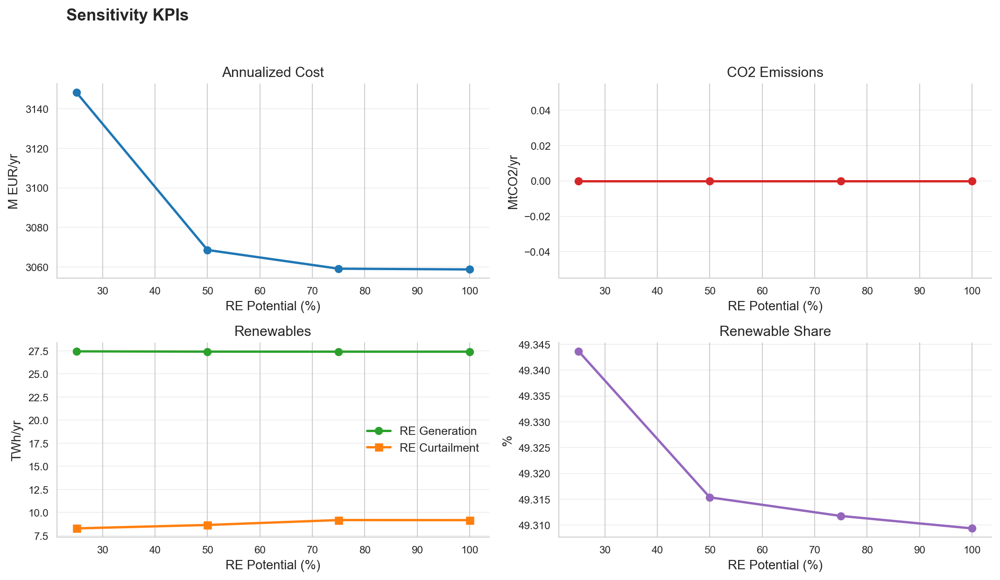

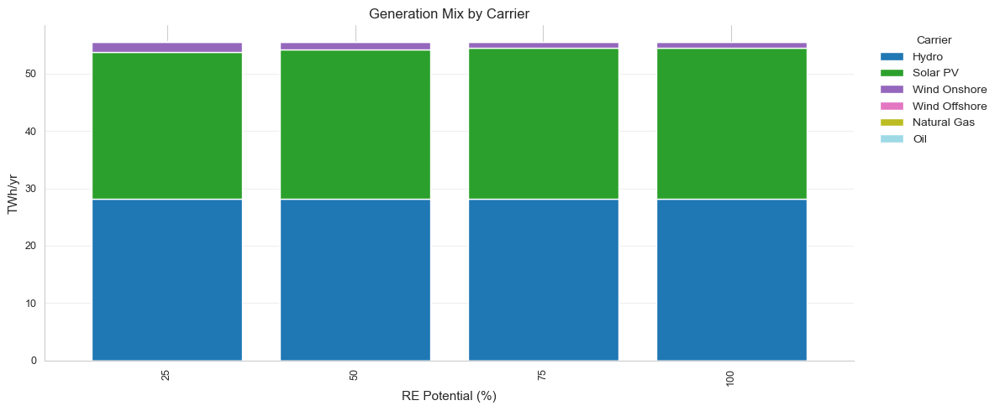

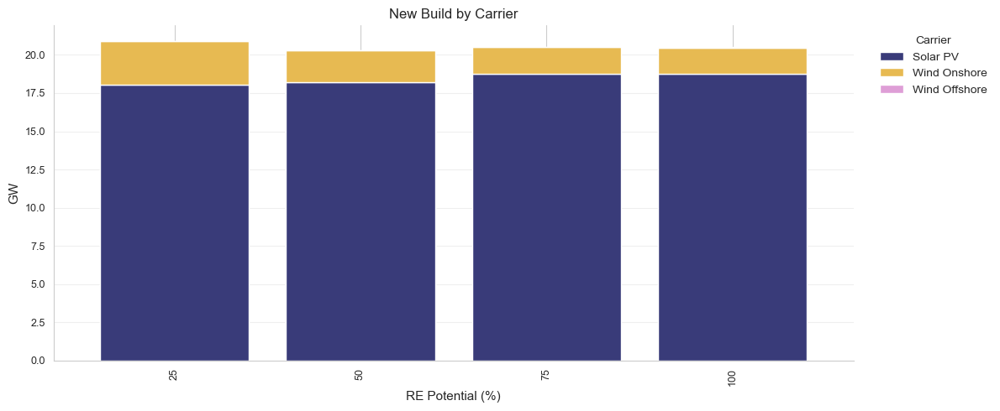

In [51]:
# Visualize extracted sensitivity results
# Expects: sensitivity_summary, sensitivity_generation, sensitivity_build

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "sensitivity_summary" not in globals():
    raise RuntimeError("Missing `sensitivity_summary`. Run extraction cell first.")
if "sensitivity_generation" not in globals():
    raise RuntimeError("Missing `sensitivity_generation`. Run extraction cell first.")
if "sensitivity_build" not in globals():
    sensitivity_build = pd.DataFrame(columns=["sensitivity_key","re_potential_pct","carrier","new_build_mw"])

summary = sensitivity_summary.copy().sort_values("re_potential_pct")
gen = sensitivity_generation.copy().sort_values(["re_potential_pct", "carrier"])
build = sensitivity_build.copy().sort_values(["re_potential_pct", "carrier"])

# -----------------------------
# 1) KPI lines
# -----------------------------
x = summary["re_potential_pct"].values

fig, axes = plt.subplots(2, 2, figsize=(12, 7), dpi=180)
fig.suptitle("Sensitivity KPIs", x=0.07, ha="left", fontsize=14, fontweight="semibold")

axes[0, 0].plot(x, summary["objective_meur_per_yr"], marker="o", lw=2, color="#1f77b4")
axes[0, 0].set_title("Annualized Cost")
axes[0, 0].set_ylabel("M EUR/yr")

axes[0, 1].plot(x, summary["co2_mt"], marker="o", lw=2, color="#d62728")
axes[0, 1].set_title("CO2 Emissions")
axes[0, 1].set_ylabel("MtCO2/yr")

axes[1, 0].plot(x, summary["renewable_generation_twh"], marker="o", lw=2, color="#2ca02c", label="RE Generation")
axes[1, 0].plot(x, summary["renewable_curtailment_twh"], marker="s", lw=2, color="#ff7f0e", label="RE Curtailment")
axes[1, 0].set_title("Renewables")
axes[1, 0].set_ylabel("TWh/yr")
axes[1, 0].legend(frameon=False)

axes[1, 1].plot(x, summary["renewable_share_pct"], marker="o", lw=2, color="#9467bd")
axes[1, 1].set_title("Renewable Share")
axes[1, 1].set_ylabel("%")

for ax in axes.ravel():
    ax.set_xlabel("RE Potential (%)")
    ax.grid(axis="y", alpha=0.3)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# -----------------------------
# 2) Generation mix stacked bars
# -----------------------------
mix = gen.pivot_table(
    index="re_potential_pct",
    columns="carrier",
    values="generation_twh",
    aggfunc="sum",
    fill_value=0.0
).sort_index()

# keep top carriers by total generation
top_carriers = mix.sum(axis=0).sort_values(ascending=False).head(8).index
mix_plot = mix[top_carriers]

ax = mix_plot.plot(kind="bar", stacked=True, figsize=(12, 5), width=0.8, colormap="tab20")
ax.set_title("Generation Mix by Carrier")
ax.set_xlabel("RE Potential (%)")
ax.set_ylabel("TWh/yr")
ax.grid(axis="y", alpha=0.3)
ax.legend(title="Carrier", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.tight_layout()
plt.show()

# -----------------------------
# 3) New build stacked bars (generator MW)
# -----------------------------
if len(build) > 0:
    b = build.pivot_table(
        index="re_potential_pct",
        columns="carrier",
        values="new_build_mw",
        aggfunc="sum",
        fill_value=0.0
    ).sort_index()

    keep = b.sum(axis=0)
    keep = keep[keep > 1e-3].sort_values(ascending=False).index

    if len(keep) > 0:
        ax = (b[keep] / 1000.0).plot(kind="bar", stacked=True, figsize=(12, 5), width=0.8, colormap="tab20b")
        ax.set_title("New Build by Carrier")
        ax.set_xlabel("RE Potential (%)")
        ax.set_ylabel("GW")
        ax.grid(axis="y", alpha=0.3)
        ax.legend(title="Carrier", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        plt.tight_layout()
        plt.show()
    else:
        print("No positive new-build values to plot.")
else:
    print("No build table entries to plot.")
